<a href="https://colab.research.google.com/github/puyopy/puyopyy.github.io/blob/main/Model_DCGAN_412367872.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import matplotlib.pyplot as plt
import os

# Konfigurasi agar GPU digunakan secara efisien
physical_devices = tf.config.list_physical_devices('GPU')
if len(physical_devices) > 0:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
    print("GPU Terdeteksi: ", physical_devices[0])
else:
    print("Peringatan: GPU tidak terdeteksi. Training akan lambat.")

GPU Terdeteksi:  PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
# Create the .kaggle directory if it doesn't exist
!mkdir -p ~/.kaggle

# Move the kaggle.json file to the .kaggle directory
# IMPORTANT: Make sure you have uploaded kaggle.json to your Colab session's /content/ directory first.
# If you uploaded it somewhere else, adjust the source path accordingly.
!mv /content/kaggle.json ~/.kaggle/

# Set read-only permissions for the kaggle.json file for security
!chmod 600 ~/.kaggle/kaggle.json

print("Kaggle API credentials set up successfully!")

Kaggle API credentials set up successfully!


In [4]:
# Install kaggle if not already installed
!pip install -q kaggle

# Make sure your Kaggle API credentials (kaggle.json) are set up in ~/.kaggle/
# If you haven't done this, please refer to the previous instructions.

# Download the dataset
!kaggle datasets download -d joosthazelzet/lego-brick-images

# Unzip the downloaded dataset to the specified directory
# The zip file will be downloaded to the current working directory (/content/)
!unzip -q /content/lego-brick-images.zip -d /content/dataset/

# Clean up the zip file after extraction
!rm /content/lego-brick-images.zip

print("Dataset downloaded and extracted to /content/dataset/")

Dataset URL: https://www.kaggle.com/datasets/joosthazelzet/lego-brick-images
License(s): GPL-2.0
100% 1.00G/1.00G [00:07<00:00, 134MB/s]
100% 1.00G/1.00G [00:07<00:00, 145MB/s]
Dataset downloaded and extracted to /content/dataset/


In [5]:
# Parameter Konfigurasi
BATCH_SIZE = 64
IMG_HEIGHT = 64  # Menggunakan 64x64 agar detail LEGO cukup terlihat
IMG_WIDTH = 64
CHANNELS = 3     # RGB


# --- OPSI B: Membuat Dataset Loader ---
# Ganti 'path/to/images' dengan path folder dataset Anda
dataset_dir = '/content/dataset/LEGO brick images v1'

# Jika folder kosong/tidak ada, kita buat dummy data agar kode tetap jalan (untuk testing)
if not os.path.exists(dataset_dir) or not os.listdir(dataset_dir):
    print("Dataset tidak ditemukan. Membuat data dummy untuk demonstrasi struktur kode.")
    os.makedirs(dataset_dir, exist_ok=True)
    # Membuat 100 gambar random noise sebagai placeholder
    for i in range(100):
        img = np.random.randint(0, 255, (64, 64, 3), dtype=np.uint8)
        tf.keras.utils.save_img(f"{dataset_dir}/dummy_{i}.png", img)

# Memuat dataset
train_dataset = tf.keras.utils.image_dataset_from_directory(
    dataset_dir,
    label_mode=None, # Kita tidak butuh label untuk GAN
    image_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE
)

# Normalisasi ke [-1, 1]
train_dataset = train_dataset.map(lambda x: (x - 127.5) / 127.5)

# Optimasi performa (Caching & Prefetching)
train_dataset = train_dataset.cache().shuffle(1000).prefetch(buffer_size=tf.data.AUTOTUNE)

Found 6479 files.


In [6]:
latent_dim = 128

def build_generator():
    model = keras.Sequential(name="generator")

    # Input: Latent Vector
    # Mulai dengan dense layer yang cukup besar untuk di-reshape
    # Kita ingin mulai dari ukuran 8x8 dengan 512 filter
    model.add(layers.Dense(8 * 8 * 512, use_bias=False, input_shape=(latent_dim,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Reshape menjadi tensor 3D
    model.add(layers.Reshape((8, 8, 512)))

    # Upsampling 1: 8x8 -> 16x16
    model.add(layers.Conv2DTranspose(256, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 2: 16x16 -> 32x32
    model.add(layers.Conv2DTranspose(128, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Upsampling 3: 32x32 -> 64x64
    model.add(layers.Conv2DTranspose(64, (4, 4), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU(alpha=0.2))

    # Output Layer: 64x64 -> 64x64x3 (RGB)
    # Aktivasi TANH penting agar output di range [-1, 1]
    model.add(layers.Conv2D(CHANNELS, (3, 3), padding='same', activation='tanh'))

    return model

def build_discriminator():
    model = keras.Sequential(name="discriminator")

    # Input: Gambar 64x64x3
    # Downsampling 1: 64 -> 32
    model.add(layers.Conv2D(64, (4, 4), strides=(2, 2), padding='same', input_shape=(IMG_HEIGHT, IMG_WIDTH, CHANNELS)))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 2: 32 -> 16
    model.add(layers.Conv2D(128, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Downsampling 3: 16 -> 8
    model.add(layers.Conv2D(256, (4, 4), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU(alpha=0.2))
    model.add(layers.Dropout(0.3))

    # Flatten dan Output
    model.add(layers.Flatten())
    model.add(layers.Dense(1)) # Output berupa logit (skor real/fake)

    return model

# Inisialisasi Model
generator = build_generator()
discriminator = build_discriminator()

generator.summary()
# discriminator.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/core/dense.py:93: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)
/usr/local/lib/python3.12/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "generator"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense (Dense)                   │ (None, 32768)          │     4,194,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 32768)          │       131,072 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 32768)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ reshape (Reshape)               │ (None, 8, 8, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose                │ (None, 16, 16, 256)    │     2,097,152 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 16, 16, 256)    │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 16, 16, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_1              │ (None, 32, 32, 128)    │       524,288 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_2 (LeakyReLU)       │ (None, 32, 32, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_transpose_2              │ (None, 64, 64, 64)     │       131,072 │
│ (Conv2DTranspose)               │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 64, 64, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_3 (LeakyReLU)       │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 64, 64, 3)      │         1,731 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,081,411 (27.01 MB)

 Trainable params: 7,014,979 (26.76 MB)

 Non-trainable params: 66,432 (259.50 KB)

In [7]:
class DCGAN(keras.Model):
    def __init__(self, discriminator, generator, latent_dim):
        super(DCGAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
        self.latent_dim = latent_dim

    def compile(self, d_optimizer, g_optimizer, loss_fn):
        super(DCGAN, self).compile()
        self.d_optimizer = d_optimizer
        self.g_optimizer = g_optimizer
        self.loss_fn = loss_fn
        # Metric trackers
        self.d_loss_metric = keras.metrics.Mean(name="d_loss")
        self.g_loss_metric = keras.metrics.Mean(name="g_loss")

    @property
    def metrics(self):
        return [self.d_loss_metric, self.g_loss_metric]

    def train_step(self, real_images):
        # 1. Sample random points in the latent space
        batch_size = tf.shape(real_images)[0]
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 2. Decode them to fake images
        generated_images = self.generator(random_latent_vectors)

        # 3. Combine them with real images
        combined_images = tf.concat([generated_images, real_images], axis=0)

        # 4. Assemble labels discriminating real from fake images
        # Label 1 untuk fake, 0 untuk real (atau sebaliknya, teknik ini menggunakan label smoothing)
        # Di sini kita pakai standar: 1=Real, 0=Fake.
        # Namun, karena kita concat [Fake, Real], maka labelnya: [0...0, 1...1]
        labels = tf.concat(
            [tf.zeros((batch_size, 1)), tf.ones((batch_size, 1))], axis=0
        )

        # Tambahkan sedikit noise pada label (Label Smoothing) untuk stabilitas
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # 5. Train the Discriminator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(combined_images)
            d_loss = self.loss_fn(labels, predictions)

        grads = tape.gradient(d_loss, self.discriminator.trainable_weights)
        self.d_optimizer.apply_gradients(
            zip(grads, self.discriminator.trainable_weights)
        )

        # 6. Sample random points in the latent space (lagi, untuk Generator)
        random_latent_vectors = tf.random.normal(shape=(batch_size, self.latent_dim))

        # 7. Assemble labels that say "all real images" (We want to fool the discriminator)
        misleading_labels = tf.ones((batch_size, 1))

        # 8. Train the Generator
        with tf.GradientTape() as tape:
            predictions = self.discriminator(self.generator(random_latent_vectors))
            g_loss = self.loss_fn(misleading_labels, predictions)

        grads = tape.gradient(g_loss, self.generator.trainable_weights)
        self.g_optimizer.apply_gradients(
            zip(grads, self.generator.trainable_weights)
        )

        # Update metrics
        self.d_loss_metric.update_state(d_loss)
        self.g_loss_metric.update_state(g_loss)

        return {
            "d_loss": self.d_loss_metric.result(),
            "g_loss": self.g_loss_metric.result(),
        }

In [8]:
class GANMonitor(keras.callbacks.Callback):
    def __init__(self, num_img=3, latent_dim=128):
        self.num_img = num_img
        self.latent_dim = latent_dim

    def on_epoch_end(self, epoch, logs=None):
        random_latent_vectors = tf.random.normal(shape=(self.num_img, self.latent_dim))
        generated_images = self.model.generator(random_latent_vectors)
        generated_images *= 127.5
        generated_images += 127.5
        generated_images.numpy()

        fig = plt.figure(figsize=(10, 4))
        for i in range(self.num_img):
            plt.subplot(1, self.num_img, i+1)
            img = keras.utils.array_to_img(generated_images[i])
            plt.imshow(img)
            plt.axis('off')

        plt.suptitle(f"Epoch {epoch+1}")
        plt.show() # Tampilkan inline di Colab

        # Opsional: Simpan ke file
        # plt.savefig(f"generated_lego_epoch_{epoch}.png")
        # plt.close()

Mulai Training...
Epoch 1/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step - d_loss: 0.4867 - g_loss: 0.7361

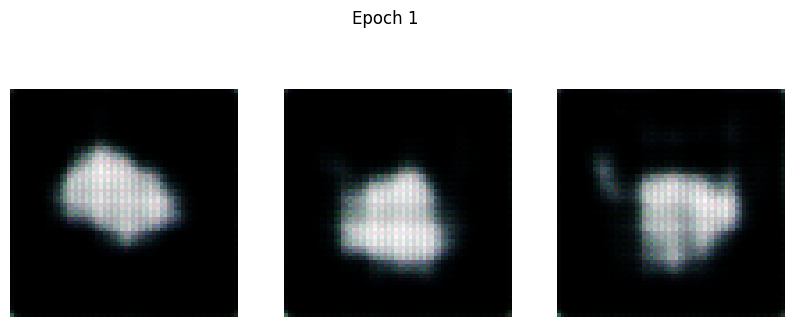

102/102 ━━━━━━━━━━━━━━━━━━━━ 43s 176ms/step - d_loss: 0.4873 - g_loss: 0.7364
Epoch 2/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step - d_loss: 0.6663 - g_loss: 0.7237

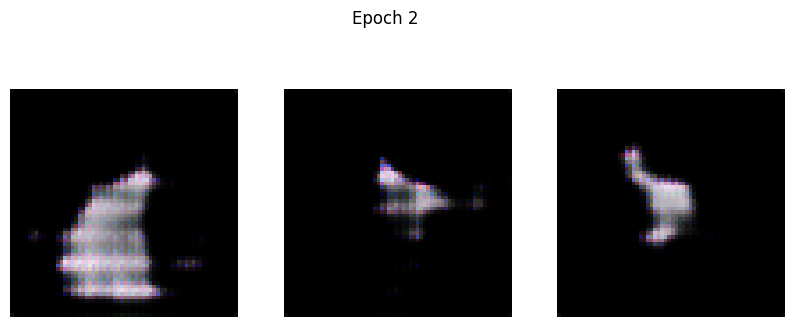

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 113ms/step - d_loss: 0.6664 - g_loss: 0.7237
Epoch 3/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step - d_loss: 0.6666 - g_loss: 0.7600

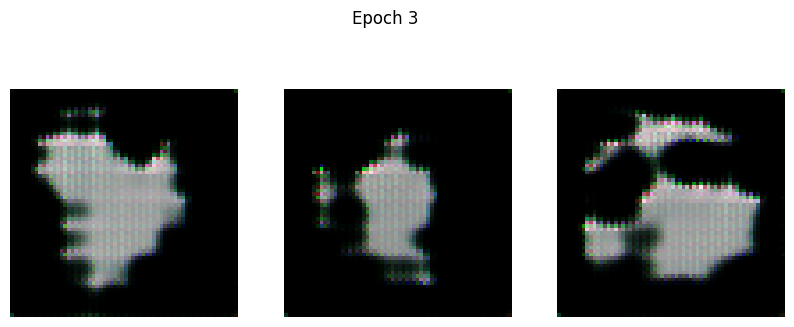

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 115ms/step - d_loss: 0.6666 - g_loss: 0.7599
Epoch 4/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 116ms/step - d_loss: 0.6618 - g_loss: 0.7666

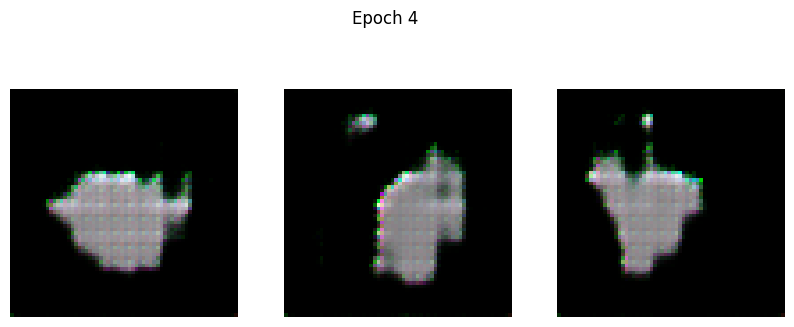

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 117ms/step - d_loss: 0.6617 - g_loss: 0.7666
Epoch 5/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 0.6724 - g_loss: 0.7657

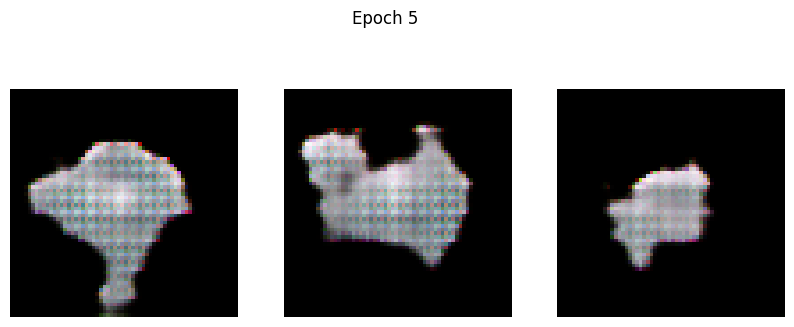

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 0.6723 - g_loss: 0.7656
Epoch 6/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 0.6595 - g_loss: 0.7826

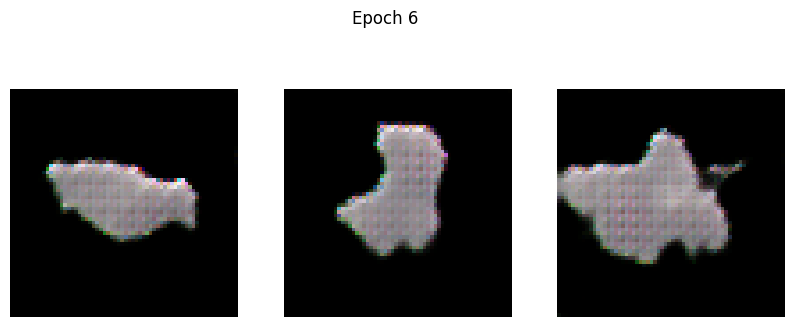

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.6595 - g_loss: 0.7824
Epoch 7/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6638 - g_loss: 0.7599

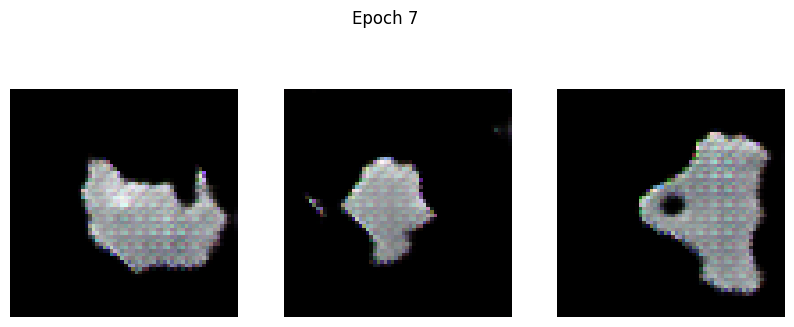

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6637 - g_loss: 0.7598
Epoch 8/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6475 - g_loss: 0.7615

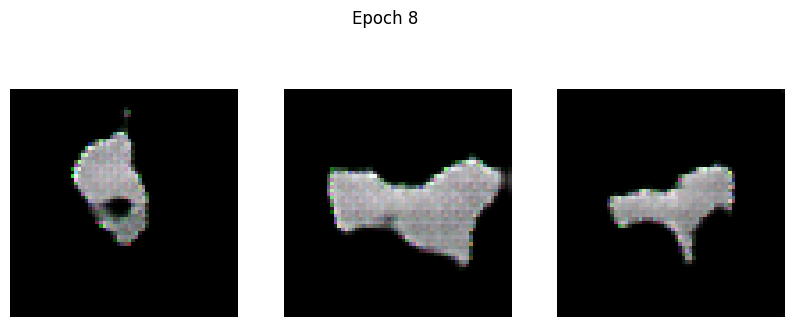

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6476 - g_loss: 0.7615
Epoch 9/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6542 - g_loss: 0.7346

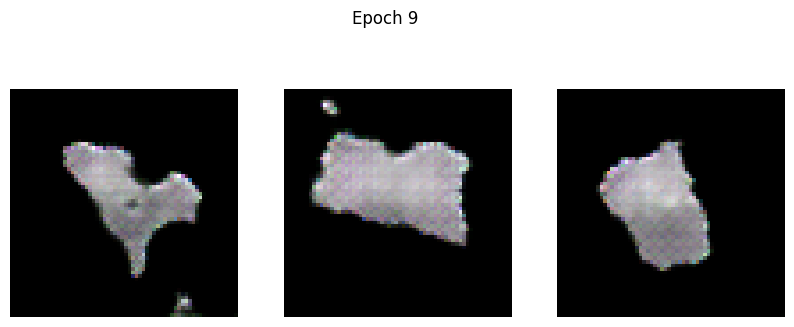

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6542 - g_loss: 0.7346
Epoch 10/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6562 - g_loss: 0.7383

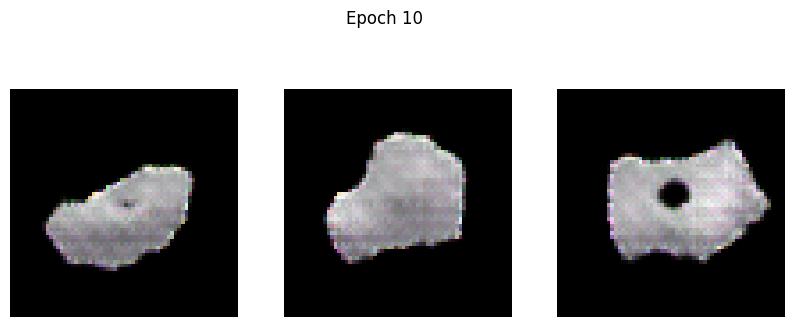

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6562 - g_loss: 0.7384
Epoch 11/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6478 - g_loss: 0.7644

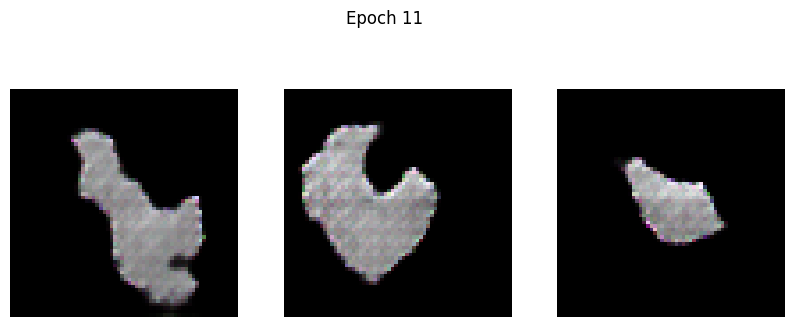

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6478 - g_loss: 0.7644
Epoch 12/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6520 - g_loss: 0.7828

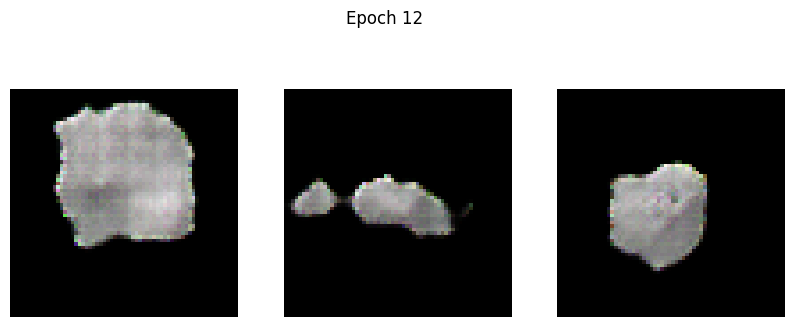

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6520 - g_loss: 0.7828
Epoch 13/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.6403 - g_loss: 0.7934

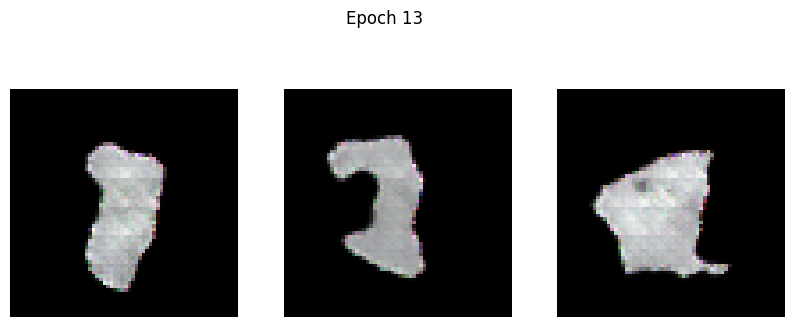

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6402 - g_loss: 0.7935
Epoch 14/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6433 - g_loss: 0.8392

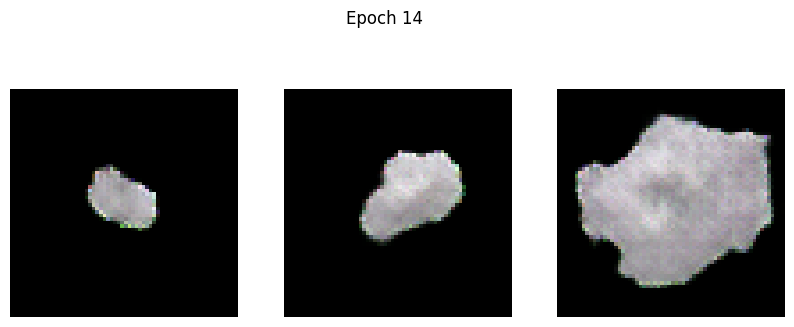

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6431 - g_loss: 0.8391
Epoch 15/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6248 - g_loss: 0.8436

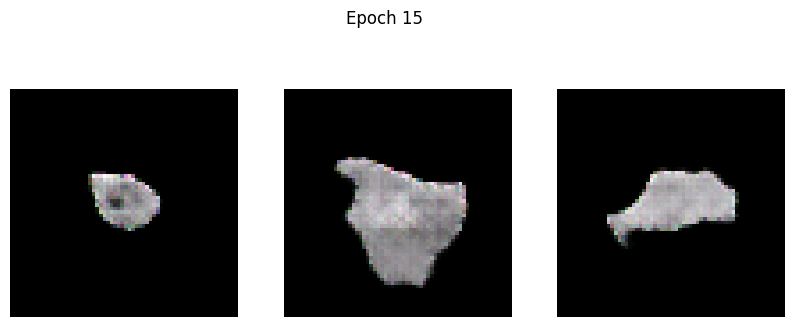

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.6247 - g_loss: 0.8438
Epoch 16/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.6076 - g_loss: 0.8797

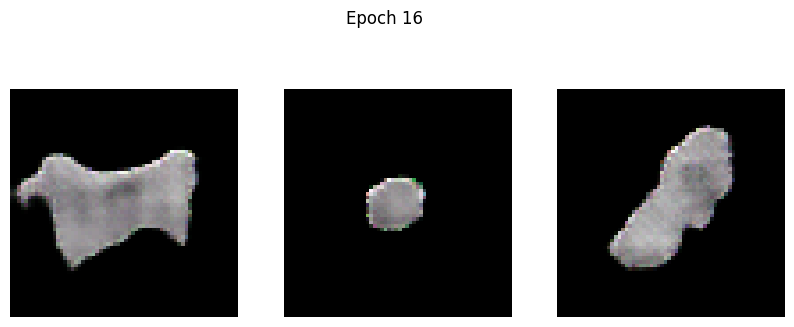

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.6075 - g_loss: 0.8798
Epoch 17/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.5966 - g_loss: 0.9056

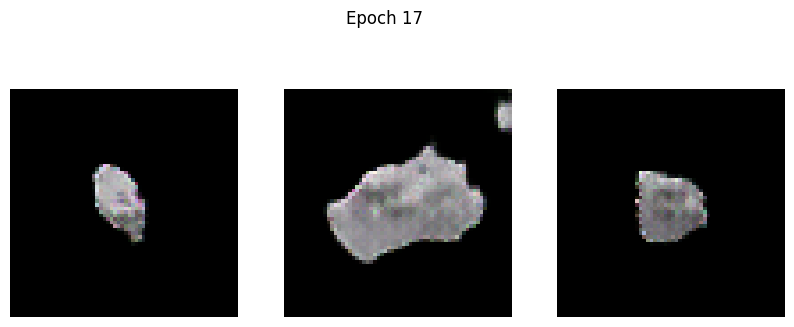

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5966 - g_loss: 0.9057
Epoch 18/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5895 - g_loss: 0.9170

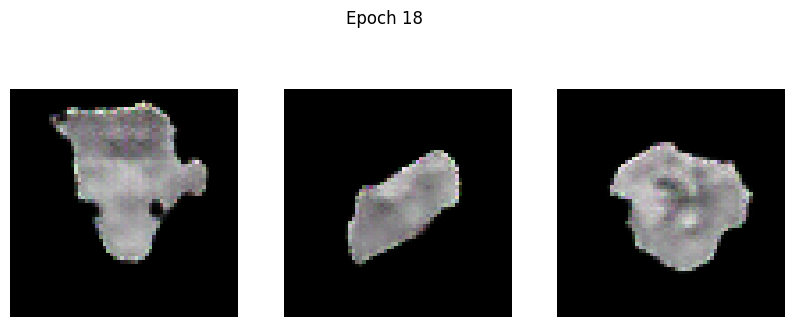

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5895 - g_loss: 0.9170
Epoch 19/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5753 - g_loss: 0.9372

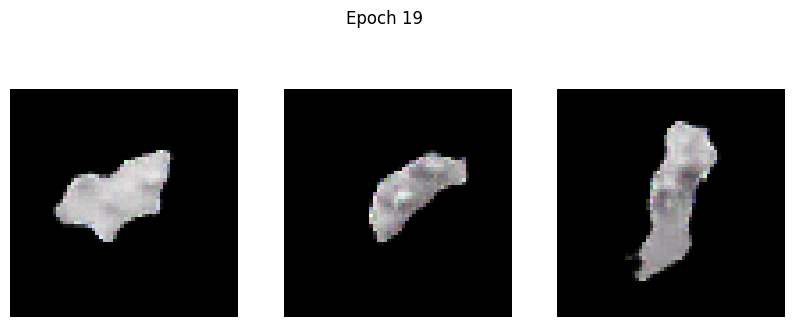

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5753 - g_loss: 0.9372
Epoch 20/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5678 - g_loss: 0.9603

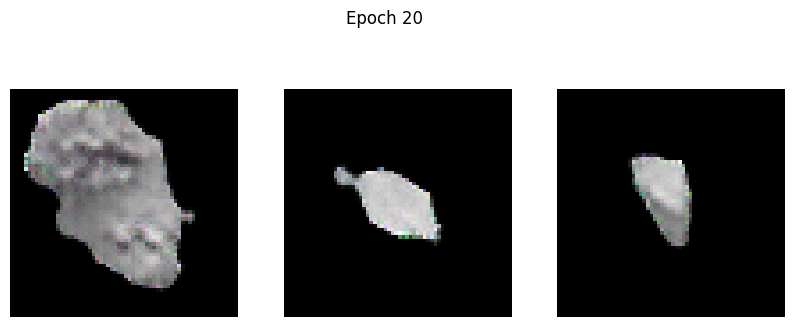

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5678 - g_loss: 0.9603
Epoch 21/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5616 - g_loss: 0.9755

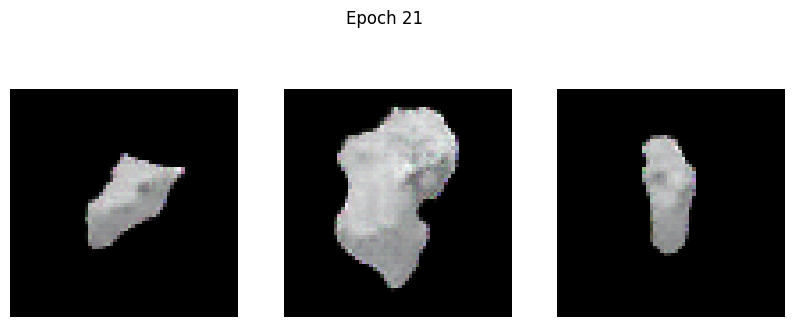

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5615 - g_loss: 0.9756
Epoch 22/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5544 - g_loss: 0.9753

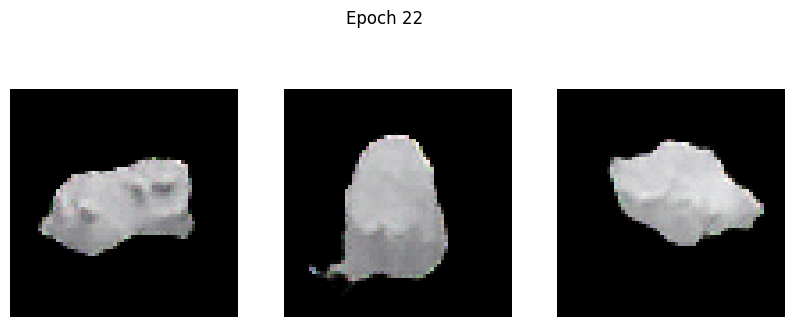

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5544 - g_loss: 0.9754
Epoch 23/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5458 - g_loss: 1.0311

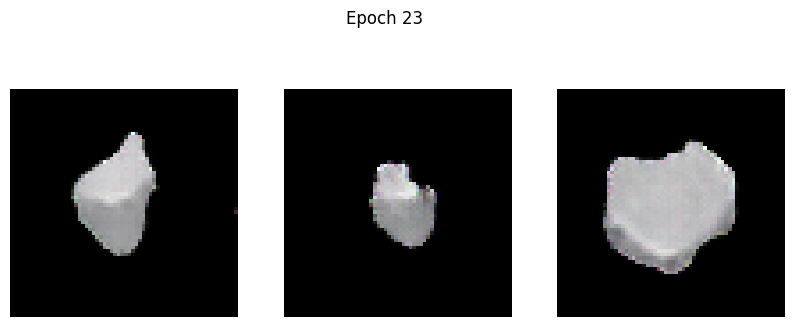

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5457 - g_loss: 1.0309
Epoch 24/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5480 - g_loss: 1.0761

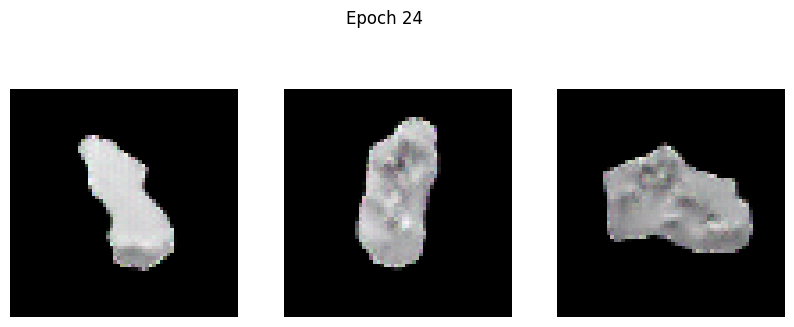

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5479 - g_loss: 1.0758
Epoch 25/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5146 - g_loss: 1.0518

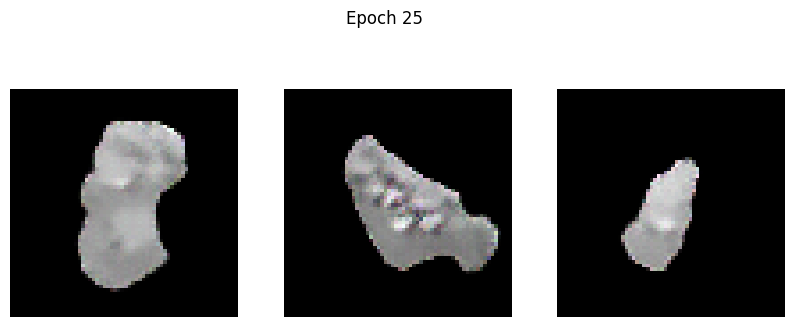

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5147 - g_loss: 1.0519
Epoch 26/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5036 - g_loss: 1.0825

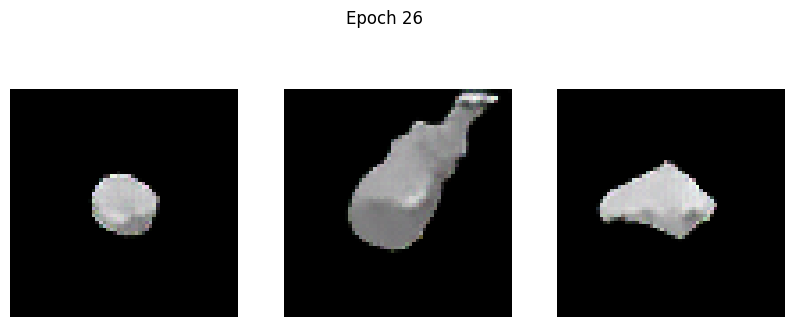

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5037 - g_loss: 1.0827
Epoch 27/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4953 - g_loss: 1.0693

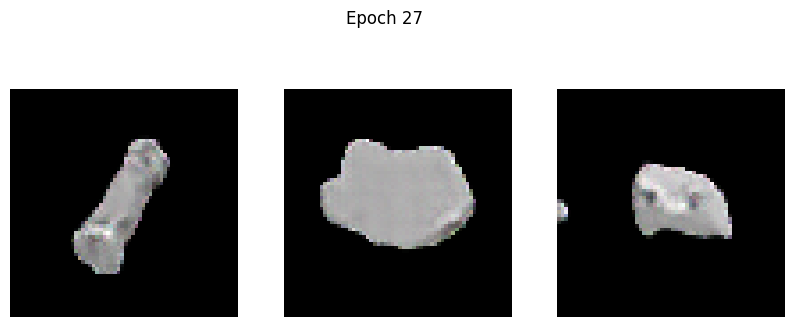

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.4952 - g_loss: 1.0696
Epoch 28/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4967 - g_loss: 1.1570

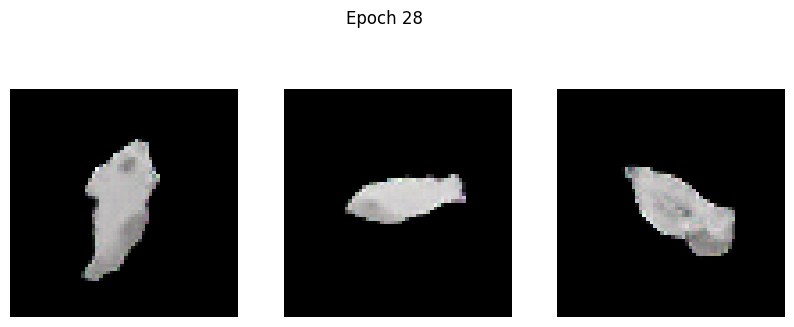

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4965 - g_loss: 1.1569
Epoch 29/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4933 - g_loss: 1.2092

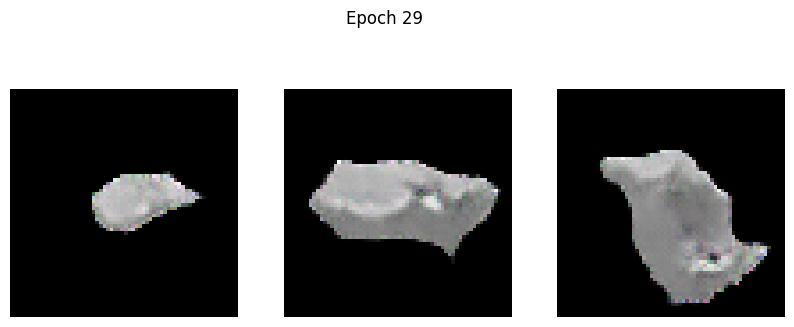

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4933 - g_loss: 1.2090
Epoch 30/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4667 - g_loss: 1.2185

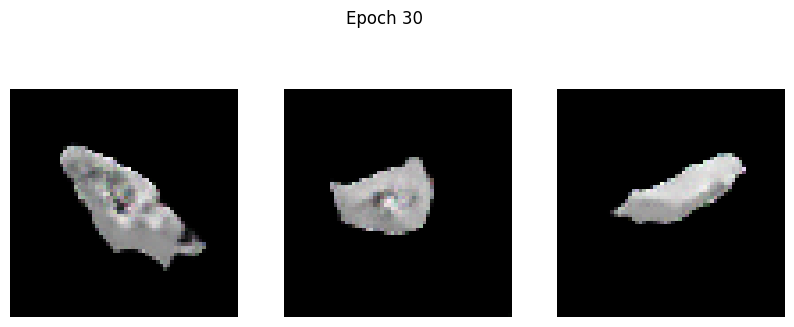

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4667 - g_loss: 1.2187
Epoch 31/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4688 - g_loss: 1.2561

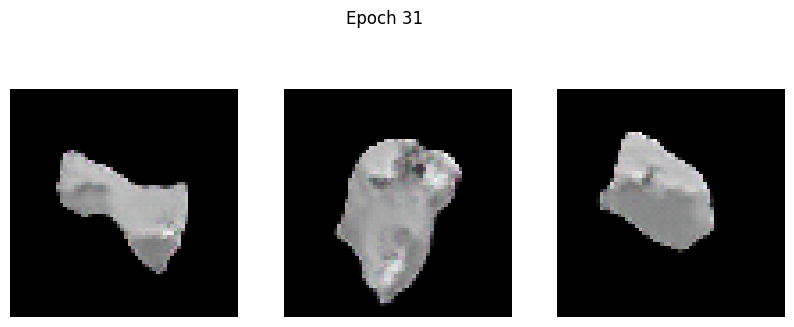

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4687 - g_loss: 1.2562
Epoch 32/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4434 - g_loss: 1.2928

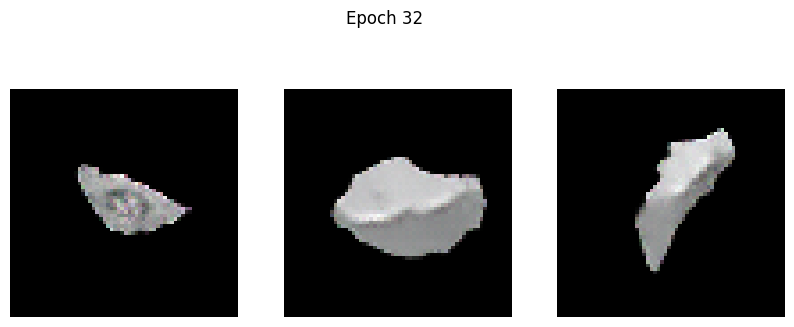

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4435 - g_loss: 1.2928
Epoch 33/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4467 - g_loss: 1.3059

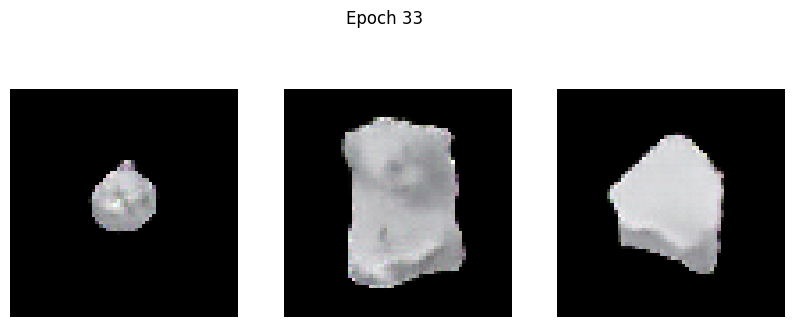

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4467 - g_loss: 1.3060
Epoch 34/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4233 - g_loss: 1.3001

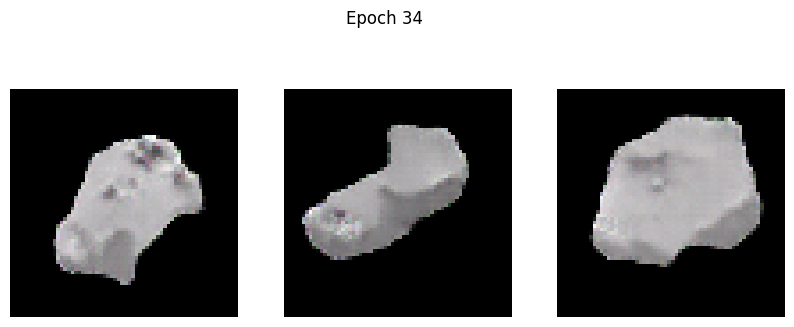

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4233 - g_loss: 1.3002
Epoch 35/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4211 - g_loss: 1.3512

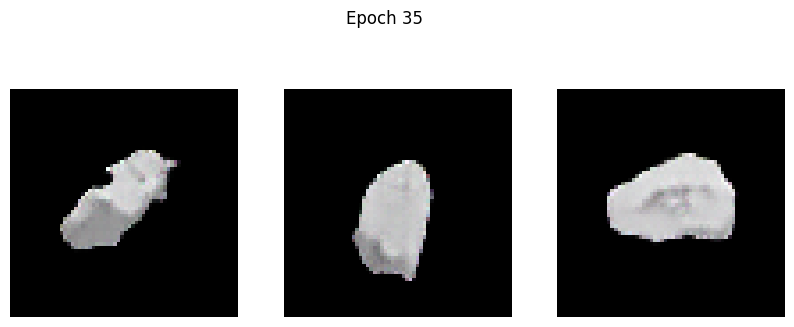

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4211 - g_loss: 1.3515
Epoch 36/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4221 - g_loss: 1.4096

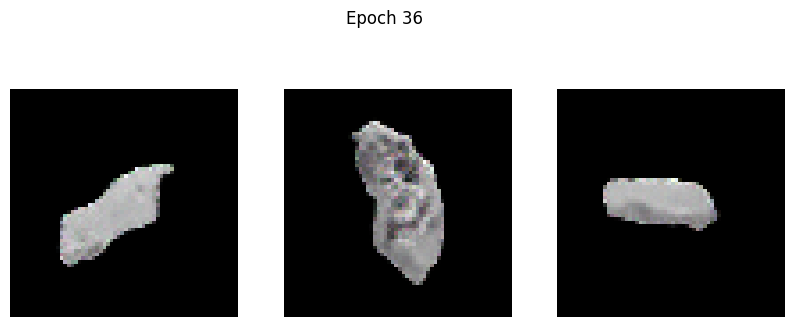

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4221 - g_loss: 1.4098
Epoch 37/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4041 - g_loss: 1.4360

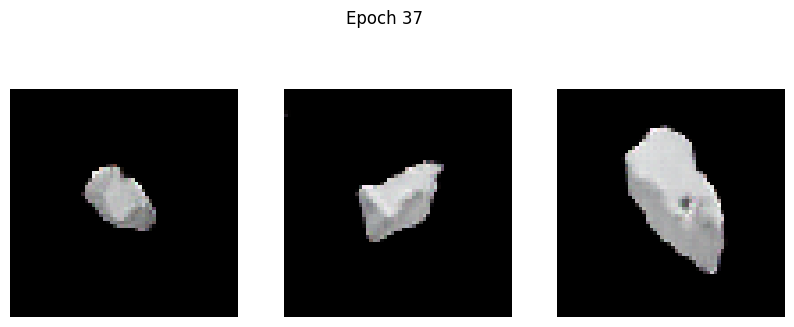

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4041 - g_loss: 1.4360
Epoch 38/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3975 - g_loss: 1.4496

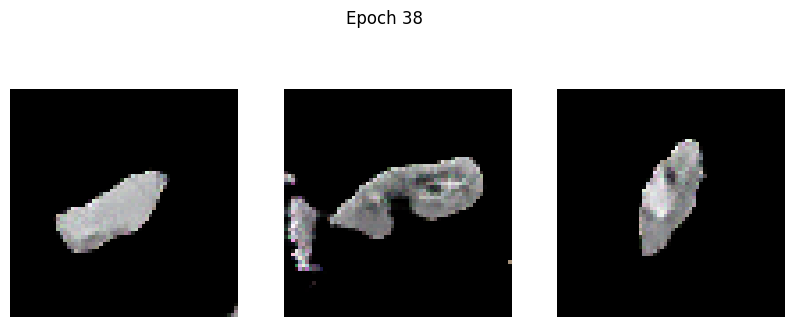

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3975 - g_loss: 1.4498
Epoch 39/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4140 - g_loss: 1.5206

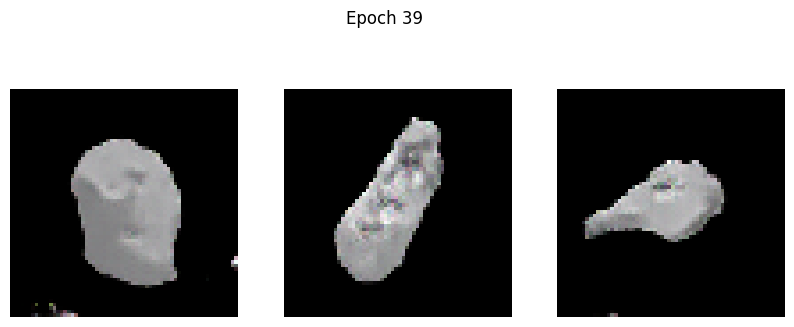

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4138 - g_loss: 1.5204
Epoch 40/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3926 - g_loss: 1.5522

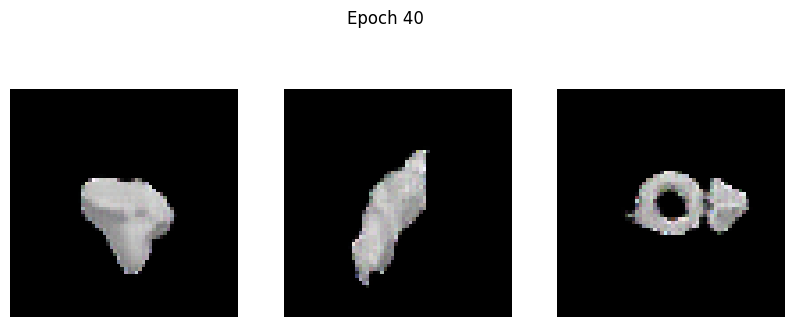

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3935 - g_loss: 1.5523
Epoch 41/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.4049 - g_loss: 1.3475

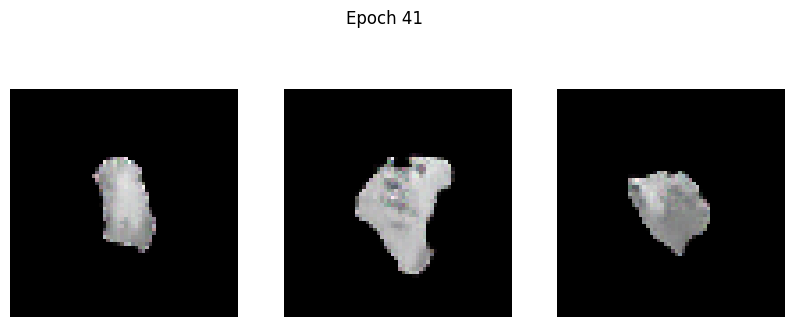

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4048 - g_loss: 1.3479
Epoch 42/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3590 - g_loss: 1.4698

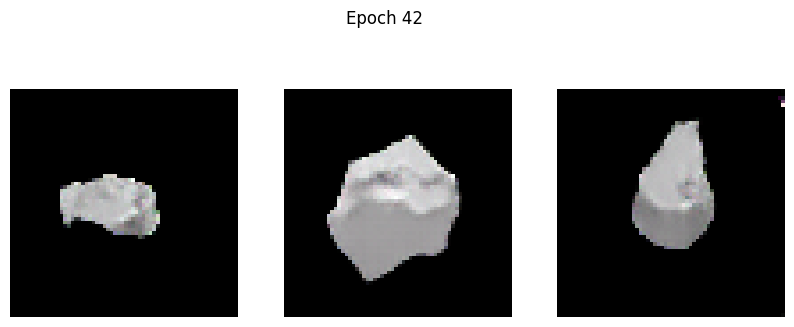

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3591 - g_loss: 1.4700
Epoch 43/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3650 - g_loss: 1.5471

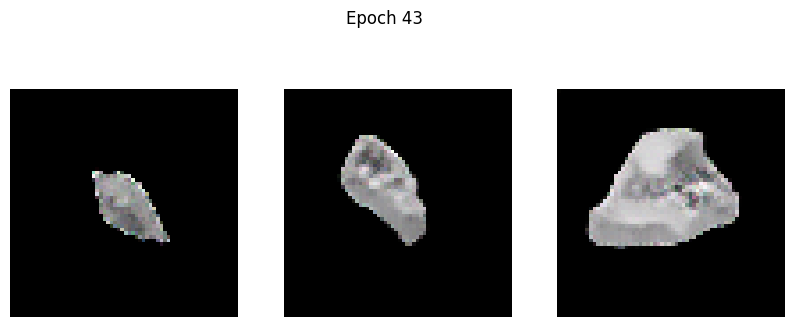

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3650 - g_loss: 1.5472
Epoch 44/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3590 - g_loss: 1.5989

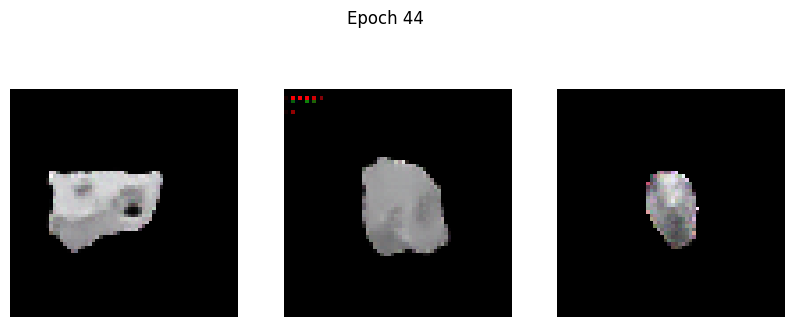

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3591 - g_loss: 1.5988
Epoch 45/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3746 - g_loss: 1.6601

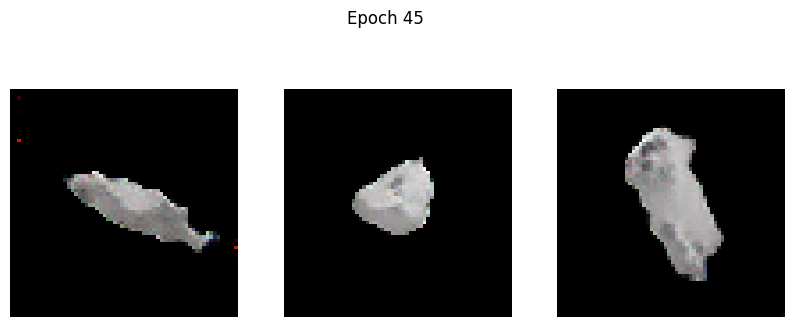

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.3747 - g_loss: 1.6600
Epoch 46/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3603 - g_loss: 1.6450

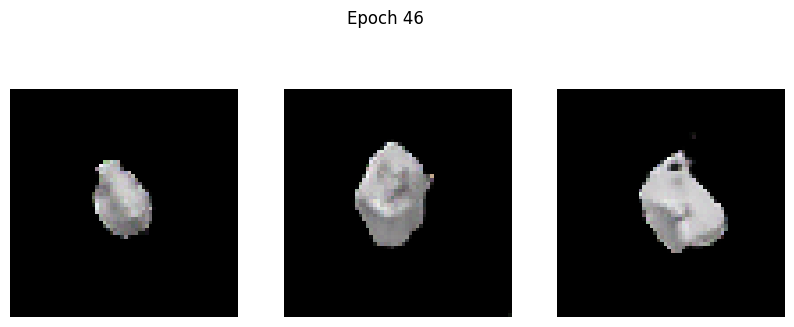

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3602 - g_loss: 1.6449
Epoch 47/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3436 - g_loss: 1.6364

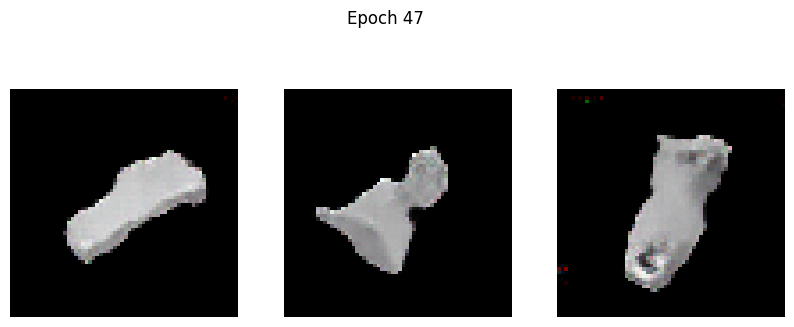

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3437 - g_loss: 1.6365
Epoch 48/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3607 - g_loss: 1.6400

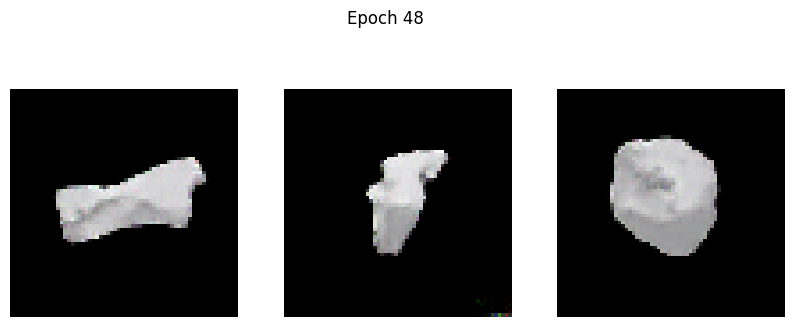

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3606 - g_loss: 1.6403
Epoch 49/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3766 - g_loss: 1.7681

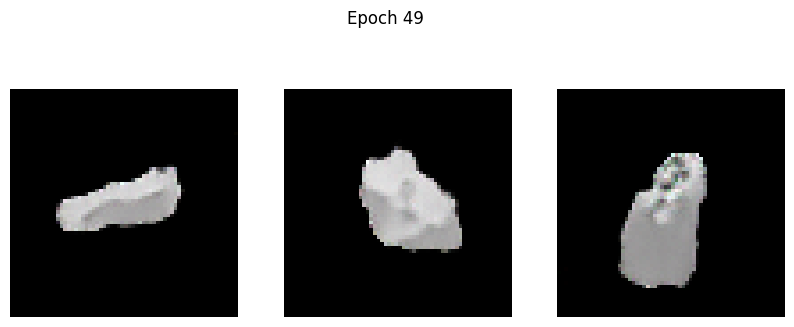

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3767 - g_loss: 1.7685
Epoch 50/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3497 - g_loss: 1.6585

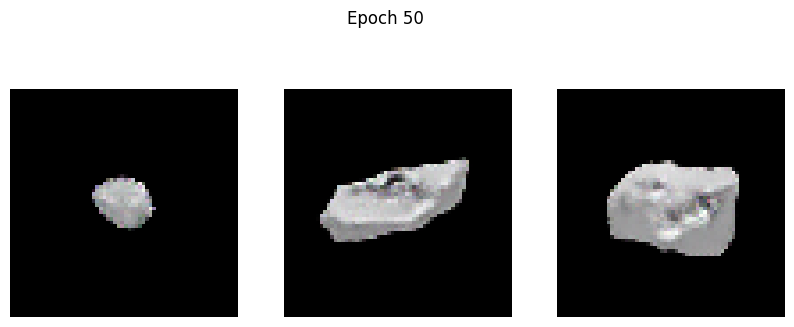

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3498 - g_loss: 1.6588
Epoch 51/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3180 - g_loss: 1.6716

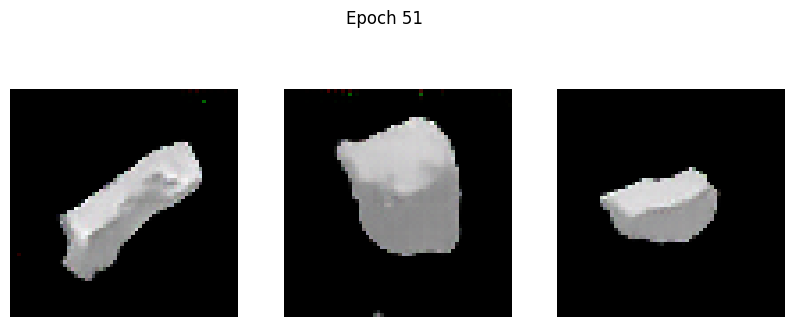

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3180 - g_loss: 1.6717
Epoch 52/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3167 - g_loss: 1.7335

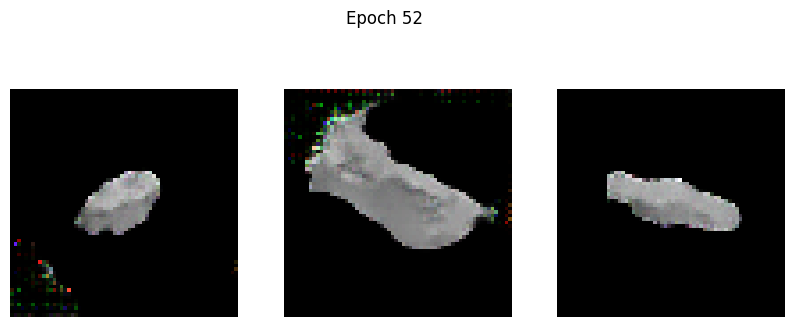

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3168 - g_loss: 1.7336
Epoch 53/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3430 - g_loss: 1.8500

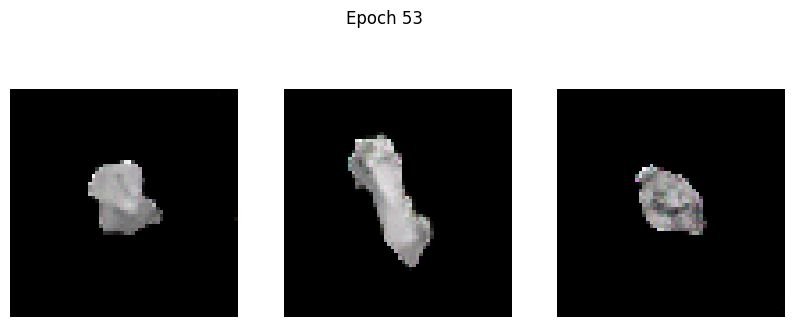

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3430 - g_loss: 1.8499
Epoch 54/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3084 - g_loss: 1.7876

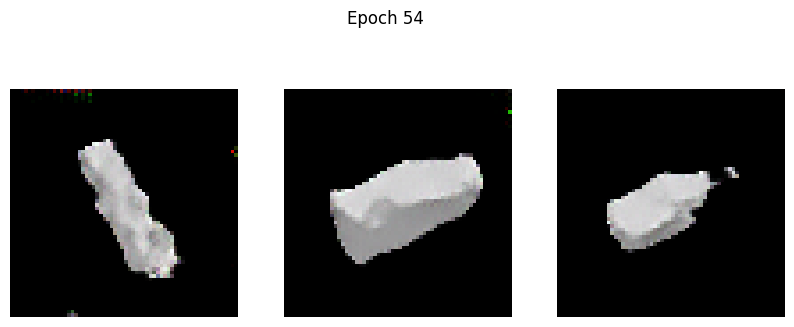

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3084 - g_loss: 1.7876
Epoch 55/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3113 - g_loss: 1.8106

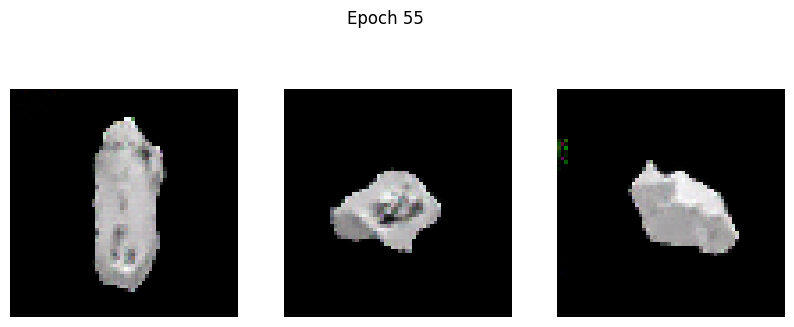

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3114 - g_loss: 1.8109
Epoch 56/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3026 - g_loss: 1.8628

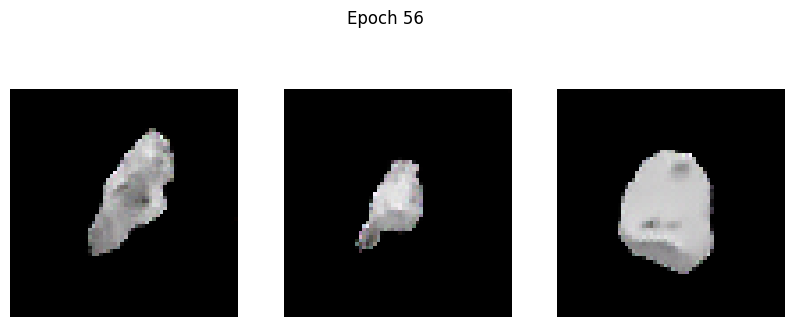

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3031 - g_loss: 1.8637
Epoch 57/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2975 - g_loss: 1.7541

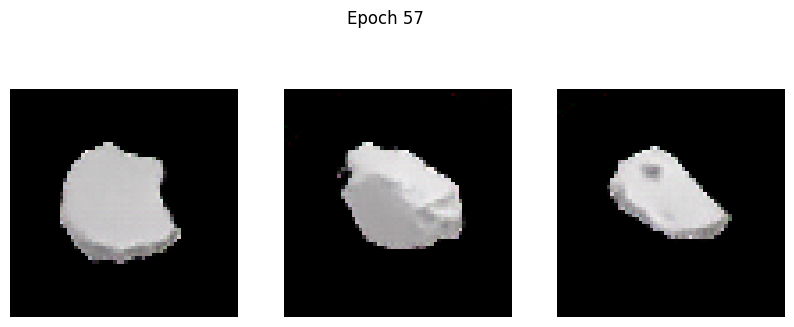

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2977 - g_loss: 1.7545
Epoch 58/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2759 - g_loss: 1.8263

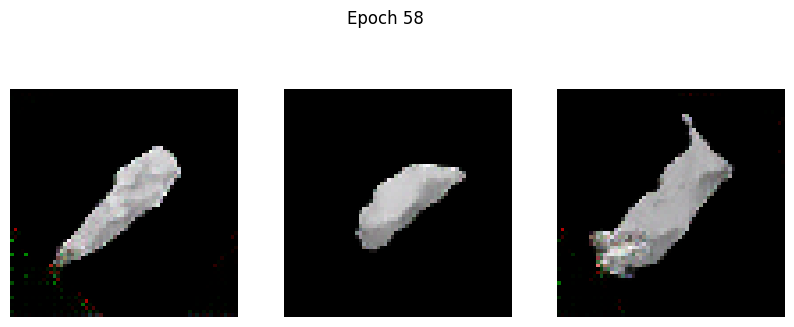

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2761 - g_loss: 1.8265
Epoch 59/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2906 - g_loss: 1.8777

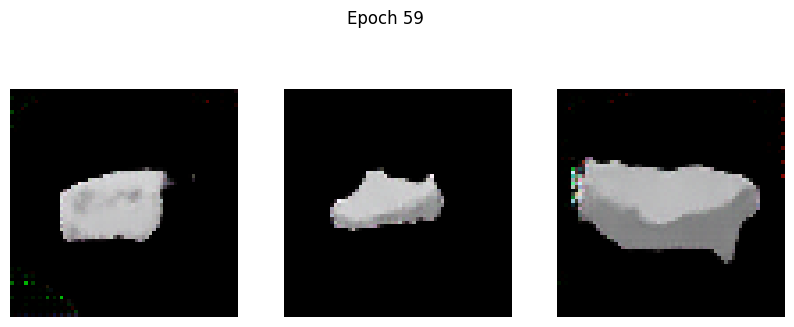

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2906 - g_loss: 1.8778
Epoch 60/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2615 - g_loss: 1.9306

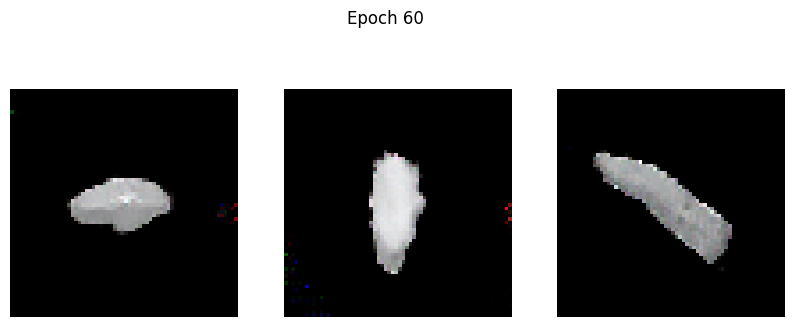

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2616 - g_loss: 1.9307
Epoch 61/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3144 - g_loss: 1.9638

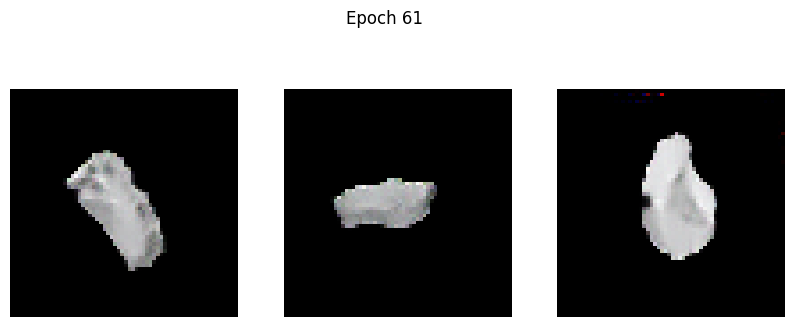

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3143 - g_loss: 1.9637
Epoch 62/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2540 - g_loss: 1.9759

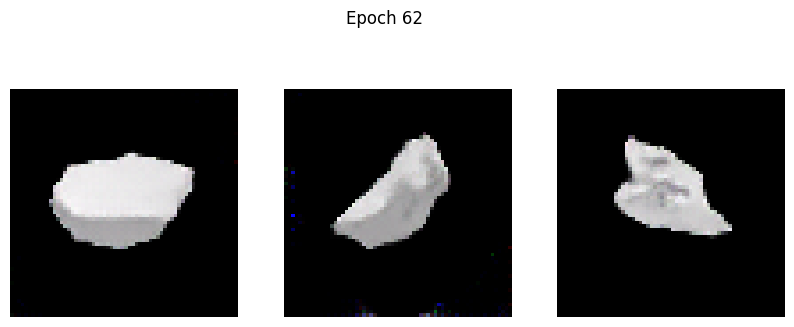

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2542 - g_loss: 1.9760
Epoch 63/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3014 - g_loss: 2.0751

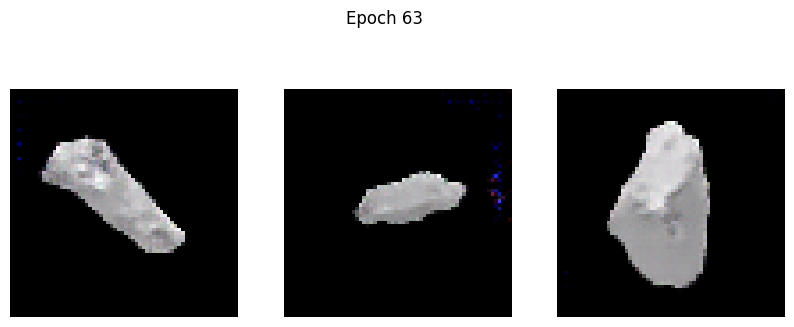

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3016 - g_loss: 2.0756
Epoch 64/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2704 - g_loss: 1.9849

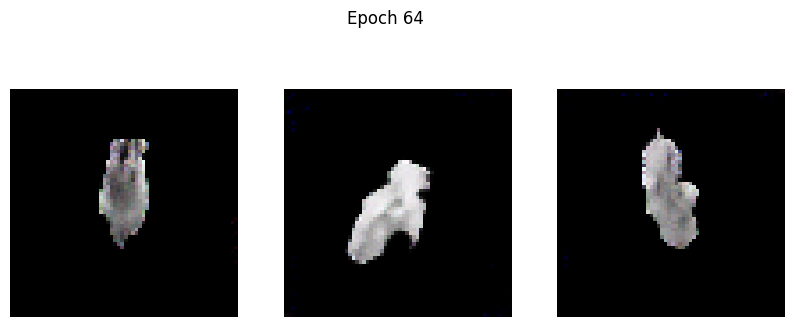

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2703 - g_loss: 1.9847
Epoch 65/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2656 - g_loss: 2.0403

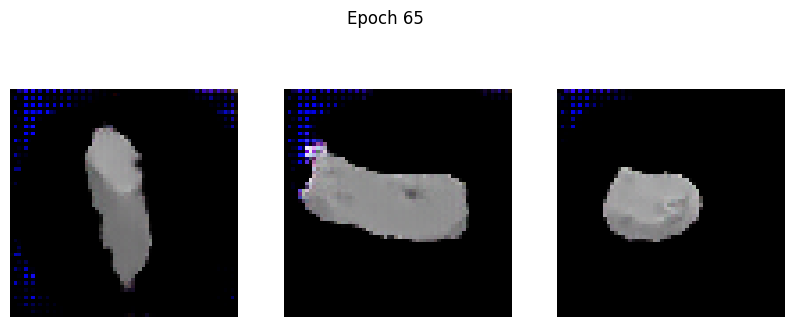

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2660 - g_loss: 2.0408
Epoch 66/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2388 - g_loss: 2.0402

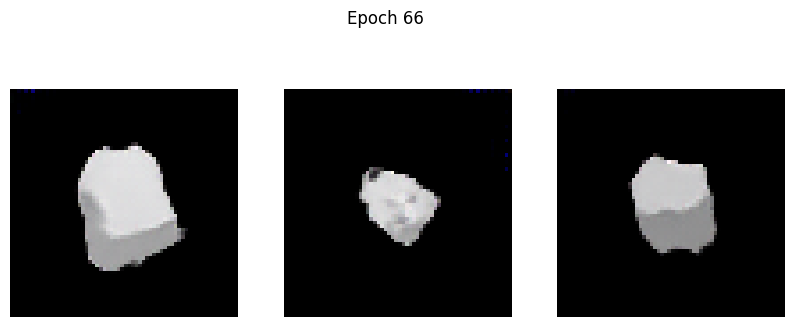

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2388 - g_loss: 2.0400
Epoch 67/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2365 - g_loss: 2.0385

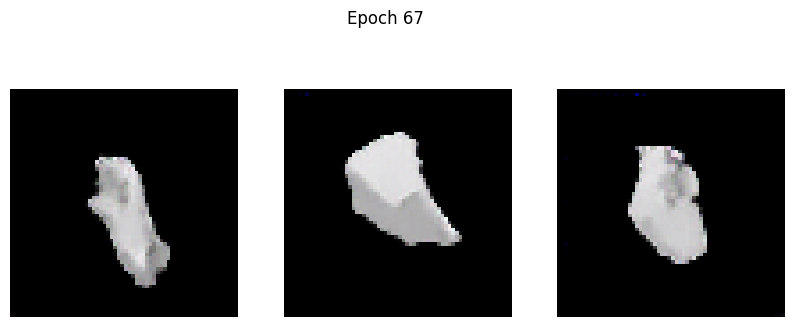

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2367 - g_loss: 2.0389
Epoch 68/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3118 - g_loss: 2.2148

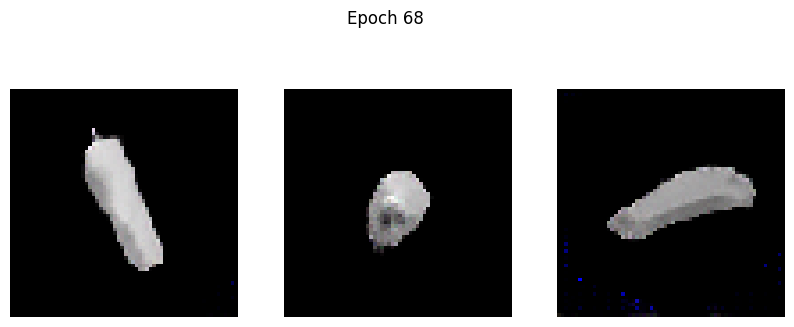

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3117 - g_loss: 2.2142
Epoch 69/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2120 - g_loss: 2.0507

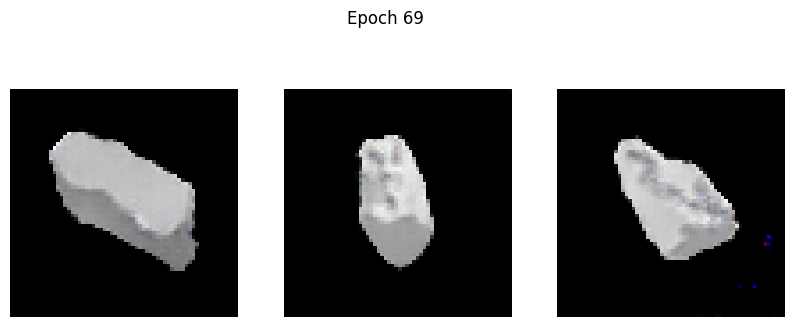

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2121 - g_loss: 2.0511
Epoch 70/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2766 - g_loss: 2.2572

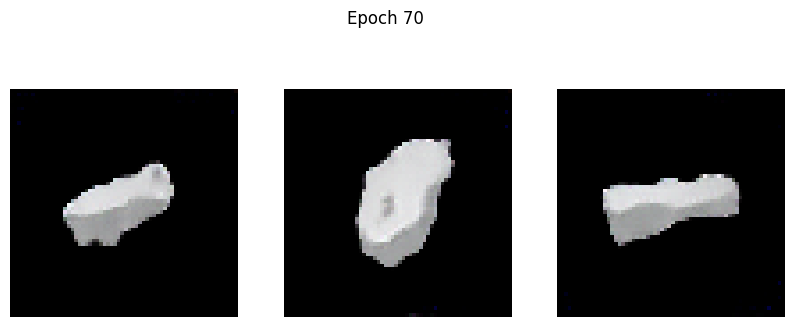

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2764 - g_loss: 2.2562
Epoch 71/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2286 - g_loss: 2.1367

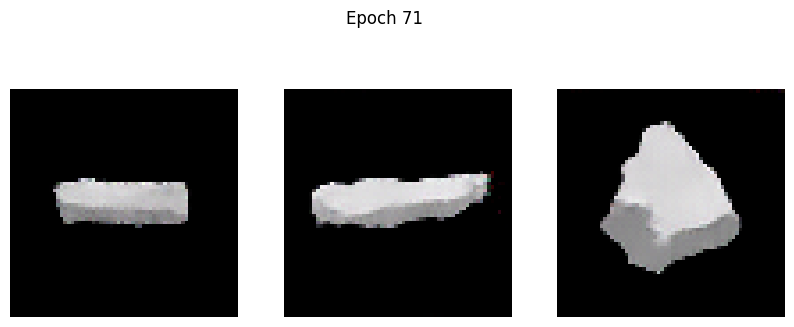

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2287 - g_loss: 2.1376
Epoch 72/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2023 - g_loss: 2.1780

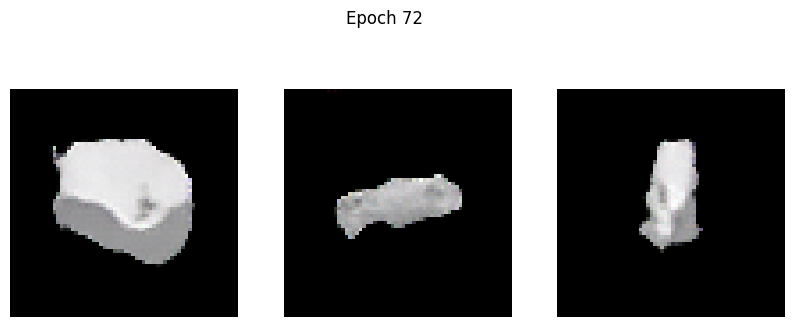

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2026 - g_loss: 2.1782
Epoch 73/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2522 - g_loss: 2.1817

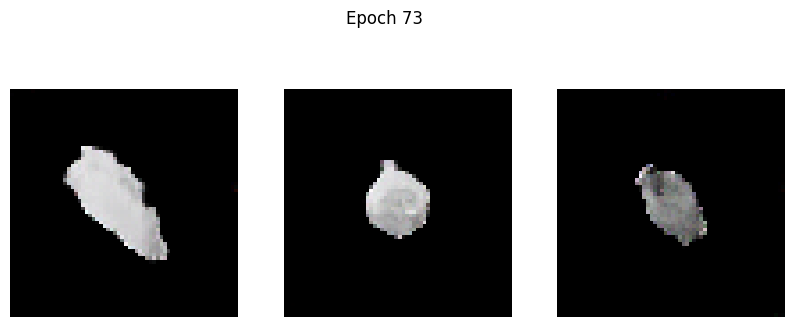

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2524 - g_loss: 2.1822
Epoch 74/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2149 - g_loss: 2.1701

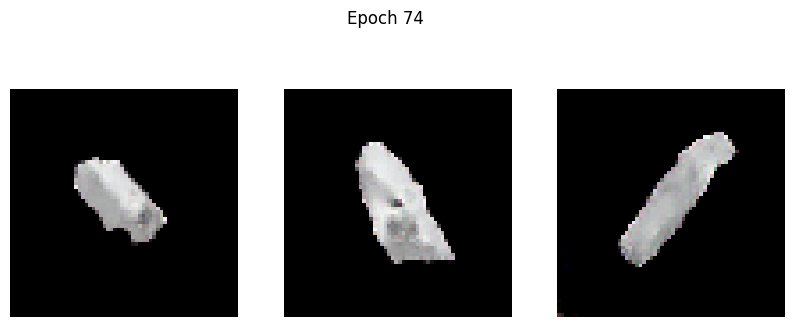

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2150 - g_loss: 2.1705
Epoch 75/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2819 - g_loss: 2.4309

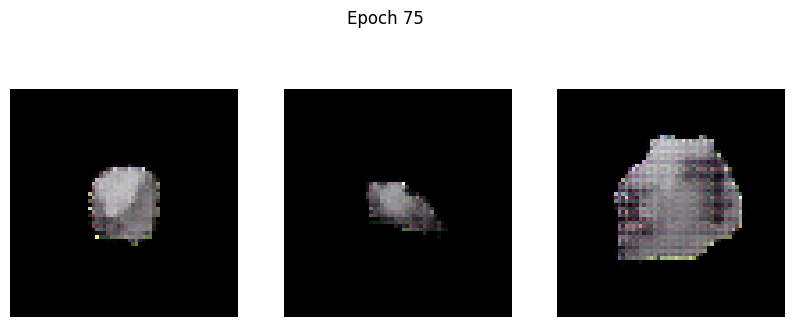

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2858 - g_loss: 2.4394
Epoch 76/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3153 - g_loss: 2.2398

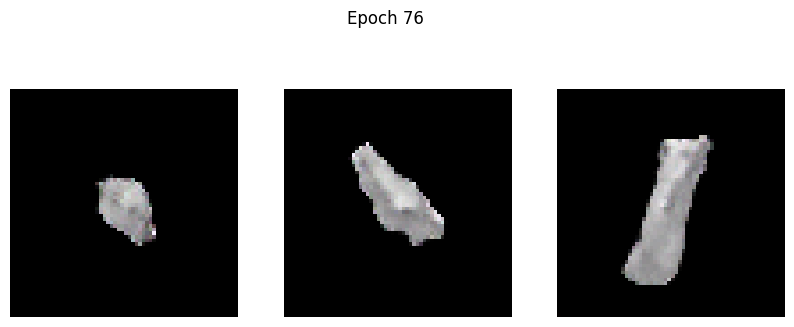

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3150 - g_loss: 2.2377
Epoch 77/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2255 - g_loss: 1.9222

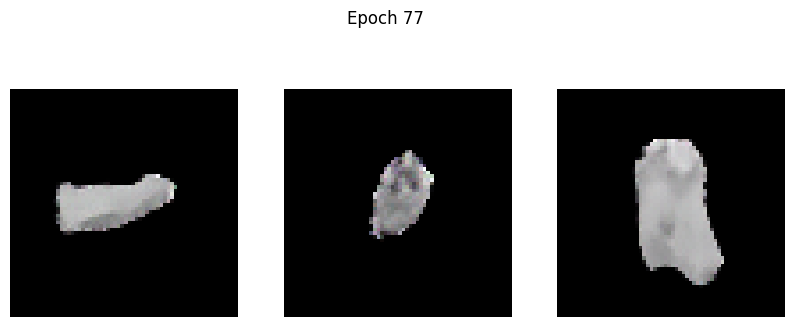

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2255 - g_loss: 1.9226
Epoch 78/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2122 - g_loss: 2.0002

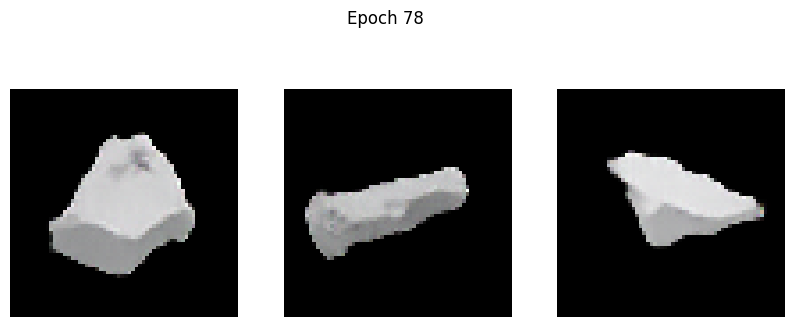

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2122 - g_loss: 2.0006
Epoch 79/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1839 - g_loss: 2.1011

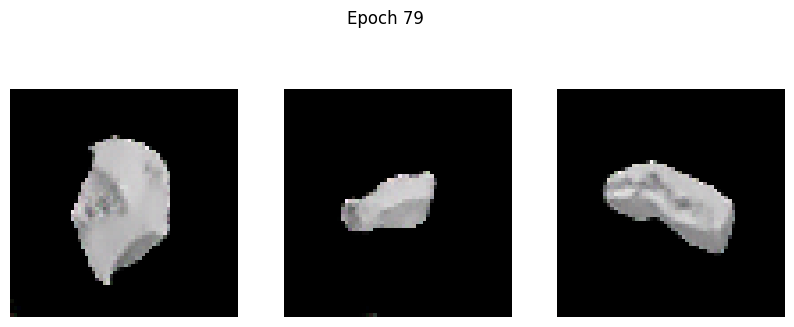

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1841 - g_loss: 2.1012
Epoch 80/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1974 - g_loss: 2.1461

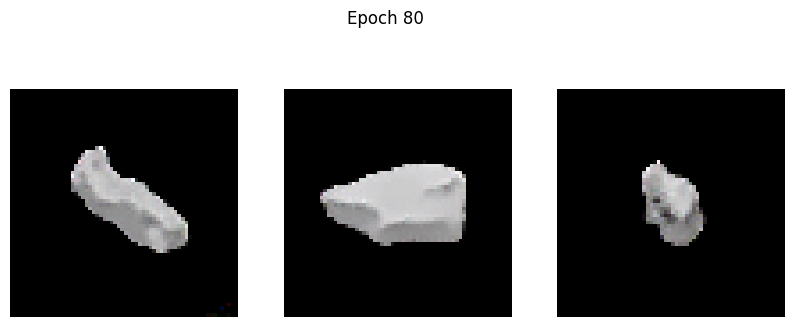

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1974 - g_loss: 2.1464
Epoch 81/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1981 - g_loss: 2.2885

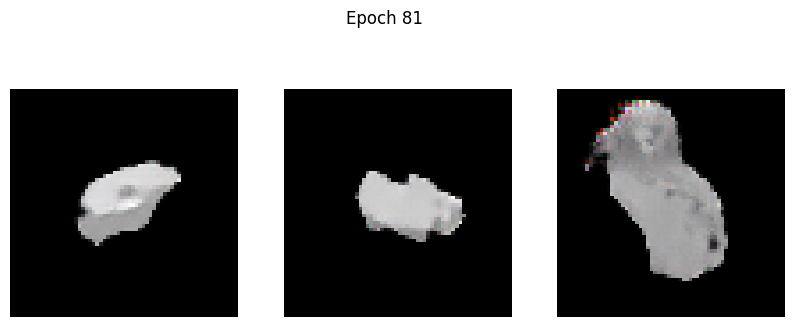

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1981 - g_loss: 2.2885
Epoch 82/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1877 - g_loss: 2.2608

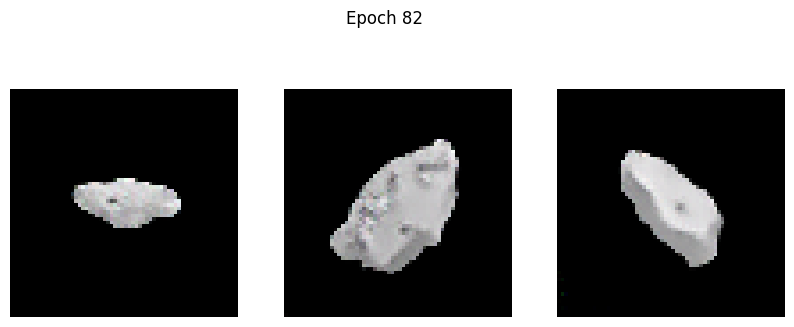

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1878 - g_loss: 2.2610
Epoch 83/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1962 - g_loss: 2.3626

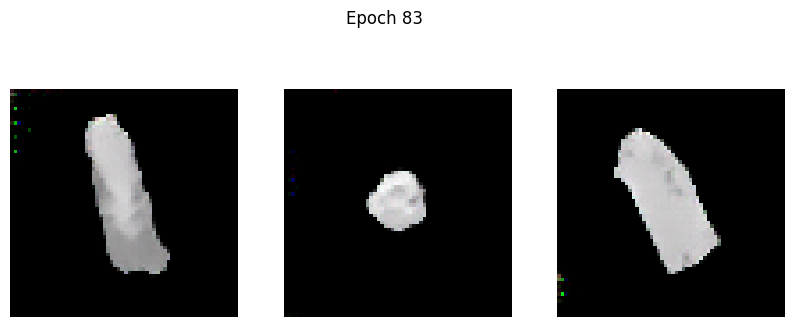

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1963 - g_loss: 2.3625
Epoch 84/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2067 - g_loss: 2.3525

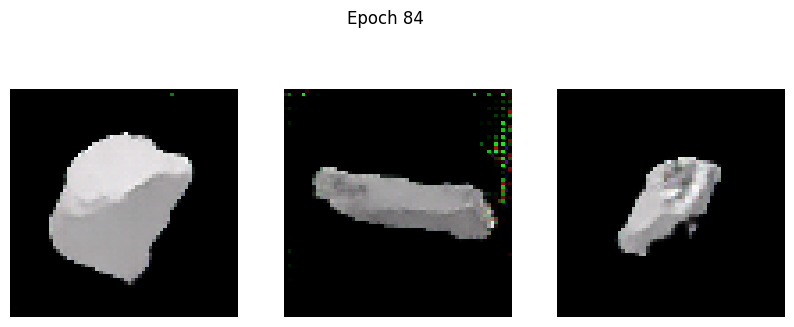

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2067 - g_loss: 2.3530
Epoch 85/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2311 - g_loss: 2.4490

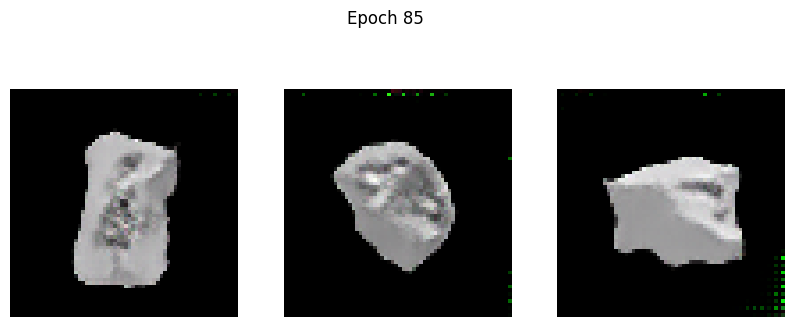

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2309 - g_loss: 2.4485
Epoch 86/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2032 - g_loss: 2.3836

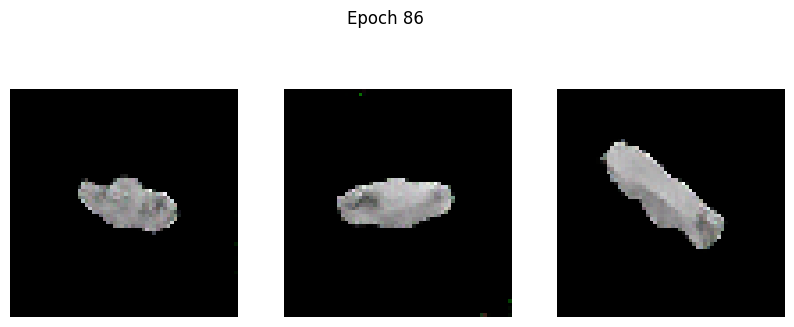

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2030 - g_loss: 2.3833
Epoch 87/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.1680 - g_loss: 2.4590

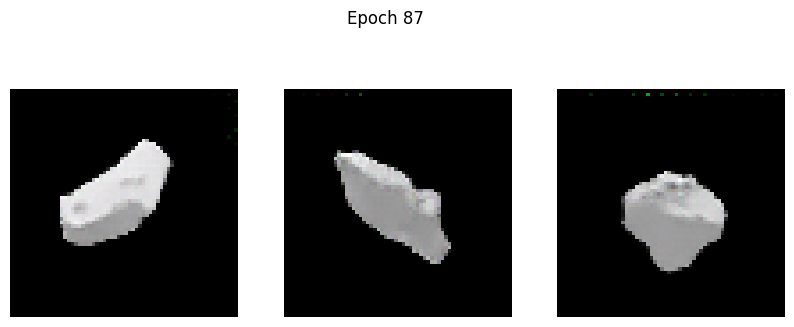

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1680 - g_loss: 2.4589
Epoch 88/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2275 - g_loss: 2.5138

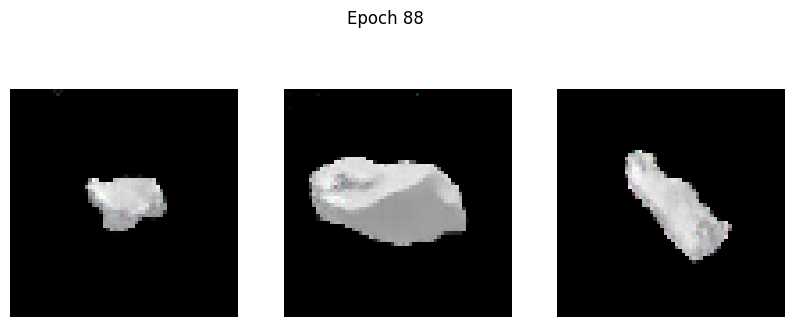

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2277 - g_loss: 2.5137
Epoch 89/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.1445 - g_loss: 2.3814

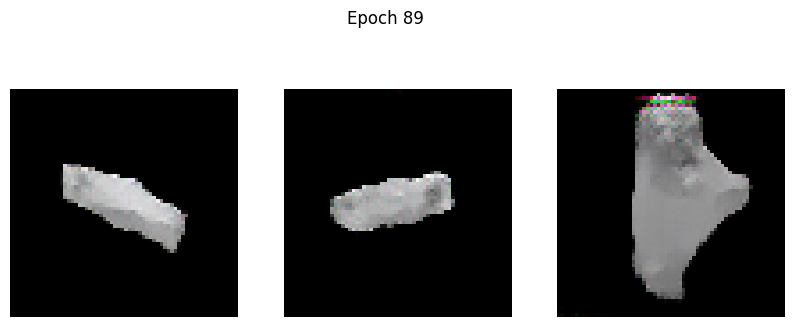

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 0.1446 - g_loss: 2.3815
Epoch 90/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1397 - g_loss: 2.4543

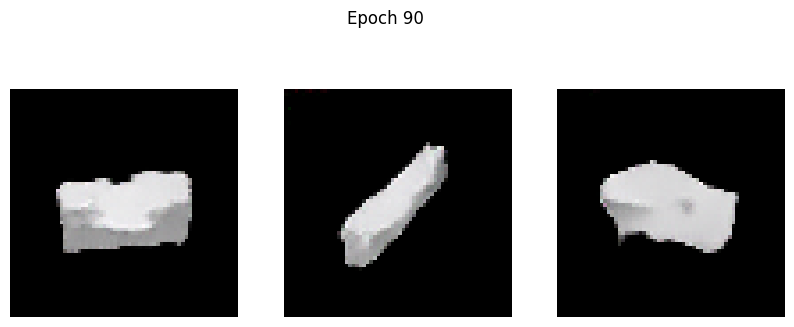

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1398 - g_loss: 2.4543
Epoch 91/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.1733 - g_loss: 2.5864

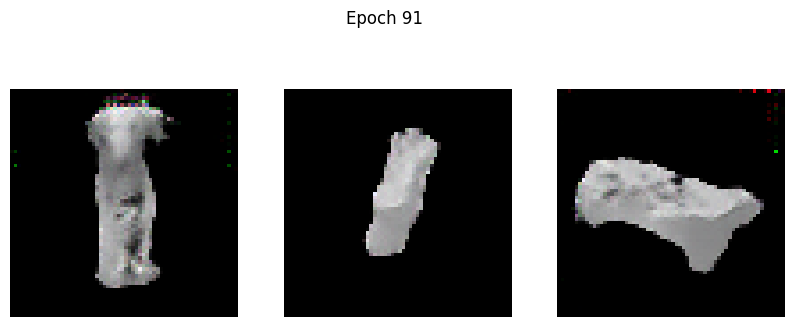

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1733 - g_loss: 2.5860
Epoch 92/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1780 - g_loss: 2.5665

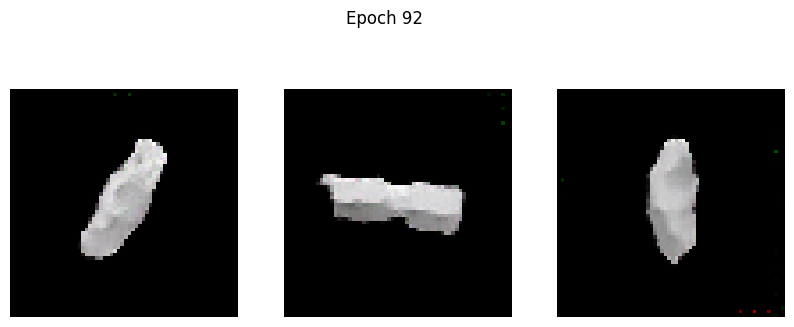

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1778 - g_loss: 2.5666
Epoch 93/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4458 - g_loss: 2.8906

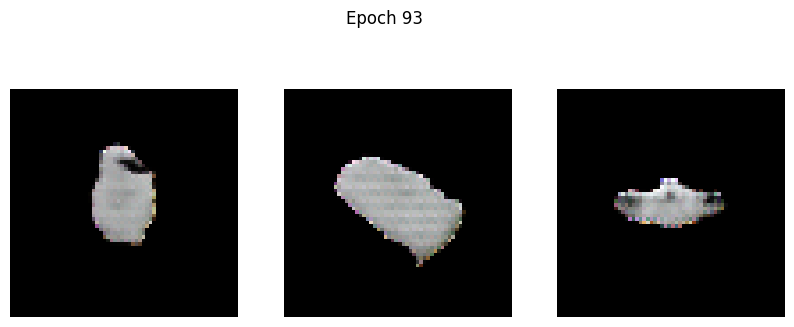

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4549 - g_loss: 2.9019
Epoch 94/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.5259 - g_loss: 1.8543

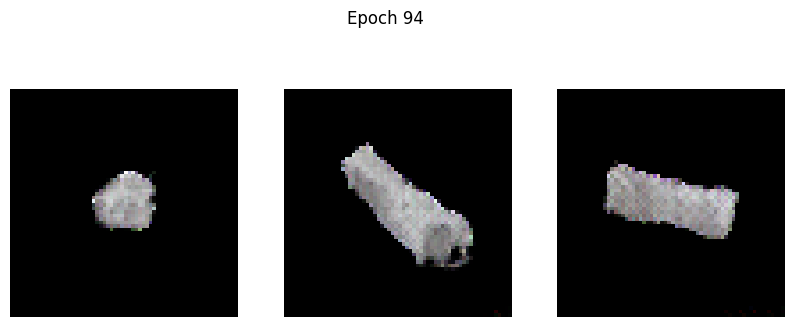

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.5252 - g_loss: 1.8537
Epoch 95/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.3408 - g_loss: 1.7532

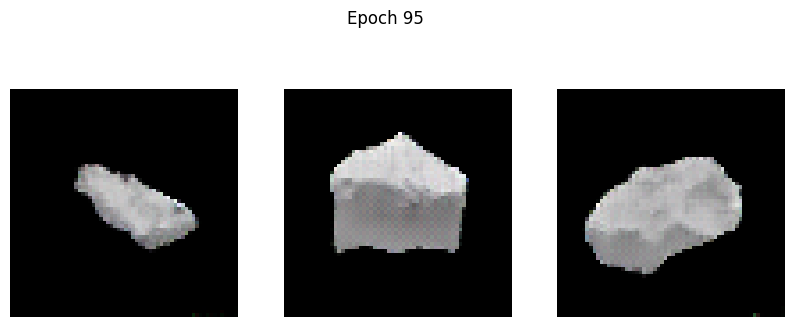

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3407 - g_loss: 1.7533
Epoch 96/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2635 - g_loss: 1.9008

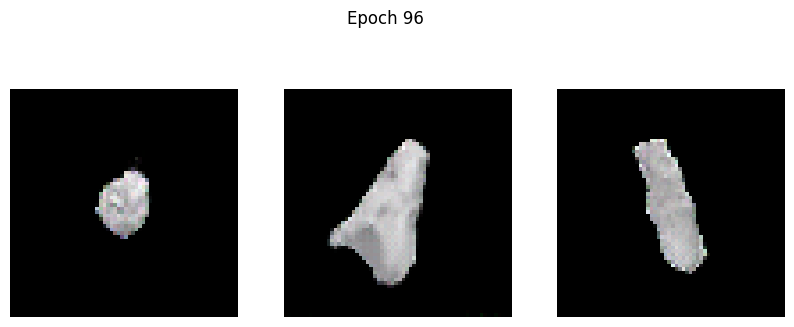

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2635 - g_loss: 1.9009
Epoch 97/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2257 - g_loss: 2.0212

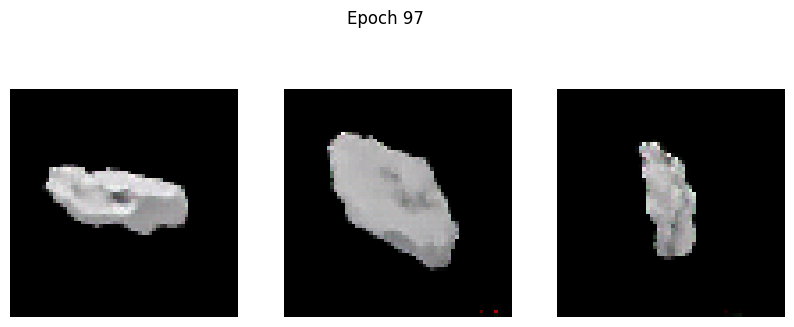

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2257 - g_loss: 2.0210
Epoch 98/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2036 - g_loss: 2.0774

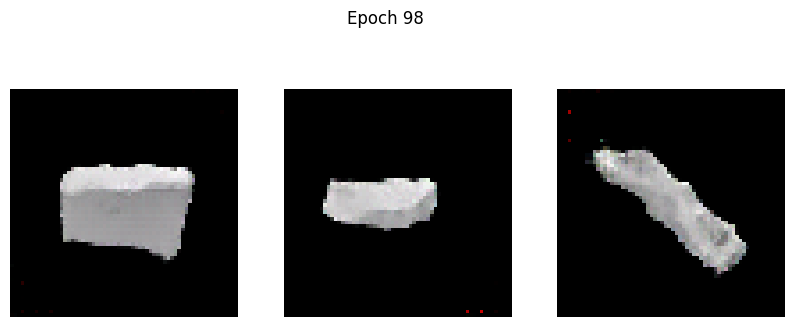

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.2035 - g_loss: 2.0776
Epoch 99/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1584 - g_loss: 2.1783

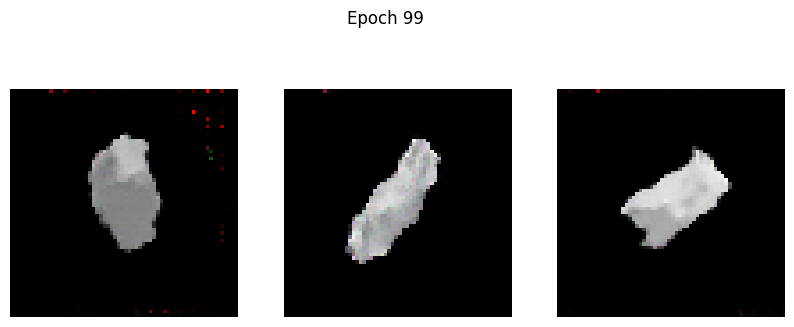

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1585 - g_loss: 2.1784
Epoch 100/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.1561 - g_loss: 2.2622

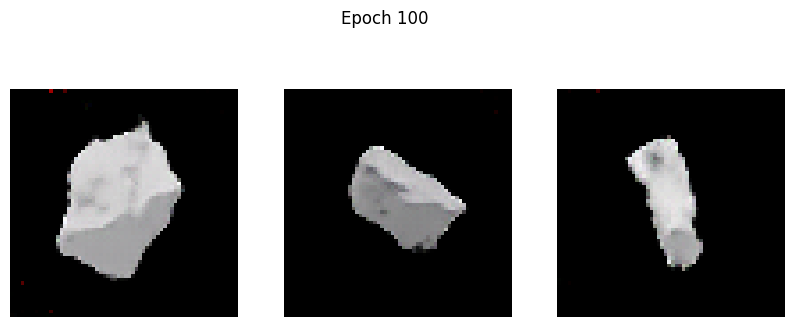

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.1561 - g_loss: 2.2622
Epoch 101/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.1422 - g_loss: 2.3081

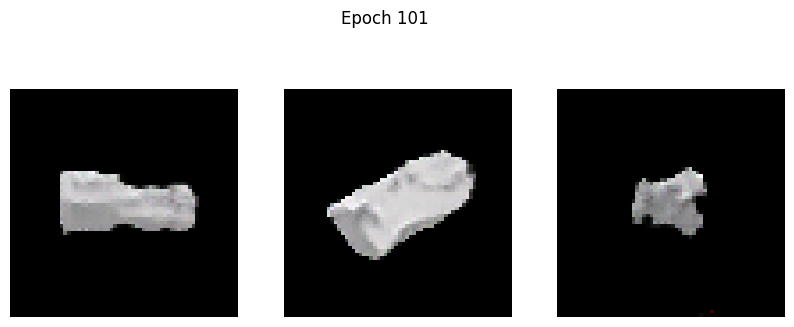

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 0.1420 - g_loss: 2.3089
Epoch 102/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2132 - g_loss: 2.4605

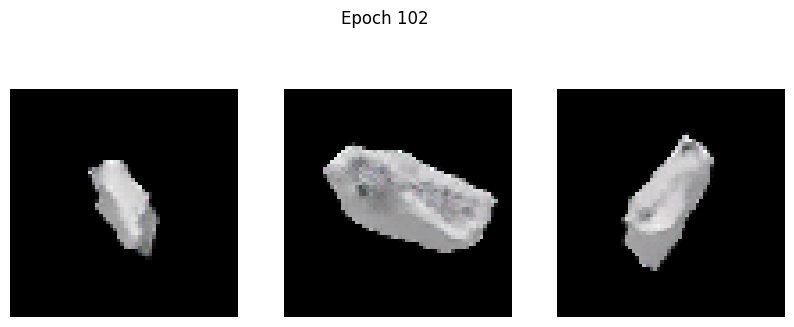

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2133 - g_loss: 2.4607
Epoch 103/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1125 - g_loss: 2.4602

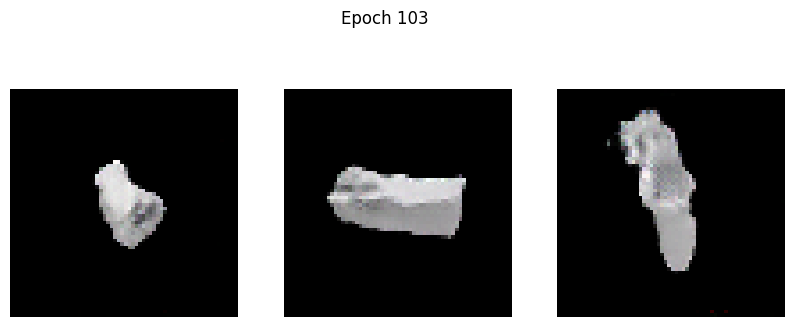

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1125 - g_loss: 2.4602
Epoch 104/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1306 - g_loss: 2.3855

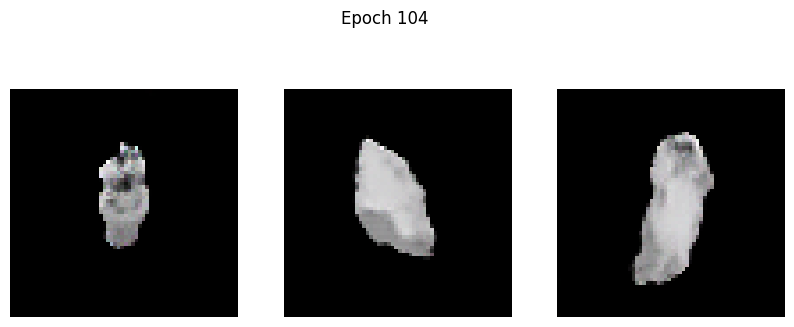

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1305 - g_loss: 2.3863
Epoch 105/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1037 - g_loss: 2.5292

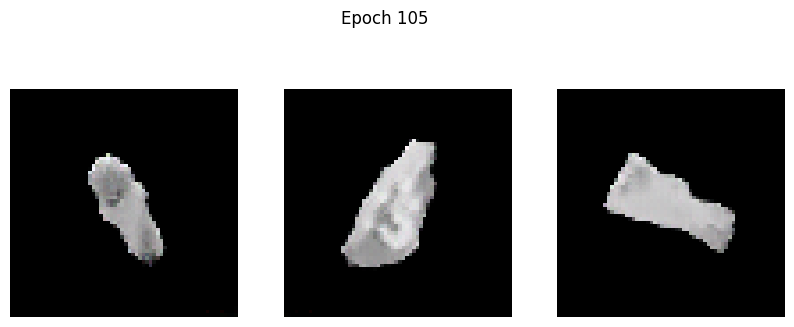

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1038 - g_loss: 2.5296
Epoch 106/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0978 - g_loss: 2.5991

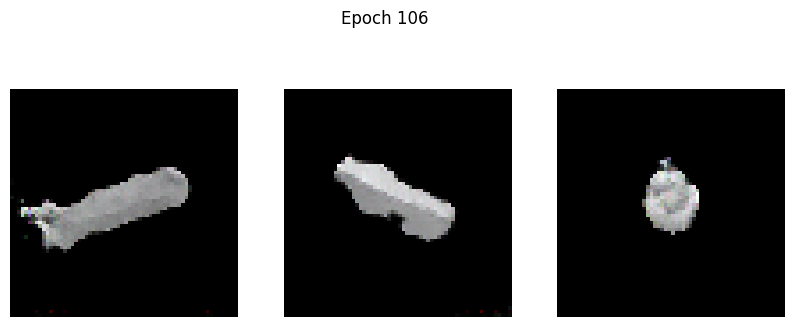

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0982 - g_loss: 2.5992
Epoch 107/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0989 - g_loss: 2.5626

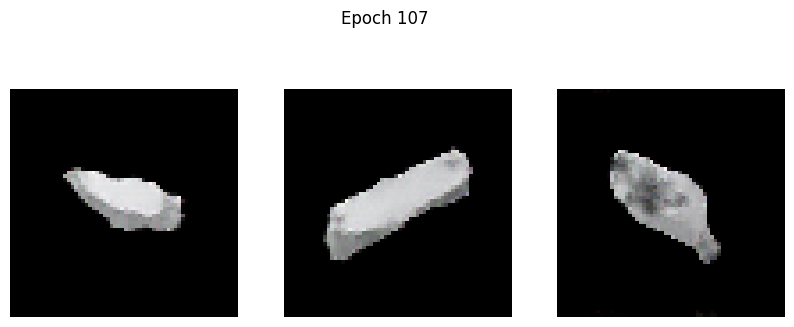

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0991 - g_loss: 2.5632
Epoch 108/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1080 - g_loss: 2.6765

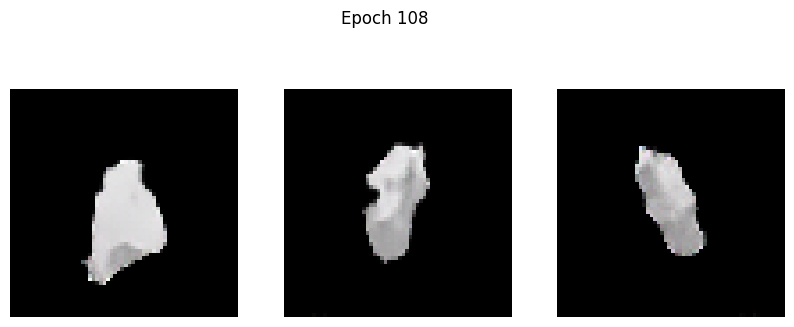

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1080 - g_loss: 2.6765
Epoch 109/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1726 - g_loss: 2.7333

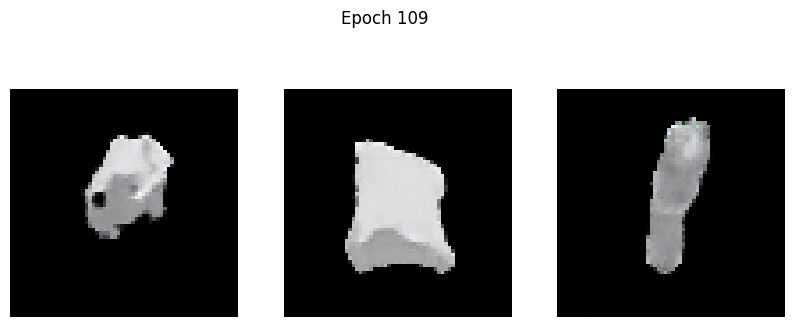

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1735 - g_loss: 2.7342
Epoch 110/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1028 - g_loss: 2.6090

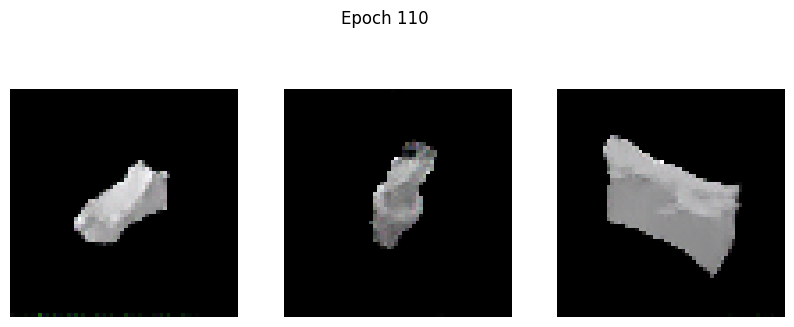

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1027 - g_loss: 2.6089
Epoch 111/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1025 - g_loss: 2.7108

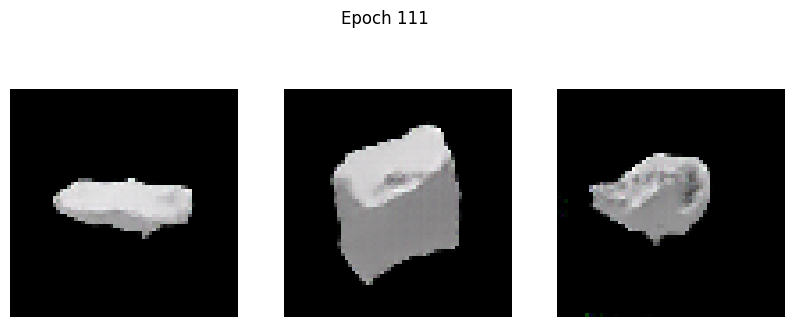

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1025 - g_loss: 2.7107
Epoch 112/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0838 - g_loss: 2.7135

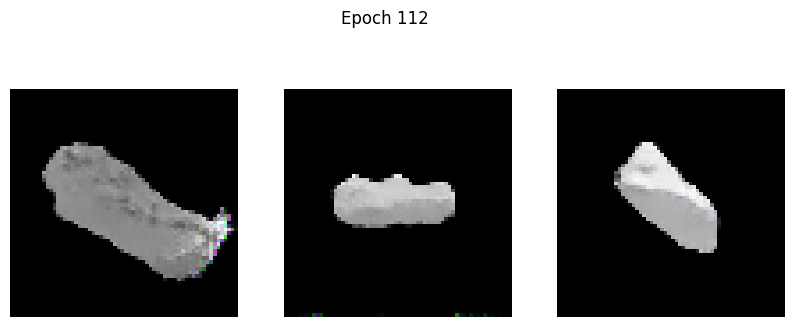

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0837 - g_loss: 2.7135
Epoch 113/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0985 - g_loss: 2.8422

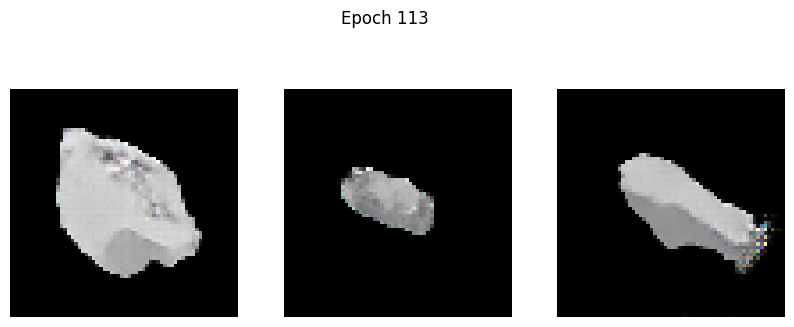

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0988 - g_loss: 2.8420
Epoch 114/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1326 - g_loss: 2.9175

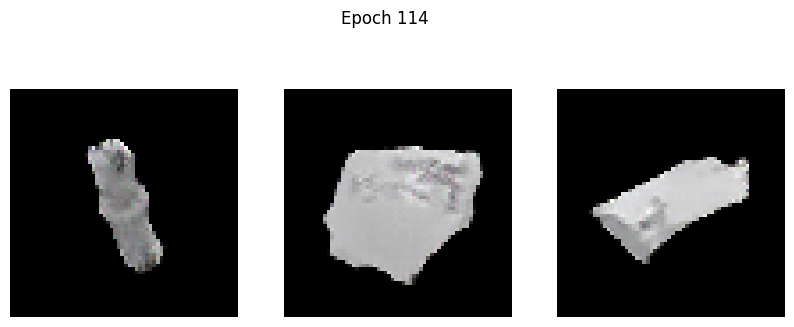

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1320 - g_loss: 2.9159
Epoch 115/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0666 - g_loss: 2.8802

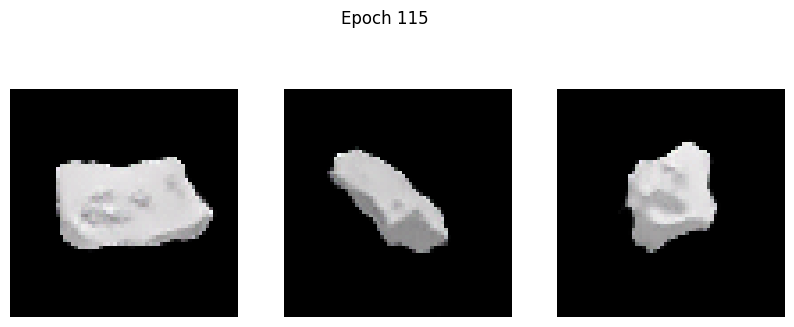

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0667 - g_loss: 2.8803
Epoch 116/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1180 - g_loss: 2.8689

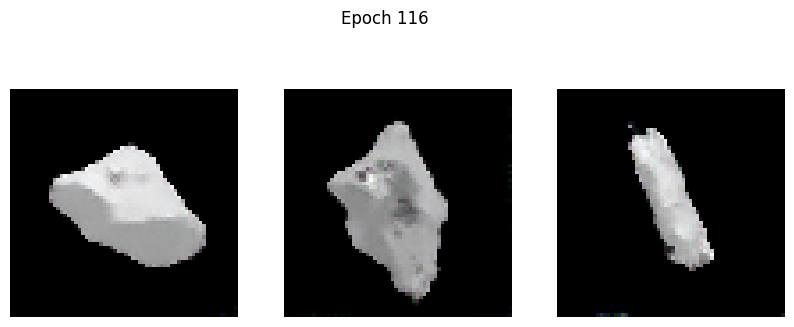

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1180 - g_loss: 2.8688
Epoch 117/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0686 - g_loss: 2.9066

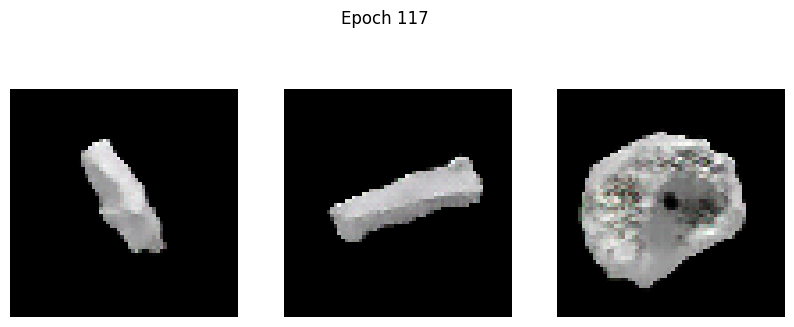

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0700 - g_loss: 2.9080
Epoch 118/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0848 - g_loss: 2.8358

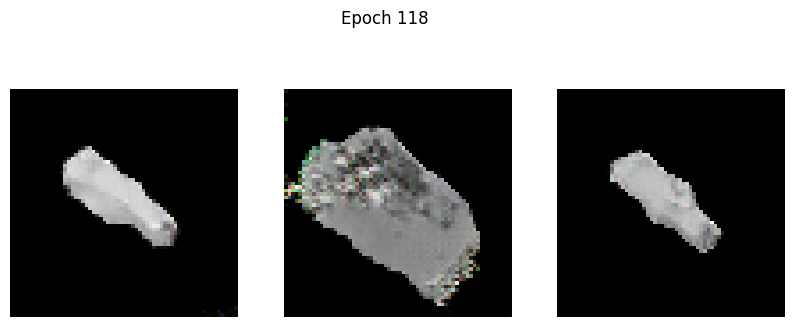

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.0846 - g_loss: 2.8353
Epoch 119/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0606 - g_loss: 2.8380

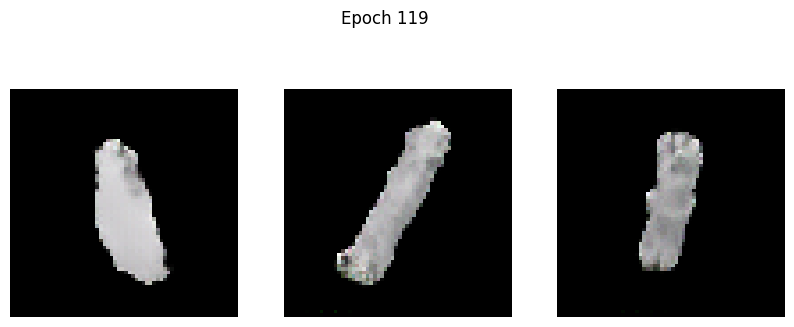

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0614 - g_loss: 2.8393
Epoch 120/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1145 - g_loss: 2.9887

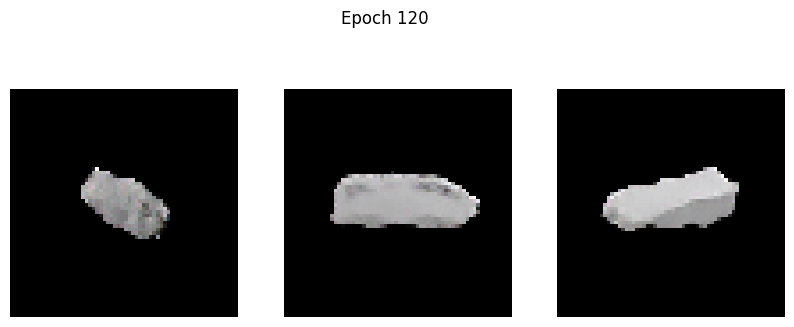

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1138 - g_loss: 2.9869
Epoch 121/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0575 - g_loss: 2.8849

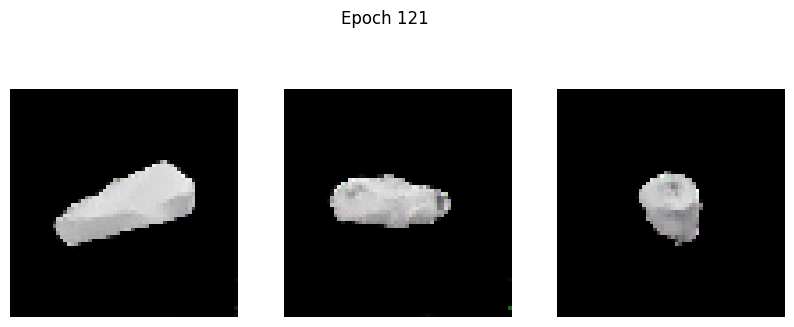

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0577 - g_loss: 2.8850
Epoch 122/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0667 - g_loss: 2.9777

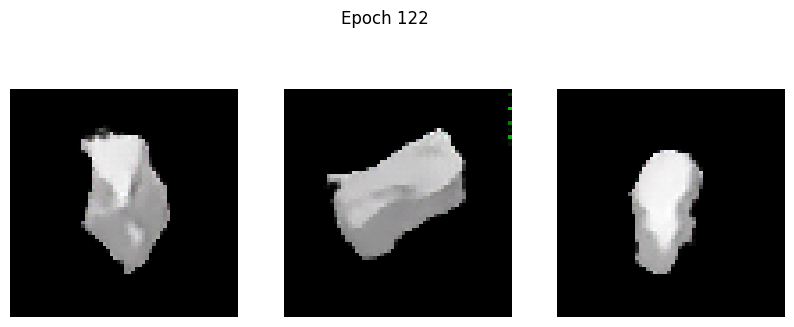

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0670 - g_loss: 2.9778
Epoch 123/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1409 - g_loss: 3.0803

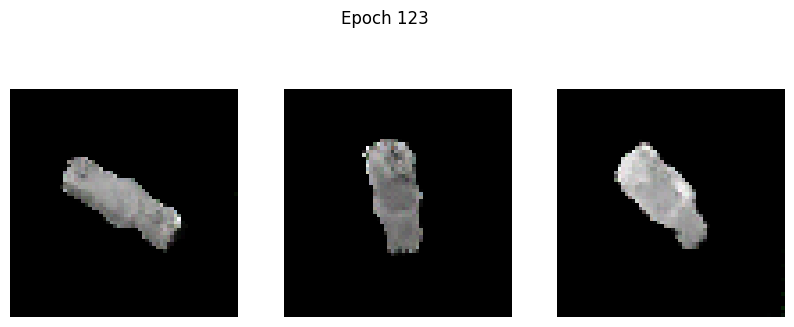

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1400 - g_loss: 3.0794
Epoch 124/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.0224 - g_loss: 3.0177

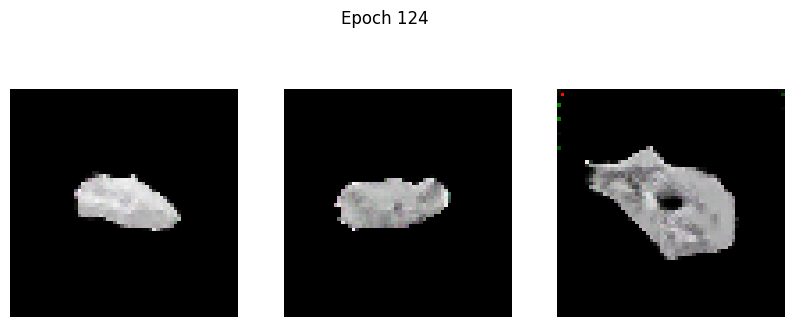

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.0224 - g_loss: 3.0180
Epoch 125/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.3900 - g_loss: 3.3482

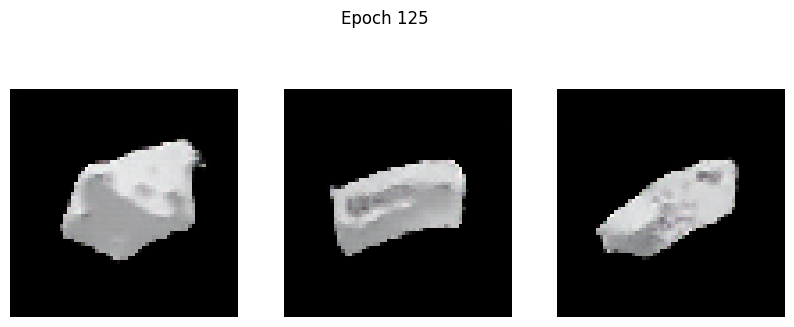

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.3888 - g_loss: 3.3460
Epoch 126/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.0281 - g_loss: 2.7417

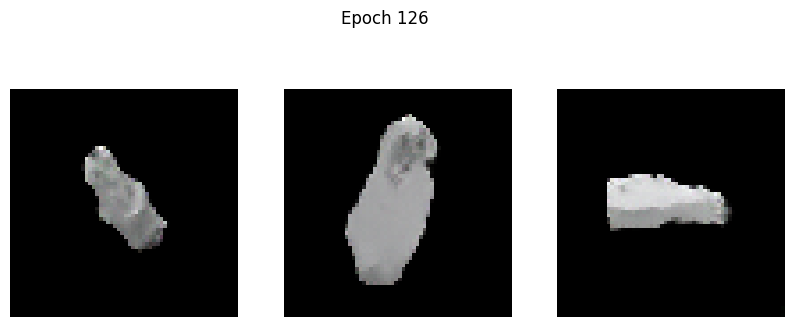

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0279 - g_loss: 2.7426
Epoch 127/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2310 - g_loss: 2.9617

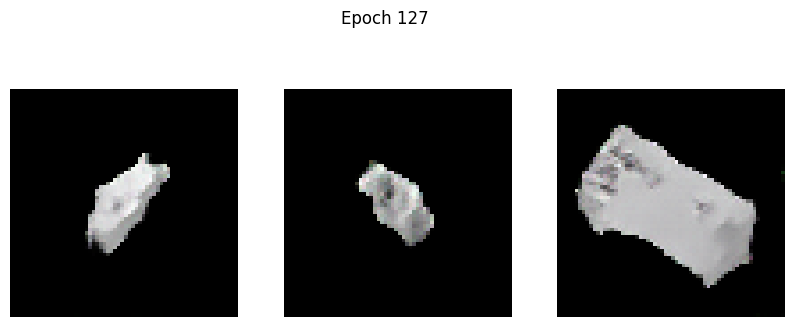

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2302 - g_loss: 2.9617
Epoch 128/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0521 - g_loss: 2.8359

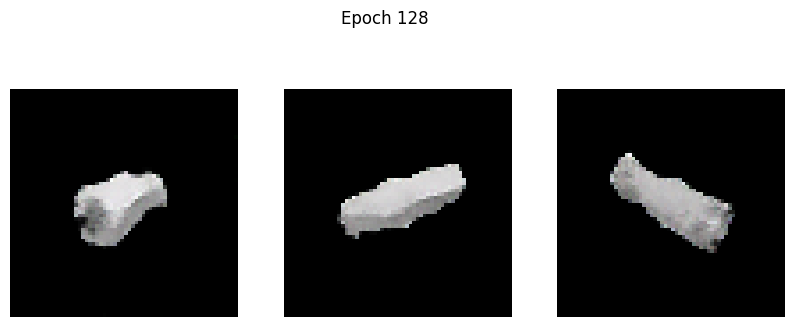

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0519 - g_loss: 2.8364
Epoch 129/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1030 - g_loss: 3.1179

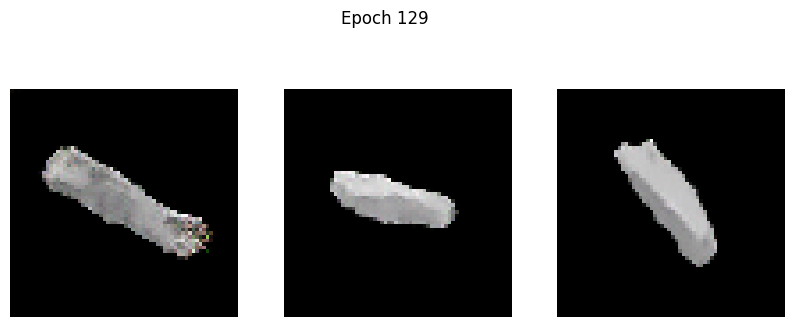

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1032 - g_loss: 3.1180
Epoch 130/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1299 - g_loss: 2.9649

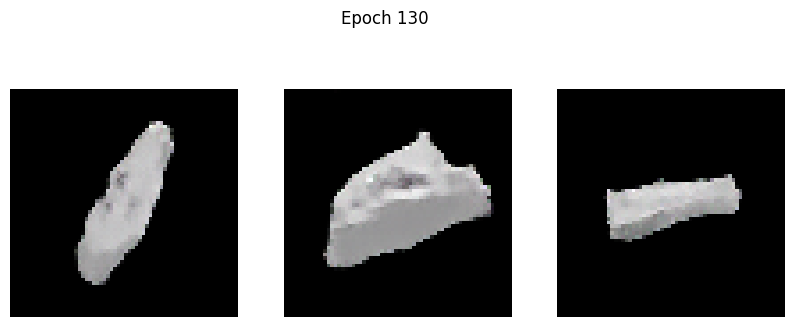

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1294 - g_loss: 2.9644
Epoch 131/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0190 - g_loss: 2.9507

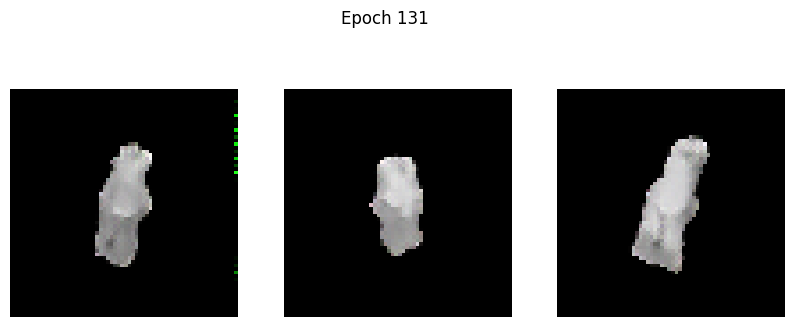

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0183 - g_loss: 2.9516
Epoch 132/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1531 - g_loss: 3.2580

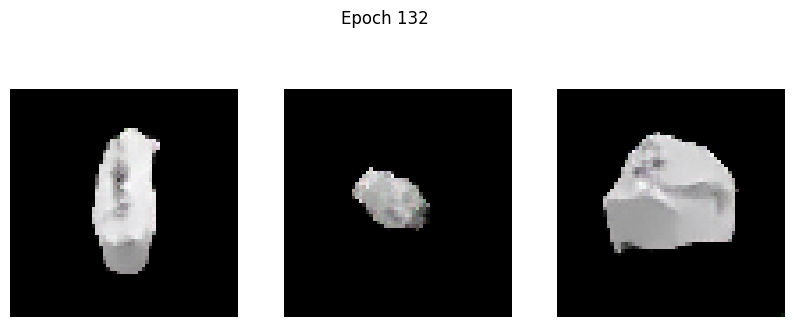

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1514 - g_loss: 3.2555
Epoch 133/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0215 - g_loss: 3.1398

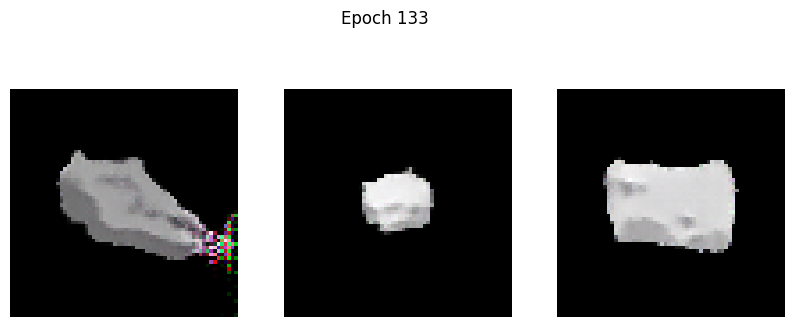

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0211 - g_loss: 3.1402
Epoch 134/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 8.7170e-04 - g_loss: 3.0845

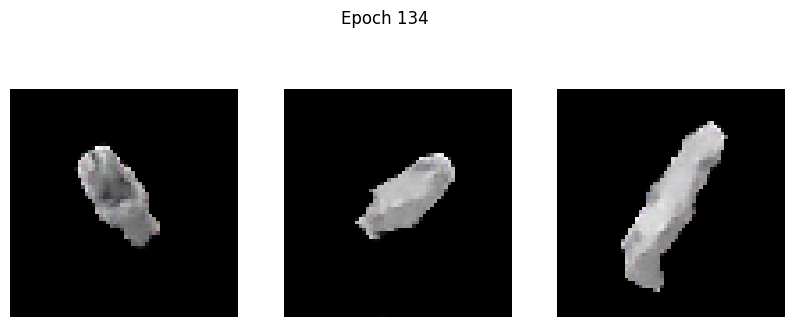

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 7.0596e-04 - g_loss: 3.0854
Epoch 135/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0822 - g_loss: 3.0586

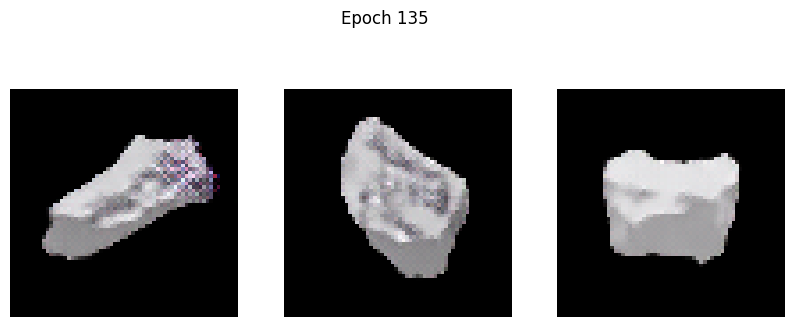

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0819 - g_loss: 3.0589
Epoch 136/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0451 - g_loss: 3.2829

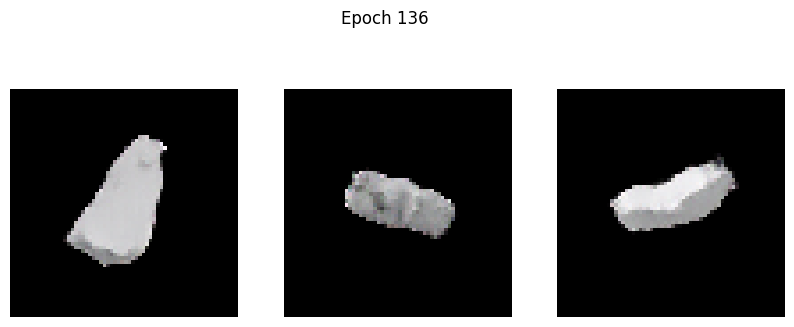

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0449 - g_loss: 3.2821
Epoch 137/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2366 - g_loss: 3.6383

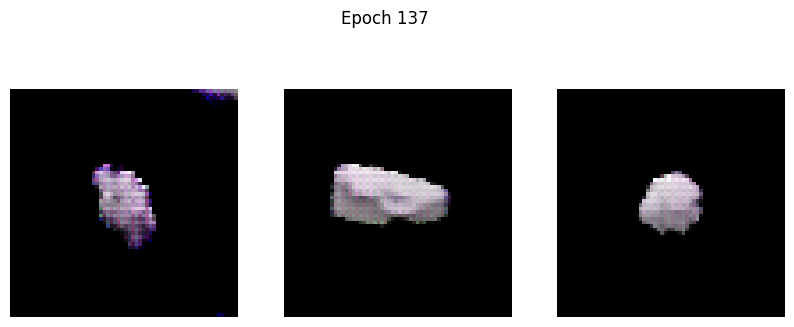

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2454 - g_loss: 3.6507
Epoch 138/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.4605 - g_loss: 3.5626

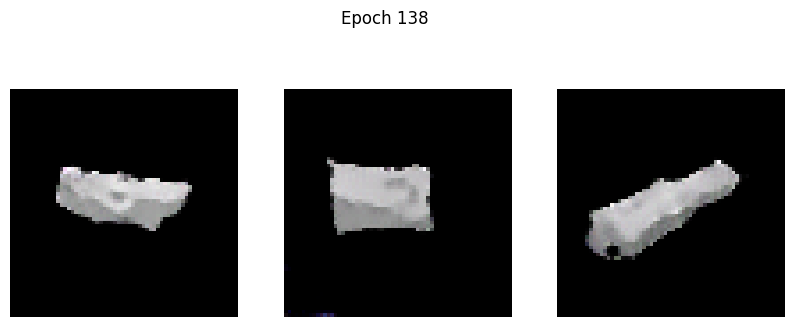

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.4579 - g_loss: 3.5573
Epoch 139/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0442 - g_loss: 2.7525

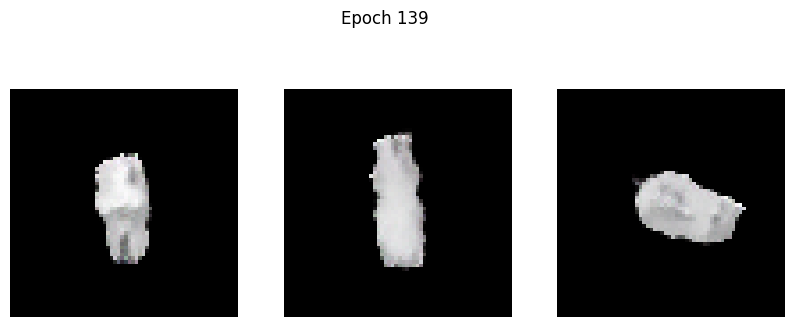

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0443 - g_loss: 2.7525
Epoch 140/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1030 - g_loss: 2.7901

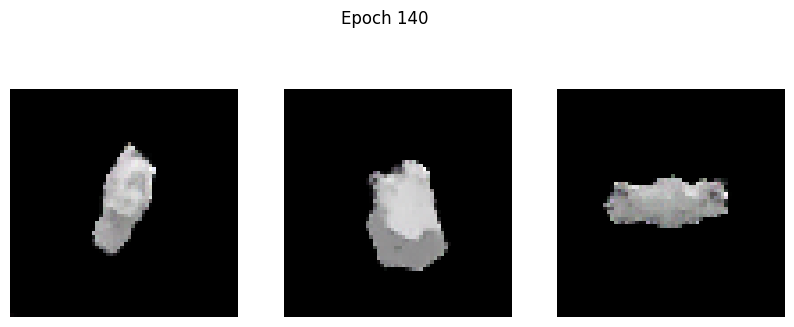

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1028 - g_loss: 2.7904
Epoch 141/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1564 - g_loss: 2.8517

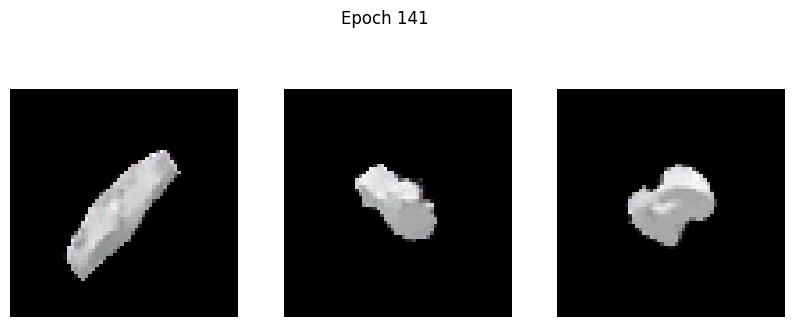

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1566 - g_loss: 2.8515
Epoch 142/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1335 - g_loss: 2.9405

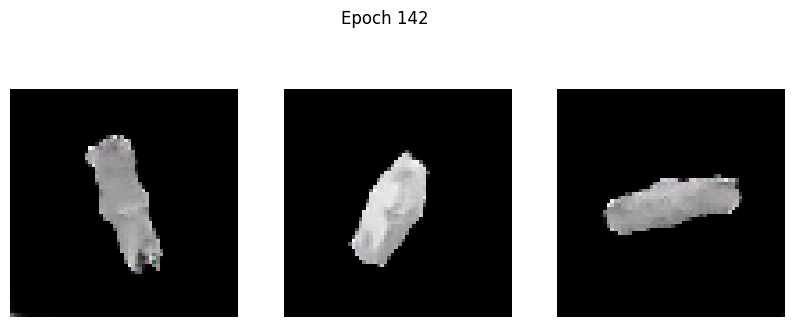

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1341 - g_loss: 2.9405
Epoch 143/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0473 - g_loss: 3.1847

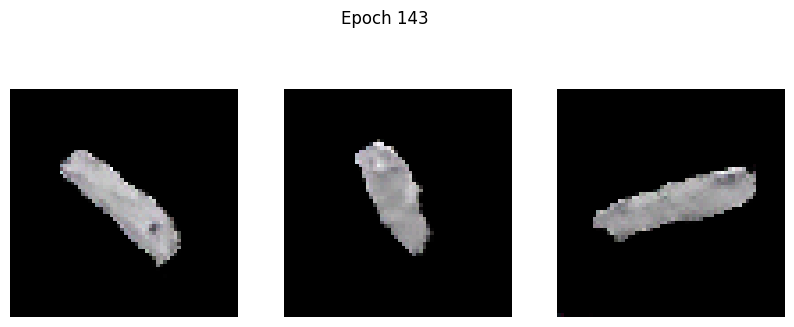

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0446 - g_loss: 3.1881
Epoch 144/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.1214 - g_loss: 2.9002

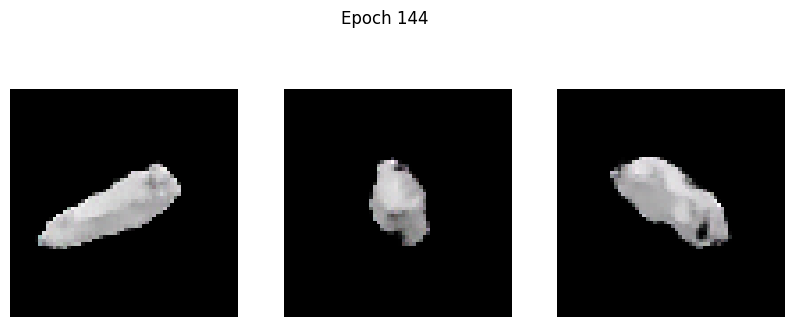

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1218 - g_loss: 2.9007
Epoch 145/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1888 - g_loss: 3.0824

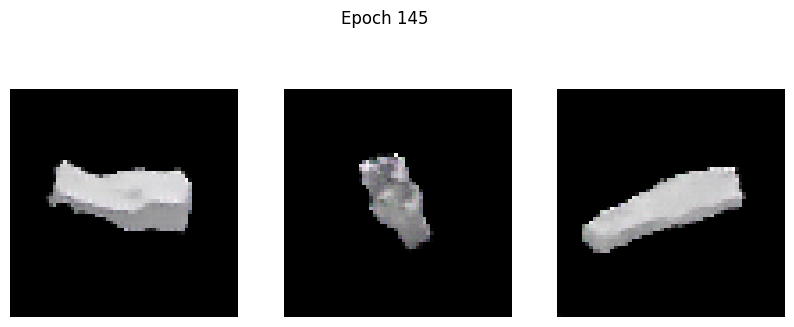

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1883 - g_loss: 3.0824
Epoch 146/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1895 - g_loss: 3.1245

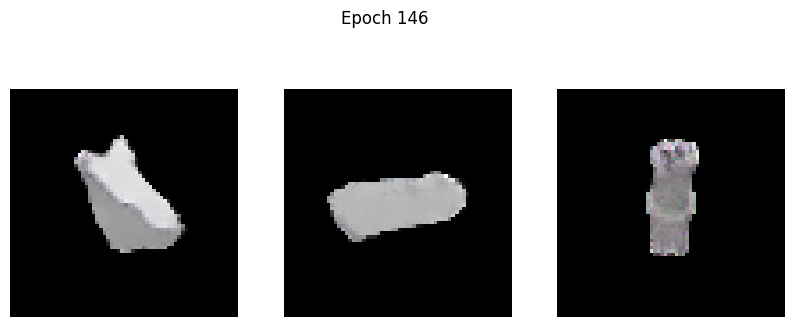

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1897 - g_loss: 3.1247
Epoch 147/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1780 - g_loss: 3.1812

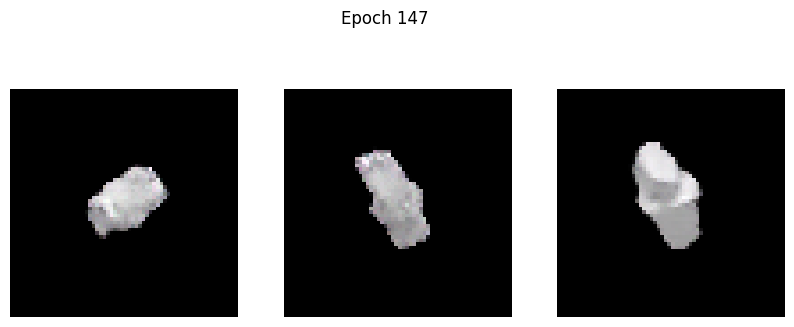

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1774 - g_loss: 3.1816
Epoch 148/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1558 - g_loss: 3.1591

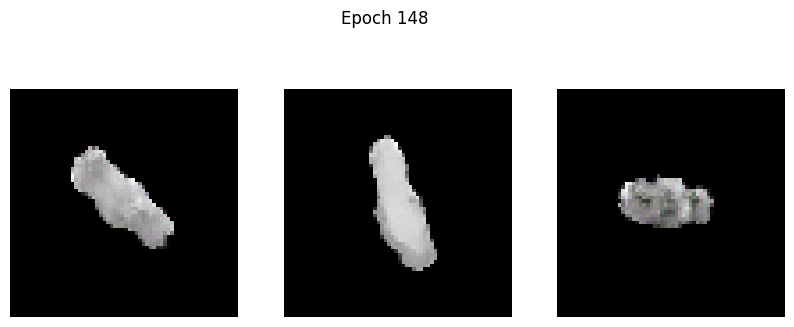

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1552 - g_loss: 3.1603
Epoch 149/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.1170 - g_loss: 3.7236

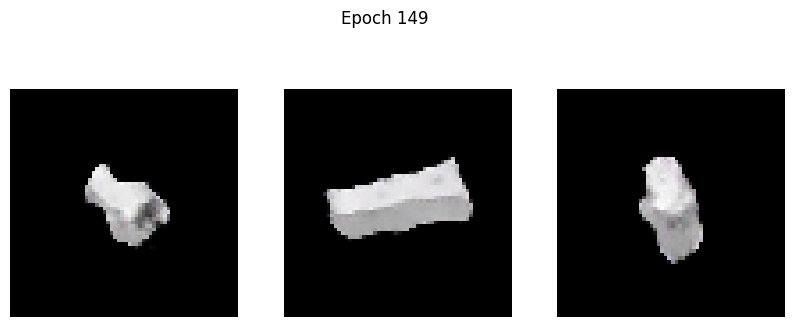

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.1162 - g_loss: 3.7225
Epoch 150/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2283 - g_loss: 3.3121

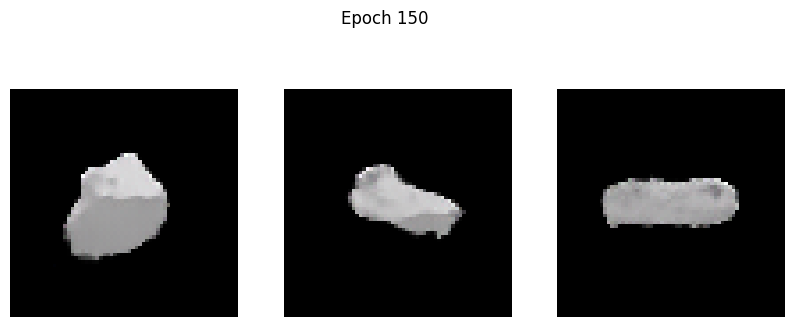

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2280 - g_loss: 3.3111
Epoch 151/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1612 - g_loss: 3.2711

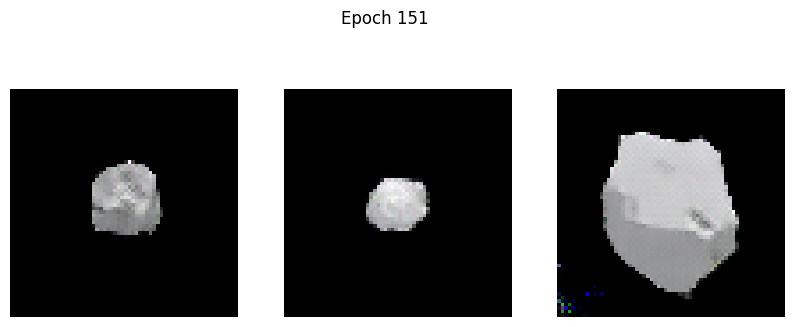

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -0.1591 - g_loss: 3.2734
Epoch 152/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2414 - g_loss: 3.0550

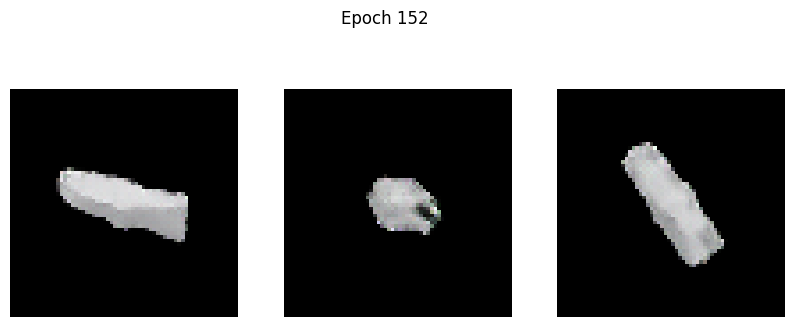

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2418 - g_loss: 3.0558
Epoch 153/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1321 - g_loss: 3.5640

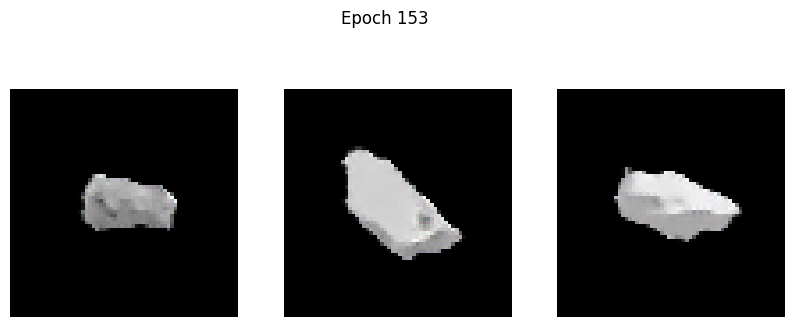

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1332 - g_loss: 3.5616
Epoch 154/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1676 - g_loss: 3.4160

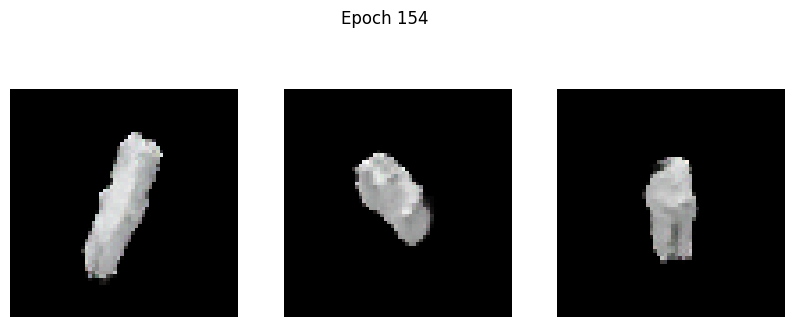

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1667 - g_loss: 3.4160
Epoch 155/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2970 - g_loss: 3.0942

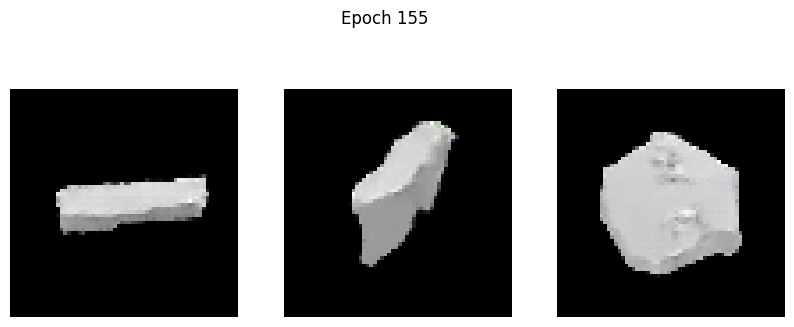

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2978 - g_loss: 3.0944
Epoch 156/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.2325 - g_loss: 3.3855

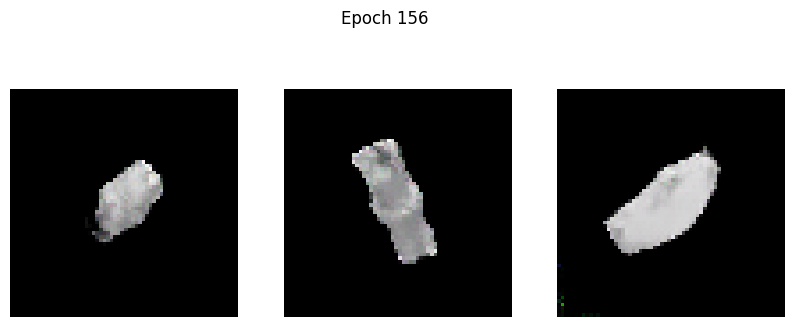

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.2330 - g_loss: 3.3858
Epoch 157/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.5140 - g_loss: 4.7442

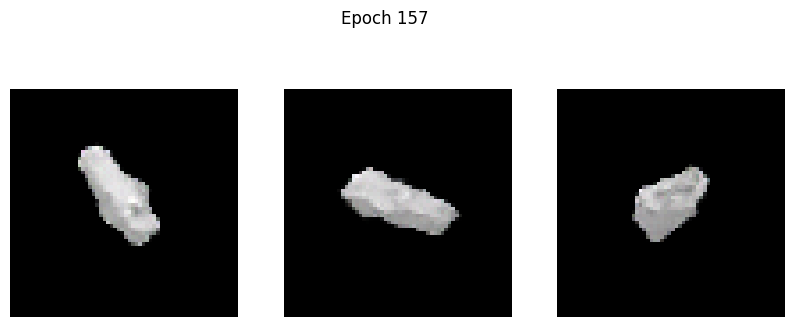

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.5148 - g_loss: 4.7447
Epoch 158/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.3249 - g_loss: 2.9876

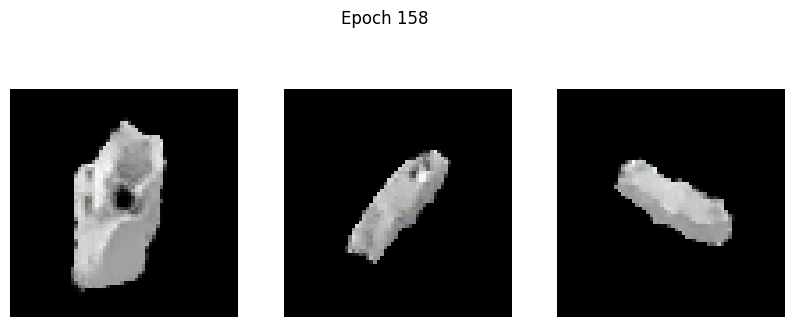

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.3260 - g_loss: 2.9880
Epoch 159/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.4339 - g_loss: 3.0047

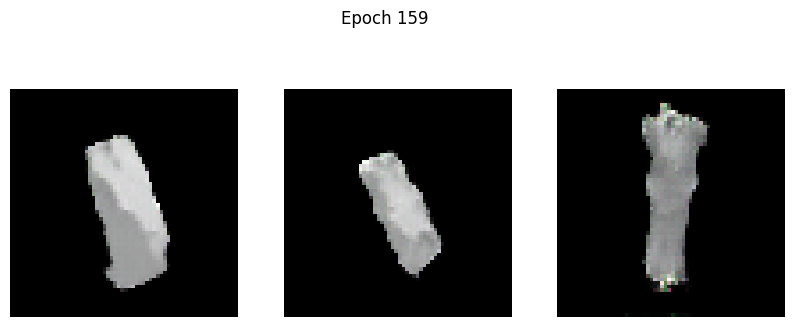

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.4335 - g_loss: 3.0056
Epoch 160/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.4097 - g_loss: 3.2339

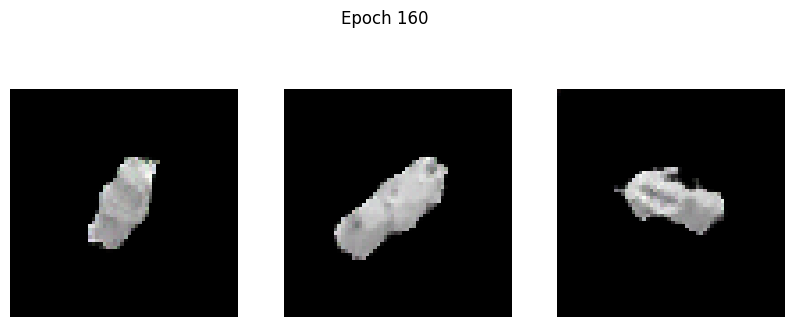

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.4101 - g_loss: 3.2335
Epoch 161/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.7341 - g_loss: 3.8580

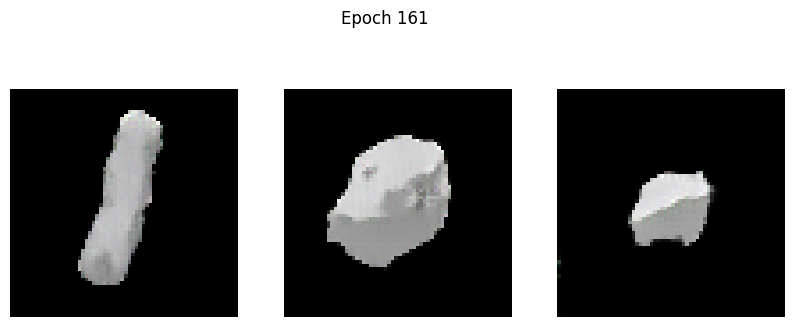

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.7279 - g_loss: 3.8554
Epoch 162/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.4310 - g_loss: 3.2964

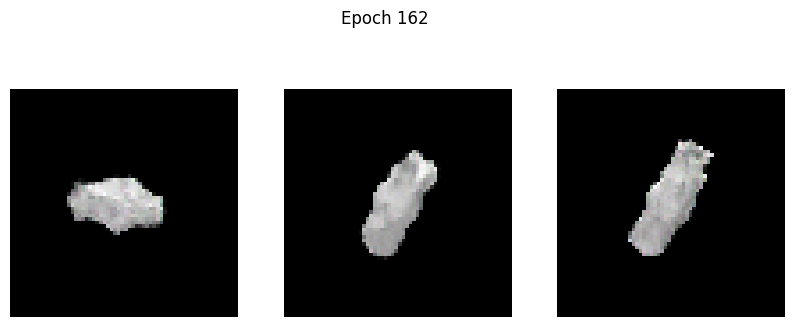

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.4319 - g_loss: 3.2965
Epoch 163/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.6303 - g_loss: 3.2683

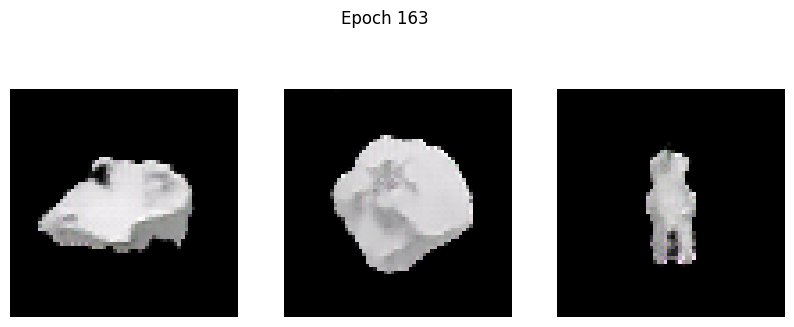

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.6294 - g_loss: 3.2692
Epoch 164/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.3719 - g_loss: 3.7065

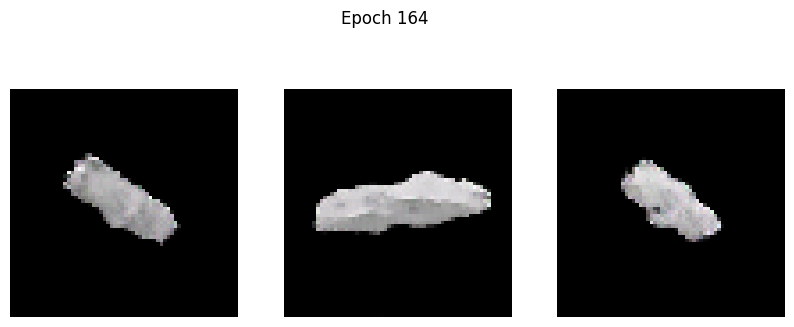

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.3715 - g_loss: 3.7050
Epoch 165/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -0.7496 - g_loss: 3.4252

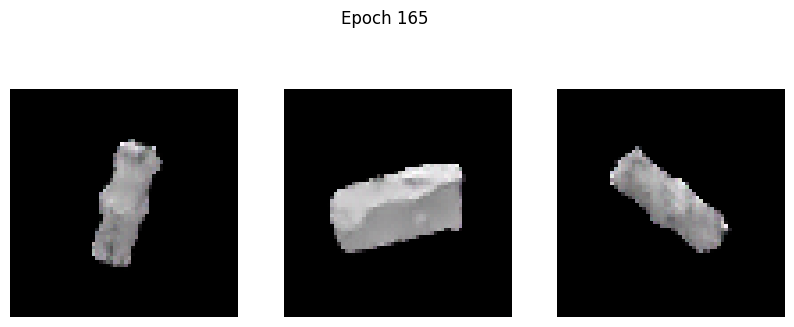

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: -0.7478 - g_loss: 3.4251
Epoch 166/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 4.2269 - g_loss: 8.4681

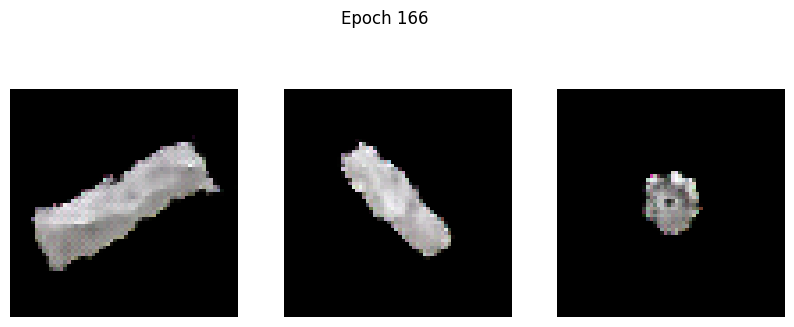

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 4.2305 - g_loss: 8.4692
Epoch 167/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.0305 - g_loss: 2.9584

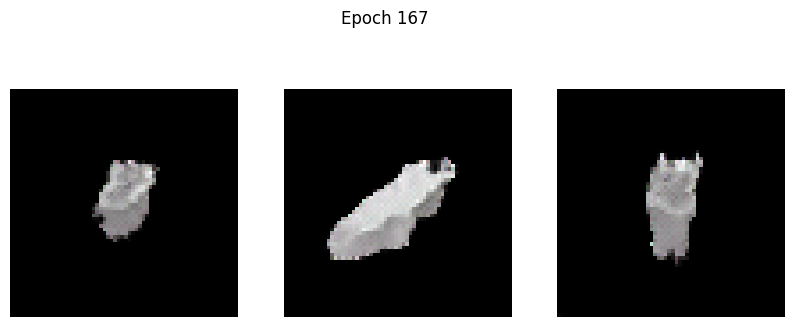

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.0293 - g_loss: 2.9554
Epoch 168/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.3819 - g_loss: 2.4699

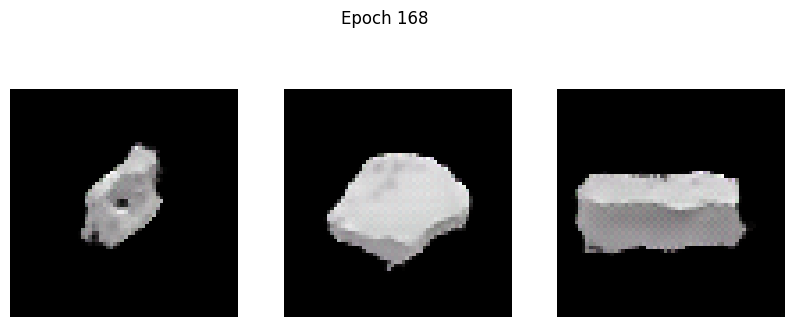

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.3818 - g_loss: 2.4707
Epoch 169/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -0.5721 - g_loss: 2.6783

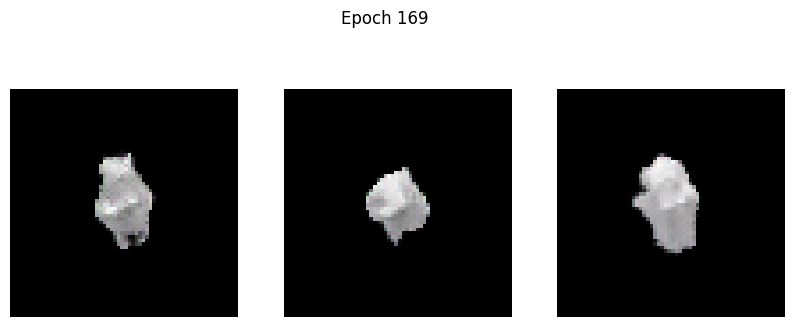

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -0.5719 - g_loss: 2.6782
Epoch 170/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -0.6845 - g_loss: 2.7422

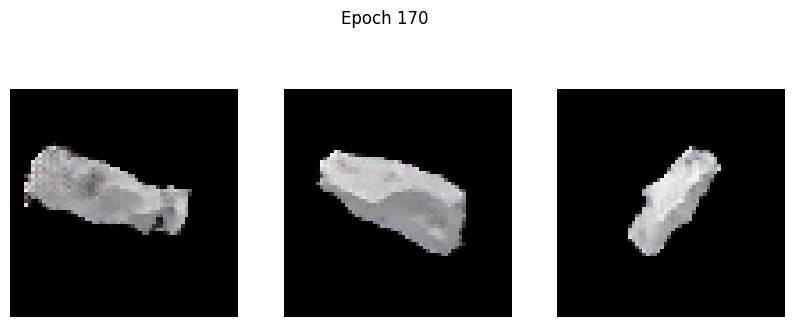

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -0.6845 - g_loss: 2.7422
Epoch 171/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -0.5202 - g_loss: 2.9933

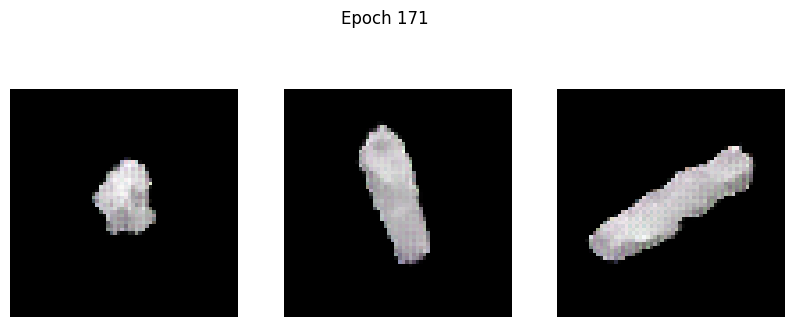

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -0.5142 - g_loss: 2.9982
Epoch 172/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5201 - g_loss: 3.0575

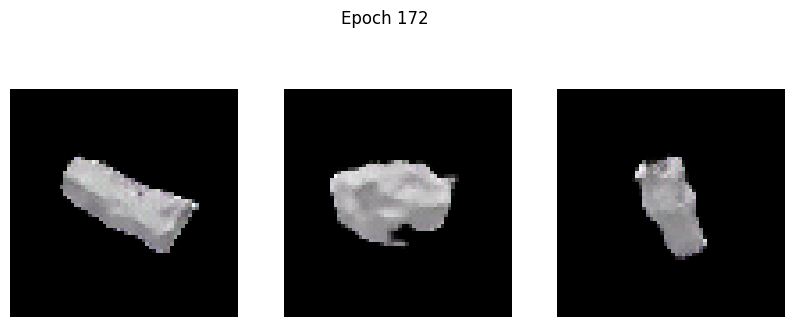

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.5209 - g_loss: 3.0562
Epoch 173/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.8450 - g_loss: 2.8483

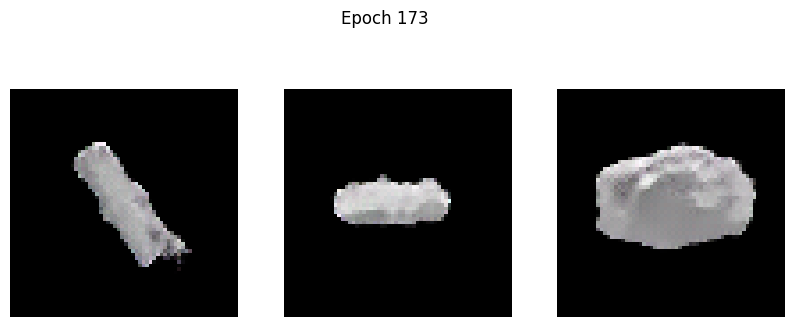

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.8441 - g_loss: 2.8488
Epoch 174/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.6851 - g_loss: 2.9865

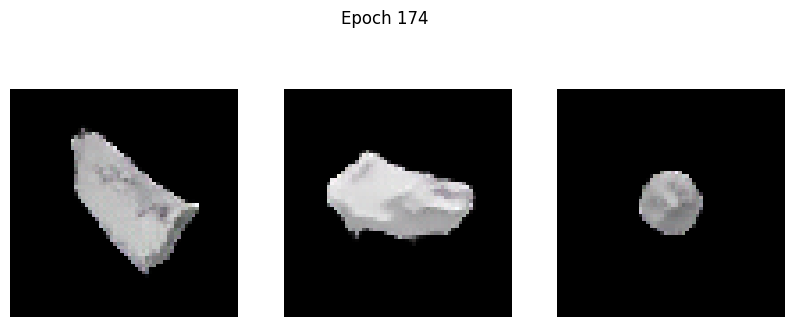

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.6843 - g_loss: 2.9868
Epoch 175/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.7451 - g_loss: 3.2391

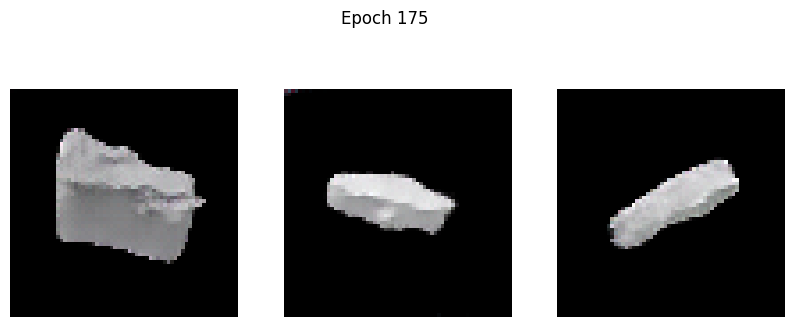

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.7451 - g_loss: 3.2389
Epoch 176/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.4249 - g_loss: 3.3638

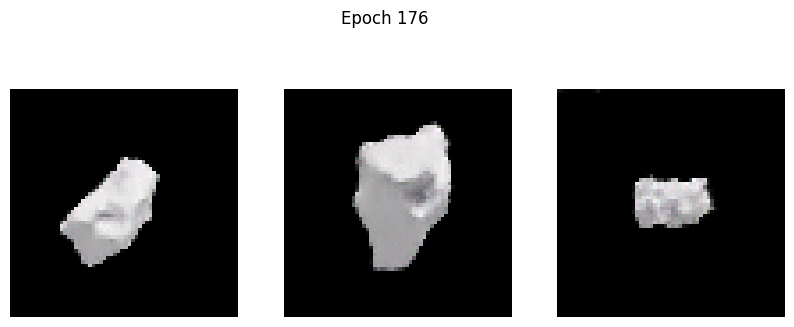

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.4266 - g_loss: 3.3637
Epoch 177/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.4096 - g_loss: 3.5340

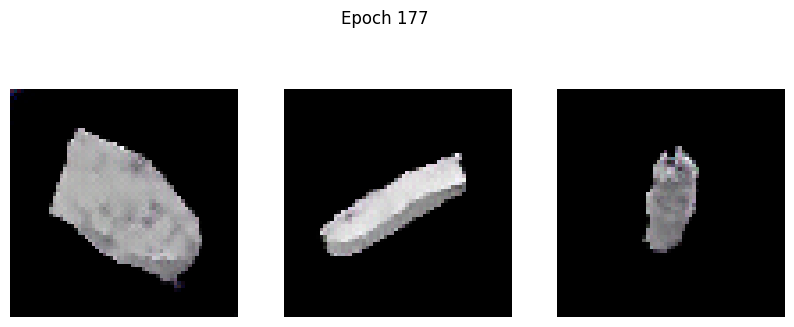

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.4048 - g_loss: 3.5376
Epoch 178/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5977 - g_loss: 3.5975

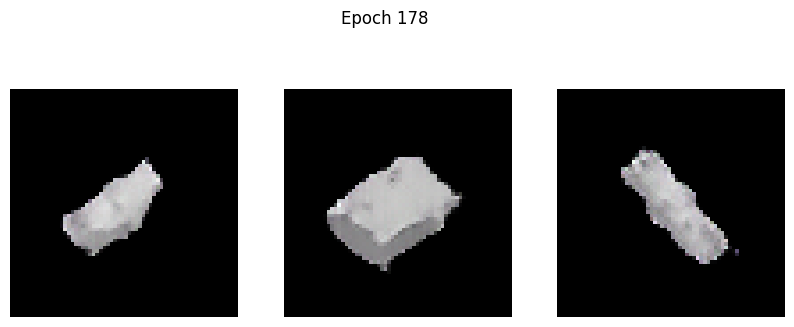

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.5990 - g_loss: 3.5948
Epoch 179/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.7536 - g_loss: 3.2728

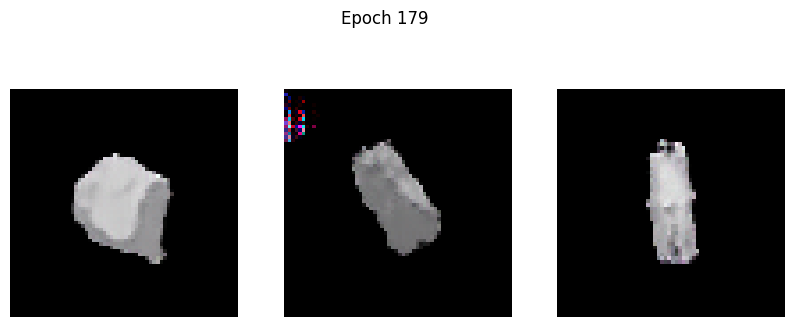

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.7542 - g_loss: 3.2723
Epoch 180/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.6598 - g_loss: 3.7627

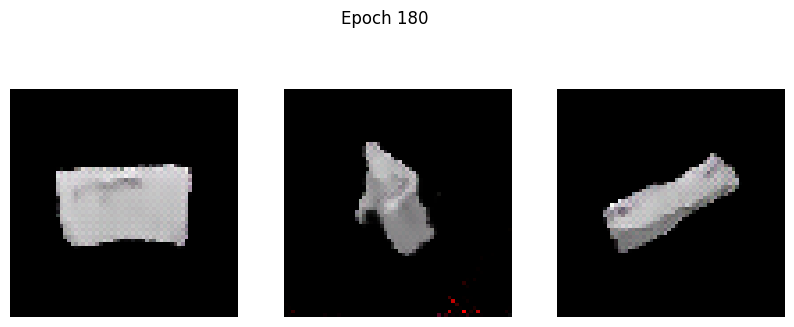

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.6587 - g_loss: 3.7623
Epoch 181/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 0.2008 - g_loss: 4.1746

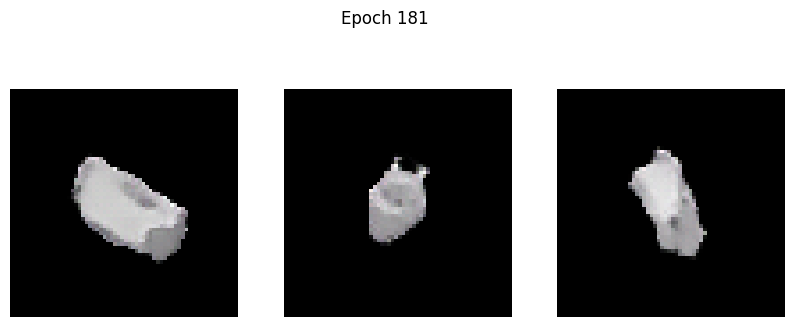

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 0.1933 - g_loss: 4.1692
Epoch 182/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.9202 - g_loss: 3.3047

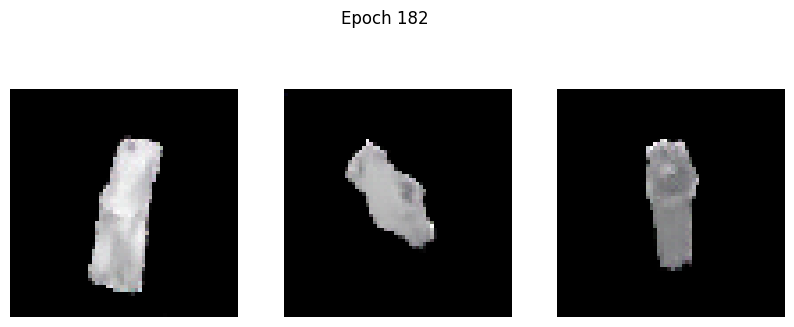

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -0.9212 - g_loss: 3.3063
Epoch 183/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.9816 - g_loss: 3.5946

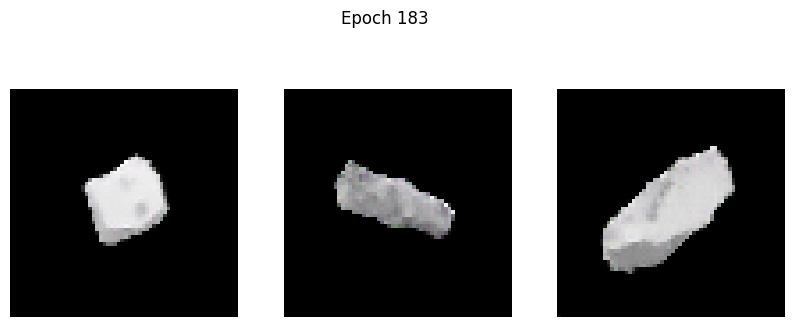

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.9817 - g_loss: 3.5950
Epoch 184/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.8413 - g_loss: 3.6012

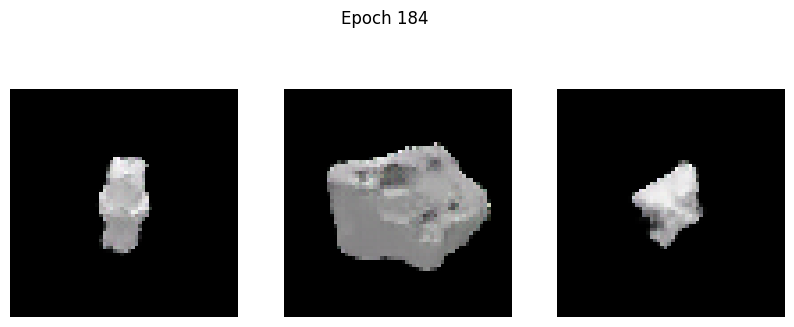

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.8423 - g_loss: 3.6022
Epoch 185/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.9160 - g_loss: 3.7089

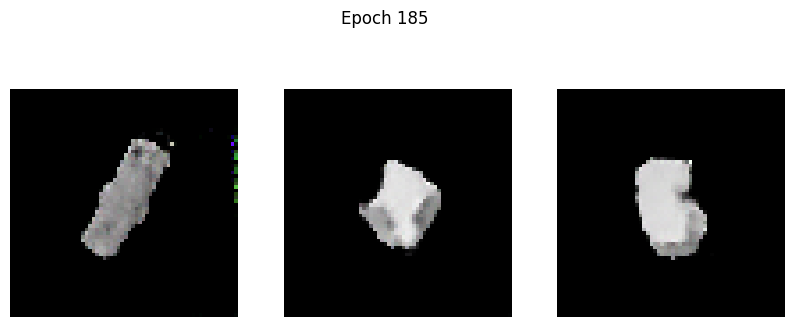

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.9147 - g_loss: 3.7098
Epoch 186/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.1695 - g_loss: 4.1721

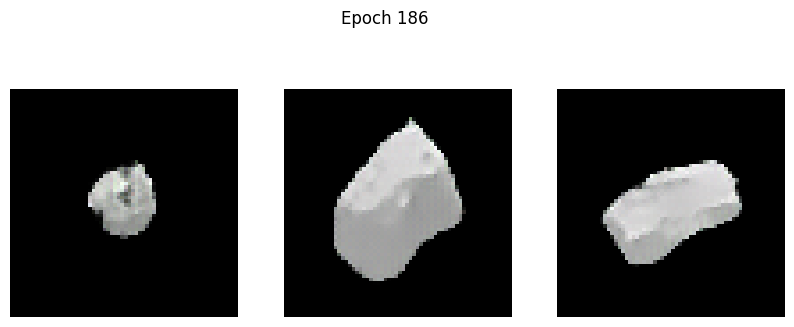

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.1675 - g_loss: 4.1737
Epoch 187/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.0417 - g_loss: 3.4221

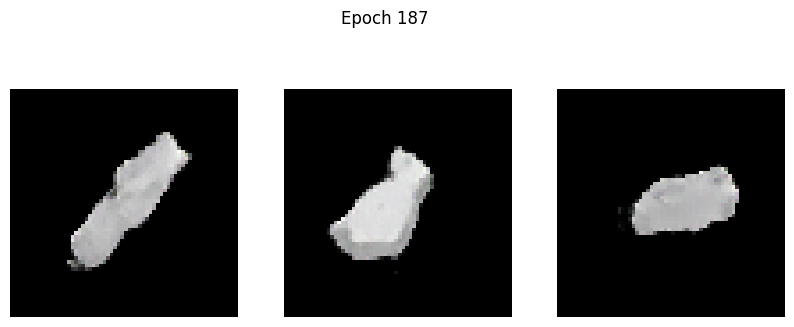

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.0422 - g_loss: 3.4219
Epoch 188/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.1984 - g_loss: 3.6991

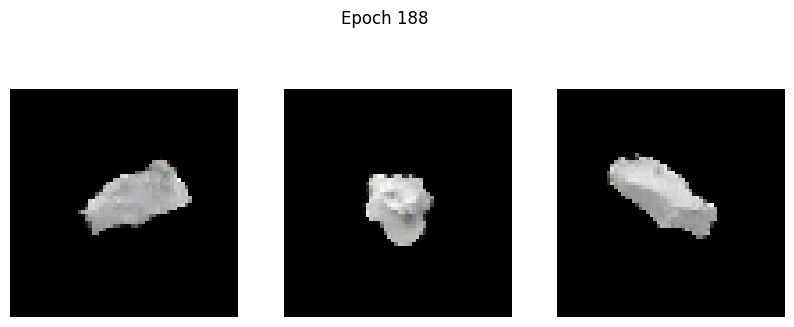

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.1982 - g_loss: 3.6989
Epoch 189/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.2767 - g_loss: 3.6081

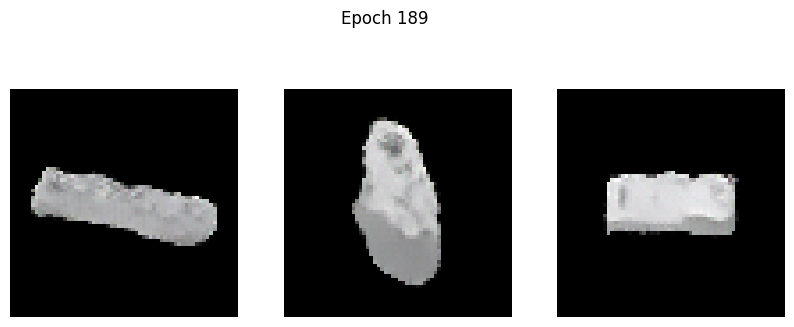

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.2768 - g_loss: 3.6091
Epoch 190/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.5089 - g_loss: 3.8544

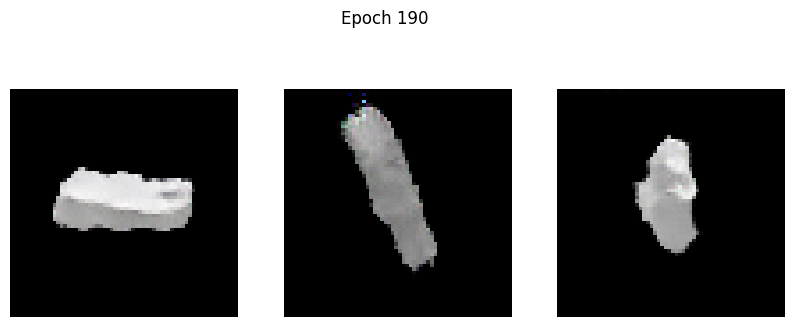

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.5037 - g_loss: 3.8563
Epoch 191/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.8330 - g_loss: 3.7938

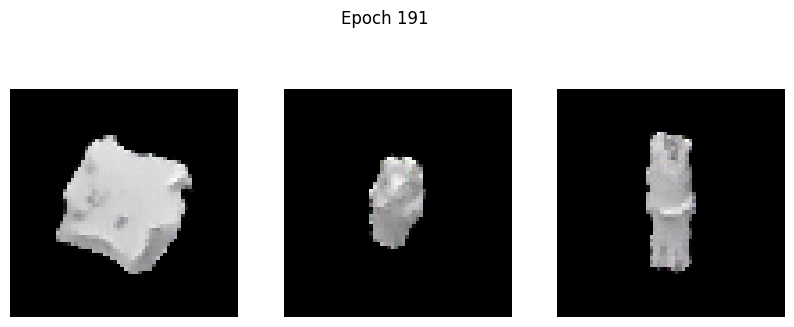

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.8352 - g_loss: 3.7932
Epoch 192/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.2572 - g_loss: 4.3769

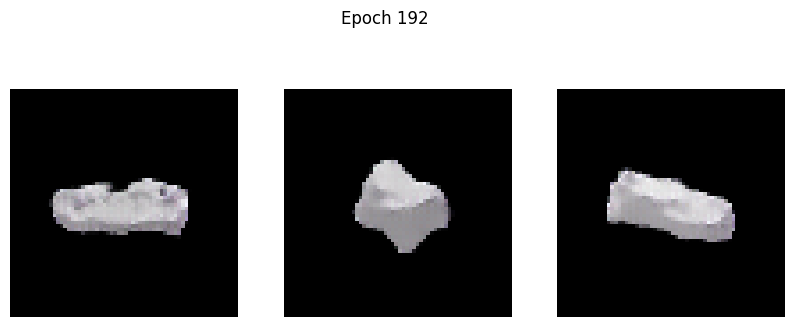

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.2554 - g_loss: 4.3760
Epoch 193/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.4047 - g_loss: 3.3808

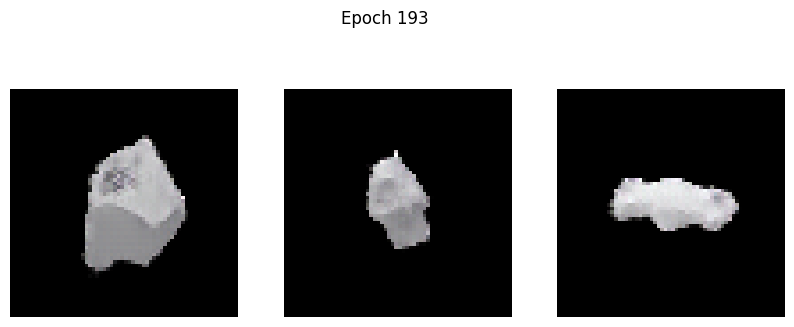

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.4047 - g_loss: 3.3814
Epoch 194/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.3898 - g_loss: 3.5029

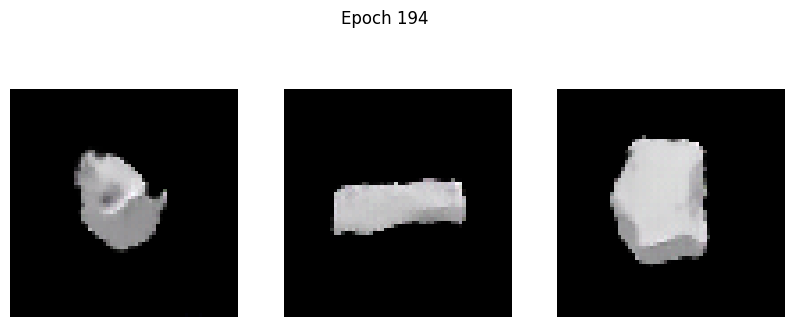

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.3918 - g_loss: 3.5040
Epoch 195/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.0509 - g_loss: 3.8368

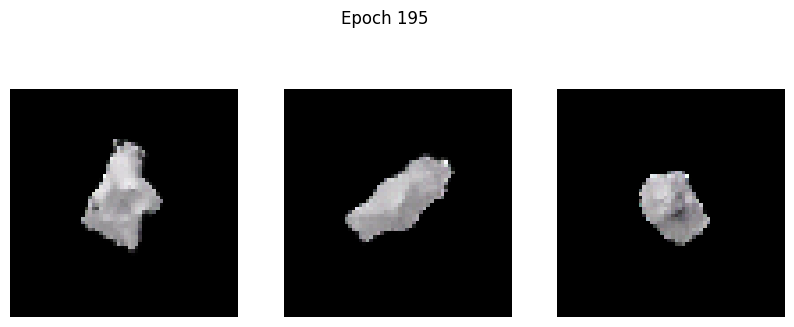

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.0450 - g_loss: 3.8355
Epoch 196/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.1156 - g_loss: 4.6540

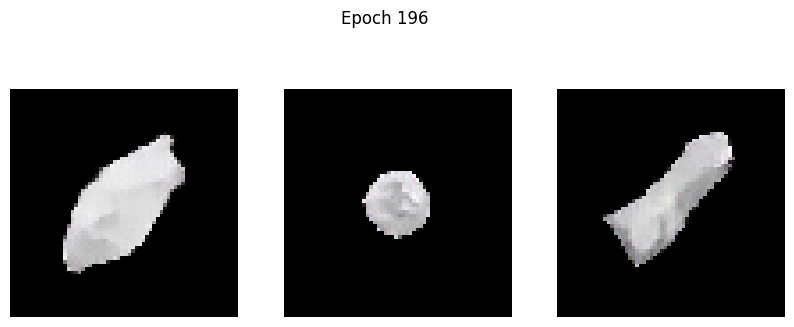

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.1143 - g_loss: 4.6539
Epoch 197/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.8184 - g_loss: 3.8044

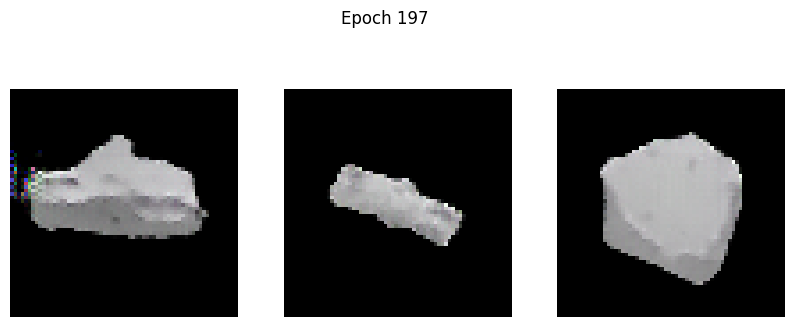

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.8148 - g_loss: 3.8044
Epoch 198/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.6431 - g_loss: 3.7828

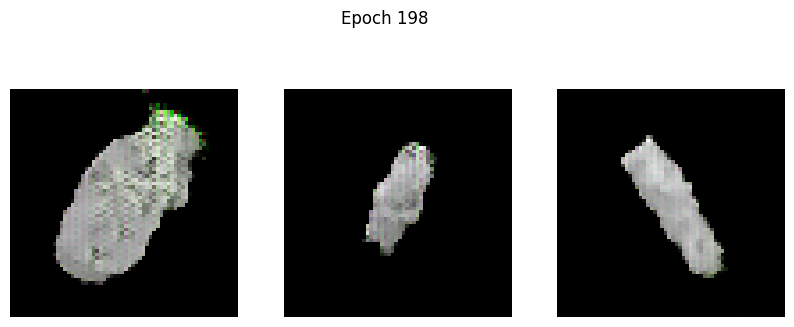

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.6360 - g_loss: 3.7903
Epoch 199/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -0.7764 - g_loss: 4.5671

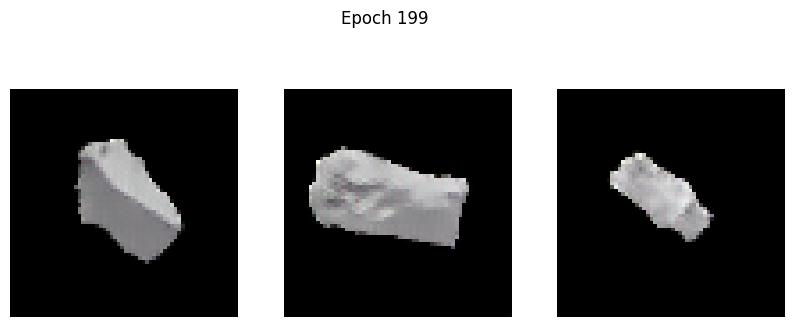

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - d_loss: -0.7805 - g_loss: 4.5651
Epoch 200/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.5569 - g_loss: 3.4434

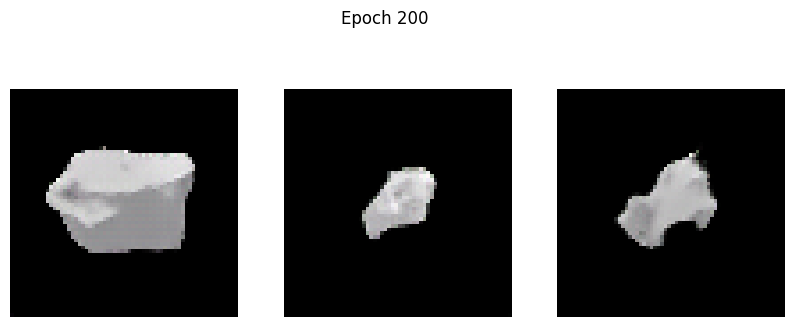

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.5541 - g_loss: 3.4443
Epoch 201/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.5463 - g_loss: 3.6009

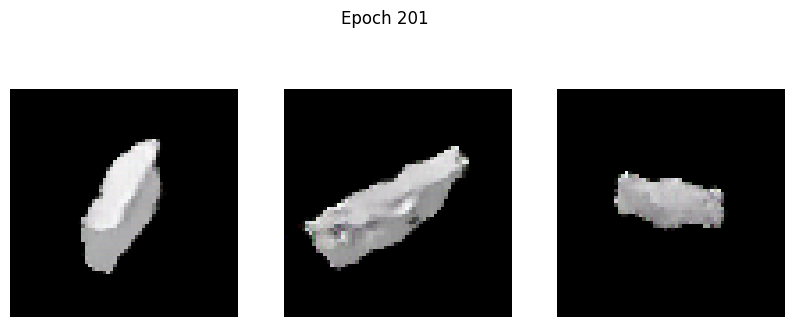

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.5464 - g_loss: 3.6025
Epoch 202/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.3200 - g_loss: 3.8769

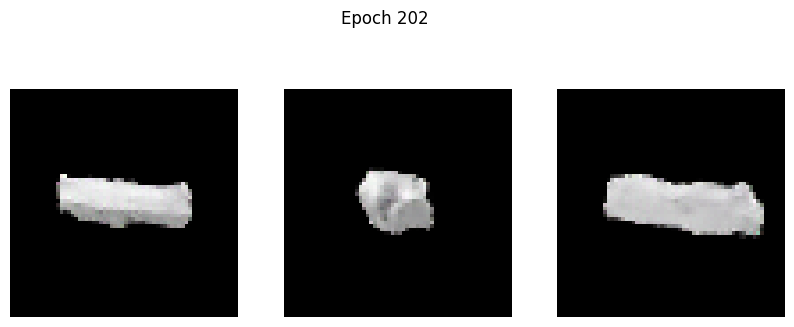

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.3186 - g_loss: 3.8779
Epoch 203/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.4748 - g_loss: 4.1777

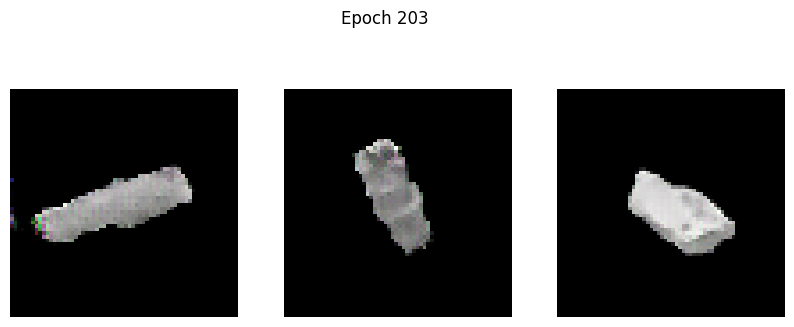

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -2.4696 - g_loss: 4.1791
Epoch 204/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -0.7890 - g_loss: 5.0979

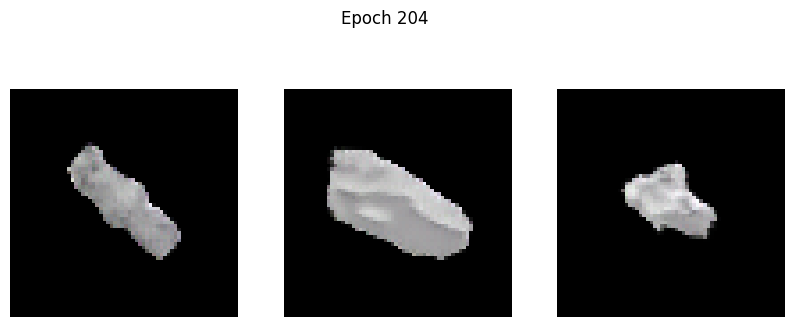

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -0.7870 - g_loss: 5.0991
Epoch 205/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.9011 - g_loss: 3.4445

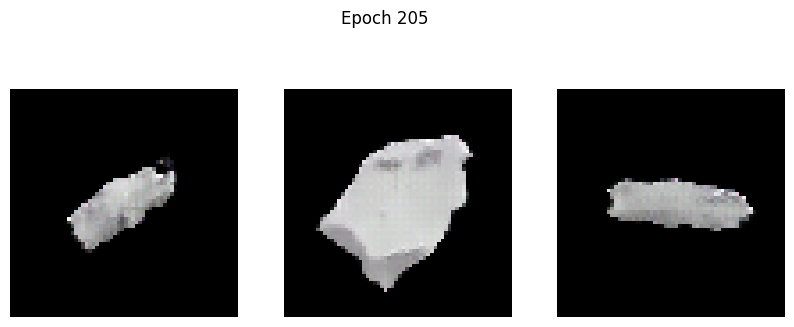

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -2.9010 - g_loss: 3.4447
Epoch 206/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.0607 - g_loss: 3.7956

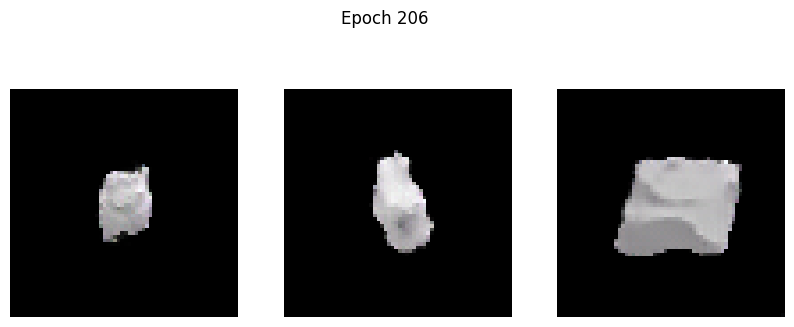

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -3.0623 - g_loss: 3.7957
Epoch 207/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.4090 - g_loss: 4.5713

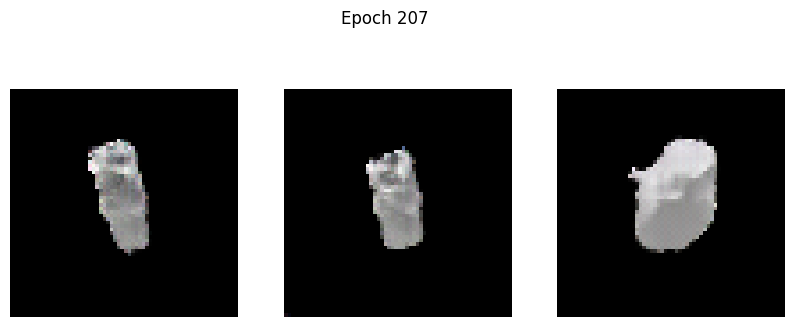

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -3.4036 - g_loss: 4.5712
Epoch 208/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.5530 - g_loss: 4.0621

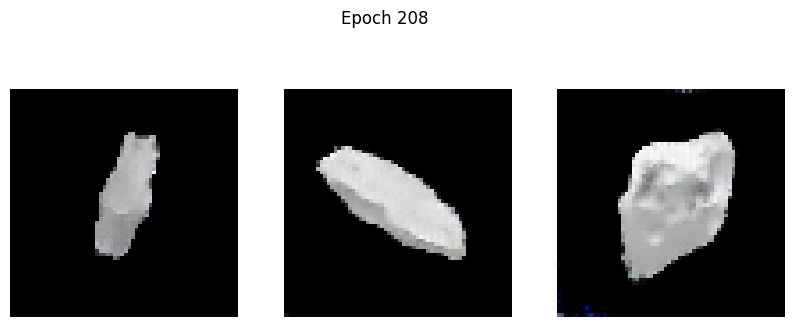

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.5576 - g_loss: 4.0629
Epoch 209/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 3.8046 - g_loss: 6.1323

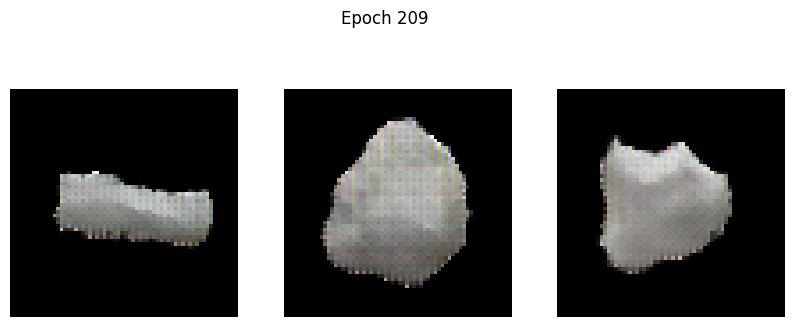

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: 3.9491 - g_loss: 6.1826
Epoch 210/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 3.1339 - g_loss: 8.0555

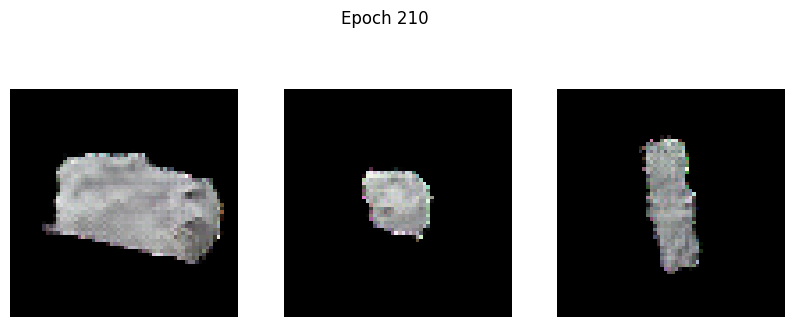

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 3.1250 - g_loss: 8.0430
Epoch 211/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -0.0976 - g_loss: 4.3569

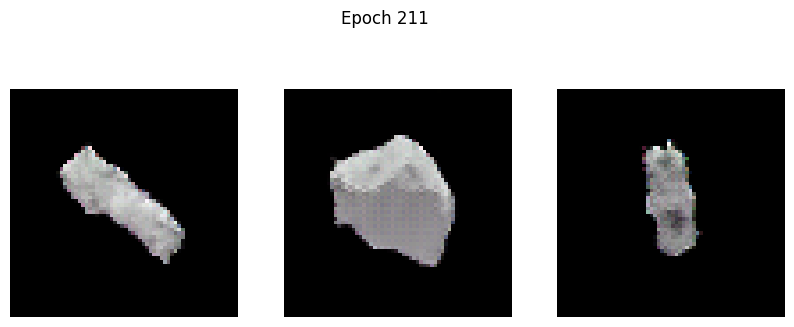

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -0.1004 - g_loss: 4.3522
Epoch 212/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -0.6263 - g_loss: 3.3958

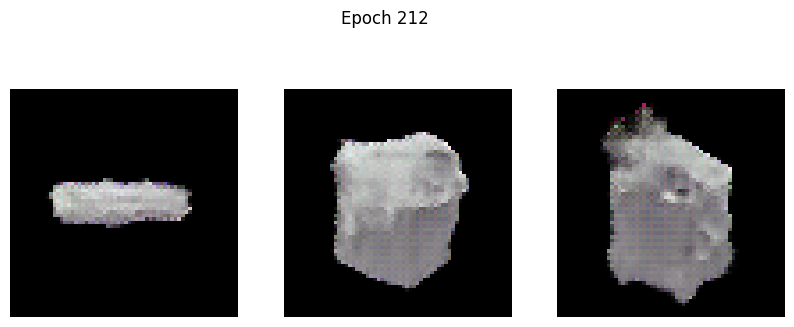

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -0.6307 - g_loss: 3.3939
Epoch 213/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: -1.6847 - g_loss: 3.0519

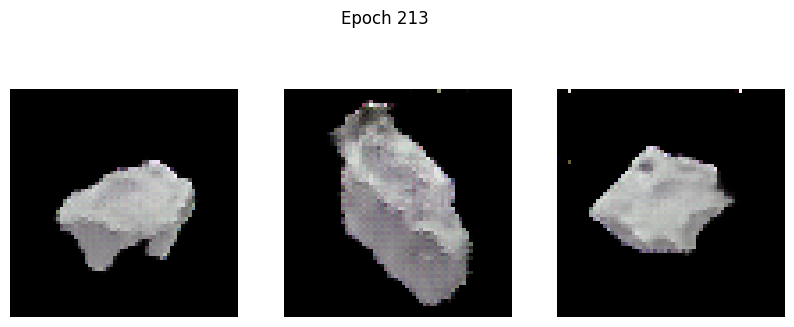

102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 123ms/step - d_loss: -1.6862 - g_loss: 3.0499
Epoch 214/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.4631 - g_loss: 2.5899

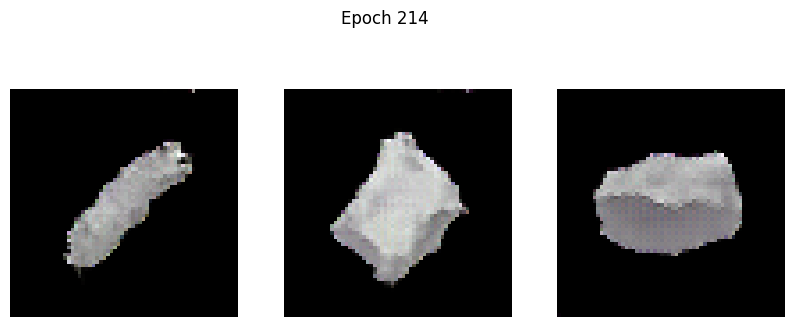

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.4633 - g_loss: 2.5898
Epoch 215/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -1.9044 - g_loss: 2.4620

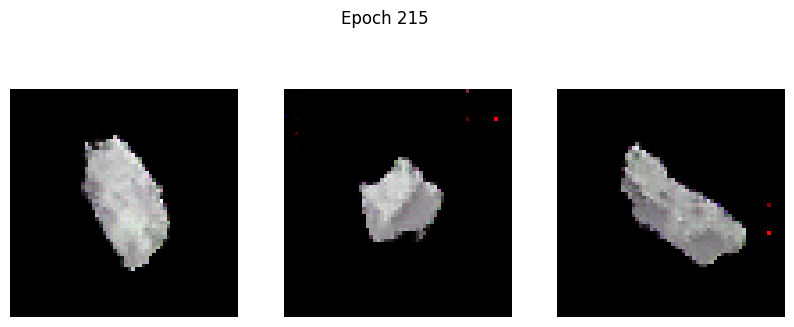

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -1.9092 - g_loss: 2.4629
Epoch 216/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.1665 - g_loss: 2.4735

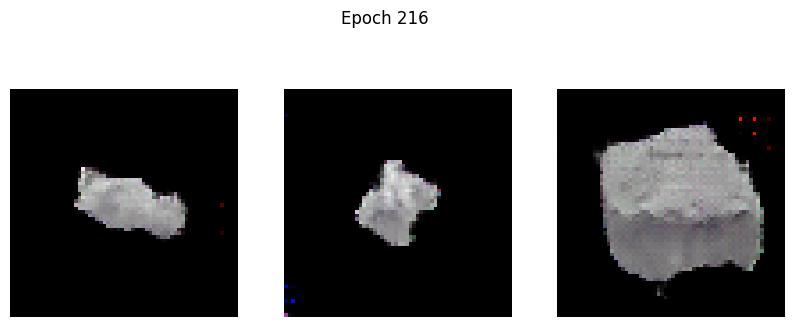

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.1689 - g_loss: 2.4743
Epoch 217/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -3.3606 - g_loss: 2.5069

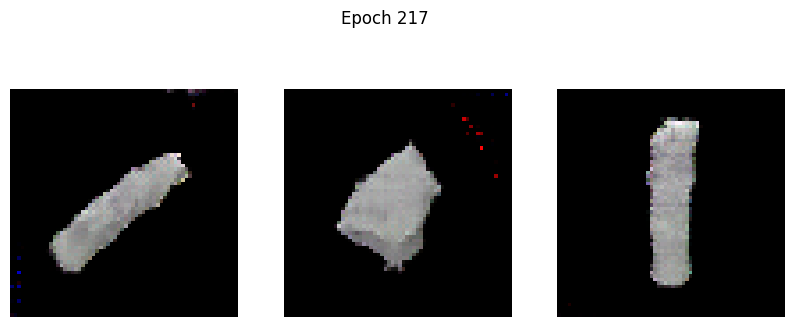

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 119ms/step - d_loss: -3.3587 - g_loss: 2.5073
Epoch 218/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.0827 - g_loss: 2.4604

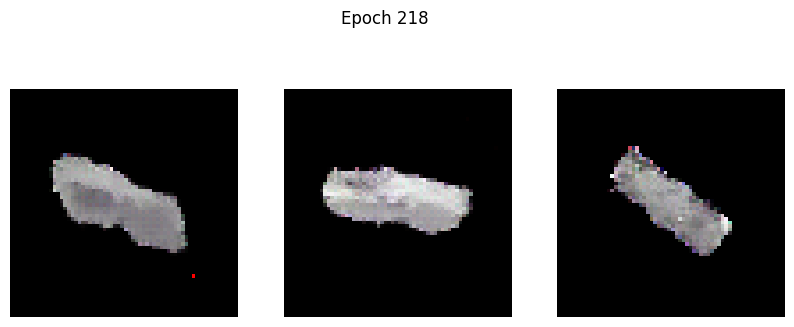

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.0852 - g_loss: 2.4607
Epoch 219/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -2.8110 - g_loss: 2.5326

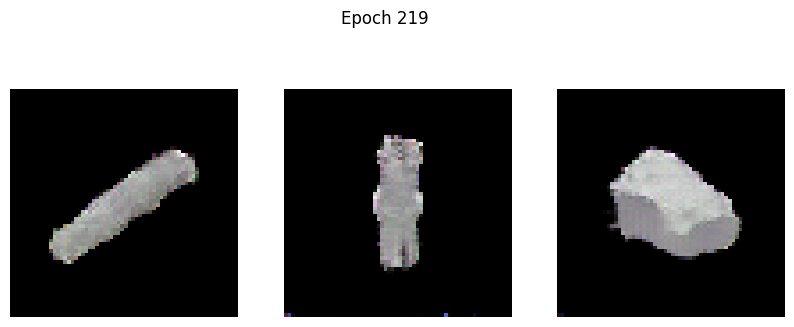

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.8155 - g_loss: 2.5329
Epoch 220/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.3185 - g_loss: 2.8320

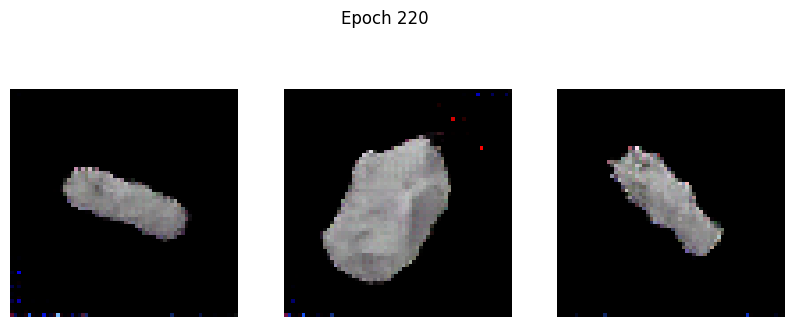

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.3246 - g_loss: 2.8323
Epoch 221/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 1.0021 - g_loss: 4.3354

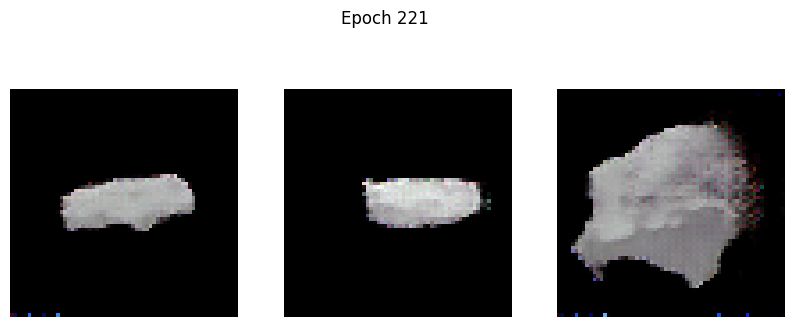

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 0.9908 - g_loss: 4.3334
Epoch 222/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -3.4030 - g_loss: 3.0306

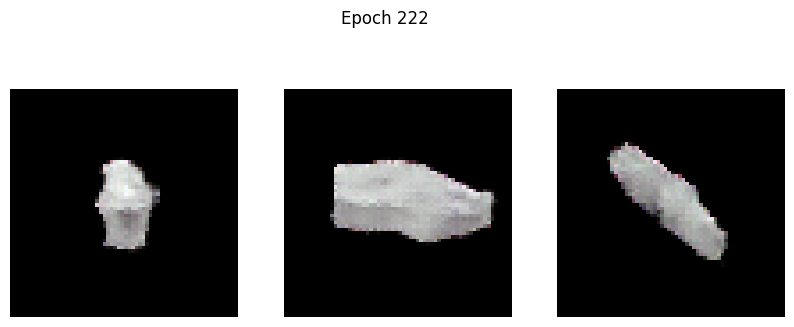

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 118ms/step - d_loss: -3.4015 - g_loss: 3.0299
Epoch 223/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.5761 - g_loss: 2.8639

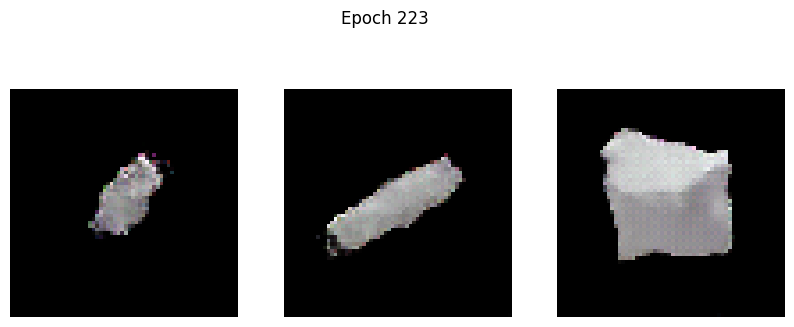

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.5784 - g_loss: 2.8632
Epoch 224/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -4.2359 - g_loss: 2.7661

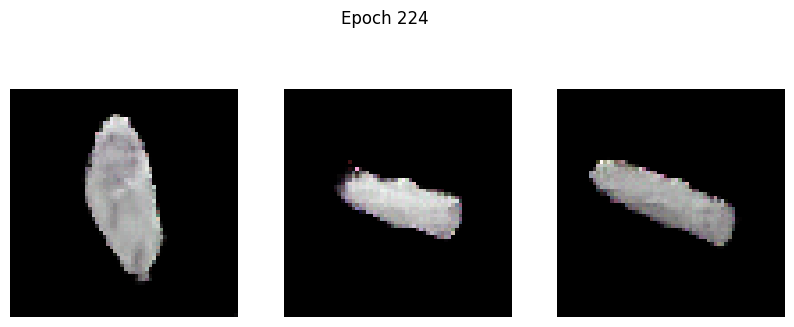

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -4.2302 - g_loss: 2.7673
Epoch 225/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -3.7633 - g_loss: 3.0307

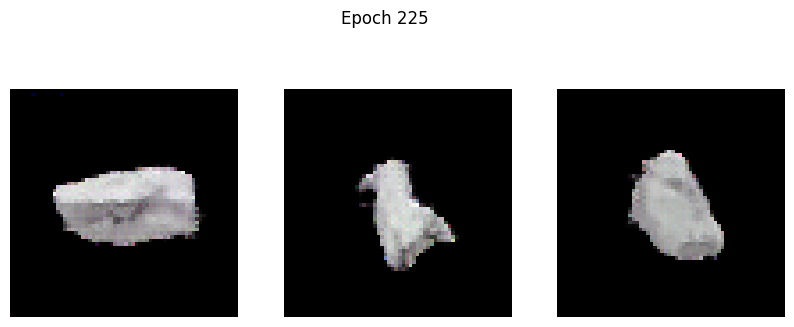

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.7631 - g_loss: 3.0302
Epoch 226/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.8818 - g_loss: 3.1798

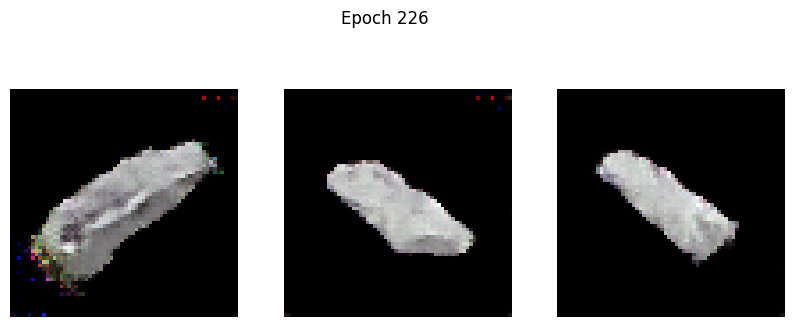

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.8891 - g_loss: 3.1802
Epoch 227/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.8801 - g_loss: 3.5265

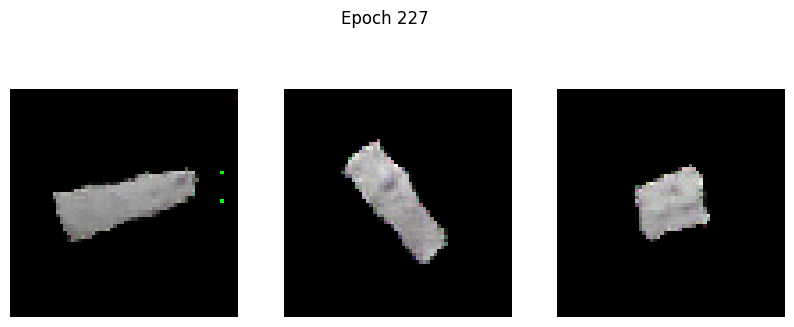

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -3.8770 - g_loss: 3.5251
Epoch 228/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.8850 - g_loss: 3.5176

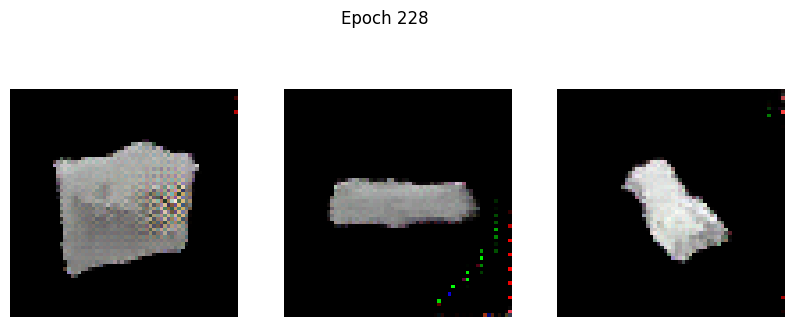

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -3.8716 - g_loss: 3.5189
Epoch 229/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.5111 - g_loss: 4.7480

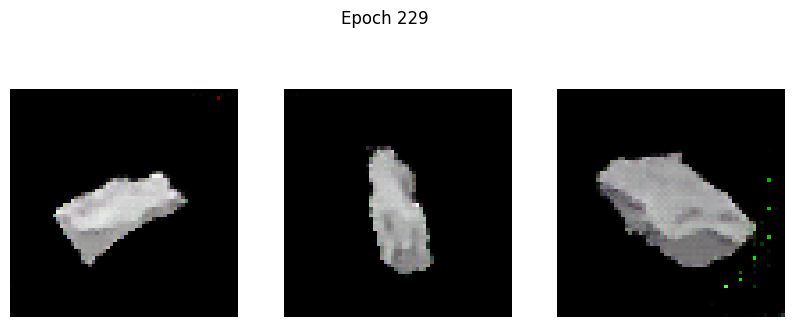

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.5303 - g_loss: 4.7422
Epoch 230/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -4.5803 - g_loss: 3.1800

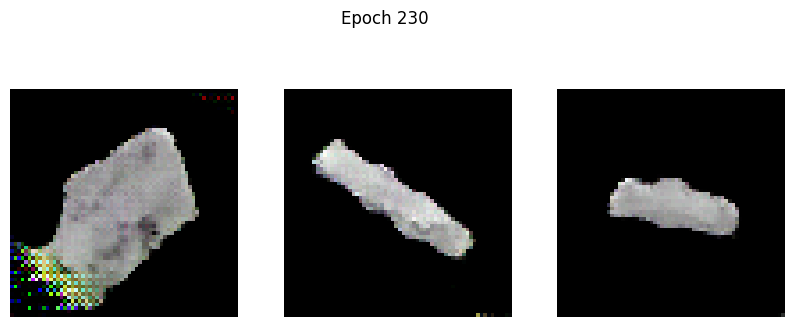

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.5803 - g_loss: 3.1801
Epoch 231/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.9961 - g_loss: 3.8692

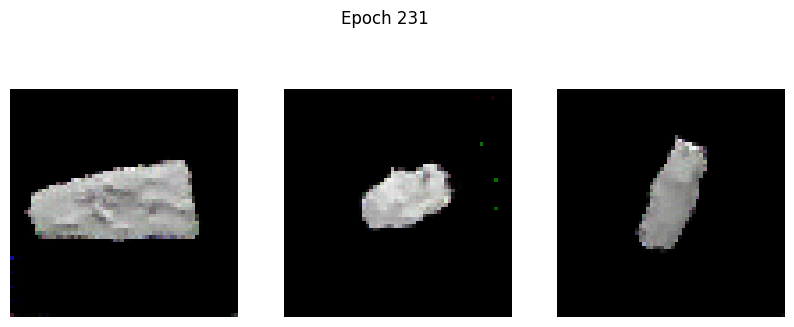

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.0150 - g_loss: 3.8675
Epoch 232/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.9247 - g_loss: 3.5143

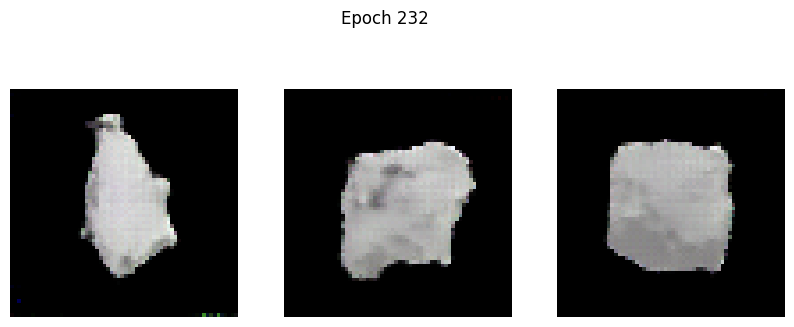

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.9261 - g_loss: 3.5169
Epoch 233/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.1872 - g_loss: 3.6761

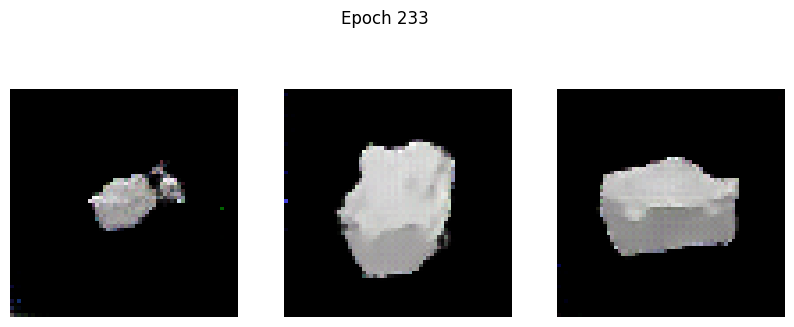

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.1876 - g_loss: 3.6781
Epoch 234/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.1433 - g_loss: 3.9719

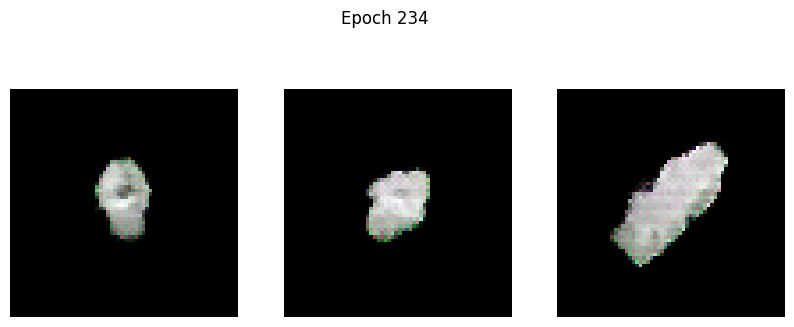

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.1029 - g_loss: 3.9917
Epoch 235/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -1.4895 - g_loss: 6.5085

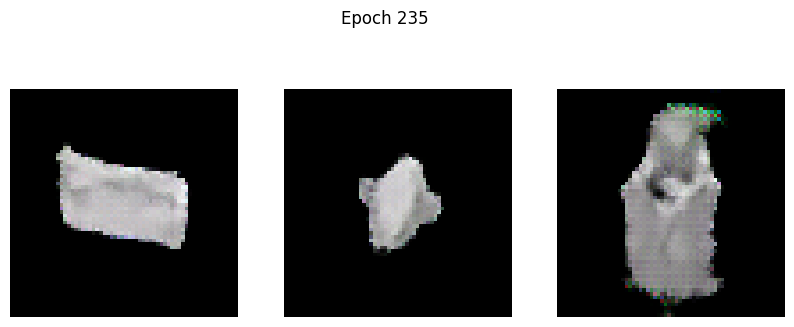

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -1.5050 - g_loss: 6.4954
Epoch 236/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -6.0985 - g_loss: 3.5678

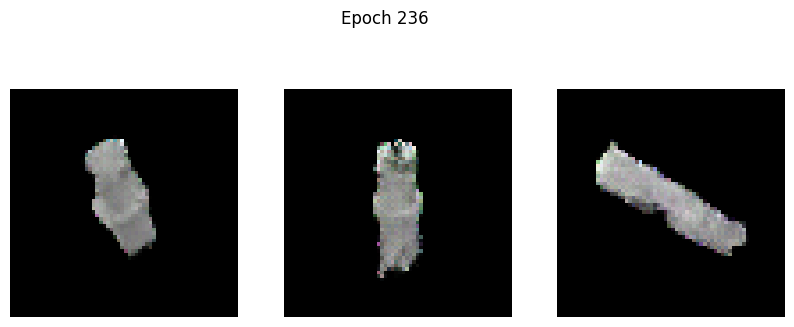

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -6.0939 - g_loss: 3.5664
Epoch 237/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.5535 - g_loss: 3.1925

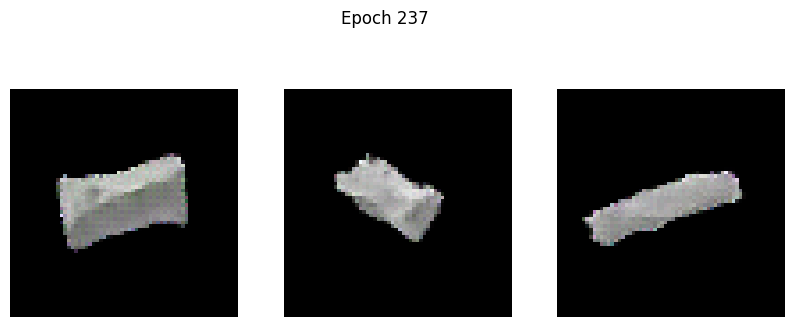

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.5544 - g_loss: 3.1937
Epoch 238/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.6950 - g_loss: 3.4247

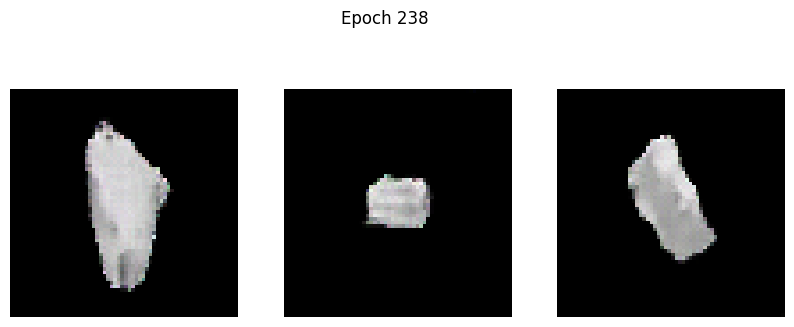

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.7049 - g_loss: 3.4248
Epoch 239/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.4180 - g_loss: 3.6122

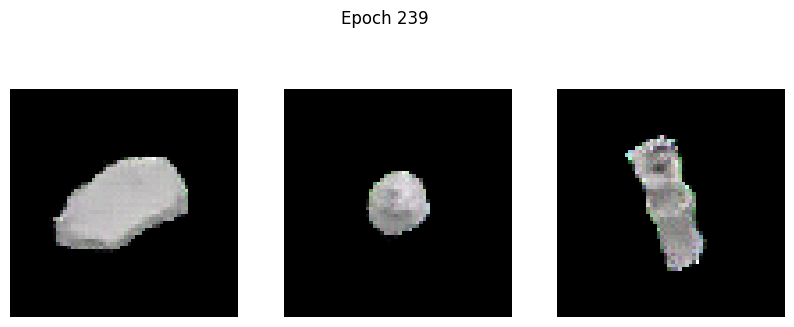

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.4181 - g_loss: 3.6130
Epoch 240/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.1995 - g_loss: 3.6242

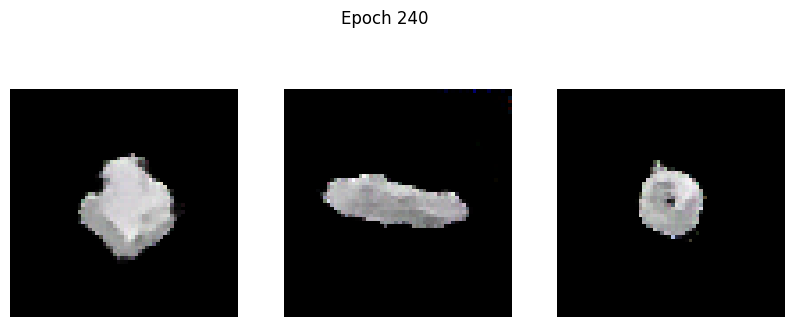

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.2065 - g_loss: 3.6256
Epoch 241/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -4.4825 - g_loss: 3.8444

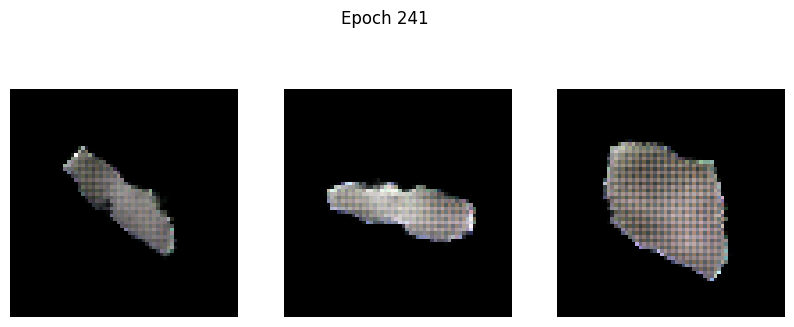

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -4.4748 - g_loss: 3.8546
Epoch 242/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.2638 - g_loss: 9.5468

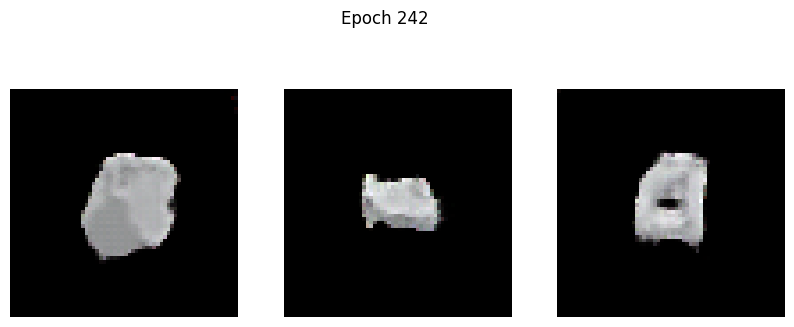

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.2642 - g_loss: 9.5132
Epoch 243/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.5345 - g_loss: 5.2542

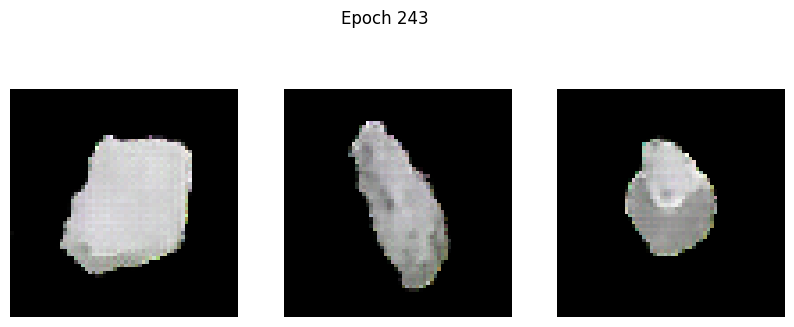

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -3.5280 - g_loss: 5.2579
Epoch 244/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -6.4566 - g_loss: 4.3271

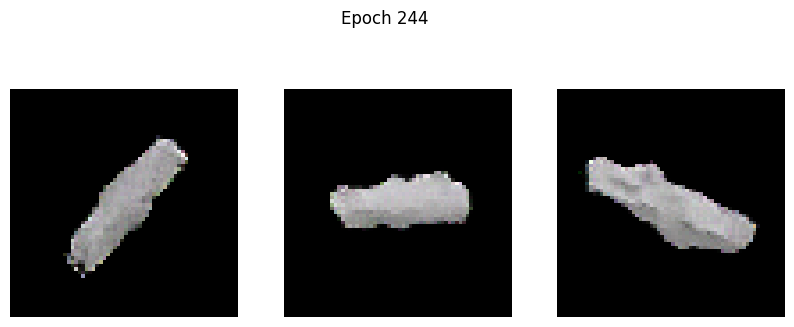

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -6.4600 - g_loss: 4.3234
Epoch 245/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.3198 - g_loss: 3.7045

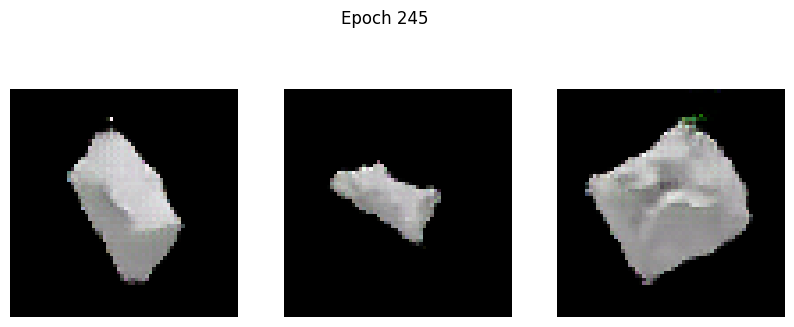

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -7.3167 - g_loss: 3.7072
Epoch 246/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.2048 - g_loss: 5.0012

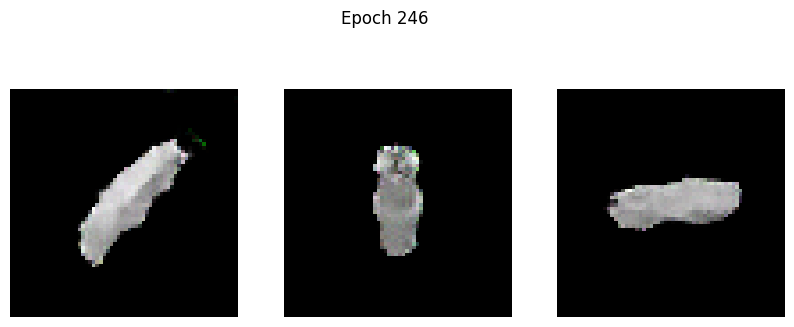

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.2155 - g_loss: 4.9955
Epoch 247/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.9246 - g_loss: 3.7704

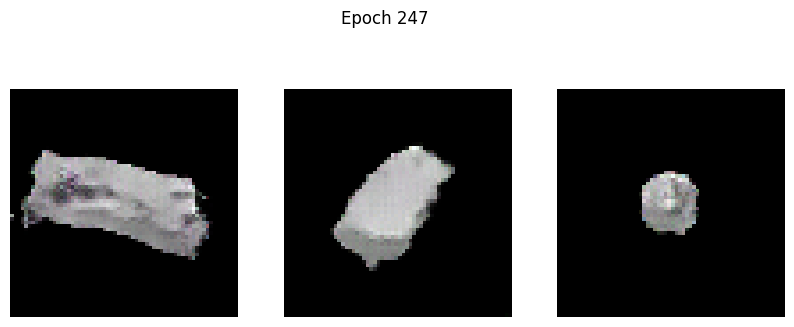

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.9238 - g_loss: 3.7725
Epoch 248/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.6853 - g_loss: 4.5724

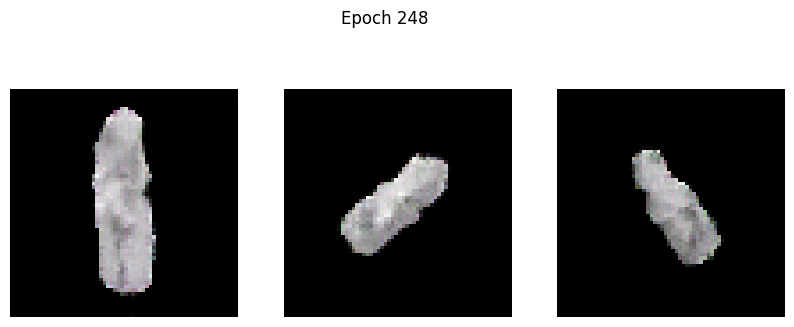

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.6845 - g_loss: 4.5712
Epoch 249/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -5.7607 - g_loss: 5.0242

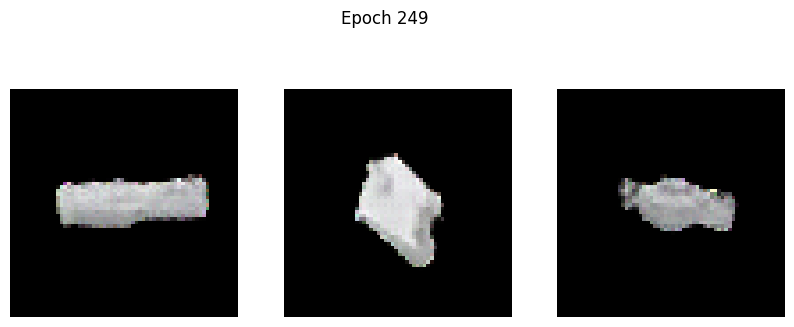

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.7849 - g_loss: 5.0254
Epoch 250/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.5305 - g_loss: 4.2236

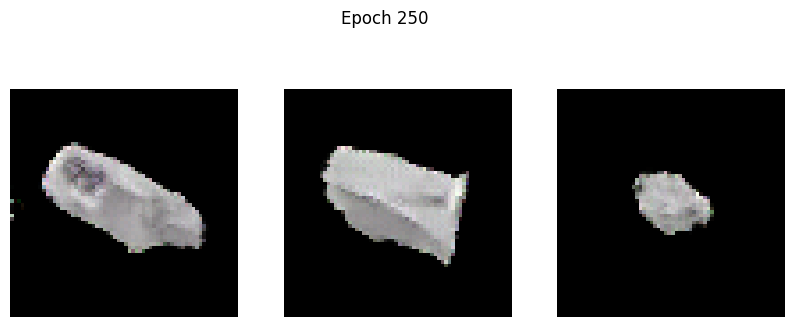

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.5366 - g_loss: 4.2256
Epoch 251/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.5400 - g_loss: 4.4864

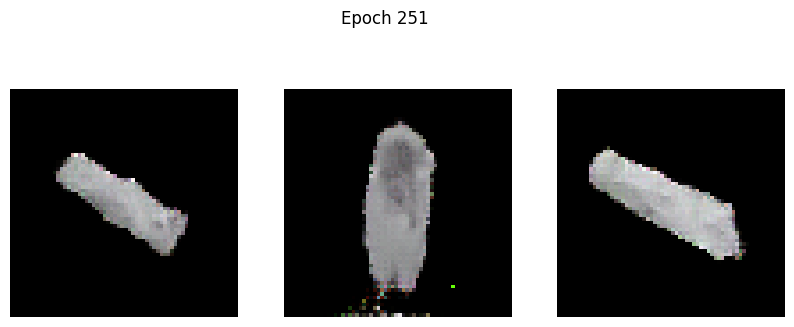

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.5370 - g_loss: 4.4902
Epoch 252/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 8.4500 - g_loss: 12.2057

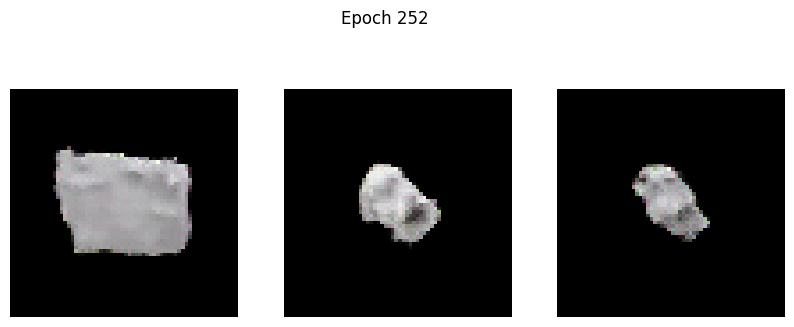

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 8.4221 - g_loss: 12.1994
Epoch 253/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -7.4942 - g_loss: 4.3024

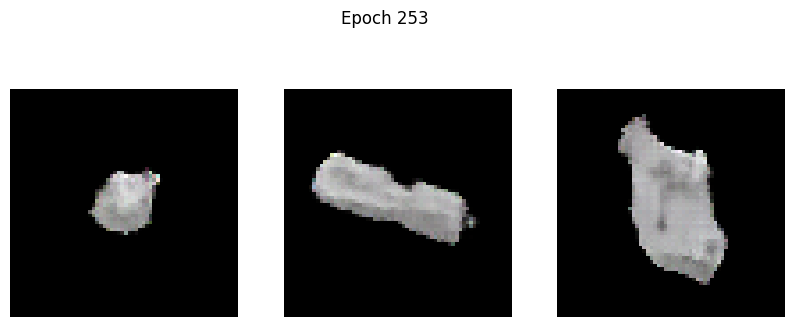

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.4975 - g_loss: 4.3011
Epoch 254/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -7.7758 - g_loss: 3.9339

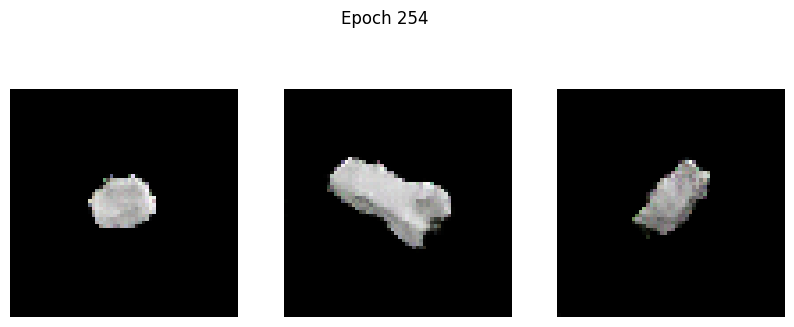

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.7806 - g_loss: 3.9345
Epoch 255/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -8.4287 - g_loss: 4.6522

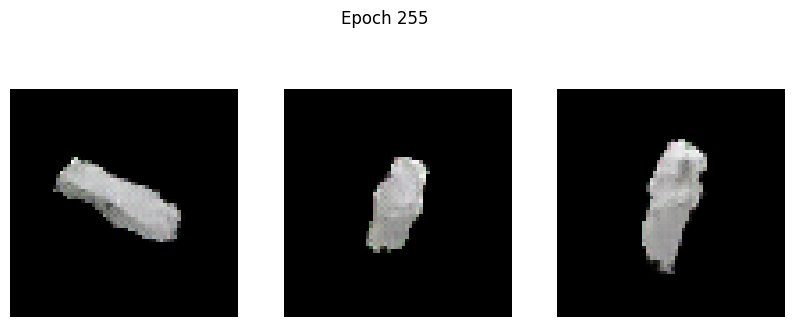

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -8.4292 - g_loss: 4.6507
Epoch 256/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -8.4465 - g_loss: 4.5082

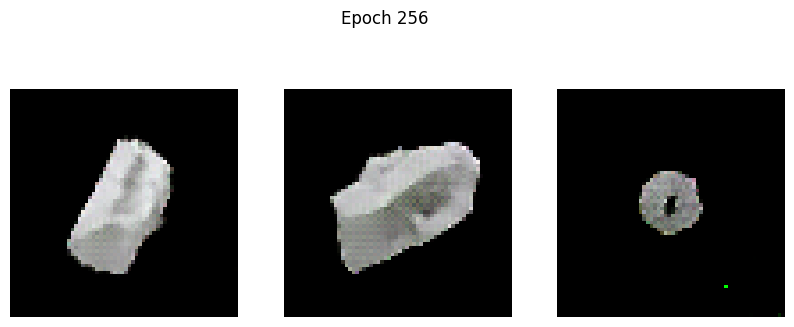

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -8.4409 - g_loss: 4.5127
Epoch 257/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -10.4616 - g_loss: 4.2883

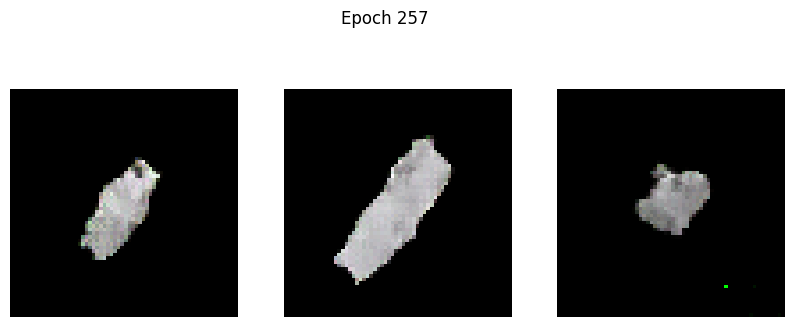

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -10.4645 - g_loss: 4.2866
Epoch 258/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -10.3052 - g_loss: 3.7785

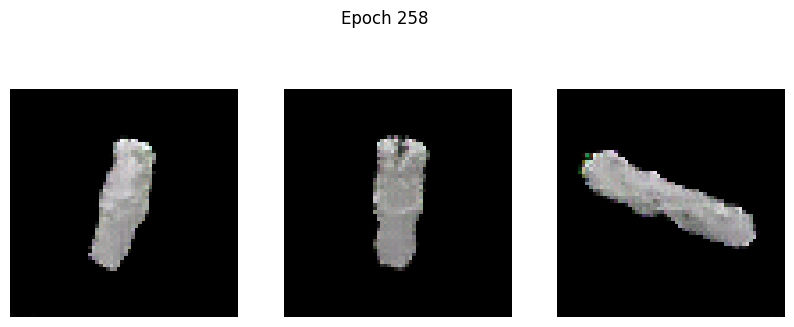

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -10.3147 - g_loss: 3.7801
Epoch 259/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.2028 - g_loss: 5.2637

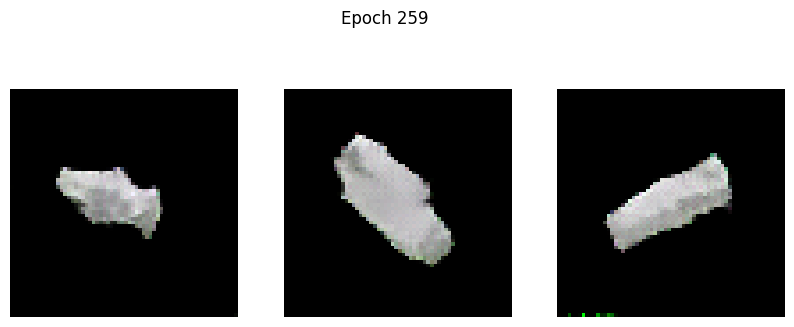

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.1915 - g_loss: 5.2744
Epoch 260/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -9.3752 - g_loss: 6.0747

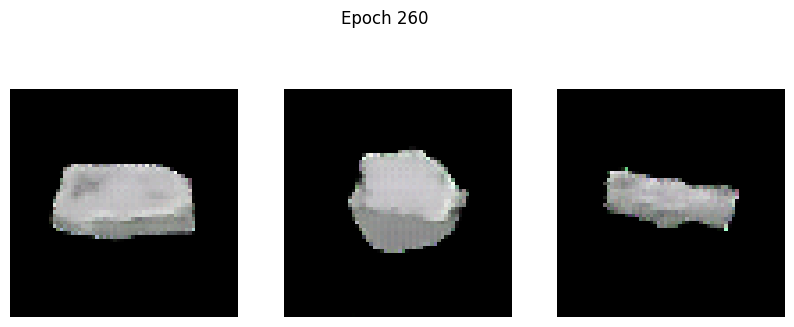

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -9.3841 - g_loss: 6.0680
Epoch 261/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -17.7594 - g_loss: 4.1268

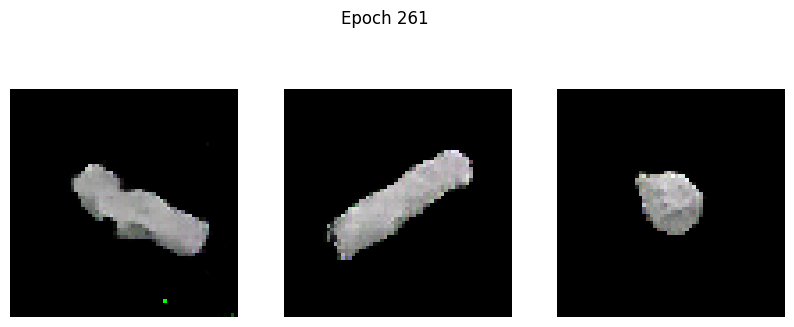

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -17.7251 - g_loss: 4.1283
Epoch 262/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -13.0300 - g_loss: 5.8178

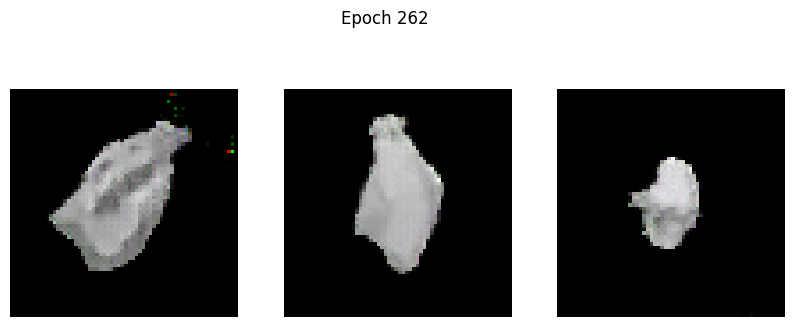

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -13.0301 - g_loss: 5.8150
Epoch 263/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -7.5416 - g_loss: 7.1449

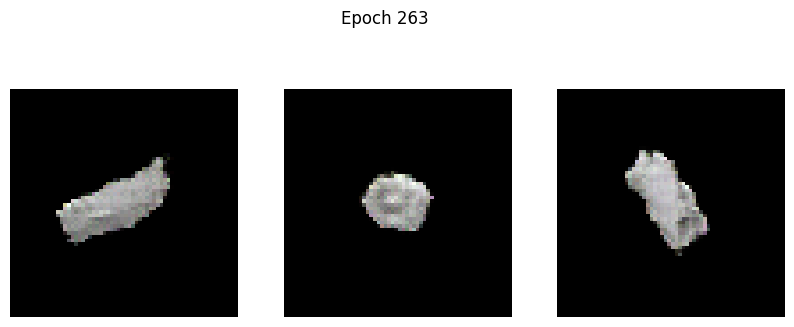

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -7.5659 - g_loss: 7.1360
Epoch 264/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -13.0542 - g_loss: 4.8537

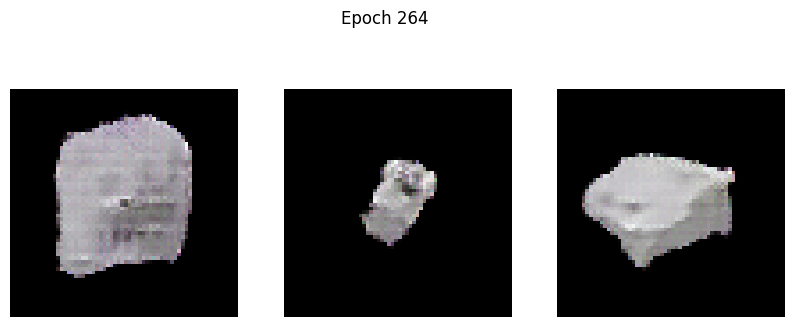

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -13.0557 - g_loss: 4.8543
Epoch 265/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -14.8030 - g_loss: 5.2613

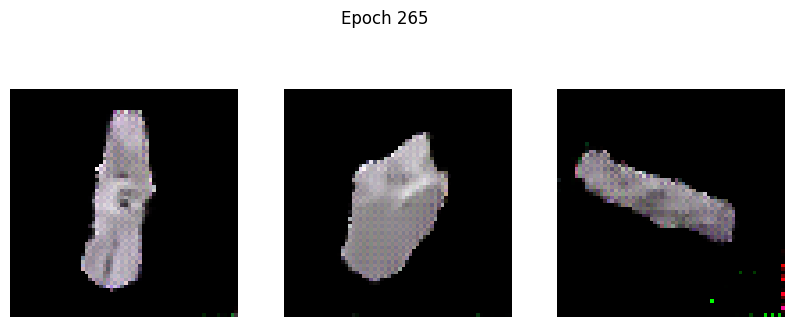

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -14.7835 - g_loss: 5.2622
Epoch 266/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.8773 - g_loss: 6.1669

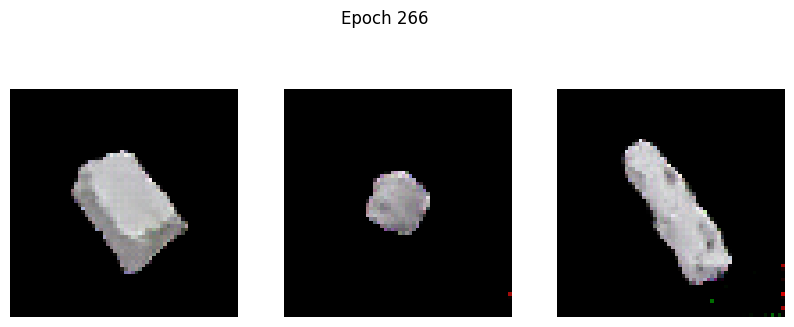

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.8657 - g_loss: 6.1637
Epoch 267/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -16.6302 - g_loss: 4.5467

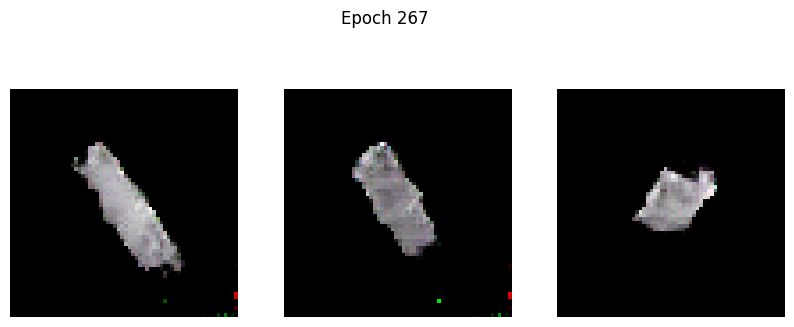

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -16.6332 - g_loss: 4.5490
Epoch 268/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -13.3275 - g_loss: 5.3416

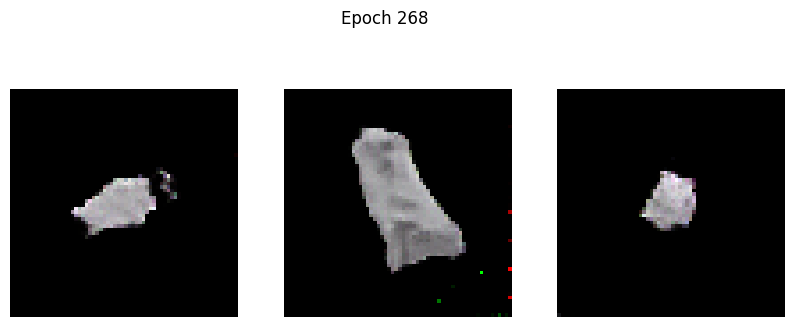

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -13.3633 - g_loss: 5.3419
Epoch 269/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -16.7644 - g_loss: 5.2957

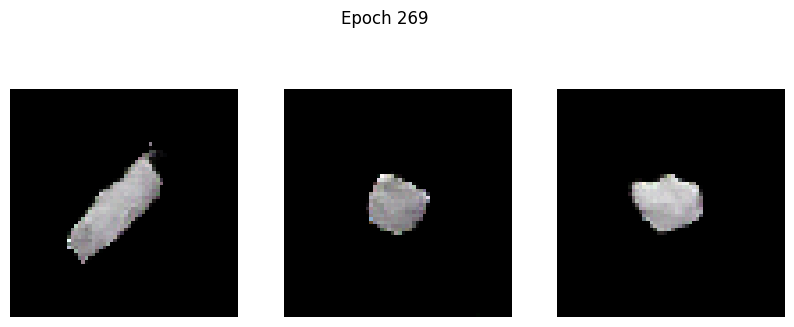

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -16.7688 - g_loss: 5.2958
Epoch 270/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -16.5177 - g_loss: 4.9445

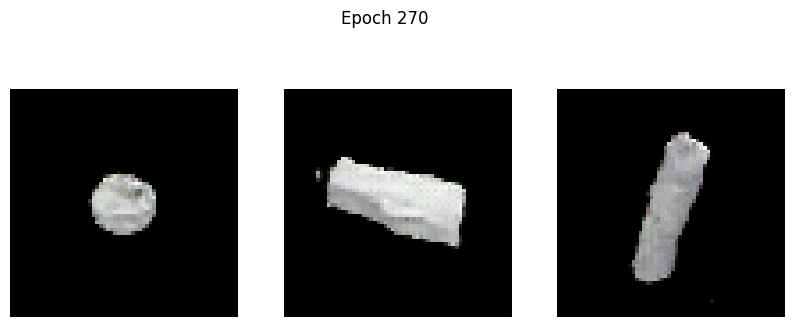

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -16.5402 - g_loss: 4.9479
Epoch 271/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -16.4650 - g_loss: 6.4057

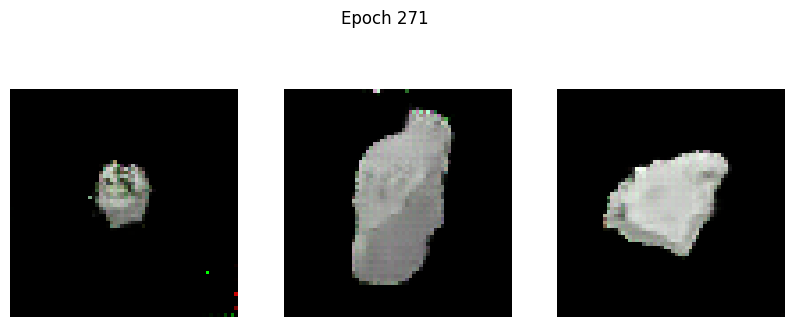

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -16.4534 - g_loss: 6.4062
Epoch 272/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -18.1394 - g_loss: 6.6734

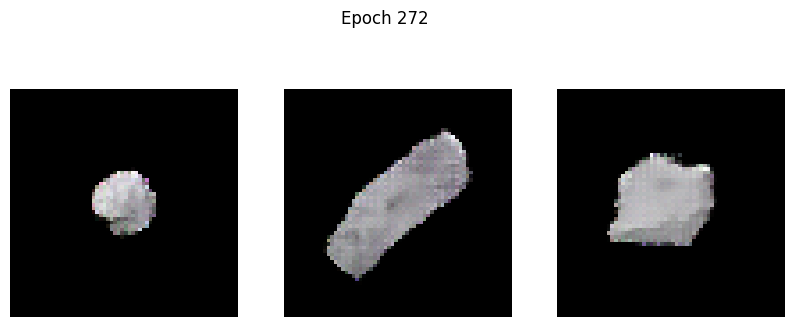

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -18.0938 - g_loss: 6.6891
Epoch 273/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -19.9637 - g_loss: 6.7127

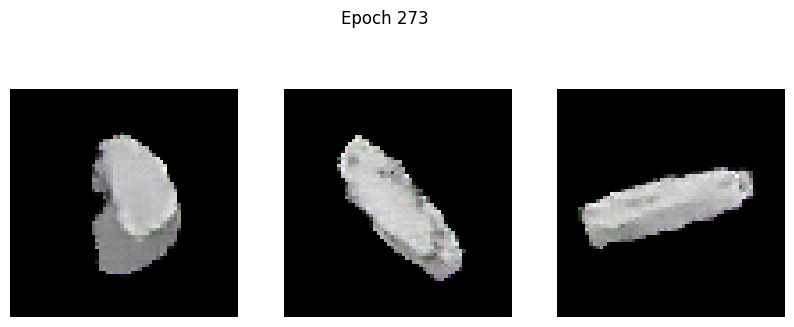

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -19.9463 - g_loss: 6.7063
Epoch 274/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -23.5089 - g_loss: 4.8969

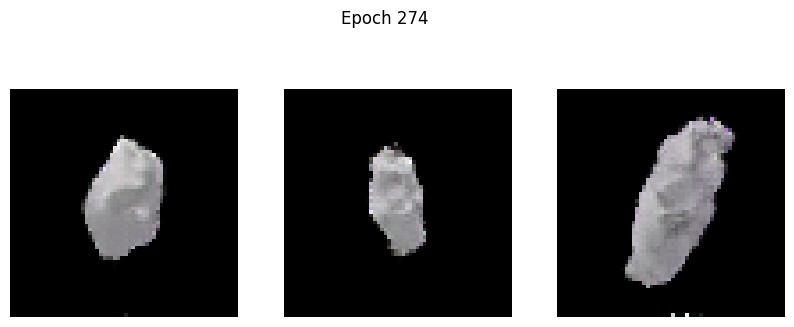

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -23.5030 - g_loss: 4.8976
Epoch 275/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -23.6500 - g_loss: 6.0792

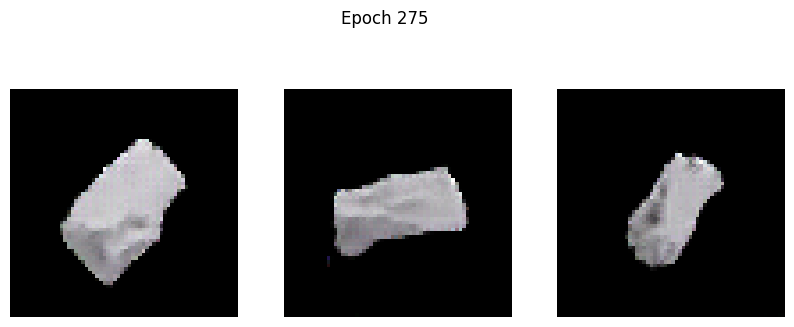

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -23.6483 - g_loss: 6.0797
Epoch 276/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -29.3798 - g_loss: 5.5599

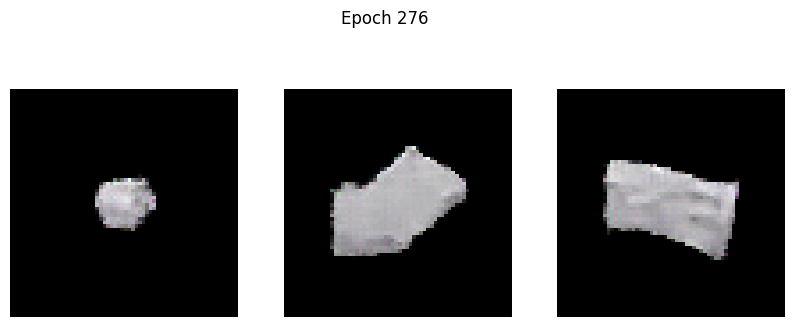

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -29.3226 - g_loss: 5.5604
Epoch 277/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 7.2594 - g_loss: 15.0557

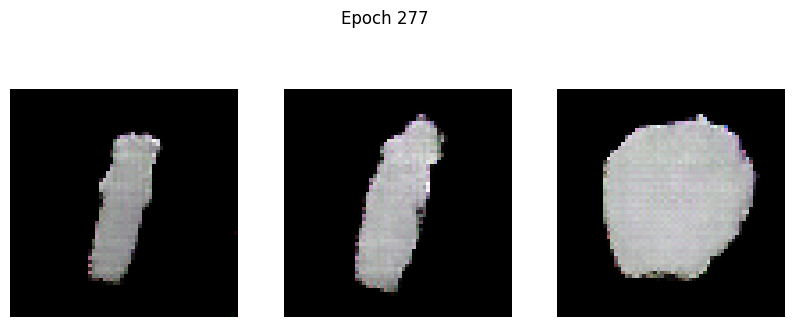

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 6.9915 - g_loss: 15.0069
Epoch 278/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -27.4223 - g_loss: 6.6462

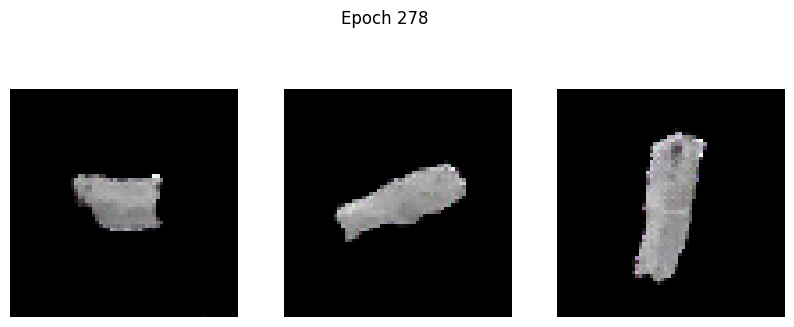

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -27.4054 - g_loss: 6.6383
Epoch 279/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -26.5935 - g_loss: 5.0054

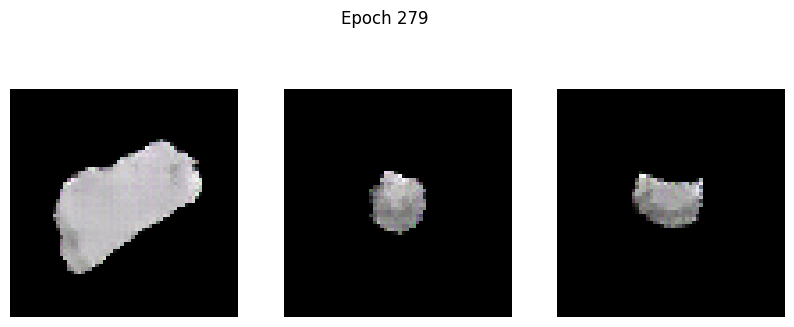

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -26.5943 - g_loss: 5.0037
Epoch 280/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -26.9044 - g_loss: 6.8965

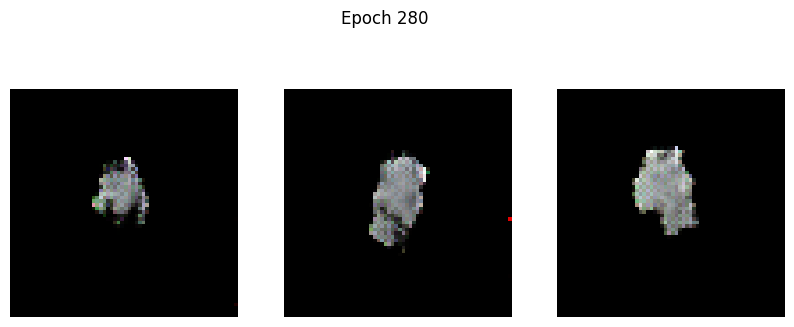

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -26.8606 - g_loss: 6.9199
Epoch 281/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -27.3447 - g_loss: 6.9307

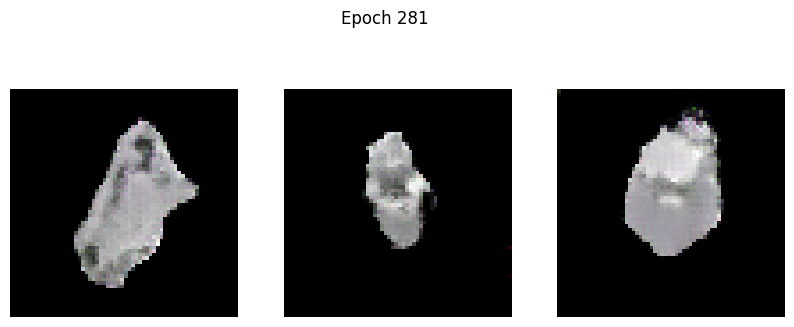

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -27.3797 - g_loss: 6.9254
Epoch 282/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -37.9051 - g_loss: 5.7611

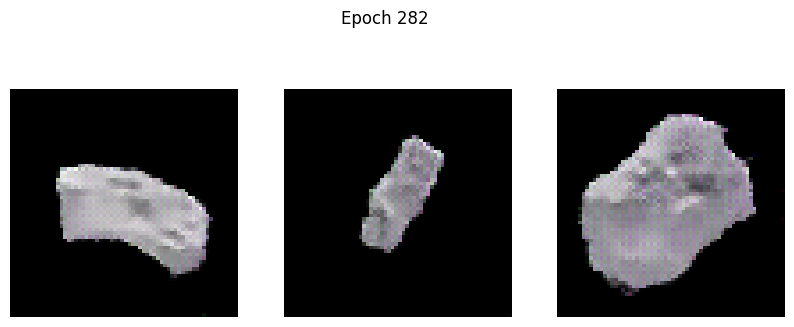

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -37.8460 - g_loss: 5.7606
Epoch 283/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -33.5206 - g_loss: 7.2369

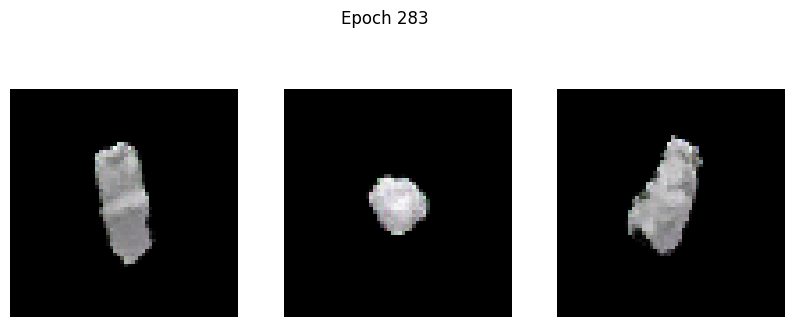

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -33.4865 - g_loss: 7.2329
Epoch 284/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -27.5336 - g_loss: 8.9171

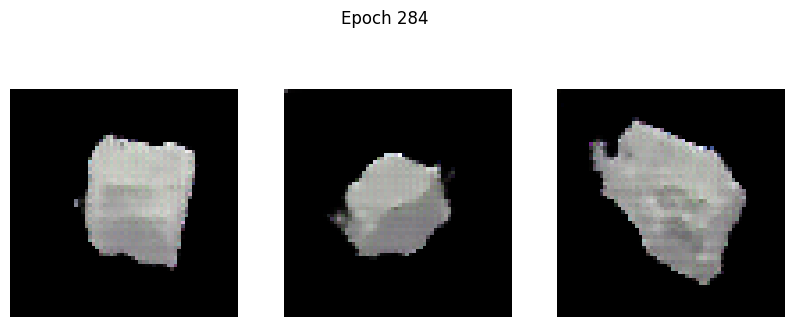

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -27.5405 - g_loss: 8.9250
Epoch 285/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -43.5808 - g_loss: 5.7894

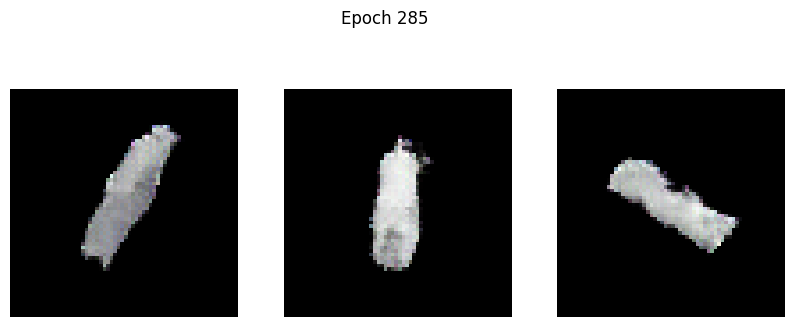

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -43.5573 - g_loss: 5.7933
Epoch 286/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -22.8963 - g_loss: 7.4042

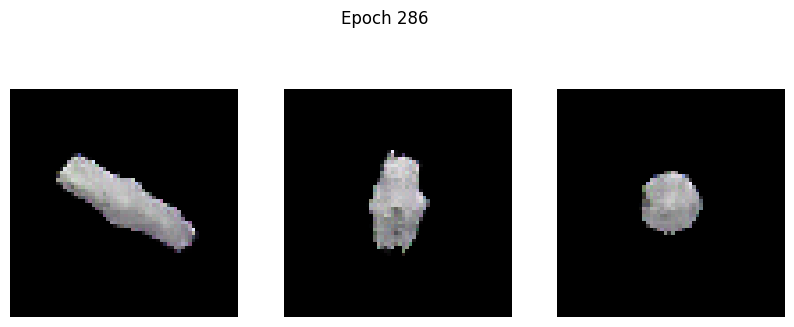

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -23.0125 - g_loss: 7.3973
Epoch 287/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -34.4052 - g_loss: 6.1173

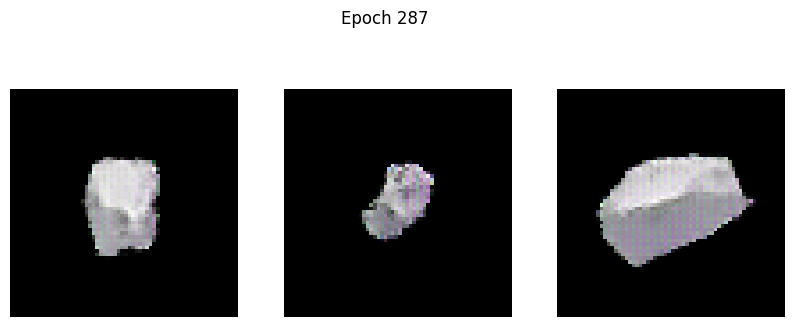

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -34.4620 - g_loss: 6.1196
Epoch 288/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 2160.1721 - g_loss: 1168.7032

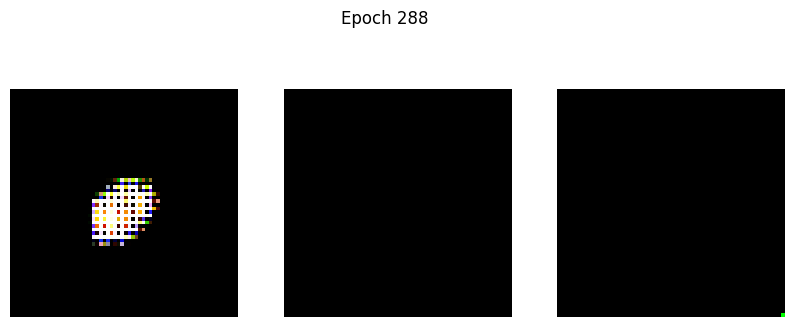

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 2189.2356 - g_loss: 1199.3763
Epoch 289/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 632.6525 - g_loss: 1021.9398

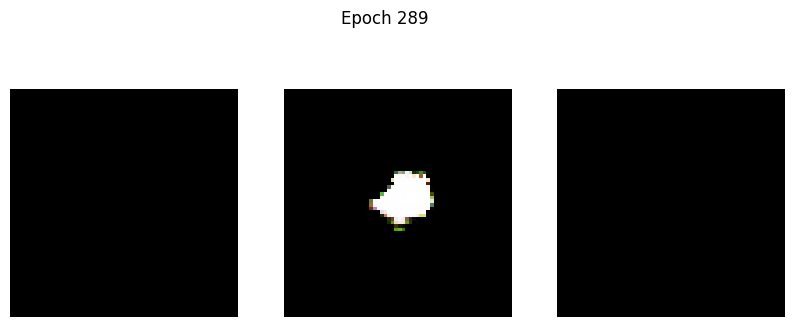

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 630.0596 - g_loss: 1021.8044
Epoch 290/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step - d_loss: 74.2348 - g_loss: 765.2568

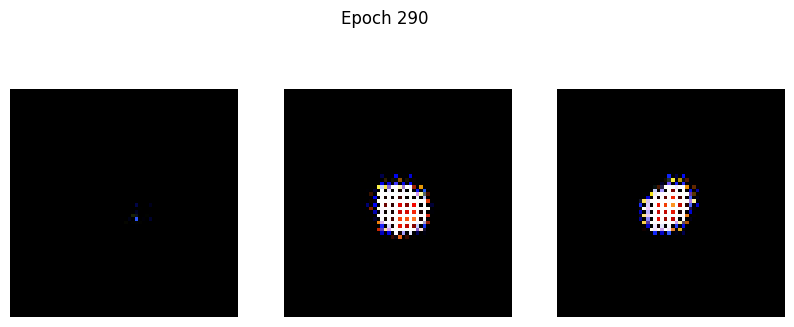

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 118ms/step - d_loss: 73.8628 - g_loss: 764.5993
Epoch 291/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -4.5560 - g_loss: 606.7785

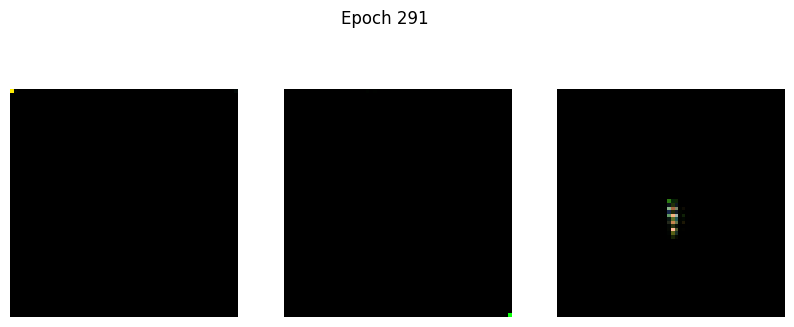

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: -4.5031 - g_loss: 607.2343
Epoch 292/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 62.5060 - g_loss: 722.4648

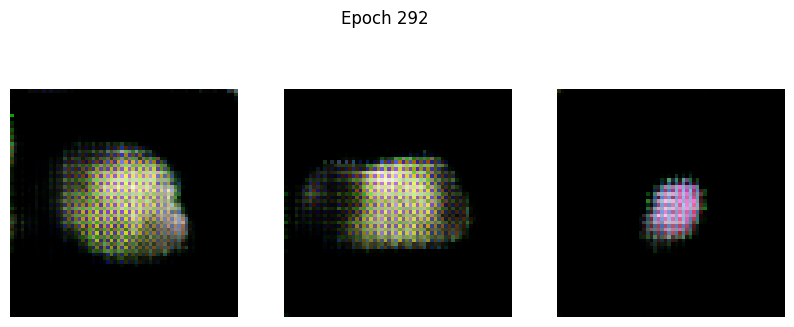

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 62.8656 - g_loss: 721.3900
Epoch 293/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 203.7069 - g_loss: 219.3996

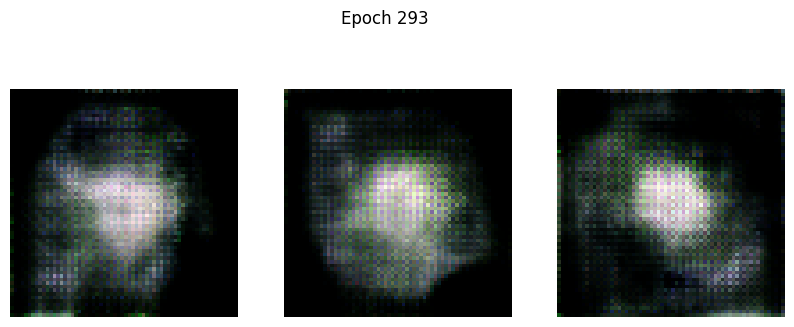

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 203.7893 - g_loss: 219.0038
Epoch 294/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 205.0506 - g_loss: 107.6743

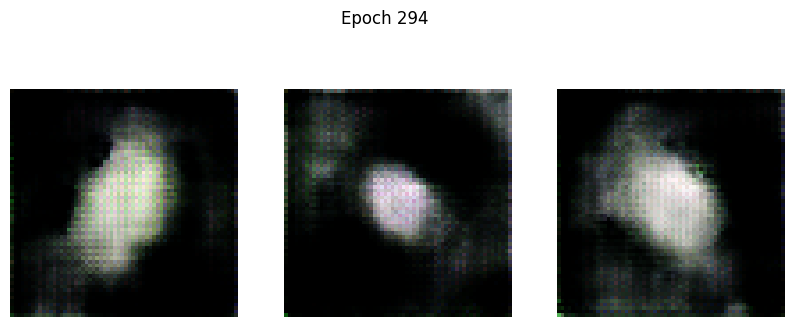

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 205.0229 - g_loss: 107.6422
Epoch 295/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 151.2985 - g_loss: 75.0359

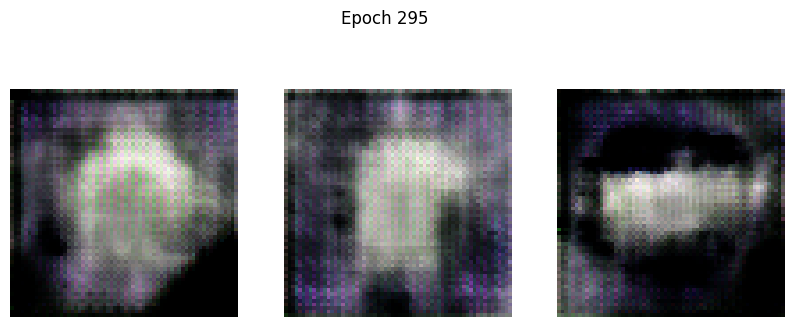

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 151.2843 - g_loss: 74.9615
Epoch 296/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 118.6118 - g_loss: 48.4366

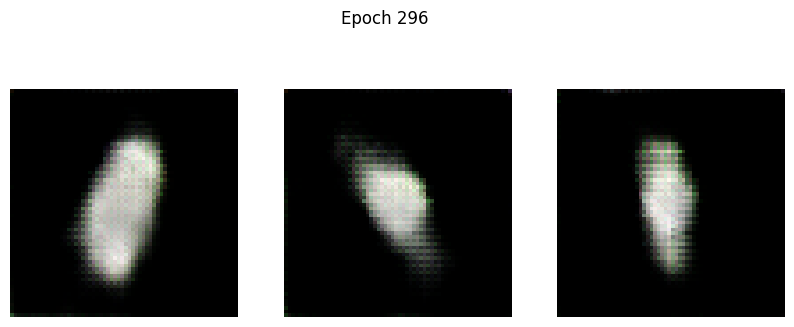

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 118.5196 - g_loss: 48.5884
Epoch 297/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 84.6295 - g_loss: 69.5283

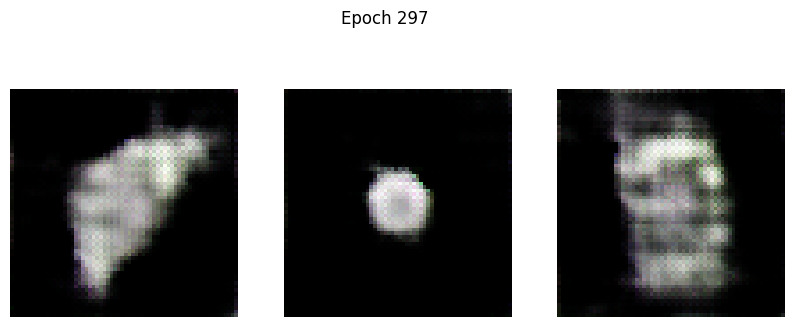

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 84.6781 - g_loss: 69.4075
Epoch 298/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 103.9614 - g_loss: 42.4387

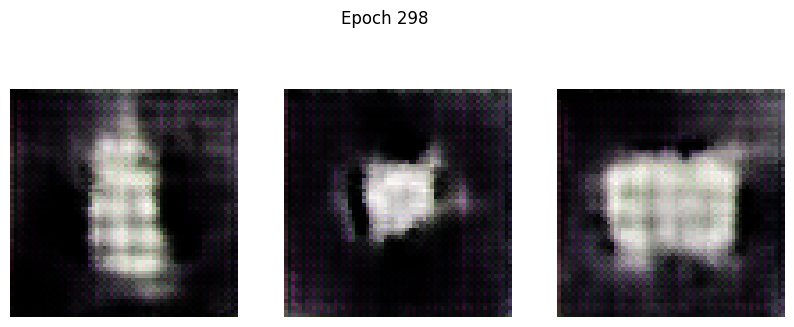

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 103.8276 - g_loss: 42.4185
Epoch 299/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 81.5649 - g_loss: 53.4315

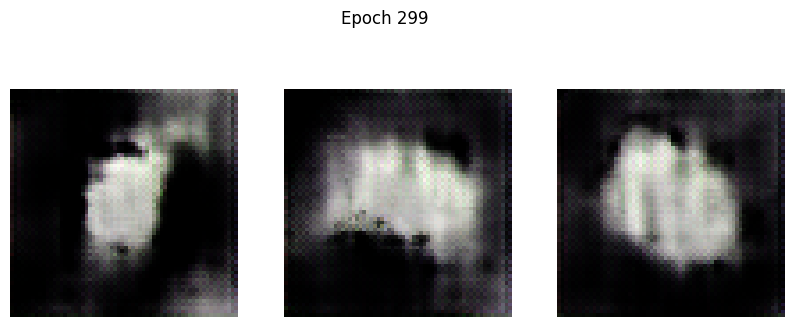

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 81.5400 - g_loss: 53.4181
Epoch 300/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 66.8967 - g_loss: 39.8545

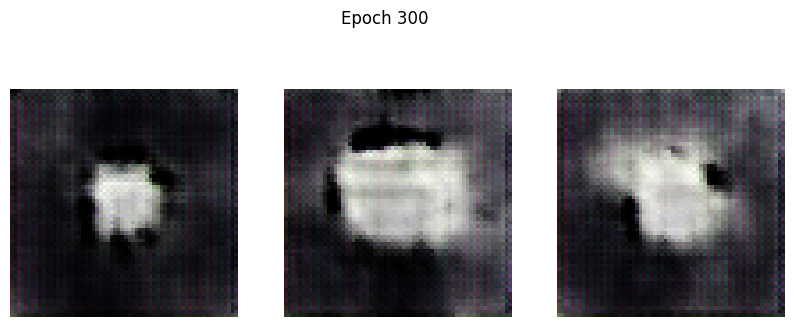

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 66.8688 - g_loss: 39.8957
Epoch 301/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 55.2890 - g_loss: 45.9266

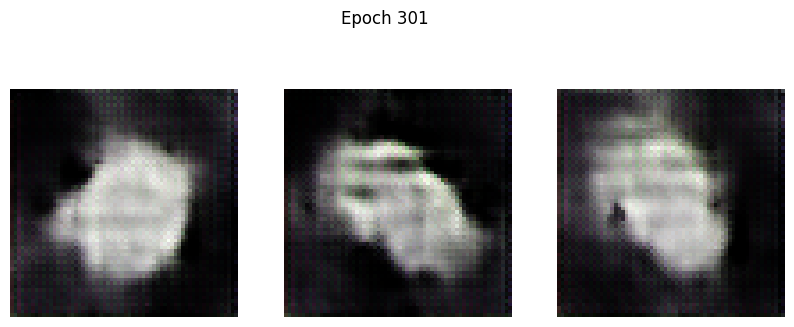

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 55.3237 - g_loss: 45.9333
Epoch 302/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 62.0208 - g_loss: 34.4759

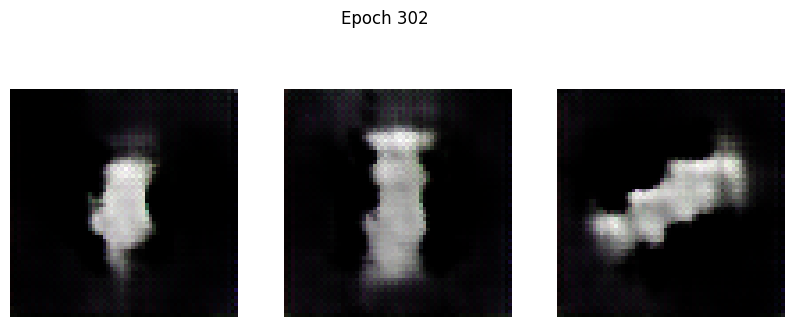

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 62.0300 - g_loss: 34.5392
Epoch 303/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 57.3943 - g_loss: 44.1163

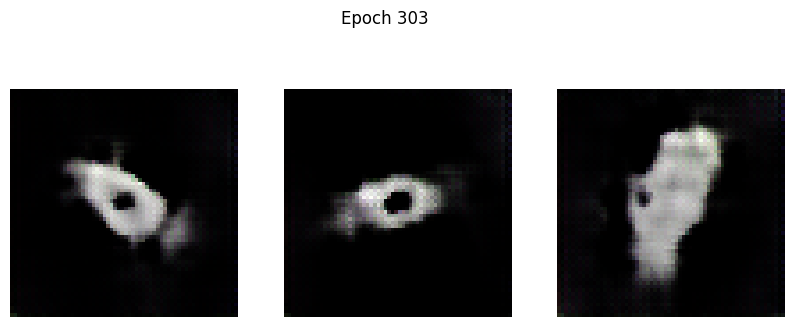

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 57.3955 - g_loss: 44.0592
Epoch 304/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 43.7655 - g_loss: 34.5462

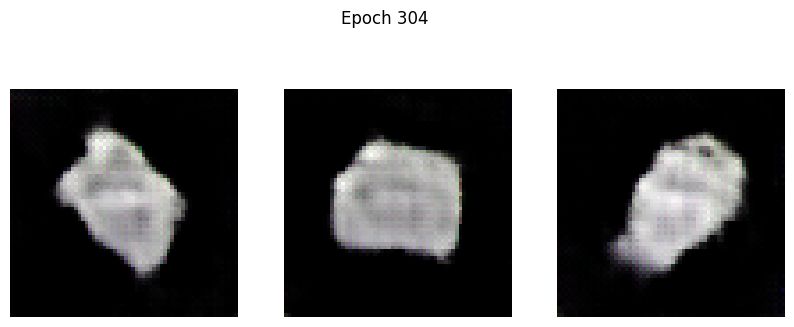

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 43.7789 - g_loss: 34.5302
Epoch 305/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 39.5325 - g_loss: 19.8444

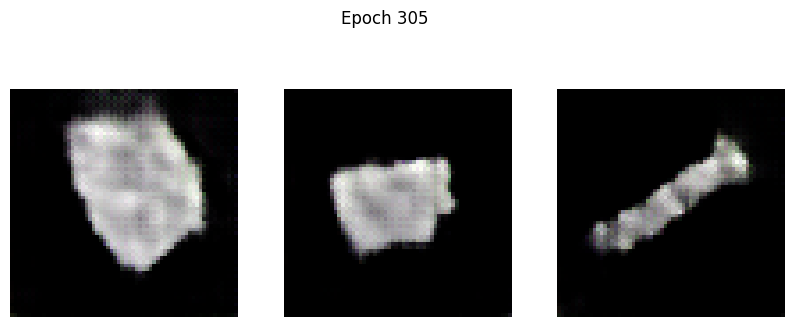

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 39.5264 - g_loss: 19.8509
Epoch 306/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 34.3918 - g_loss: 21.3760

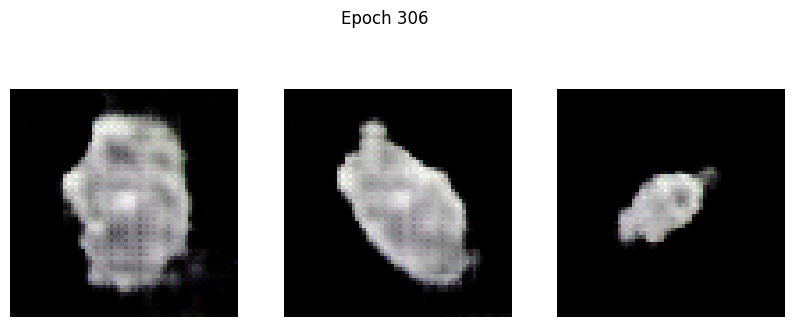

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 34.3919 - g_loss: 21.3711
Epoch 307/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 35.7934 - g_loss: 16.7887

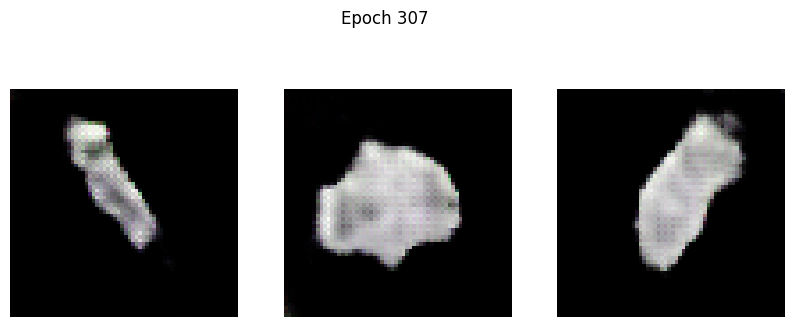

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 35.7662 - g_loss: 16.7842
Epoch 308/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 32.3334 - g_loss: 14.4087

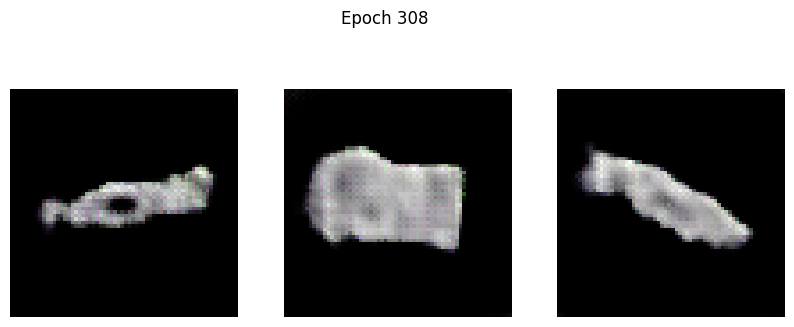

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 32.3164 - g_loss: 14.4379
Epoch 309/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 27.1772 - g_loss: 18.5684

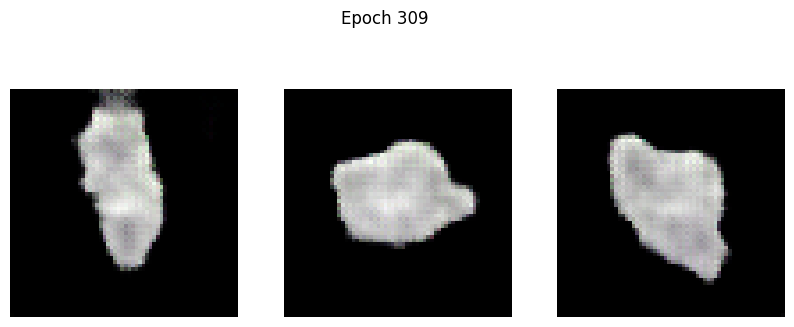

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 27.1770 - g_loss: 18.5685
Epoch 310/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 24.3658 - g_loss: 17.2938

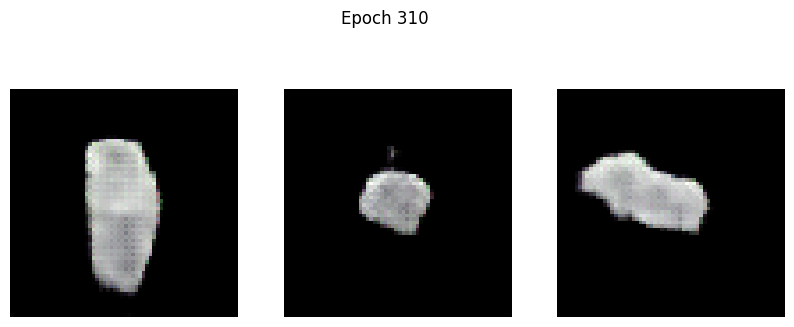

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 24.3832 - g_loss: 17.3132
Epoch 311/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 21.7079 - g_loss: 14.0570

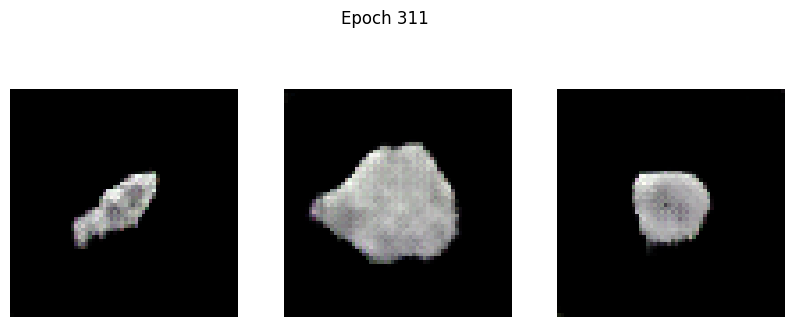

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 21.7147 - g_loss: 14.0648
Epoch 312/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 20.9899 - g_loss: 15.6051

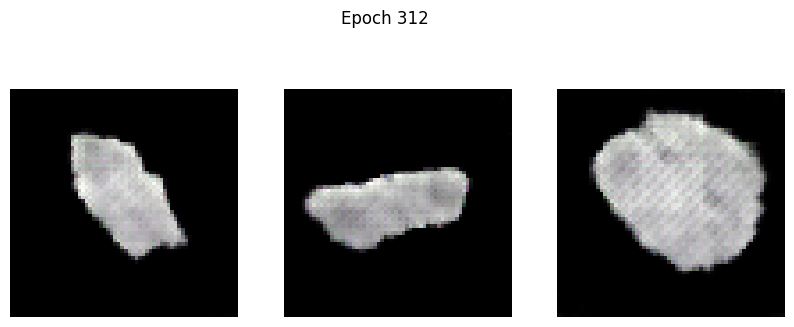

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 20.9884 - g_loss: 15.6086
Epoch 313/500
101/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 19.8167 - g_loss: 15.3971

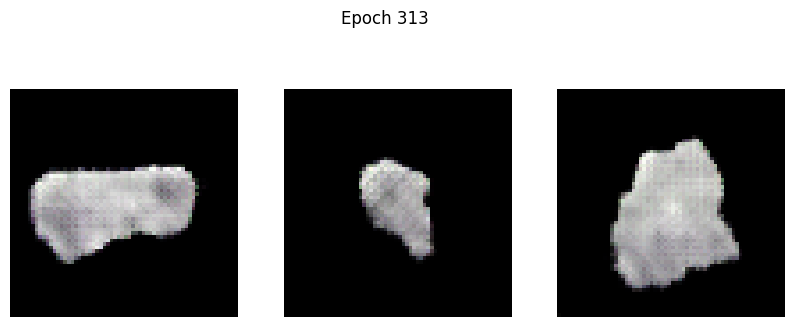

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 19.8498 - g_loss: 15.4259
Epoch 314/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 16.3006 - g_loss: 12.8734

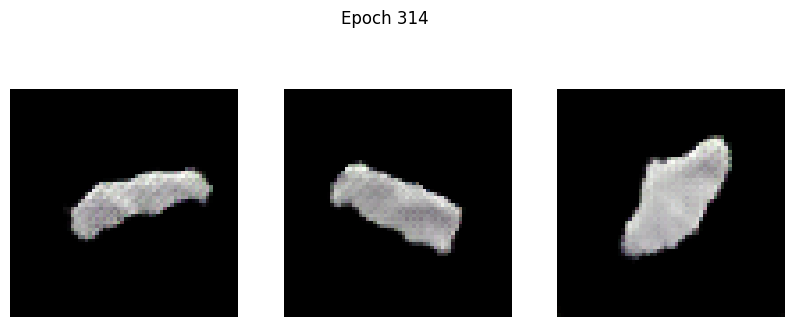

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 16.2913 - g_loss: 12.8687
Epoch 315/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 12.8222 - g_loss: 13.1412

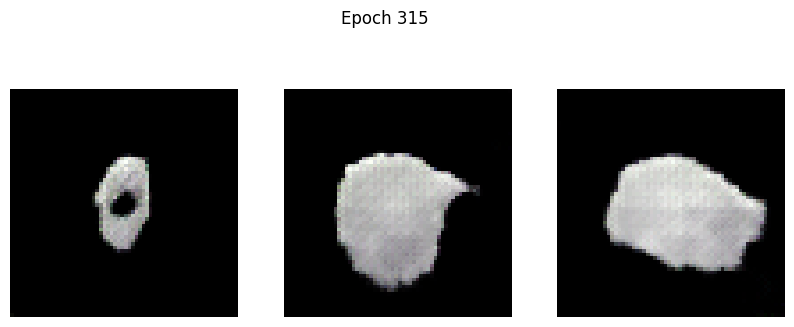

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 12.8420 - g_loss: 13.1607
Epoch 316/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 18.6768 - g_loss: 13.5340

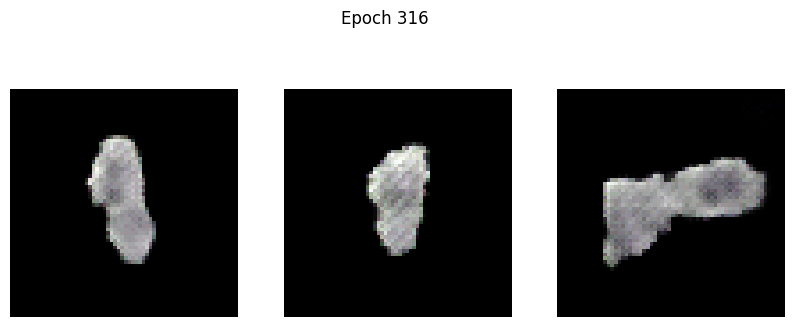

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 18.6323 - g_loss: 13.5377
Epoch 317/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 12.3852 - g_loss: 10.7910

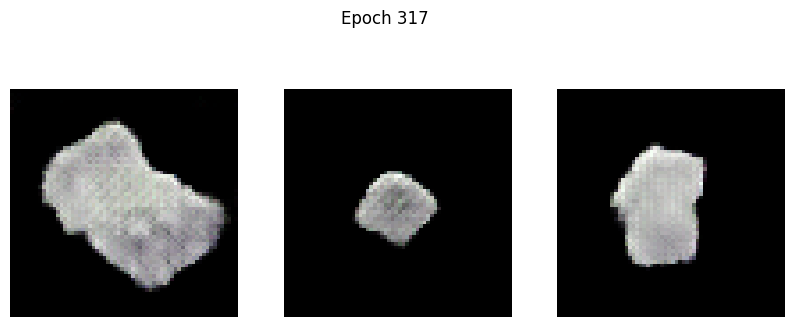

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 12.3678 - g_loss: 10.7935
Epoch 318/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 10.9075 - g_loss: 11.6892

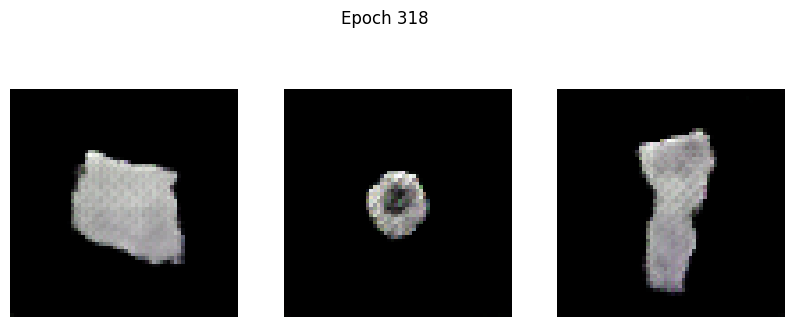

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 10.9095 - g_loss: 11.6965
Epoch 319/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 13.4192 - g_loss: 16.1902

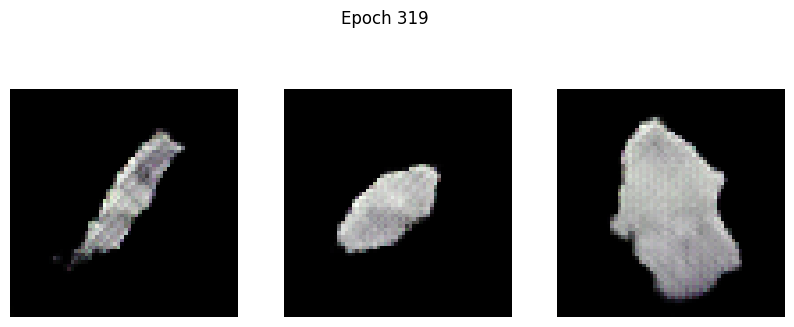

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 13.4081 - g_loss: 16.1917
Epoch 320/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 7.4273 - g_loss: 9.6207

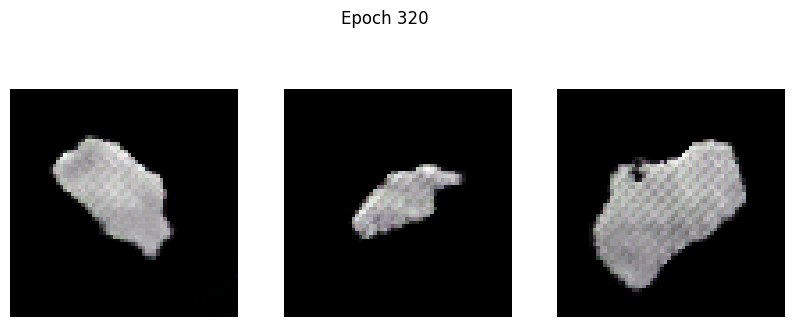

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 7.4155 - g_loss: 9.6248
Epoch 321/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 4.4141 - g_loss: 10.8277

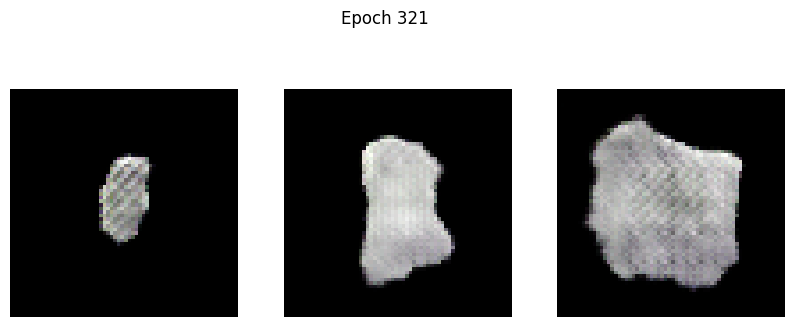

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 4.4186 - g_loss: 10.8205
Epoch 322/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 6.1013 - g_loss: 10.7786

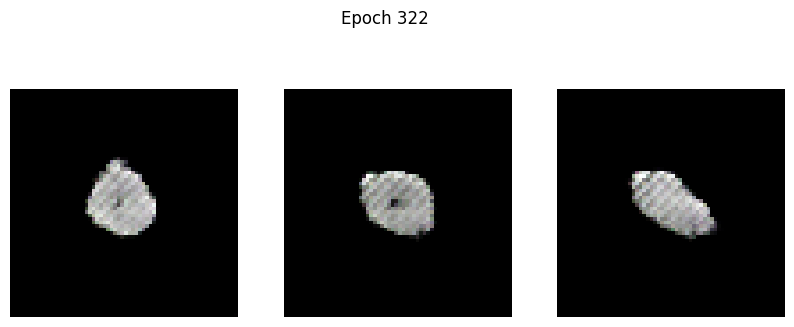

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 6.0829 - g_loss: 10.7650
Epoch 323/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 2.8026 - g_loss: 9.8770

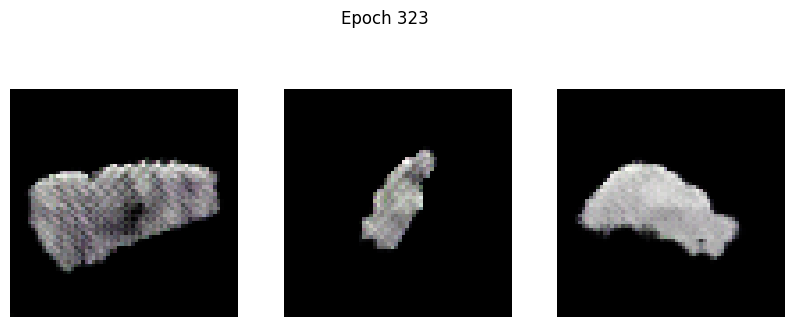

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 2.8068 - g_loss: 9.8728
Epoch 324/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 3.3187 - g_loss: 8.8283

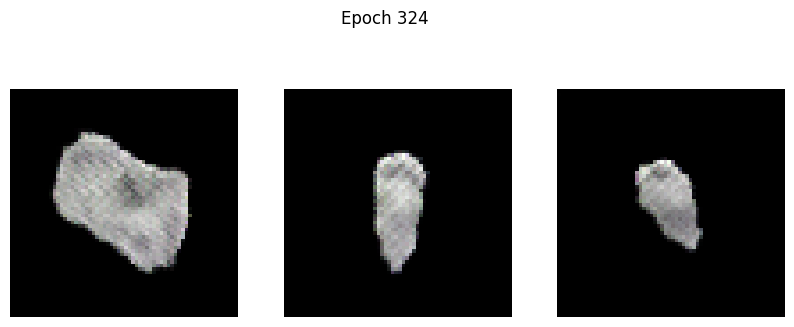

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 3.3079 - g_loss: 8.8239
Epoch 325/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 2.1981 - g_loss: 9.7876

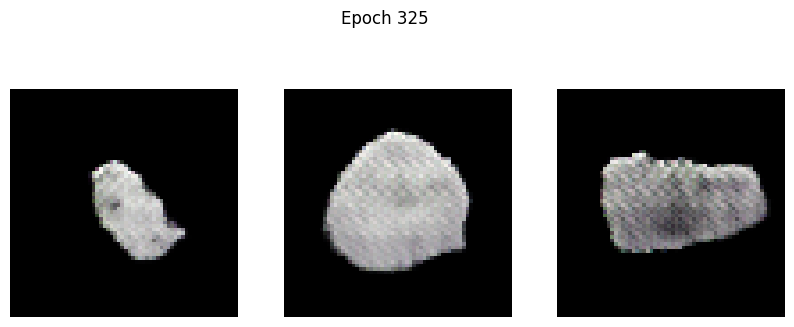

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 2.1956 - g_loss: 9.7822
Epoch 326/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 2.1435 - g_loss: 10.2535

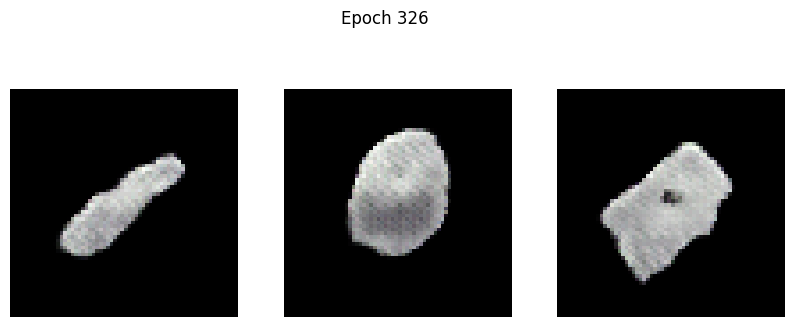

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 2.1240 - g_loss: 10.2483
Epoch 327/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.9835 - g_loss: 9.6790

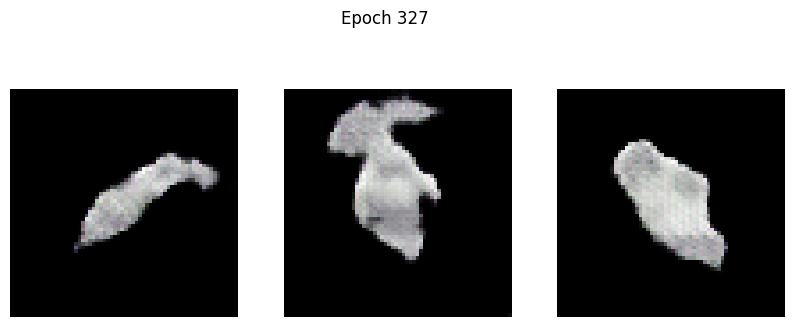

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.9924 - g_loss: 9.6759
Epoch 328/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -0.0456 - g_loss: 9.5264

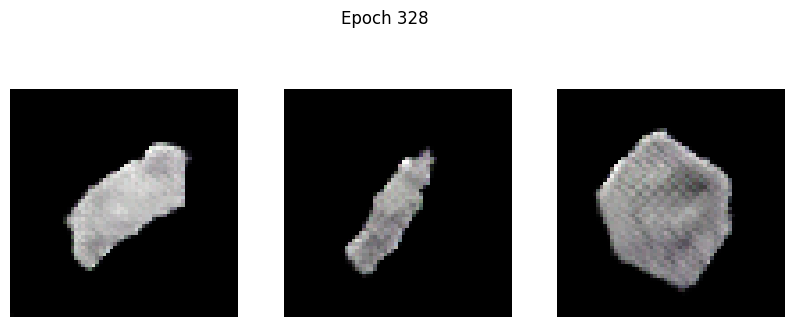

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -0.0680 - g_loss: 9.5205
Epoch 329/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.4943 - g_loss: 8.9382

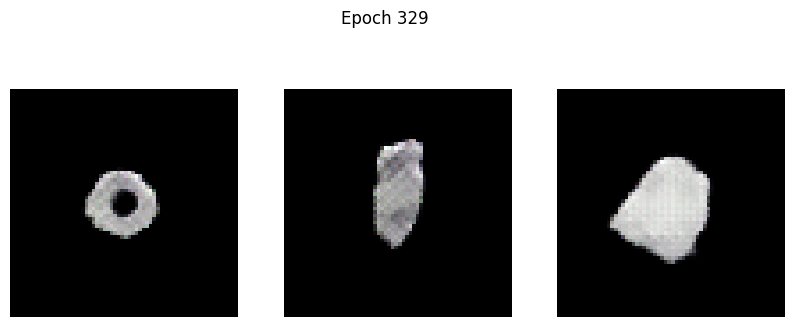

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.5030 - g_loss: 8.9352
Epoch 330/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -3.7039 - g_loss: 9.1445

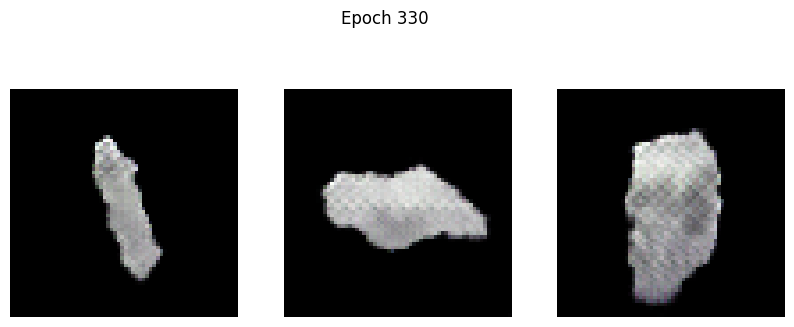

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -3.7255 - g_loss: 9.1428
Epoch 331/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -6.6423 - g_loss: 7.2650

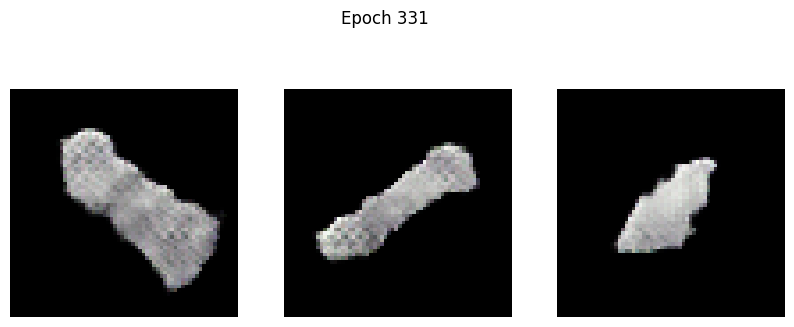

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -6.6411 - g_loss: 7.2711
Epoch 332/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -2.3565 - g_loss: 8.1242

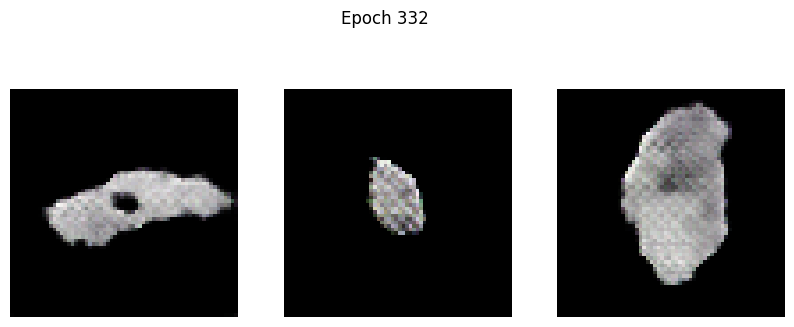

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.3984 - g_loss: 8.1276
Epoch 333/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -4.2530 - g_loss: 7.6239

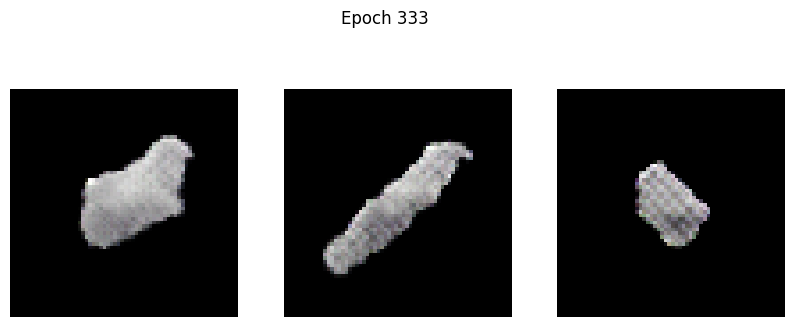

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -4.2898 - g_loss: 7.6287
Epoch 334/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -8.4062 - g_loss: 7.6195

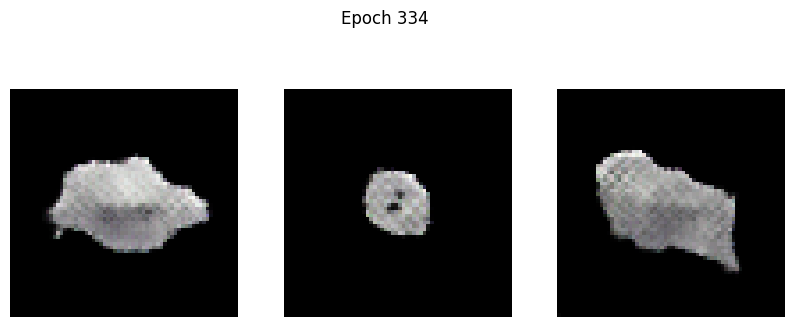

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -8.4158 - g_loss: 7.6230
Epoch 335/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -11.9272 - g_loss: 7.6737

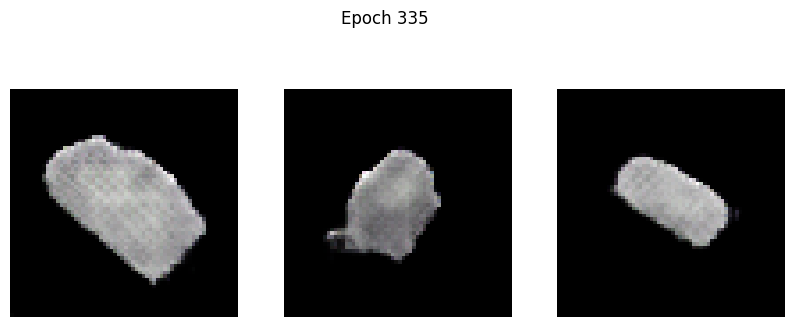

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -11.9298 - g_loss: 7.6750
Epoch 336/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -12.1069 - g_loss: 7.5772

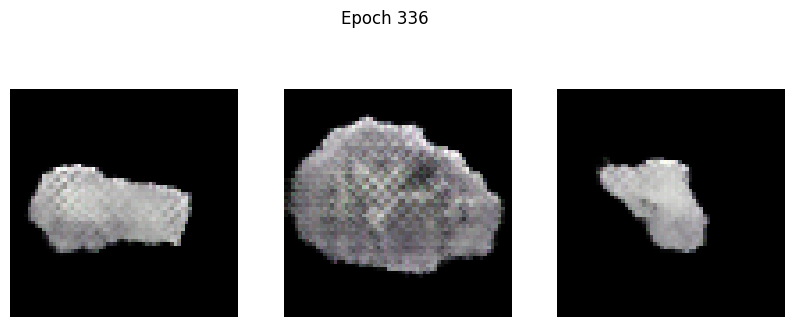

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -12.0913 - g_loss: 7.5788
Epoch 337/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -11.2362 - g_loss: 7.1602

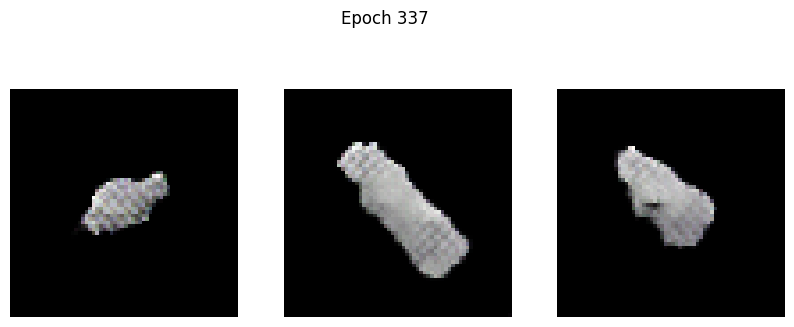

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -11.2484 - g_loss: 7.1635
Epoch 338/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -8.6116 - g_loss: 6.8677

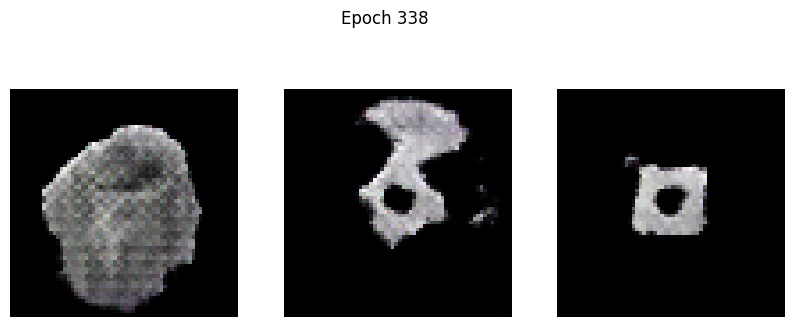

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -8.6512 - g_loss: 6.8700
Epoch 339/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -14.8722 - g_loss: 6.8893

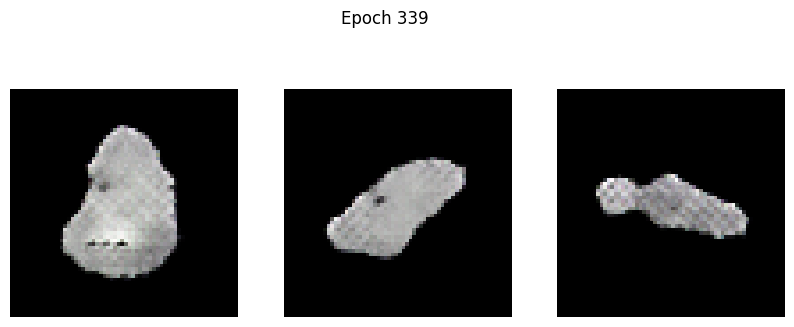

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -14.8655 - g_loss: 6.8890
Epoch 340/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -12.2467 - g_loss: 6.6909

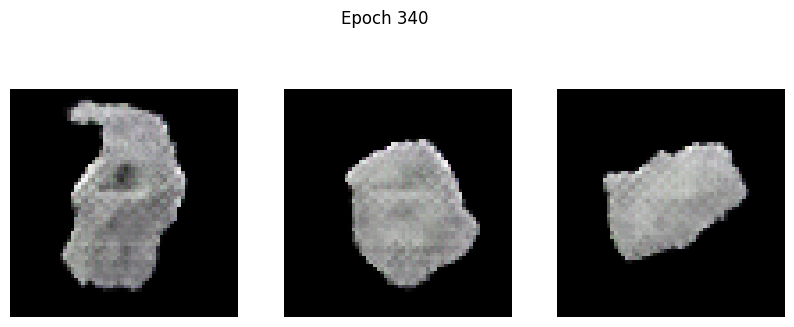

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -12.2899 - g_loss: 6.6898
Epoch 341/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -17.4497 - g_loss: 6.6496

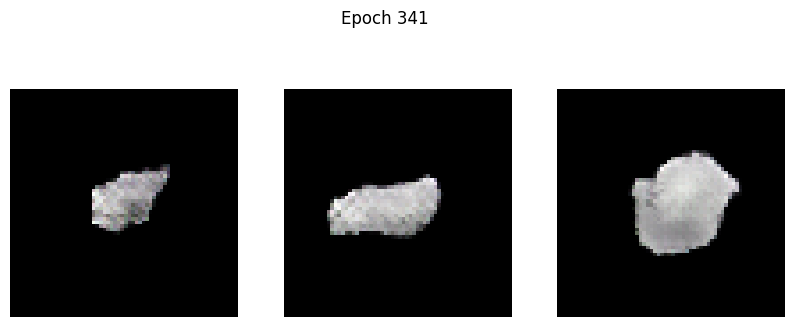

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -17.4451 - g_loss: 6.6487
Epoch 342/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -16.2432 - g_loss: 5.9823

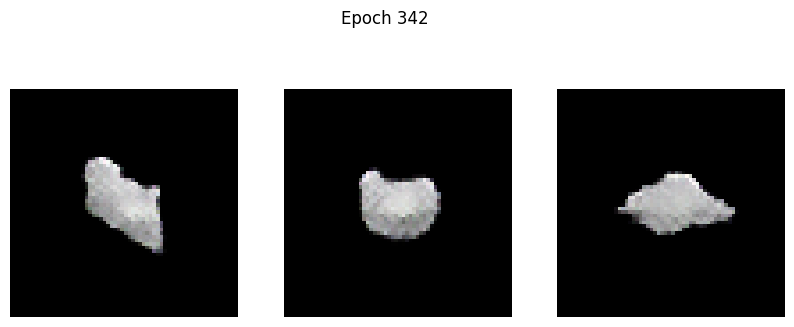

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -16.2573 - g_loss: 5.9838
Epoch 343/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -21.0632 - g_loss: 6.1126

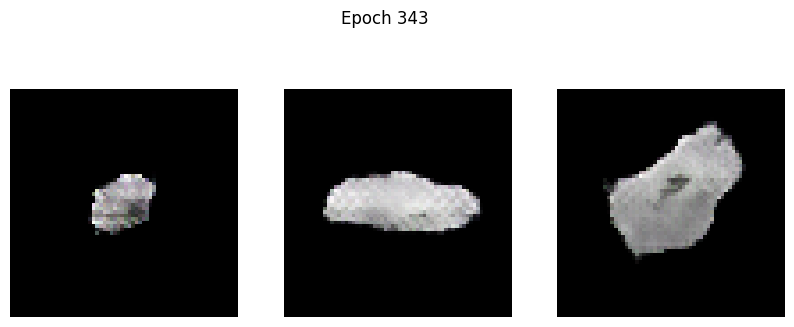

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -21.0669 - g_loss: 6.1114
Epoch 344/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -21.9762 - g_loss: 5.6182

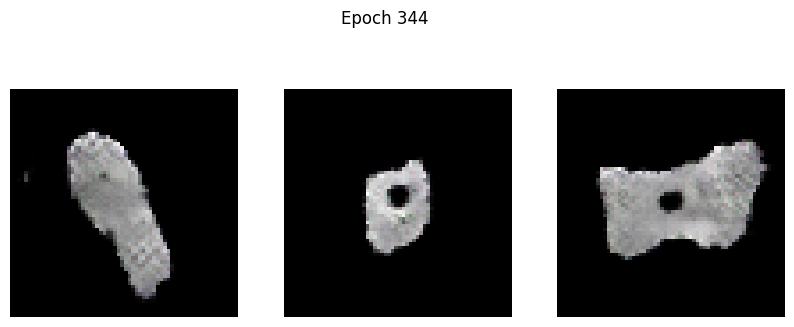

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -21.9844 - g_loss: 5.6178
Epoch 345/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -27.6532 - g_loss: 5.3730

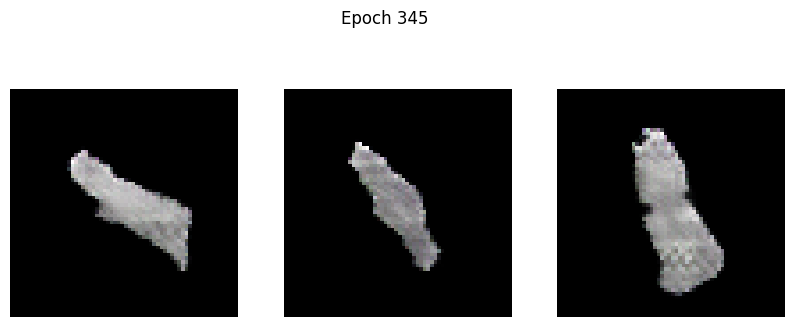

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -27.6006 - g_loss: 5.3726
Epoch 346/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -25.1132 - g_loss: 5.0345

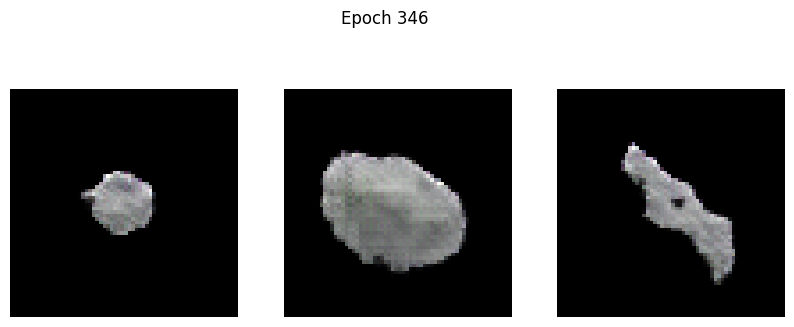

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -25.0787 - g_loss: 5.0364
Epoch 347/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -20.5949 - g_loss: 5.2513

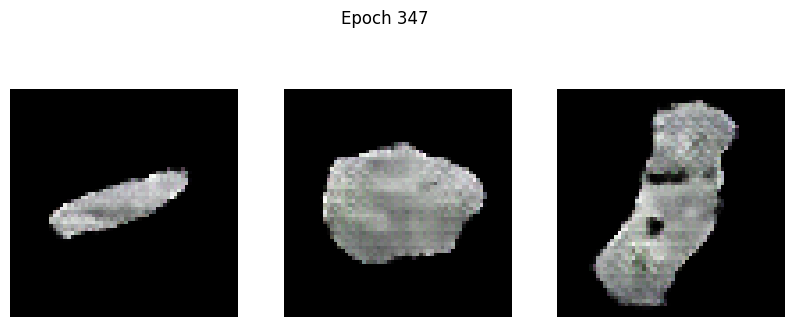

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -20.6106 - g_loss: 5.2505
Epoch 348/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -26.0308 - g_loss: 4.7952

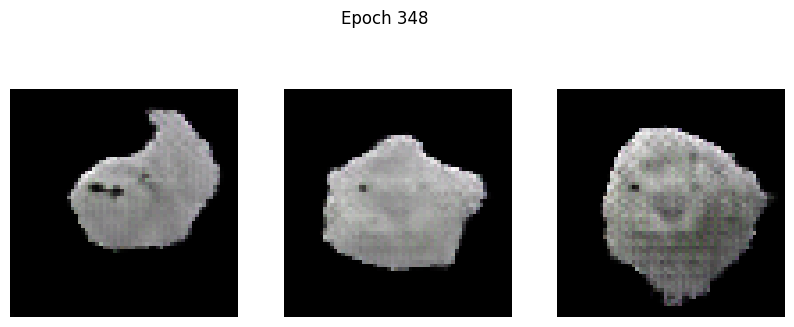

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -26.0479 - g_loss: 4.7946
Epoch 349/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -18.8503 - g_loss: 4.5772

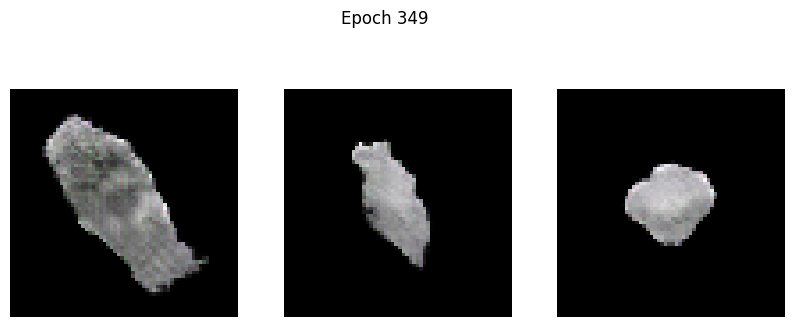

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -18.8779 - g_loss: 4.5783
Epoch 350/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -28.2907 - g_loss: 4.6565

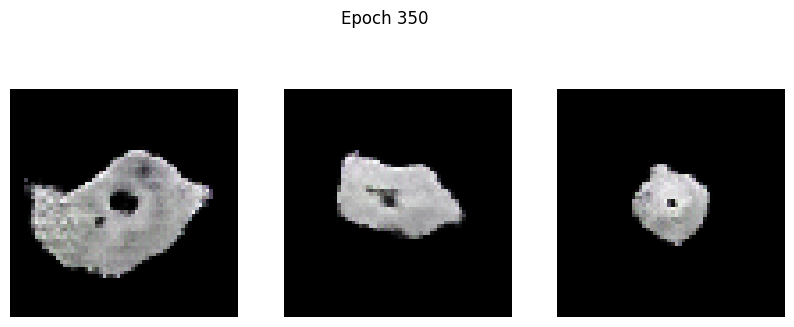

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -28.2969 - g_loss: 4.6553
Epoch 351/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -35.2223 - g_loss: 4.9356

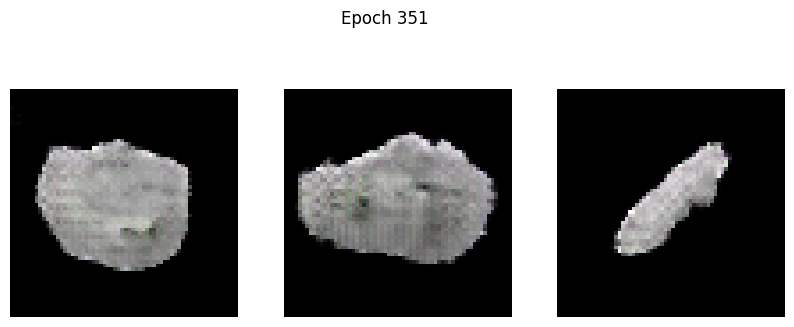

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -35.1831 - g_loss: 4.9335
Epoch 352/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -31.8761 - g_loss: 4.3922

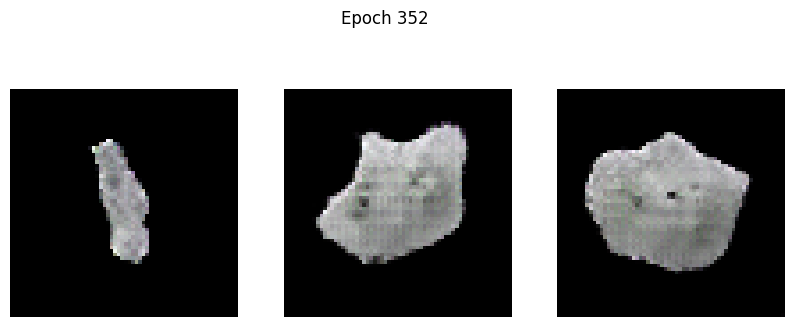

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -31.8557 - g_loss: 4.3942
Epoch 353/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -29.2158 - g_loss: 4.5734

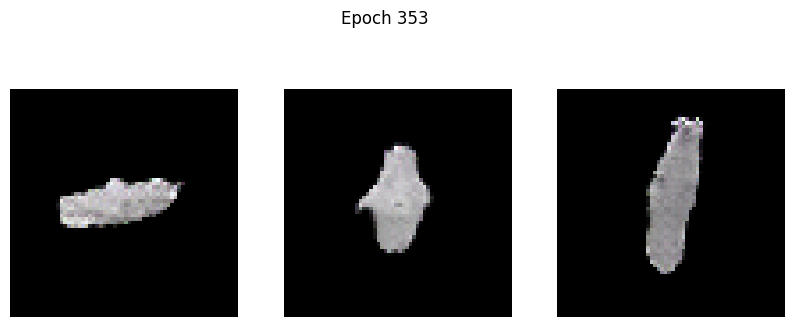

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -29.2309 - g_loss: 4.5745
Epoch 354/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -34.7830 - g_loss: 5.0952

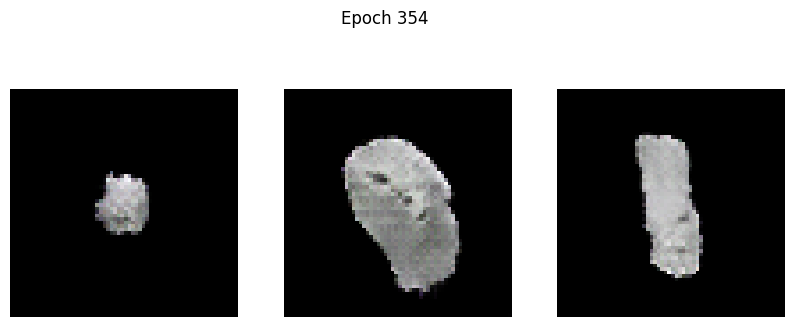

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -34.8102 - g_loss: 5.0926
Epoch 355/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -29.8660 - g_loss: 5.0034

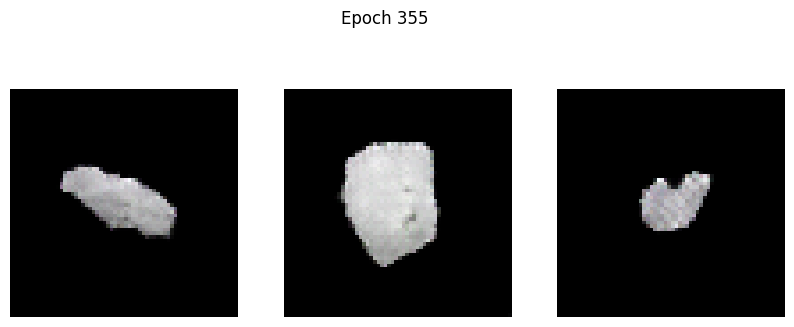

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -29.9053 - g_loss: 5.0052
Epoch 356/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -38.9468 - g_loss: 5.0829

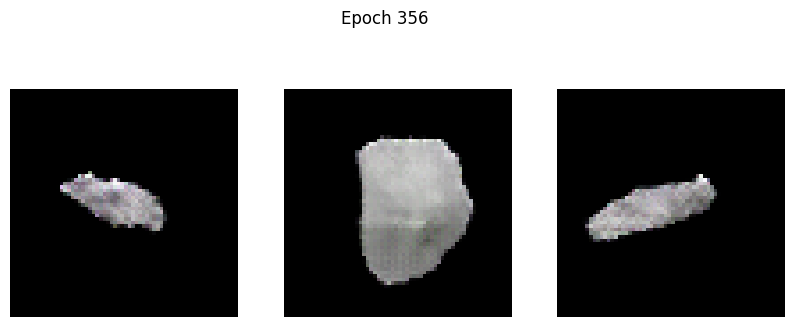

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -38.9026 - g_loss: 5.0857
Epoch 357/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -31.6999 - g_loss: 5.0310

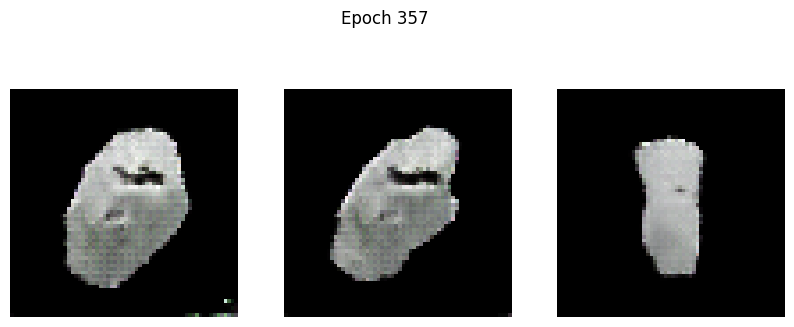

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -31.7134 - g_loss: 5.0323
Epoch 358/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -32.6914 - g_loss: 5.8976

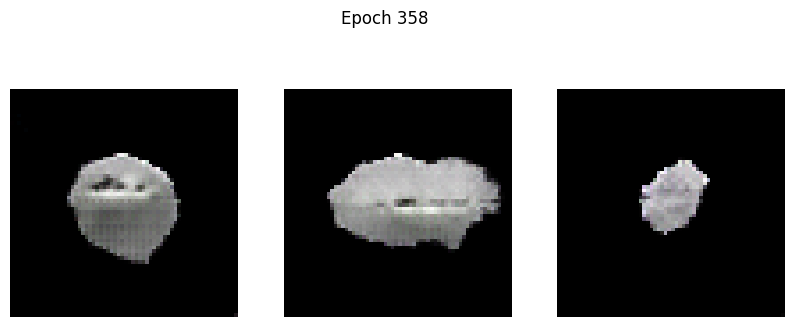

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -32.7108 - g_loss: 5.8970
Epoch 359/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -35.9435 - g_loss: 6.8748

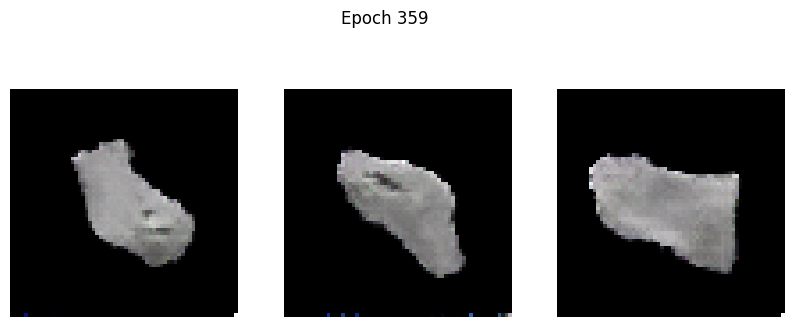

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -35.9373 - g_loss: 6.8763
Epoch 360/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -41.3536 - g_loss: 6.4100

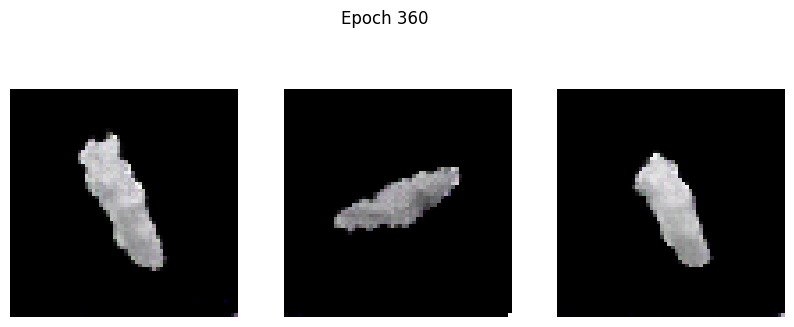

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -41.3340 - g_loss: 6.4099
Epoch 361/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -35.1527 - g_loss: 7.3408

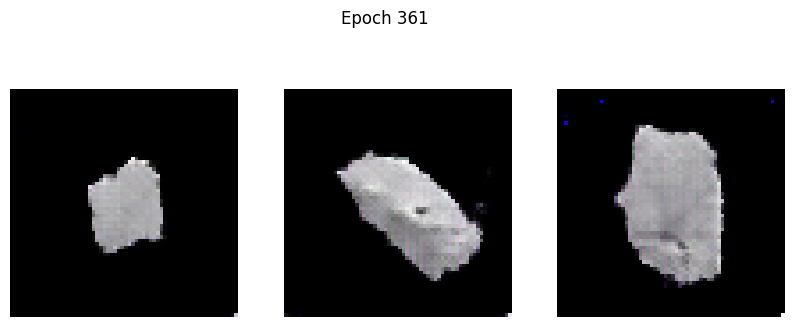

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -35.0804 - g_loss: 7.3517
Epoch 362/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -35.1694 - g_loss: 11.8158

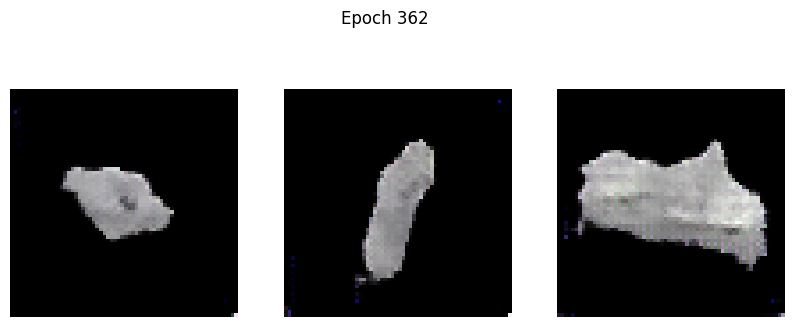

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -35.2101 - g_loss: 11.7970
Epoch 363/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -41.6338 - g_loss: 6.3843

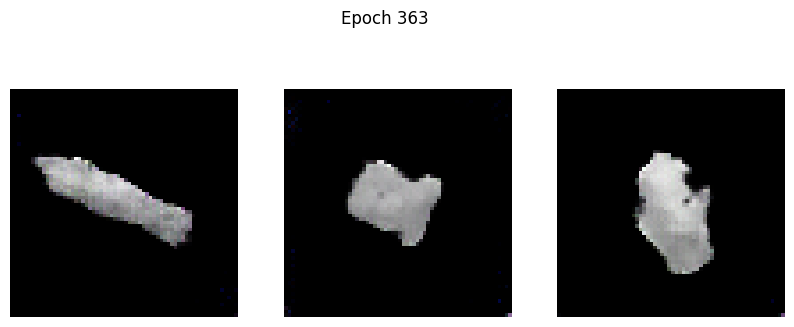

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -41.6448 - g_loss: 6.3812
Epoch 364/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -41.0355 - g_loss: 6.4380

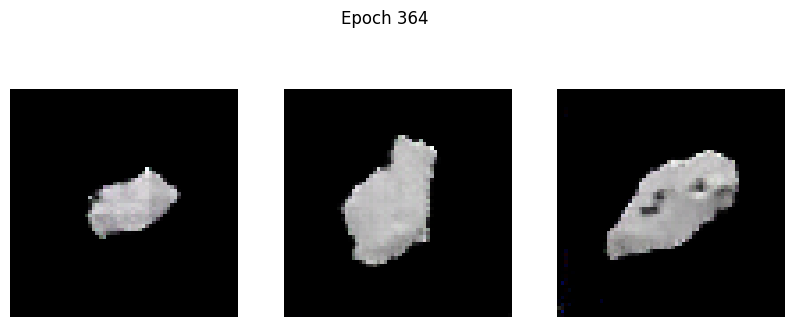

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -41.0582 - g_loss: 6.4354
Epoch 365/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -45.7426 - g_loss: 6.6112

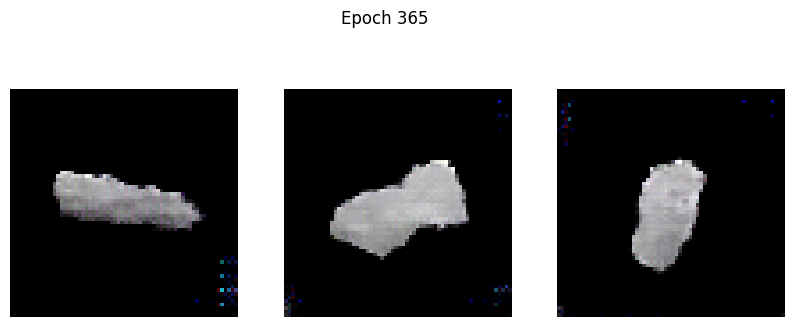

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -45.7206 - g_loss: 6.6134
Epoch 366/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -43.1168 - g_loss: 7.5265

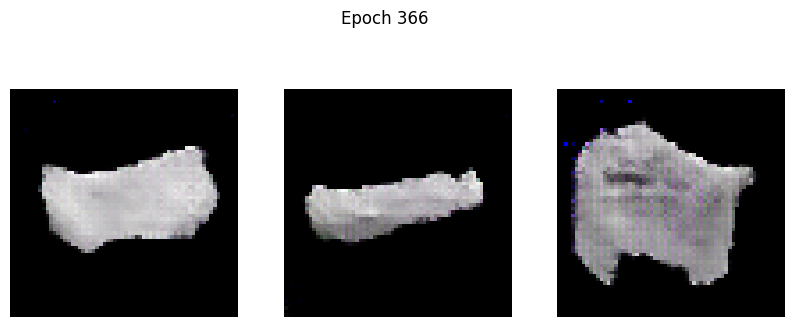

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -43.0998 - g_loss: 7.5223
Epoch 367/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -51.7516 - g_loss: 7.0114

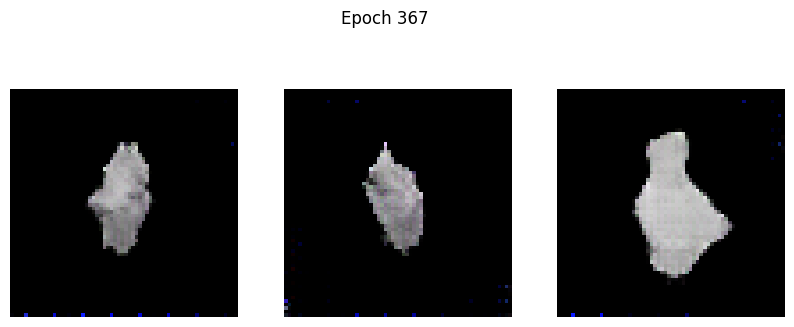

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -51.7699 - g_loss: 7.0058
Epoch 368/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -60.7707 - g_loss: 6.6582

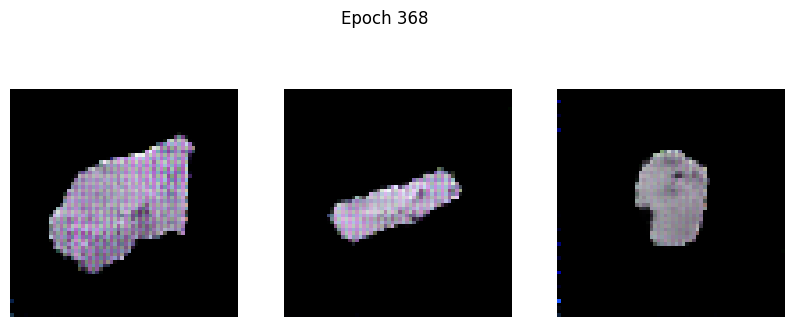

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -60.5316 - g_loss: 6.6799
Epoch 369/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -43.1709 - g_loss: 14.0589

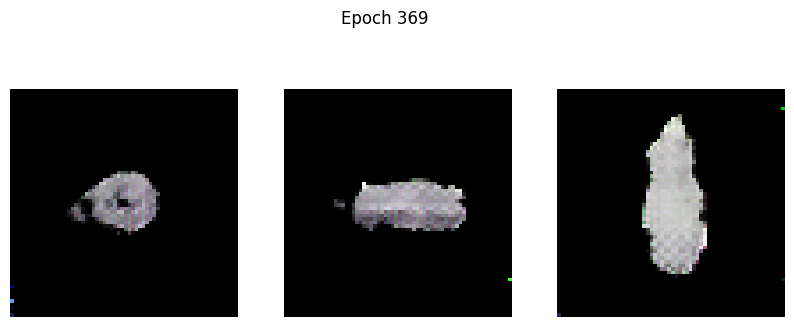

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -43.1705 - g_loss: 14.0329
Epoch 370/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -54.9942 - g_loss: 7.3062

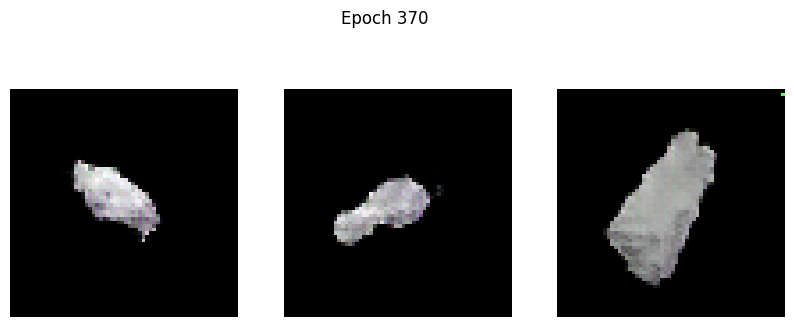

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -54.9989 - g_loss: 7.3058
Epoch 371/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -59.5467 - g_loss: 5.6831

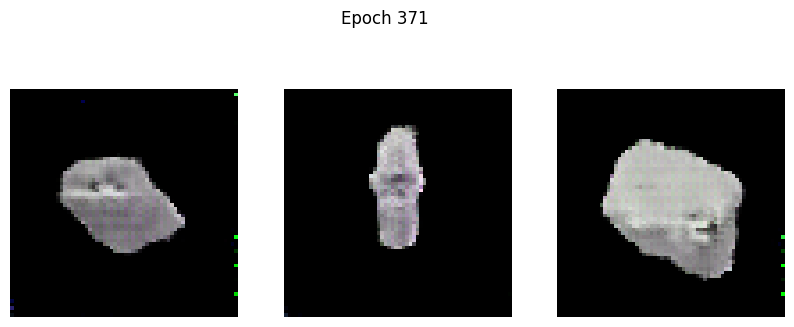

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -59.5649 - g_loss: 5.6833
Epoch 372/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -52.9977 - g_loss: 6.1640

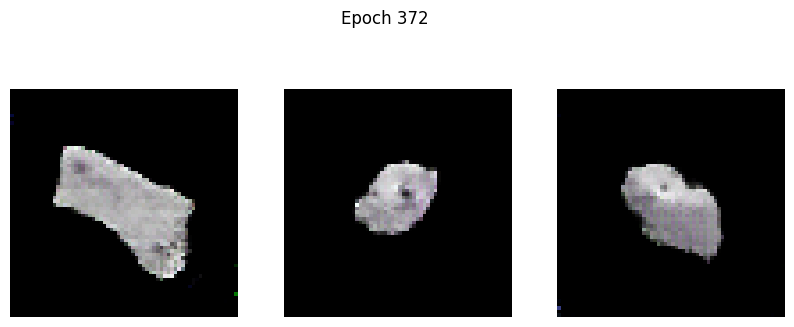

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -53.0057 - g_loss: 6.1667
Epoch 373/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -57.2910 - g_loss: 6.3098

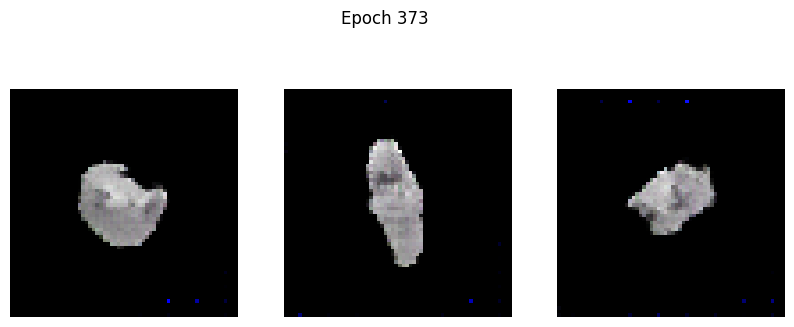

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -57.3578 - g_loss: 6.3134
Epoch 374/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -46.4053 - g_loss: 12.5624

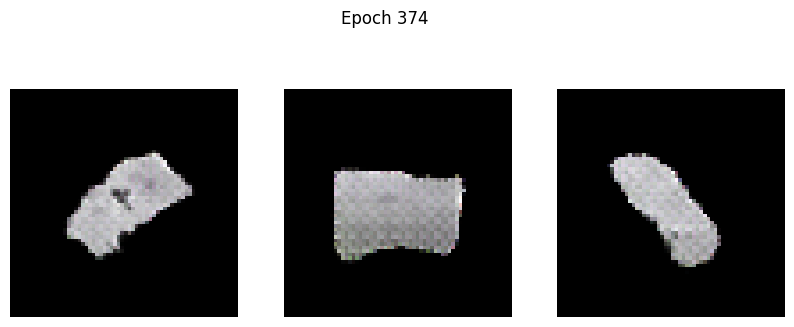

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -46.2922 - g_loss: 12.6298
Epoch 375/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -66.7057 - g_loss: 11.4601

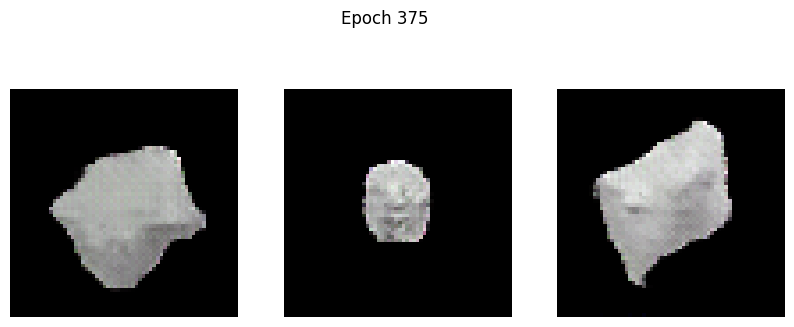

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -66.6091 - g_loss: 11.4461
Epoch 376/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -67.1038 - g_loss: 6.7509

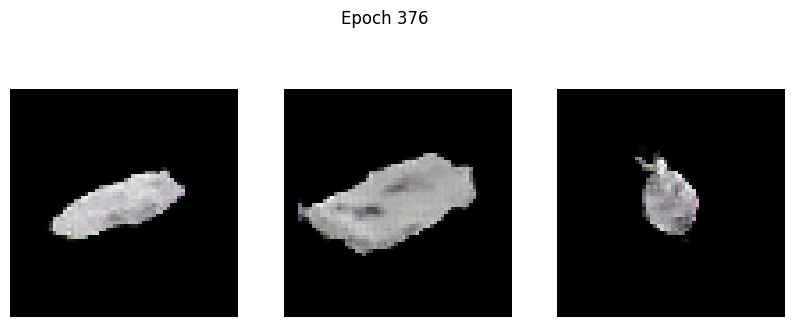

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -67.0031 - g_loss: 6.7505
Epoch 377/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -63.1889 - g_loss: 6.9272

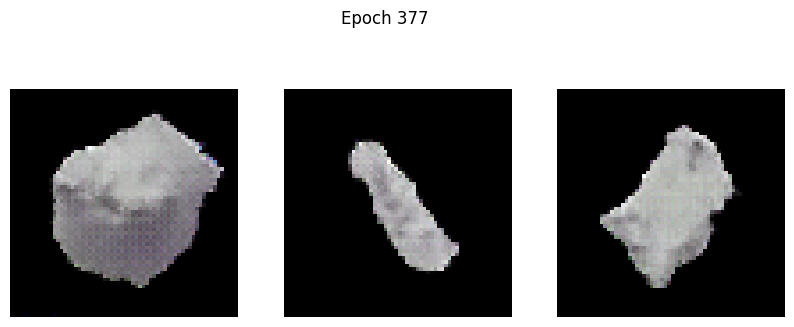

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -63.2166 - g_loss: 6.9298
Epoch 378/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -62.3641 - g_loss: 7.3177

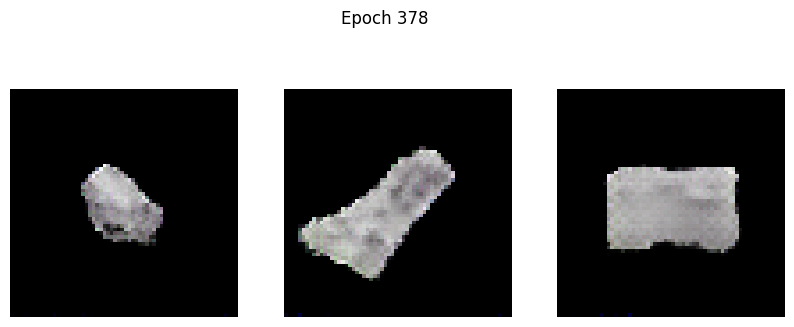

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -62.4041 - g_loss: 7.3277
Epoch 379/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -19.2977 - g_loss: 14.3607

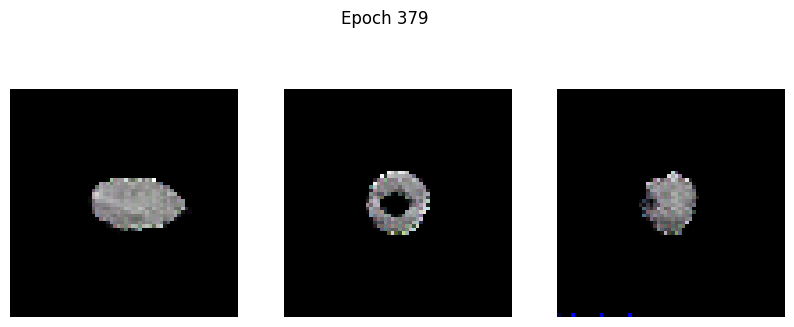

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -19.3356 - g_loss: 14.3737
Epoch 380/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -68.1972 - g_loss: 7.9063

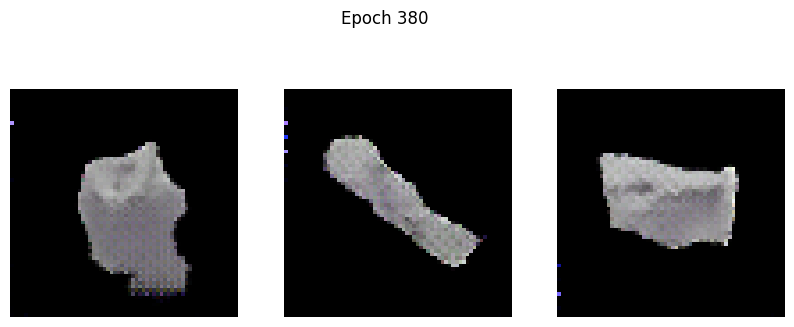

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -68.2544 - g_loss: 7.9045
Epoch 381/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -85.4666 - g_loss: 7.4914

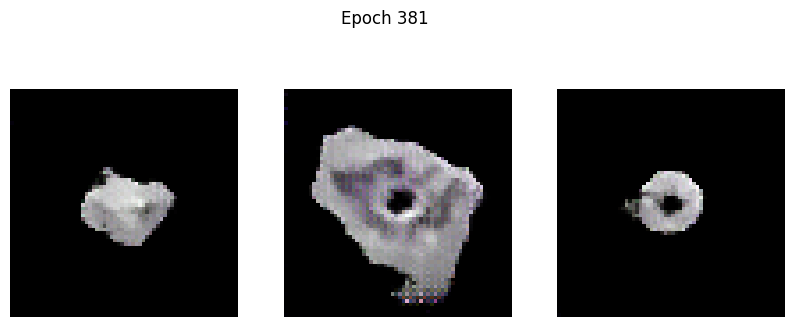

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -85.3250 - g_loss: 7.4874
Epoch 382/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -79.2165 - g_loss: 7.2690

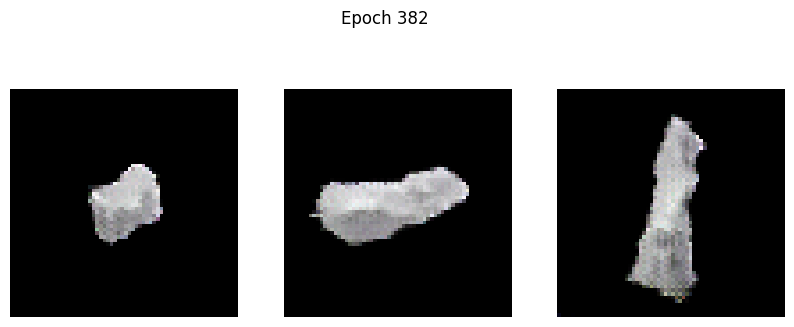

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -79.1565 - g_loss: 7.2741
Epoch 383/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -71.3342 - g_loss: 8.3633

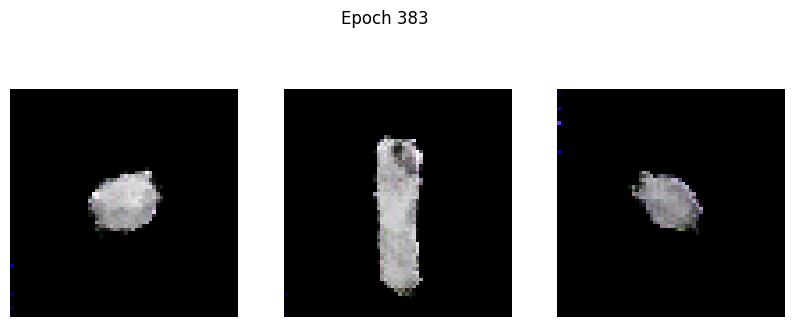

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -71.3933 - g_loss: 8.3620
Epoch 384/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -70.8504 - g_loss: 9.2286

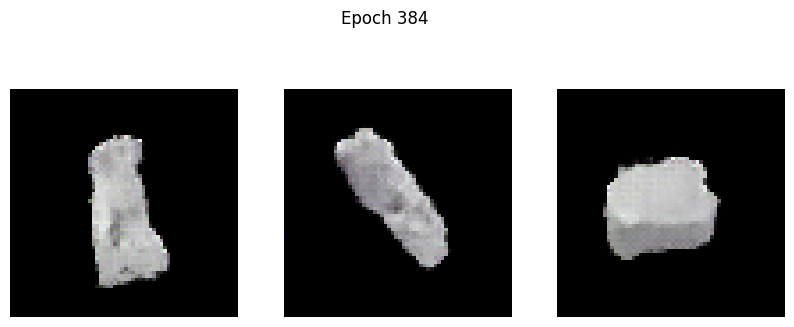

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -70.9136 - g_loss: 9.2277
Epoch 385/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -78.4140 - g_loss: 7.7861

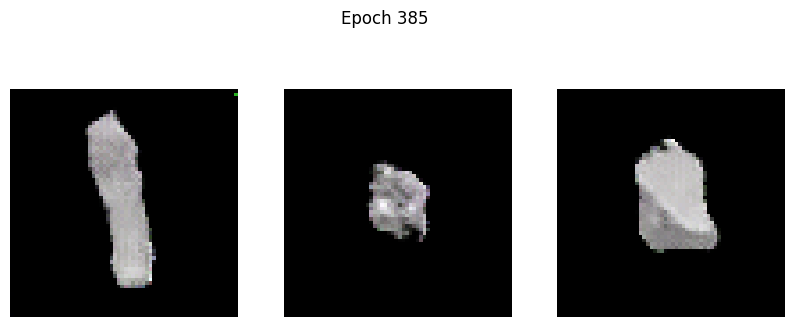

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -78.4823 - g_loss: 7.7871
Epoch 386/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -89.3478 - g_loss: 8.5008

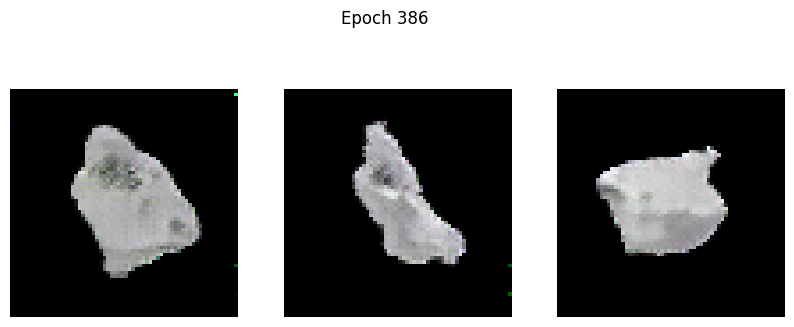

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -89.2323 - g_loss: 8.5077
Epoch 387/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 2838.8745 - g_loss: 992.4891

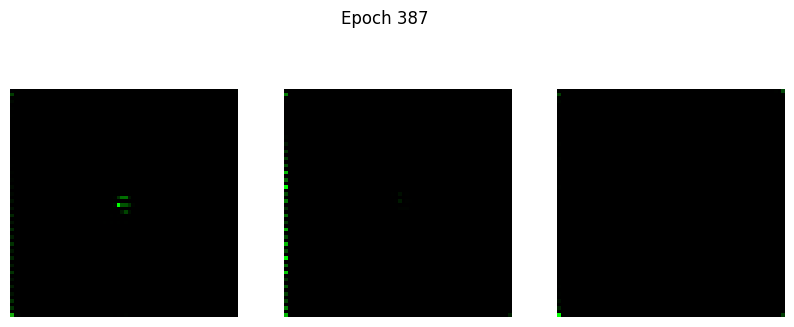

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 2908.0784 - g_loss: 1034.3248
Epoch 388/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 1558.4513 - g_loss: 1272.9871

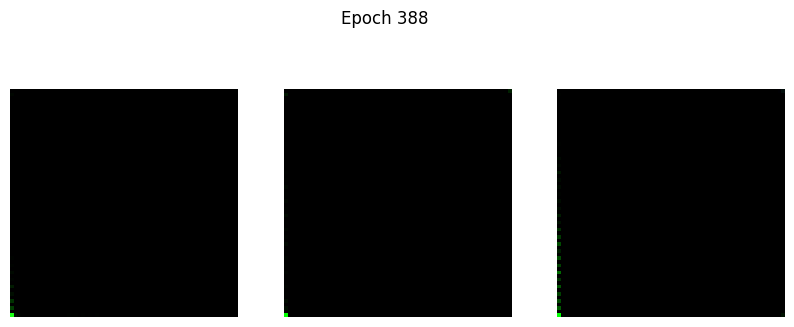

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 119ms/step - d_loss: 1553.7505 - g_loss: 1273.9996
Epoch 389/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 351.8828 - g_loss: 1806.8687

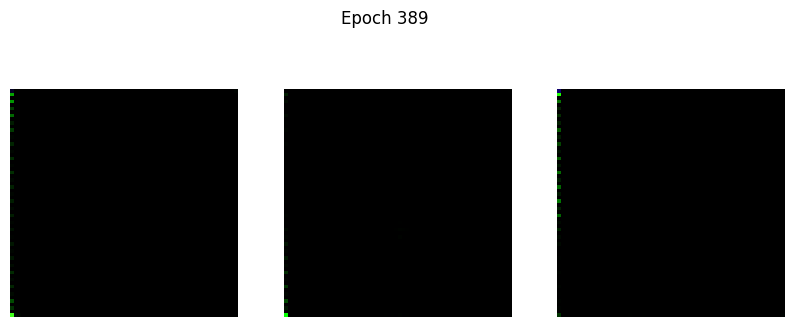

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 350.9136 - g_loss: 1806.7570
Epoch 390/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: 34.8084 - g_loss: 1822.0844

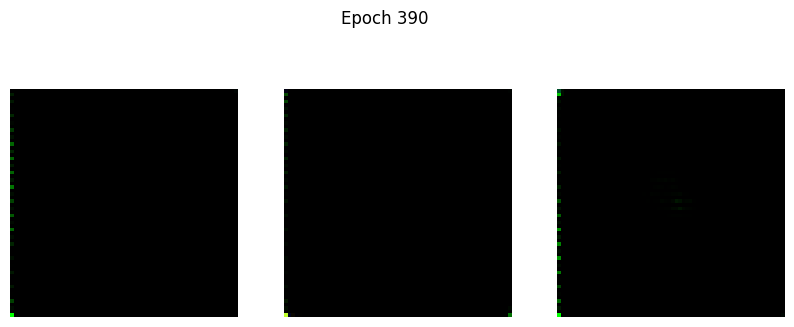

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 34.6513 - g_loss: 1822.7729
Epoch 391/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step - d_loss: -2.6053 - g_loss: 2059.1196

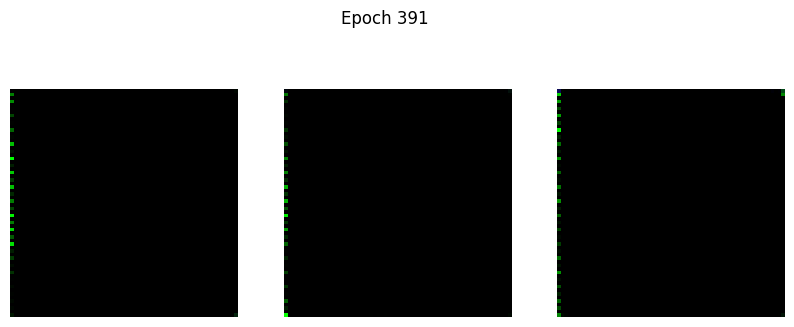

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -2.6134 - g_loss: 2059.4106
Epoch 392/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -8.6401 - g_loss: 2220.3635

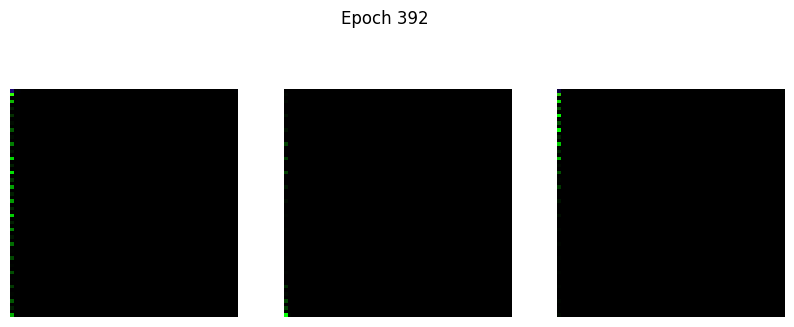

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -8.6400 - g_loss: 2220.6194
Epoch 393/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -5.0402 - g_loss: 2715.5701

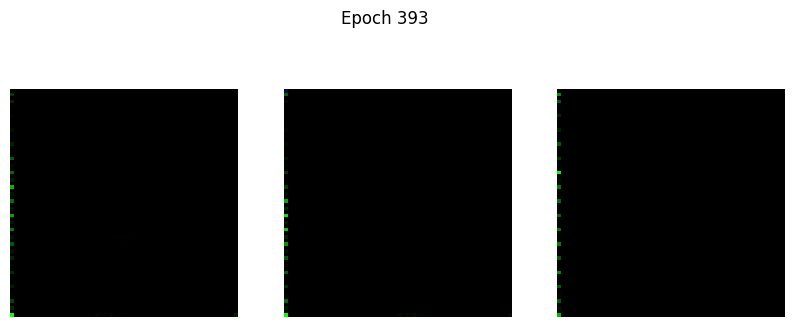

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -5.0763 - g_loss: 2714.3547
Epoch 394/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -19.1717 - g_loss: 2476.5325

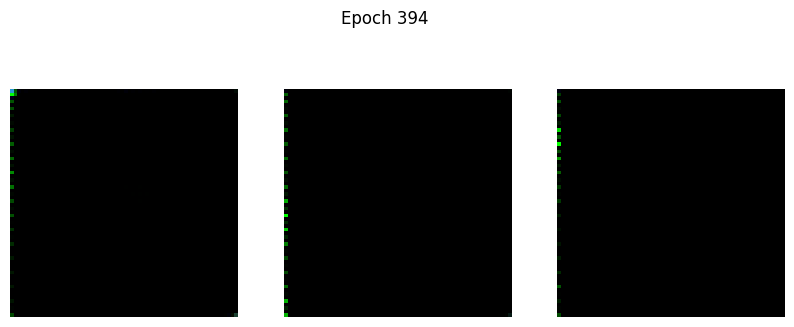

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -19.1327 - g_loss: 2478.7341
Epoch 395/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -23.1292 - g_loss: 2623.3877

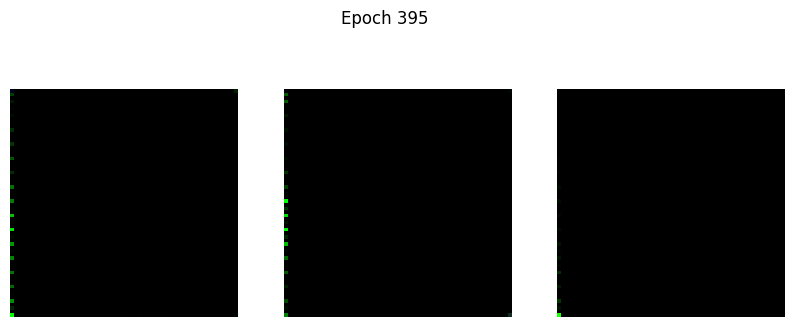

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -23.0968 - g_loss: 2625.4204
Epoch 396/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -21.7974 - g_loss: 2942.7256

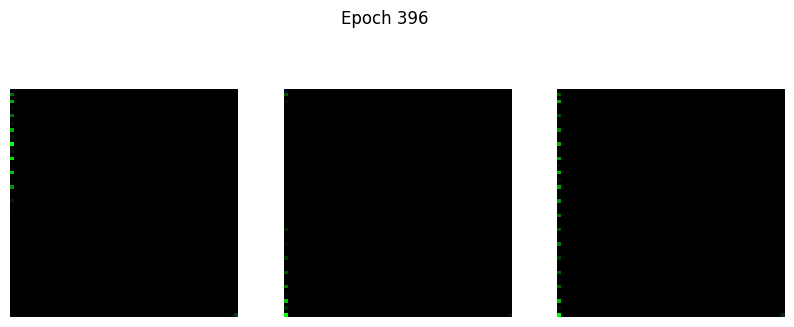

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -21.8312 - g_loss: 2942.7058
Epoch 397/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: -22.4399 - g_loss: 3305.4189

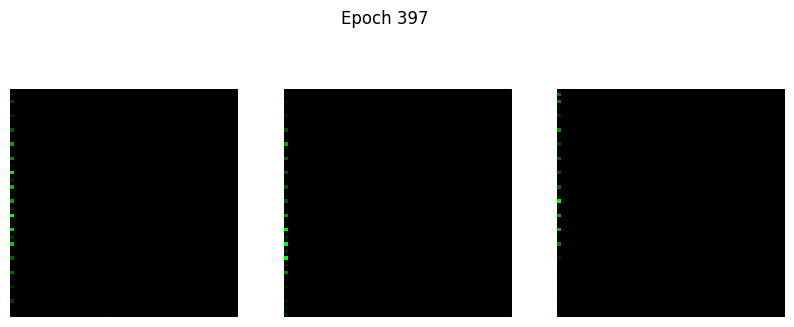

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: -22.4823 - g_loss: 3305.5994
Epoch 398/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 264.8407 - g_loss: 1974.3660

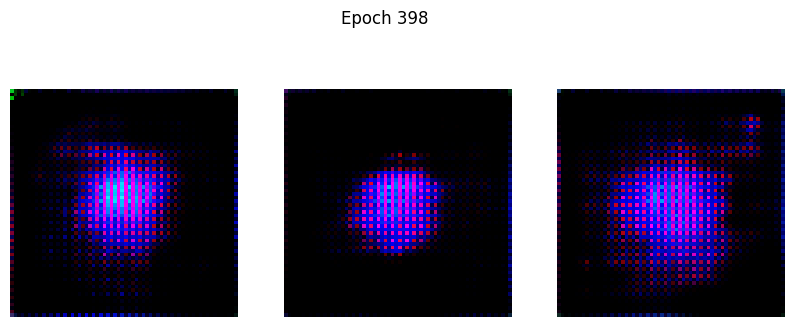

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 265.9130 - g_loss: 1969.2516
Epoch 399/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 233.1411 - g_loss: 594.9639

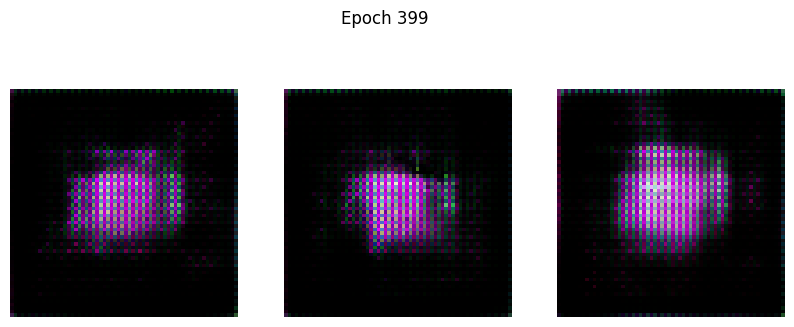

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 233.0109 - g_loss: 593.6841
Epoch 400/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 191.6541 - g_loss: 446.9492

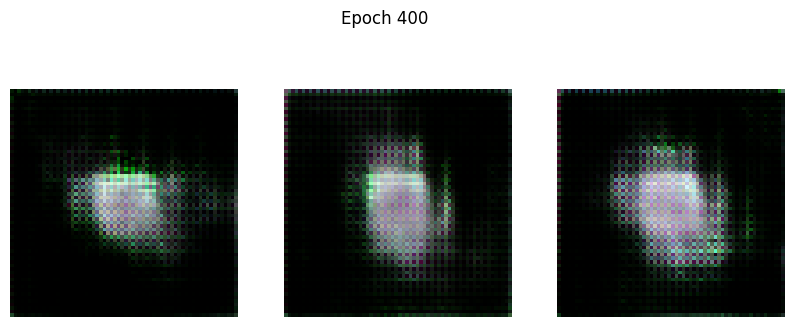

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 191.8551 - g_loss: 446.1588
Epoch 401/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 297.4203 - g_loss: 189.7608

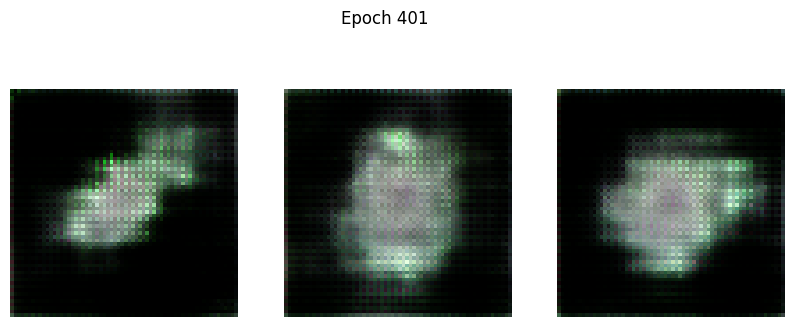

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 297.4217 - g_loss: 189.6049
Epoch 402/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 310.7124 - g_loss: 203.3013

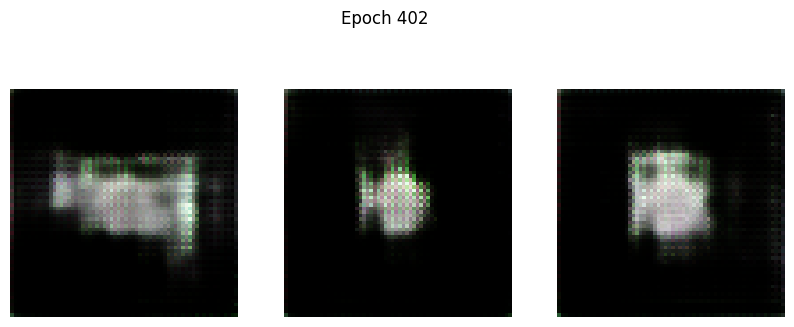

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 310.5439 - g_loss: 202.9547
Epoch 403/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 209.7305 - g_loss: 141.2697

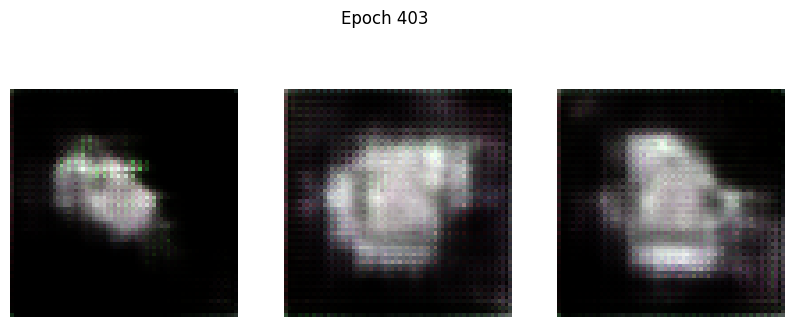

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 209.7185 - g_loss: 141.3336
Epoch 404/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 185.5837 - g_loss: 117.0858

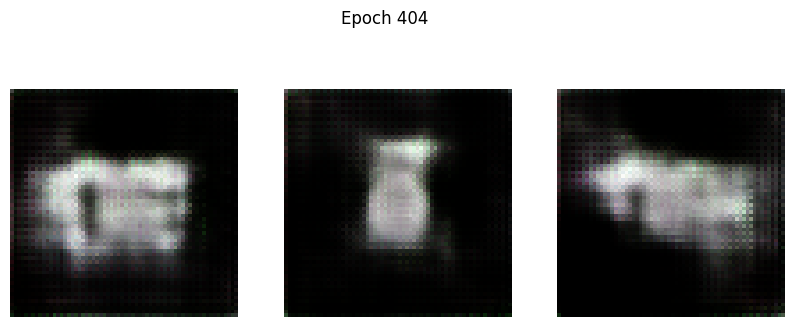

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 185.5984 - g_loss: 117.1840
Epoch 405/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 148.2931 - g_loss: 95.3975

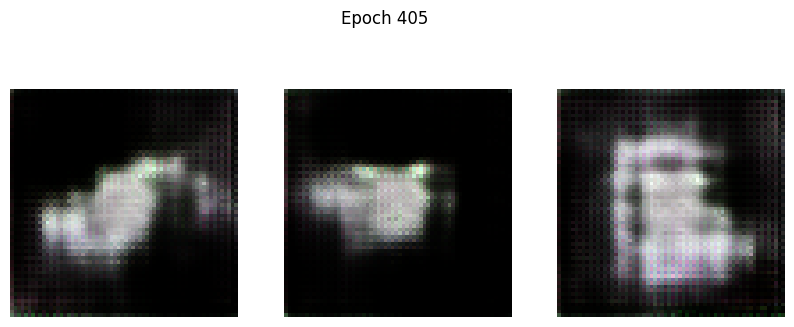

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 120ms/step - d_loss: 148.2302 - g_loss: 95.5024
Epoch 406/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 125.2815 - g_loss: 117.2557

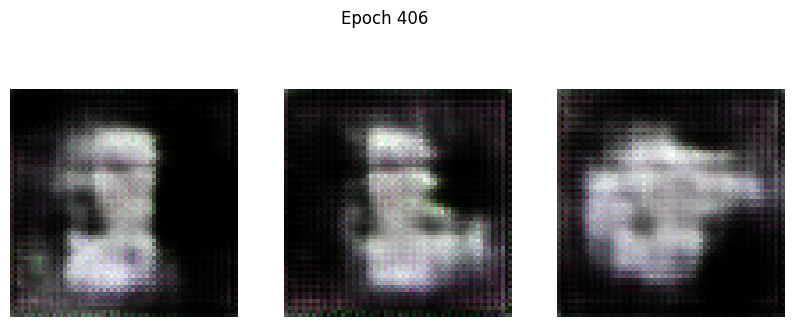

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 125.1512 - g_loss: 117.1622
Epoch 407/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 95.9949 - g_loss: 94.5317

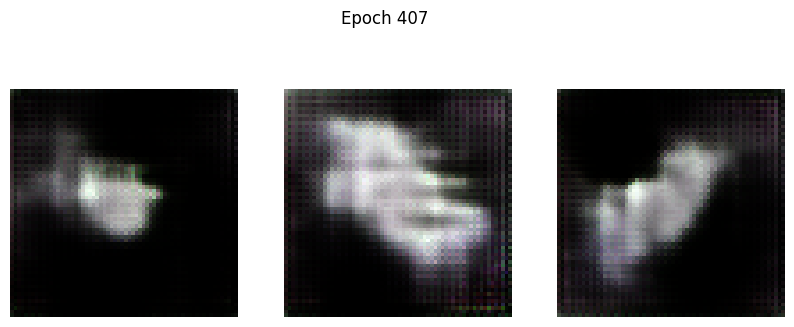

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 96.0289 - g_loss: 94.5799
Epoch 408/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 106.5088 - g_loss: 104.3700

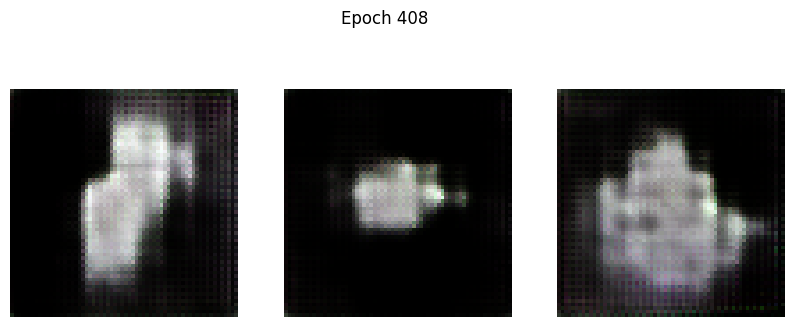

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 120ms/step - d_loss: 106.4606 - g_loss: 104.3270
Epoch 409/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 102.2037 - g_loss: 98.8281

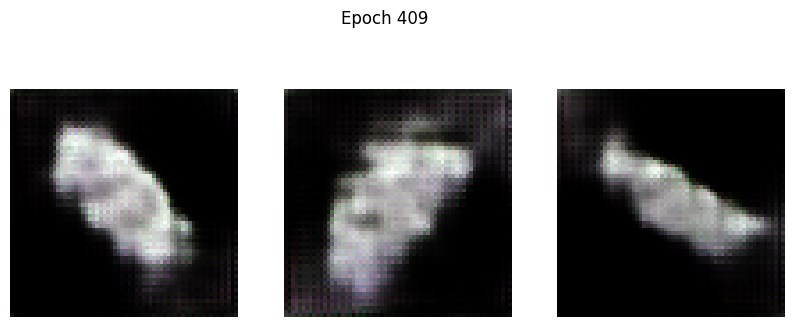

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 125ms/step - d_loss: 102.1465 - g_loss: 98.8359
Epoch 410/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 93.1282 - g_loss: 88.0188

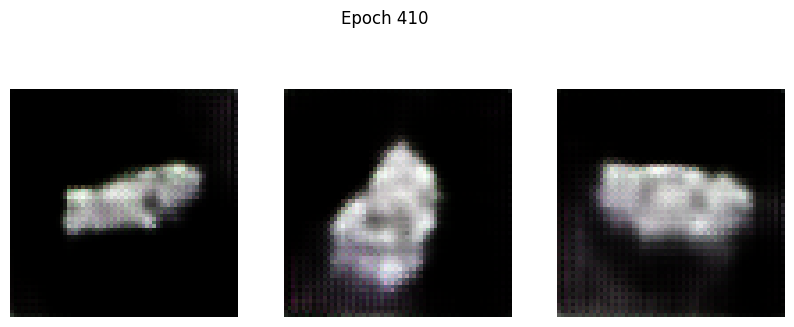

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 93.0610 - g_loss: 88.0002
Epoch 411/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 76.1953 - g_loss: 84.0822

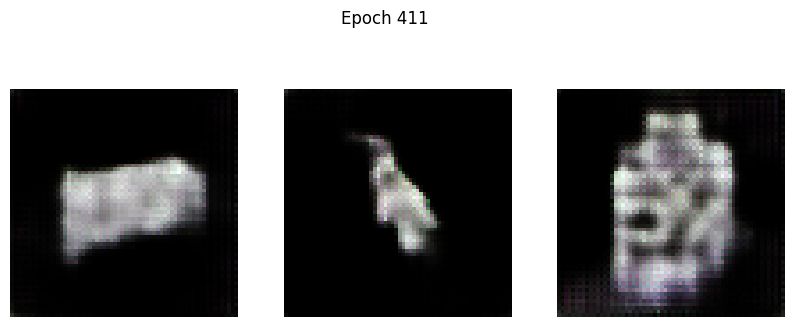

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 76.1611 - g_loss: 84.0311
Epoch 412/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 89.5623 - g_loss: 90.0979

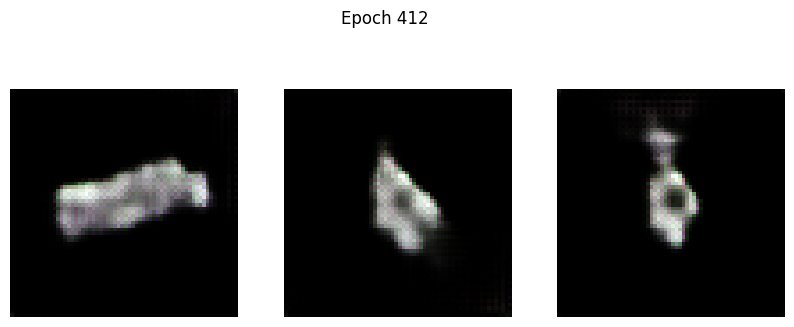

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 89.4944 - g_loss: 90.0291
Epoch 413/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 58.6792 - g_loss: 61.8394

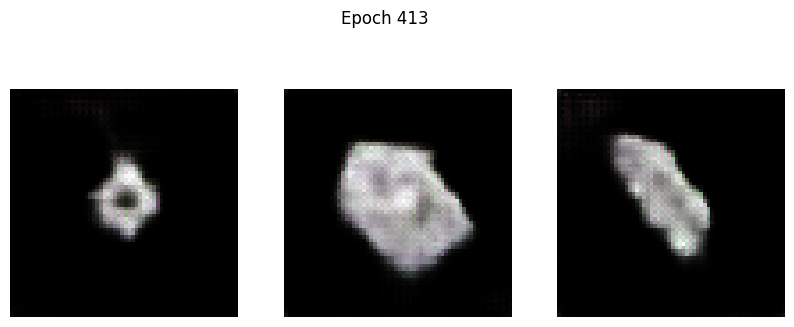

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 58.6603 - g_loss: 61.7741
Epoch 414/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 50.7195 - g_loss: 47.6440

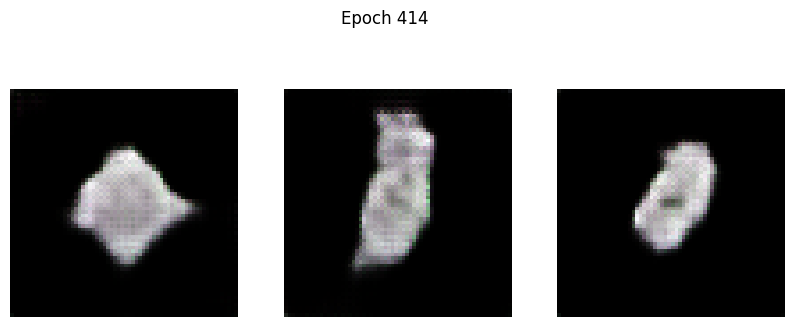

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 50.7700 - g_loss: 47.6901
Epoch 415/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 47.1088 - g_loss: 44.7042

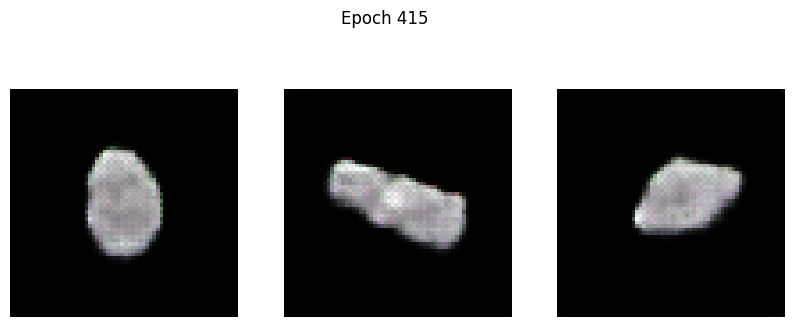

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 47.1258 - g_loss: 44.7138
Epoch 416/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 45.8601 - g_loss: 43.3038

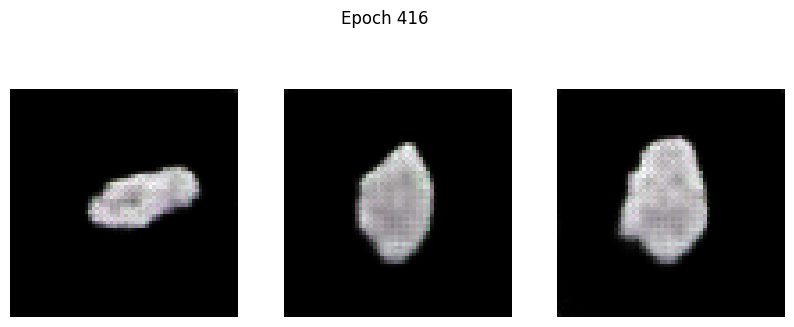

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 45.8727 - g_loss: 43.2927
Epoch 417/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 45.0214 - g_loss: 44.8616

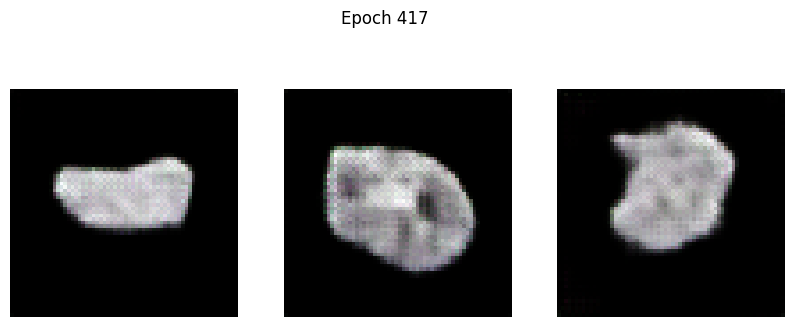

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 44.9960 - g_loss: 44.8849
Epoch 418/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 43.3510 - g_loss: 49.1166

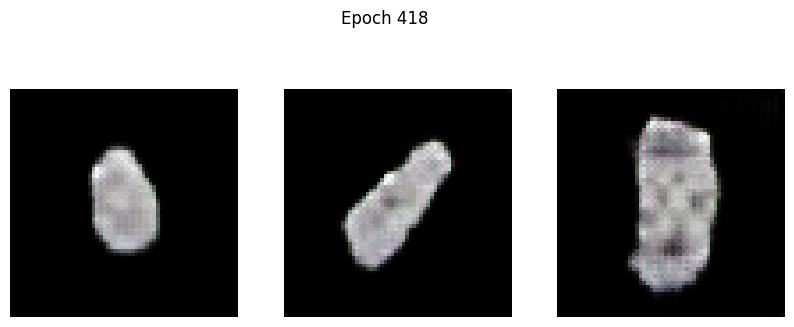

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 43.3436 - g_loss: 49.1061
Epoch 419/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 37.0371 - g_loss: 33.5609

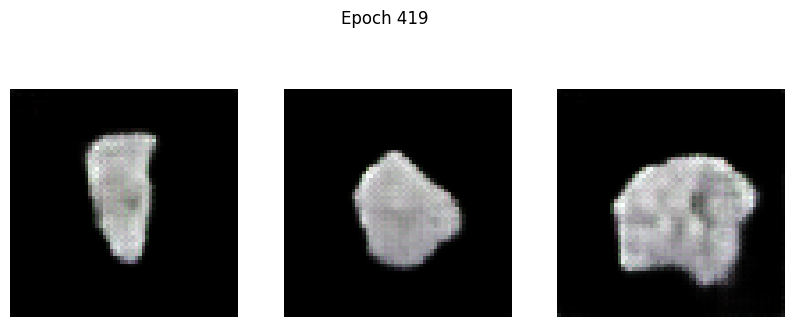

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 37.0499 - g_loss: 33.5603
Epoch 420/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 32.3407 - g_loss: 37.6360

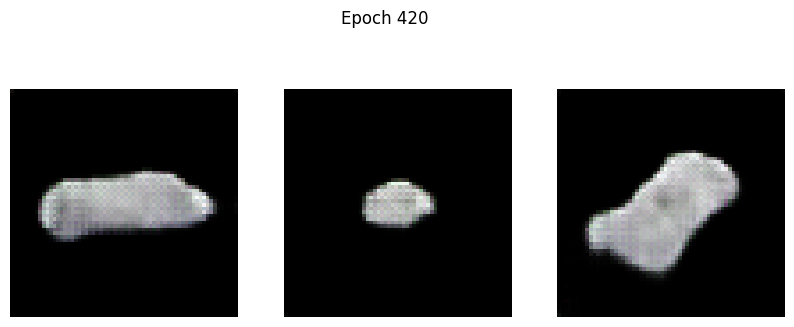

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 32.3613 - g_loss: 37.6174
Epoch 421/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 32.5051 - g_loss: 39.9925

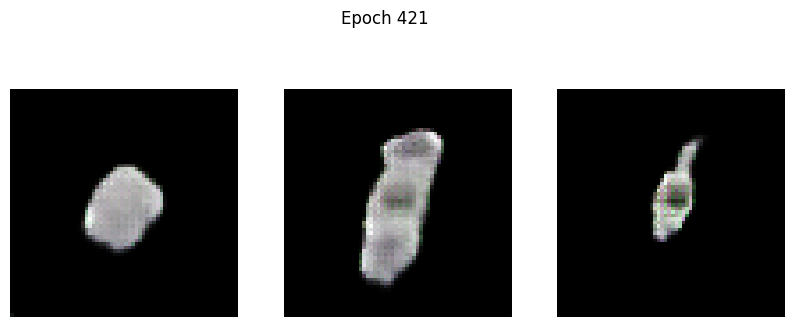

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 32.5486 - g_loss: 39.9850
Epoch 422/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 30.6824 - g_loss: 34.7545

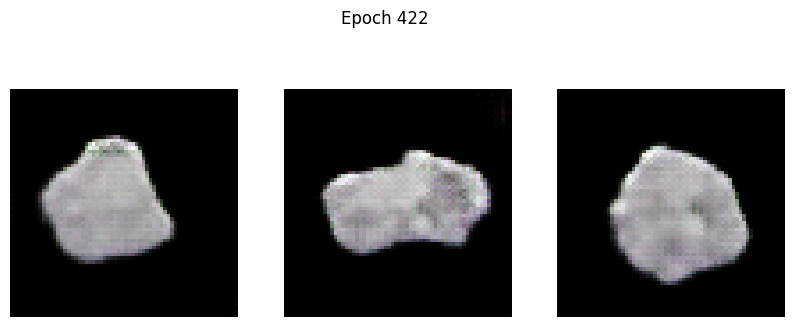

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 30.6972 - g_loss: 34.7652
Epoch 423/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 37.6632 - g_loss: 42.7354

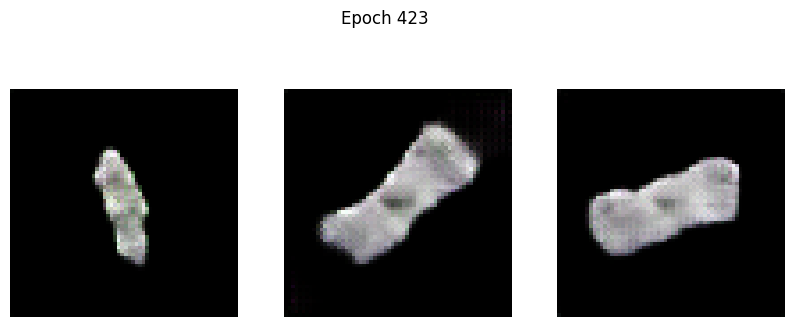

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 37.6921 - g_loss: 42.7419
Epoch 424/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 26.6676 - g_loss: 29.3607

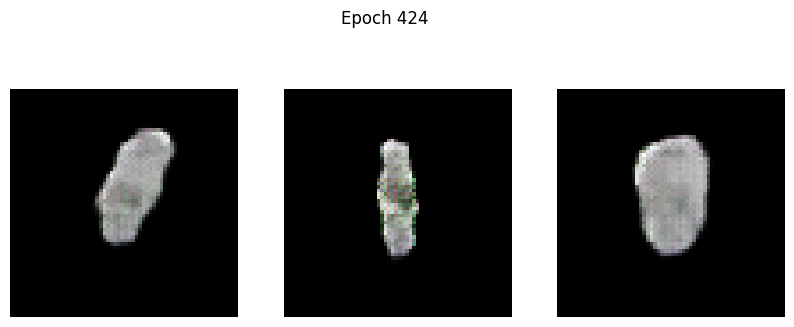

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 26.6570 - g_loss: 29.3605
Epoch 425/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 18.7652 - g_loss: 25.4232

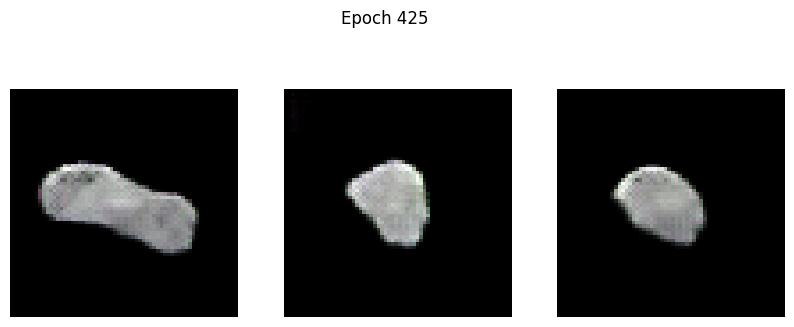

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 18.7396 - g_loss: 25.4306
Epoch 426/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 13.4117 - g_loss: 32.5395

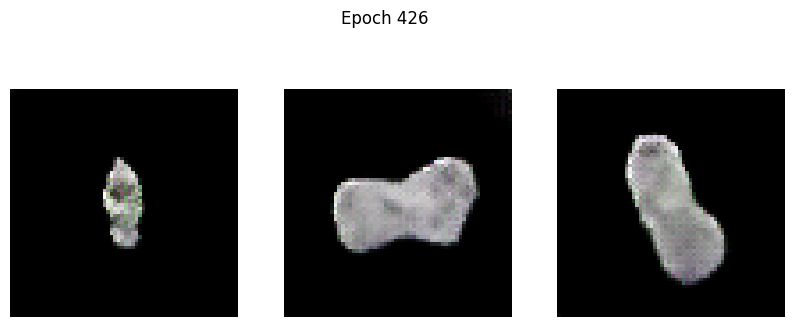

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 13.4347 - g_loss: 32.5019
Epoch 427/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 18.3107 - g_loss: 32.0241

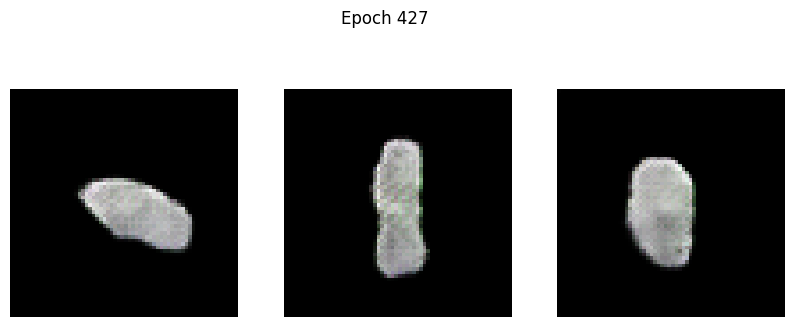

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 18.3151 - g_loss: 32.0279
Epoch 428/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 13.3100 - g_loss: 24.8792

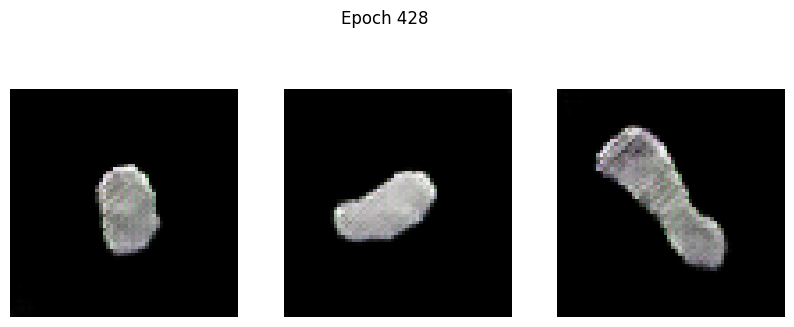

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 13.2825 - g_loss: 24.8916
Epoch 429/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 3.0549 - g_loss: 20.4362

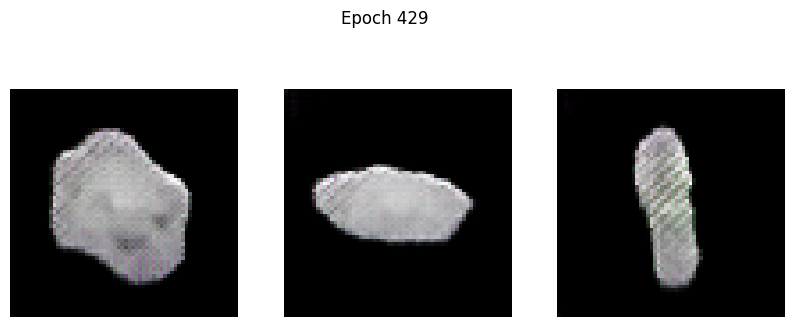

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 3.0471 - g_loss: 20.4602
Epoch 430/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 8.9211 - g_loss: 24.5899

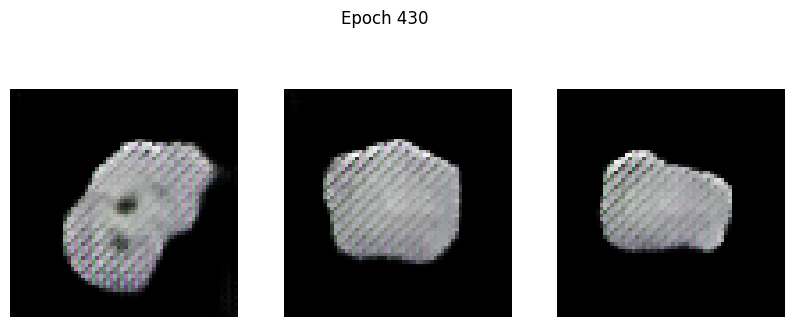

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 8.9627 - g_loss: 24.6166
Epoch 431/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -6.2568 - g_loss: 23.6793

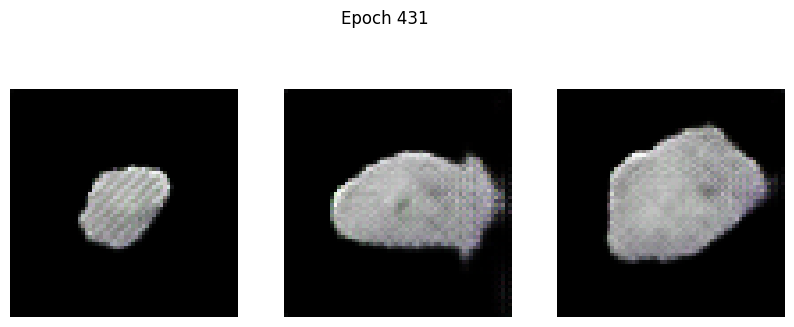

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -6.1765 - g_loss: 23.6564
Epoch 432/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 0.9260 - g_loss: 22.1993

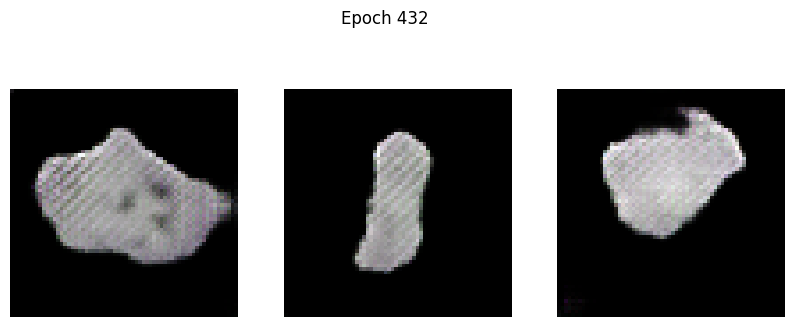

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.9187 - g_loss: 22.1819
Epoch 433/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.3876 - g_loss: 23.1144

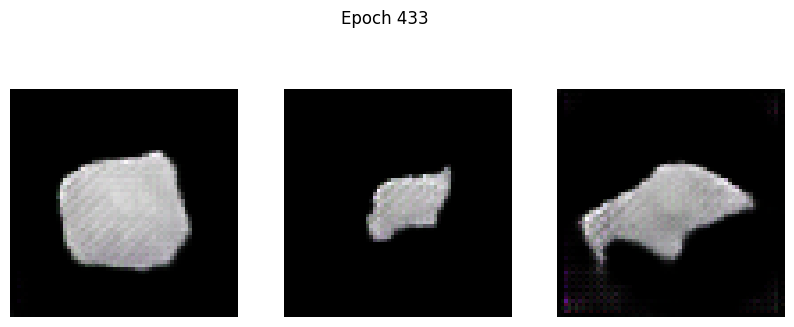

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -2.4071 - g_loss: 23.0971
Epoch 434/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -1.4379 - g_loss: 20.3861

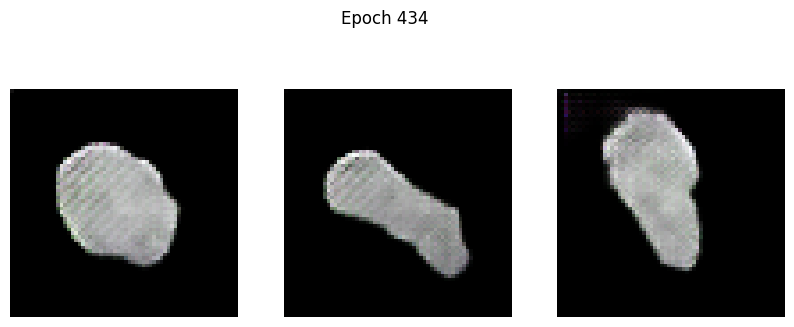

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -1.5023 - g_loss: 20.3841
Epoch 435/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -3.8848 - g_loss: 18.1261

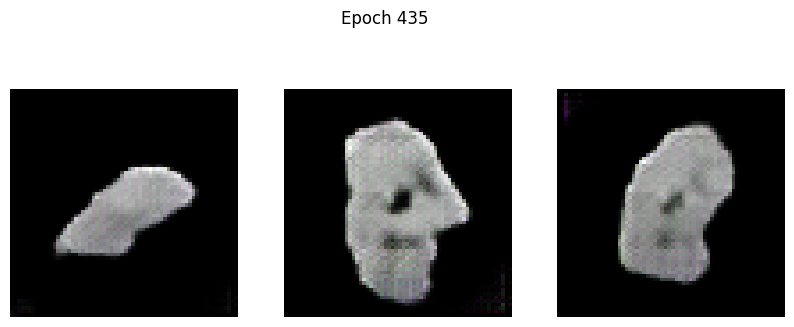

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -3.9205 - g_loss: 18.1173
Epoch 436/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -7.8805 - g_loss: 21.4951

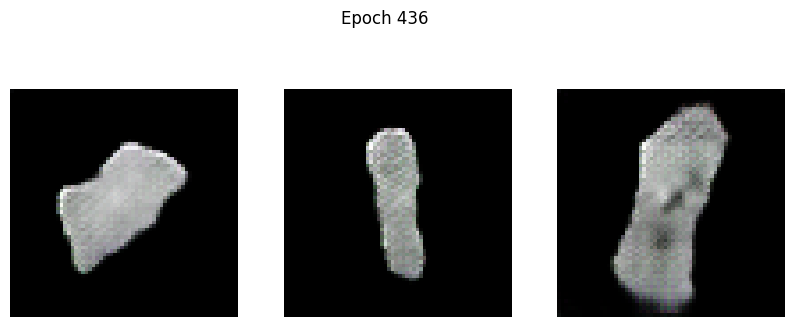

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -7.8759 - g_loss: 21.4713
Epoch 437/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -10.0192 - g_loss: 19.7409

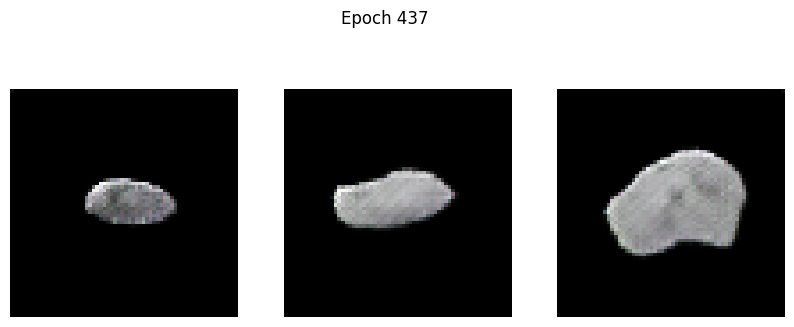

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -10.0593 - g_loss: 19.7339
Epoch 438/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -25.6722 - g_loss: 17.1325

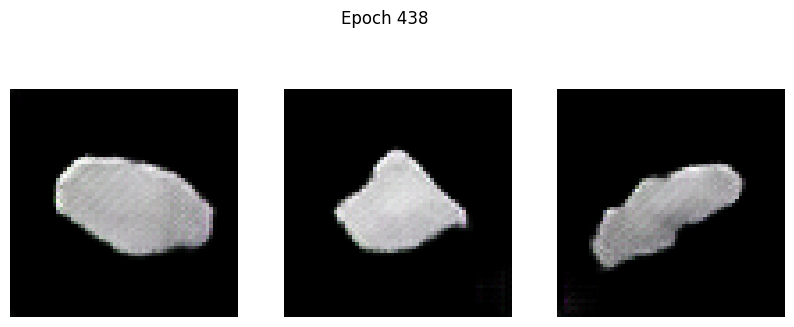

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -25.6016 - g_loss: 17.1341
Epoch 439/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -23.1619 - g_loss: 14.5230

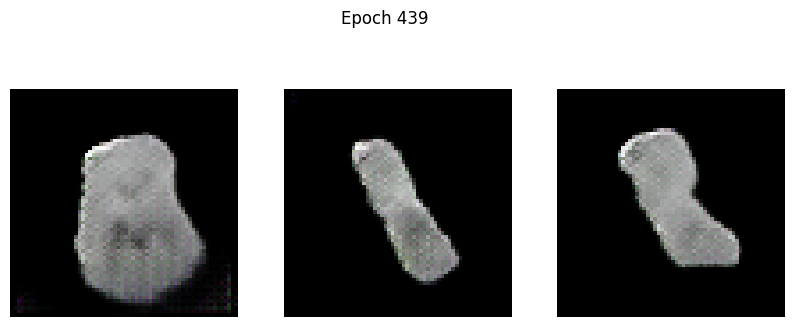

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -23.1594 - g_loss: 14.5366
Epoch 440/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -16.9365 - g_loss: 17.5860

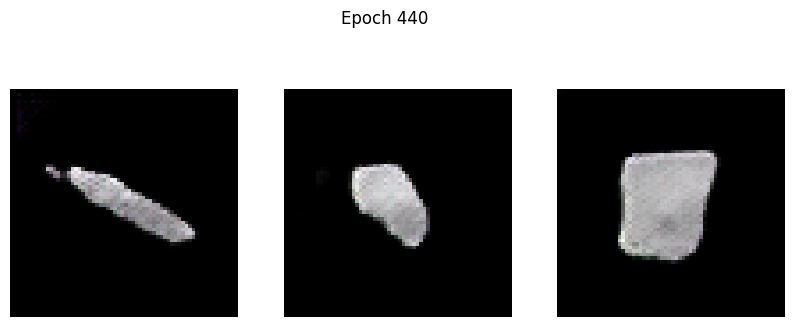

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -16.9669 - g_loss: 17.5789
Epoch 441/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -24.8447 - g_loss: 16.5085

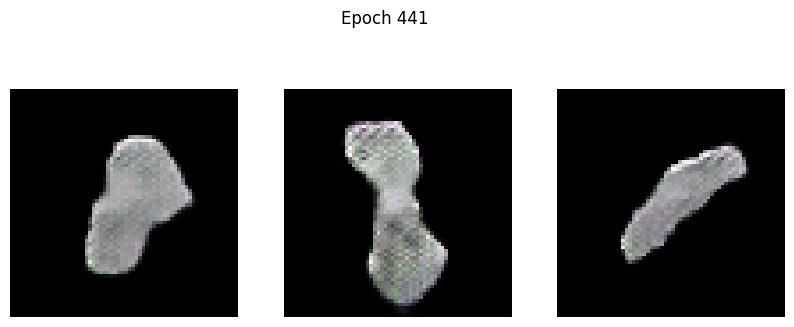

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -24.8158 - g_loss: 16.5035
Epoch 442/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -29.5695 - g_loss: 17.0563

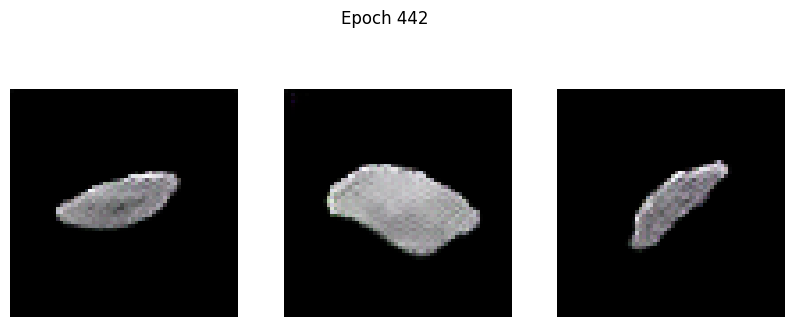

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -29.5544 - g_loss: 17.0583
Epoch 443/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -32.0790 - g_loss: 15.9105

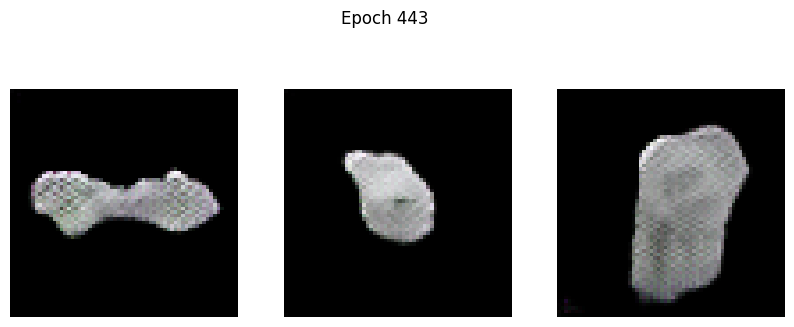

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - d_loss: -32.0135 - g_loss: 15.9201
Epoch 444/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -27.8546 - g_loss: 15.3691

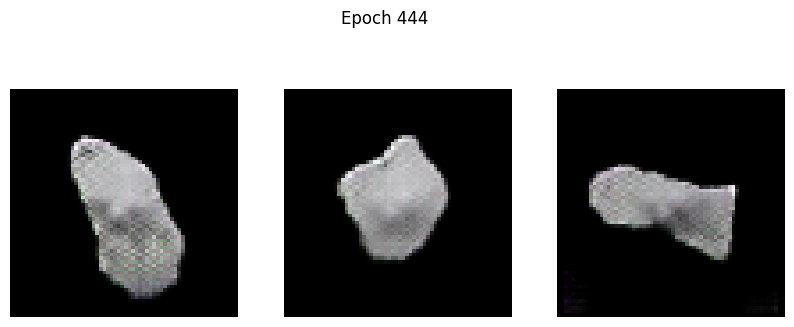

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -27.8636 - g_loss: 15.3752
Epoch 445/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -33.1859 - g_loss: 13.7547

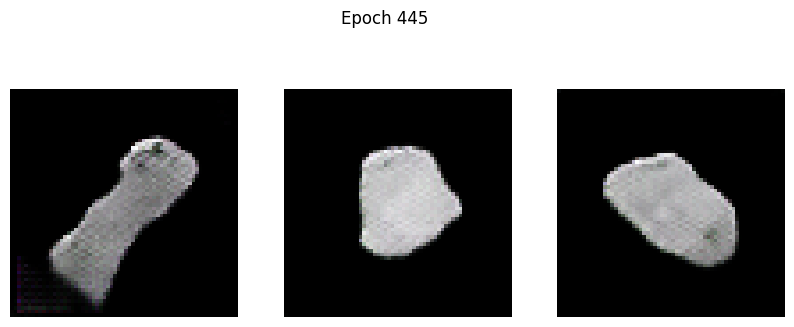

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: -33.1885 - g_loss: 13.7579
Epoch 446/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -49.1825 - g_loss: 15.1413

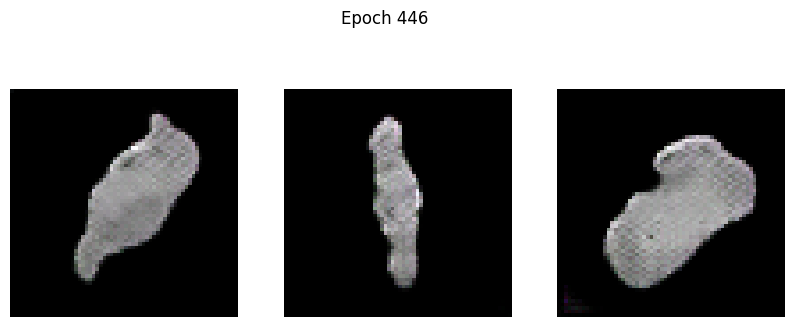

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -49.0630 - g_loss: 15.1387
Epoch 447/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -36.9181 - g_loss: 12.7814

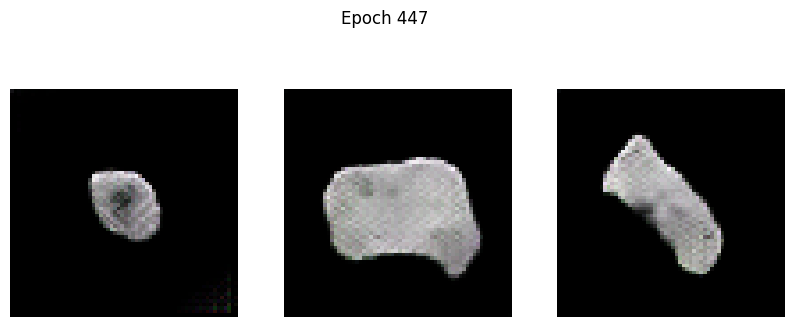

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -36.9689 - g_loss: 12.7873
Epoch 448/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -33.0370 - g_loss: 13.8035

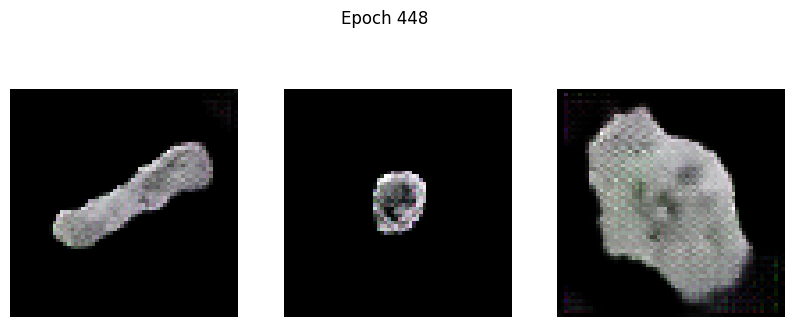

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -33.1047 - g_loss: 13.7958
Epoch 449/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -42.2360 - g_loss: 12.1290

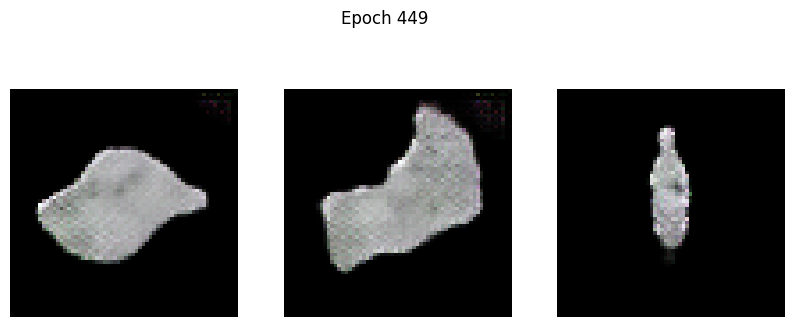

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -42.2596 - g_loss: 12.1339
Epoch 450/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -36.1899 - g_loss: 10.8305

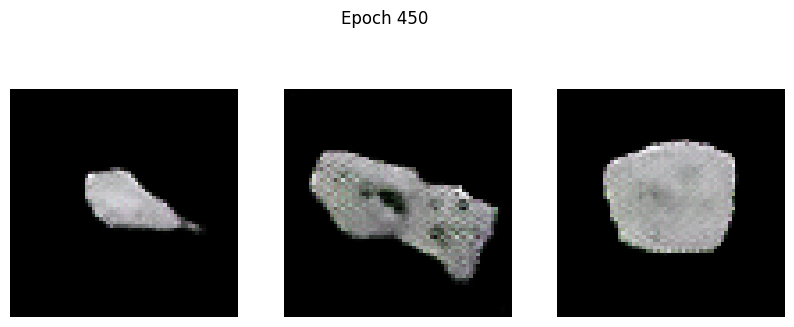

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -36.2373 - g_loss: 10.8335
Epoch 451/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -48.8815 - g_loss: 10.8952

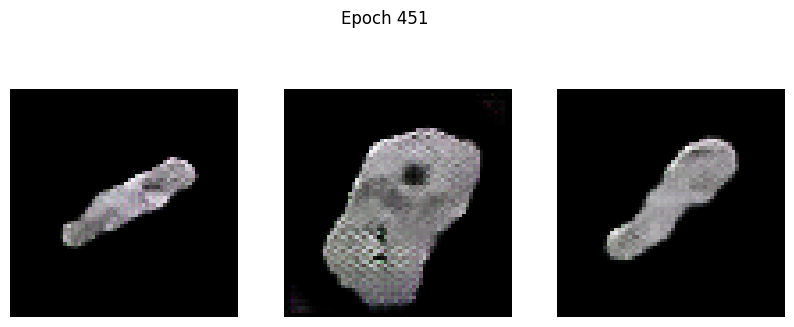

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -48.8424 - g_loss: 10.8997
Epoch 452/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -50.1758 - g_loss: 11.4944

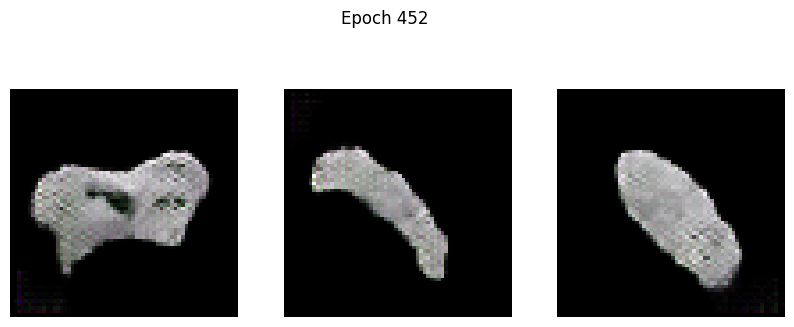

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -50.1933 - g_loss: 11.4897
Epoch 453/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -45.4744 - g_loss: 10.5549

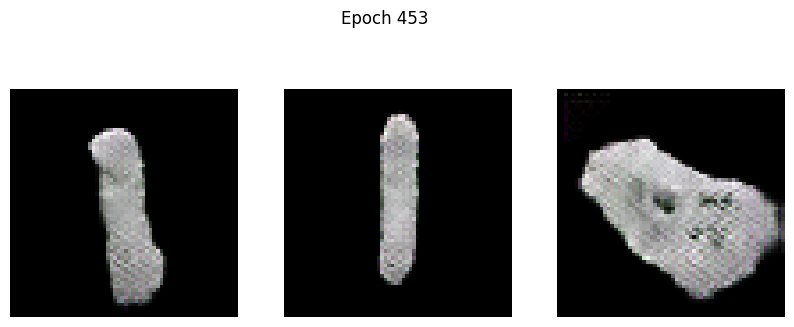

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -45.5101 - g_loss: 10.5520
Epoch 454/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -59.7801 - g_loss: 11.0645

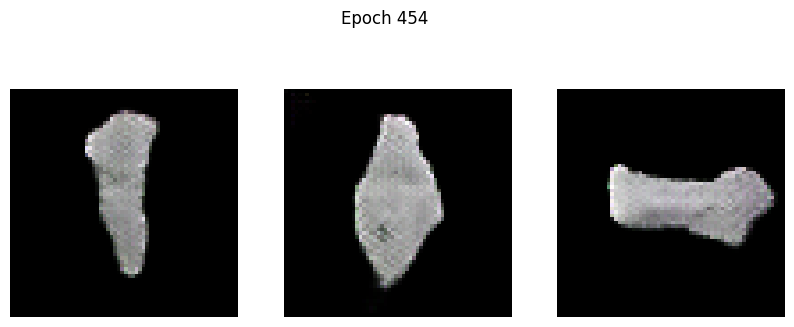

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -59.7649 - g_loss: 11.0566
Epoch 455/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -57.8347 - g_loss: 9.7773

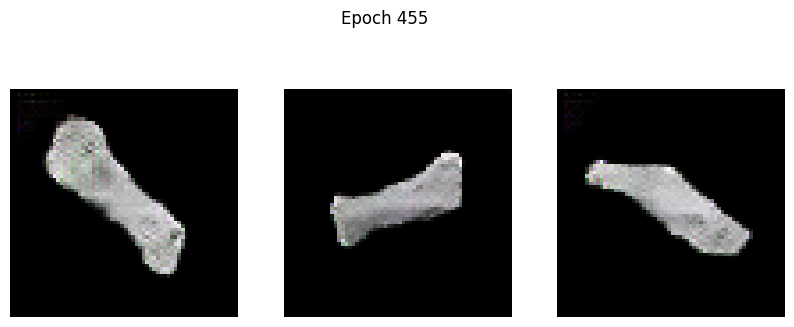

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -57.8718 - g_loss: 9.7752
Epoch 456/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -54.9080 - g_loss: 8.6244

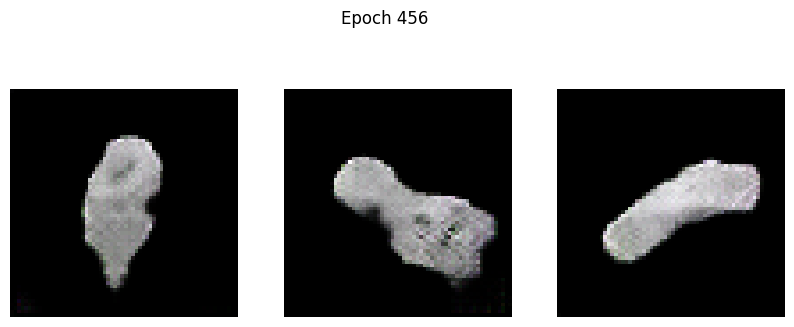

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -54.9498 - g_loss: 8.6255
Epoch 457/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -72.9767 - g_loss: 8.1296

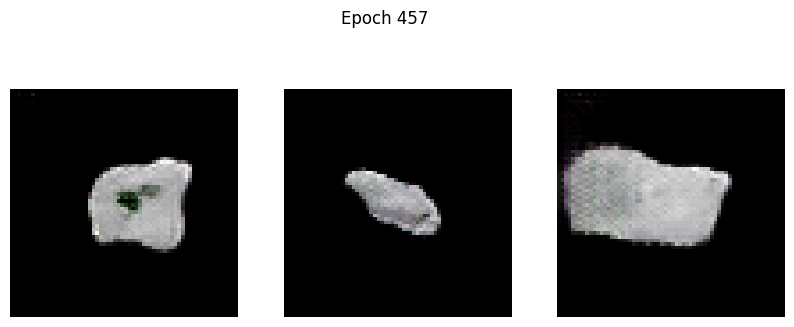

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -72.9692 - g_loss: 8.1340
Epoch 458/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -79.8394 - g_loss: 8.6233

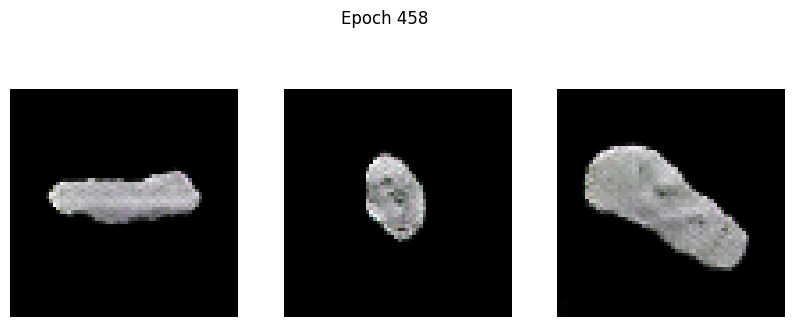

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -79.7486 - g_loss: 8.6220
Epoch 459/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -95.7744 - g_loss: 7.6178

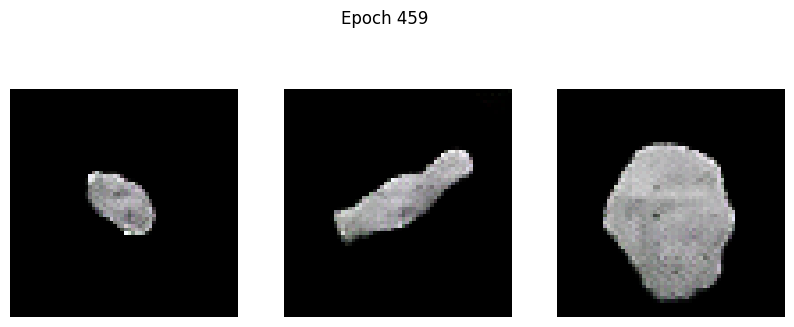

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -95.6224 - g_loss: 7.6194
Epoch 460/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -63.7325 - g_loss: 12.9630

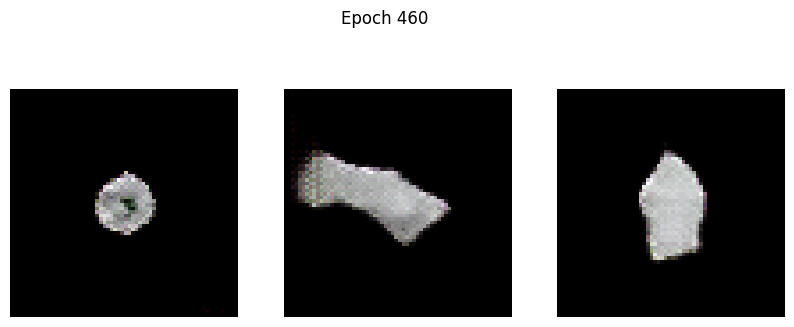

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -63.4322 - g_loss: 13.0684
Epoch 461/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -51.2919 - g_loss: 17.4301

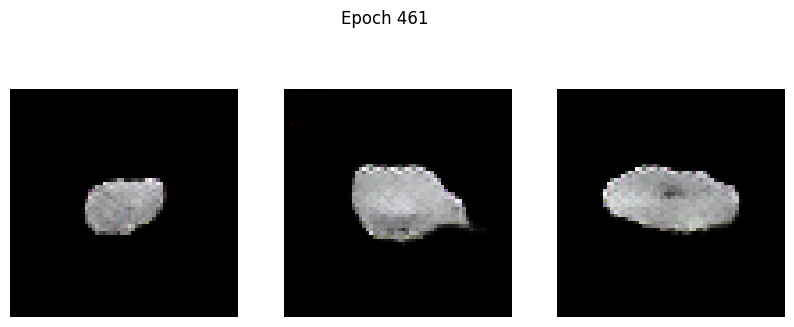

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -51.4883 - g_loss: 17.4063
Epoch 462/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -79.3316 - g_loss: 9.6960

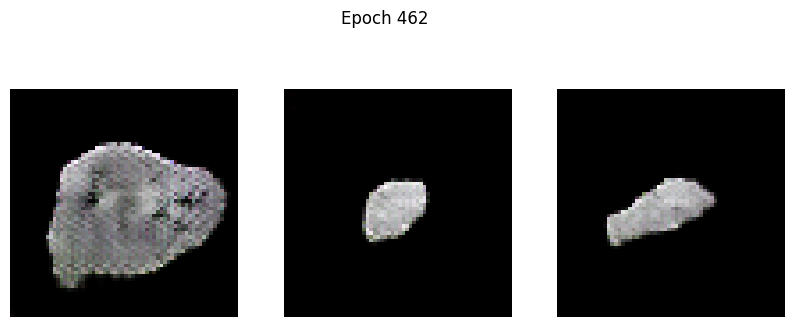

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -79.3871 - g_loss: 9.6934
Epoch 463/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -79.6661 - g_loss: 7.9261

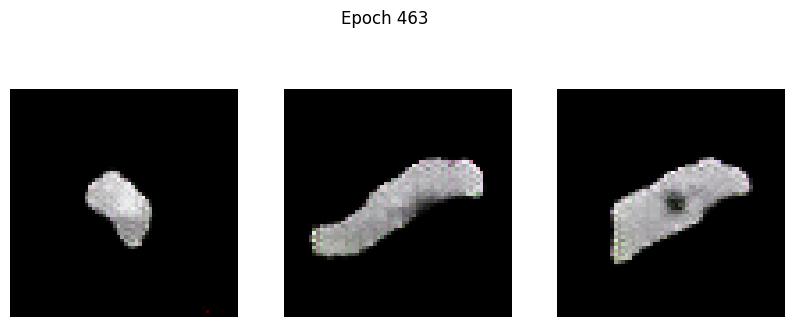

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -79.7182 - g_loss: 7.9267
Epoch 464/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 4397.4316 - g_loss: 628.8077

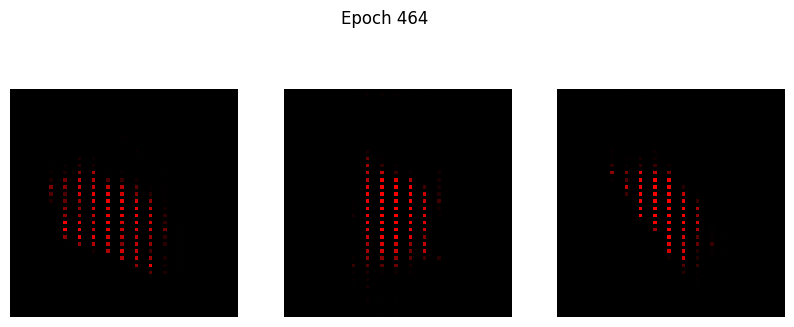

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 4403.7983 - g_loss: 633.8097
Epoch 465/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 20.8986 - g_loss: 838.8519

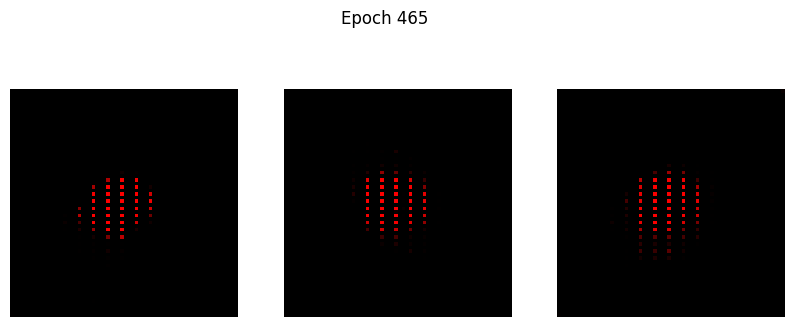

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 20.9038 - g_loss: 840.6989
Epoch 466/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 20.8777 - g_loss: 725.3201

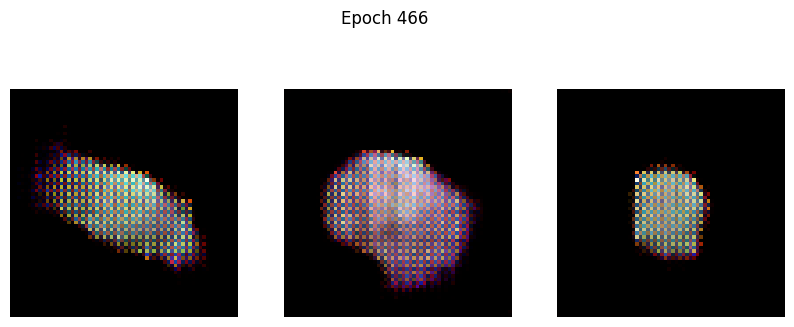

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 21.7901 - g_loss: 722.7260
Epoch 467/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 266.2138 - g_loss: 144.5296

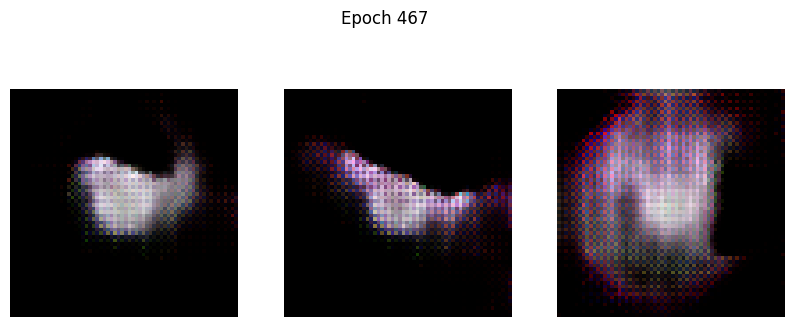

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 266.0515 - g_loss: 144.5979
Epoch 468/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 218.6373 - g_loss: 115.7436

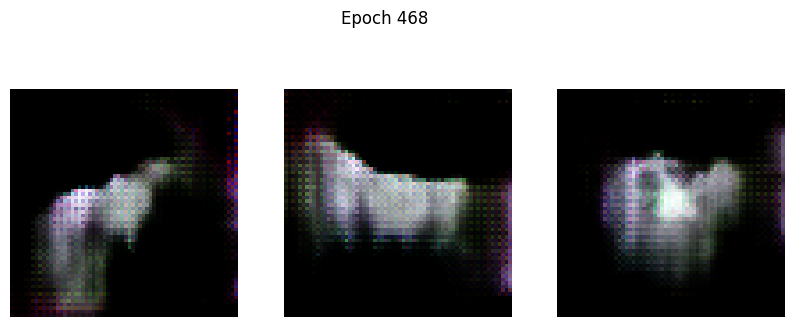

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 218.2043 - g_loss: 115.7126
Epoch 469/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 150.9739 - g_loss: 104.1393

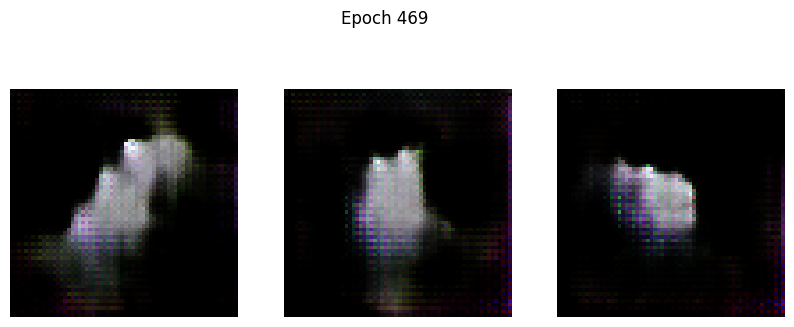

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 150.8817 - g_loss: 104.1319
Epoch 470/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 130.6702 - g_loss: 101.4842

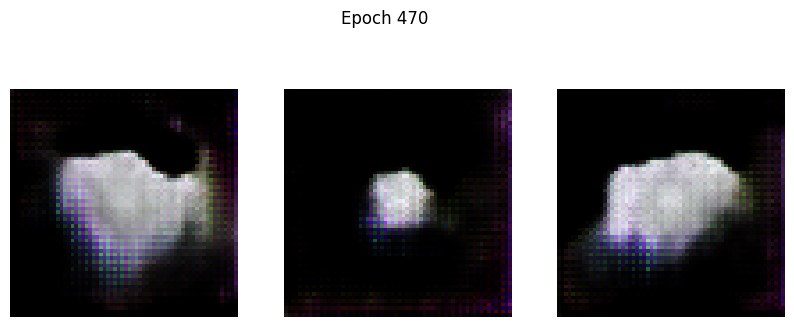

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 130.4270 - g_loss: 101.3788
Epoch 471/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 62.1968 - g_loss: 92.8975

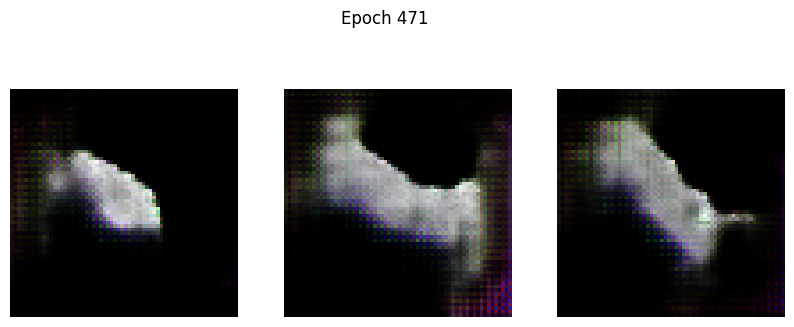

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 126ms/step - d_loss: 62.2770 - g_loss: 92.8074
Epoch 472/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 61.3397 - g_loss: 68.1746

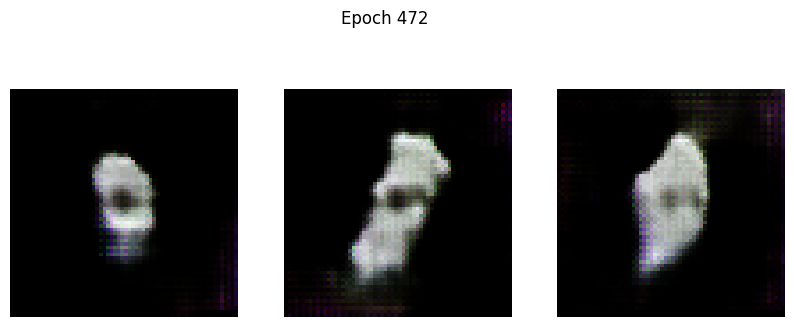

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 61.3088 - g_loss: 68.1905
Epoch 473/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 41.1693 - g_loss: 60.0803

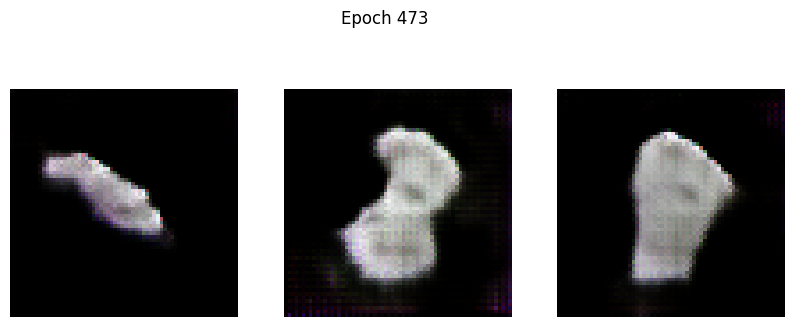

102/102 ━━━━━━━━━━━━━━━━━━━━ 20s 121ms/step - d_loss: 41.1759 - g_loss: 60.0931
Epoch 474/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 57.6381 - g_loss: 66.2203

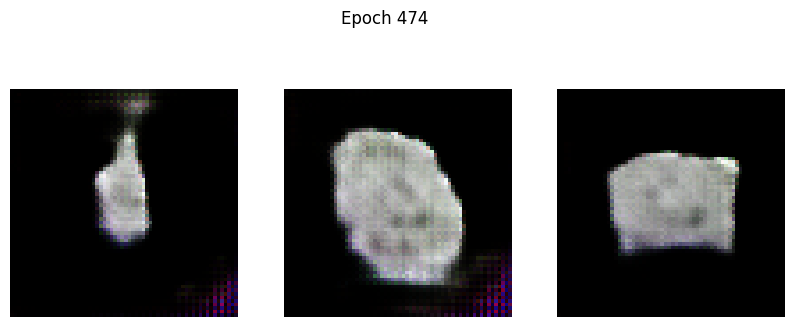

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 123ms/step - d_loss: 57.4929 - g_loss: 66.1469
Epoch 475/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 38.6910 - g_loss: 61.2936

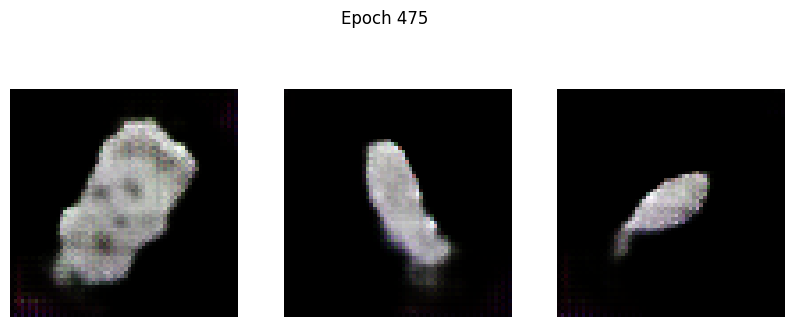

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 38.6247 - g_loss: 61.2121
Epoch 476/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 22.0766 - g_loss: 35.3199

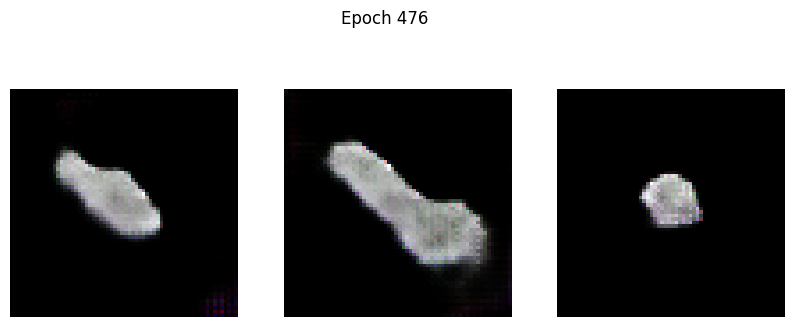

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 22.0622 - g_loss: 35.3532
Epoch 477/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 26.1076 - g_loss: 49.2779

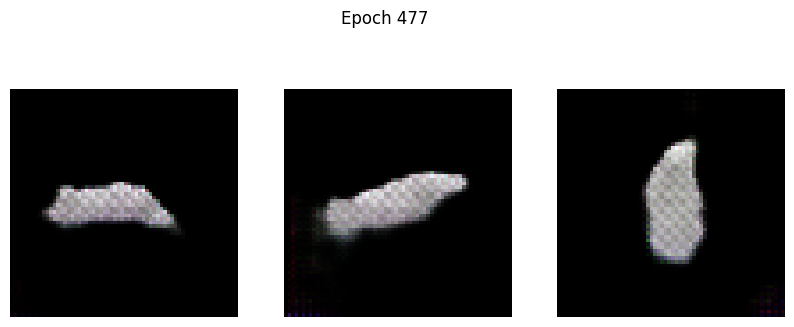

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 26.0023 - g_loss: 49.1708
Epoch 478/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step - d_loss: 15.2437 - g_loss: 30.5061

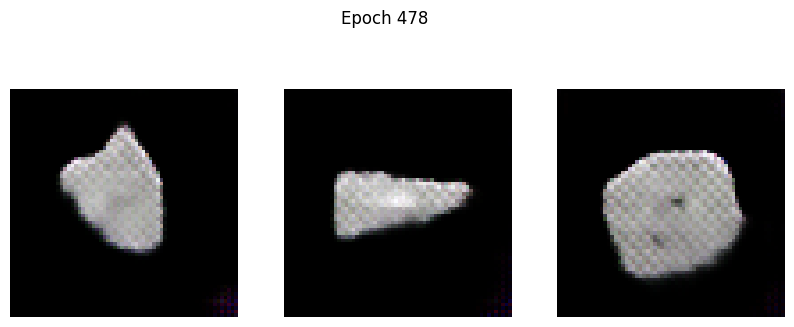

102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 120ms/step - d_loss: 15.2325 - g_loss: 30.5609
Epoch 479/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 9.5183 - g_loss: 25.1951

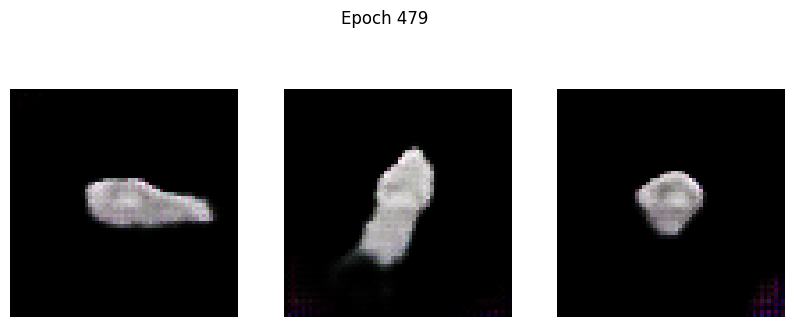

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 9.5027 - g_loss: 25.2260
Epoch 480/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: 5.6022 - g_loss: 26.3073

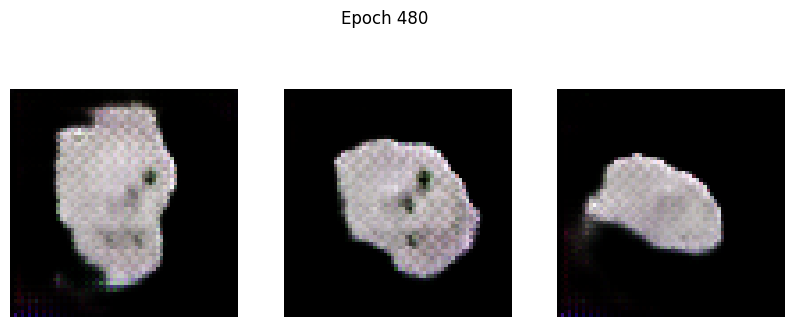

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: 5.5959 - g_loss: 26.3102
Epoch 481/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: 0.6305 - g_loss: 24.3454

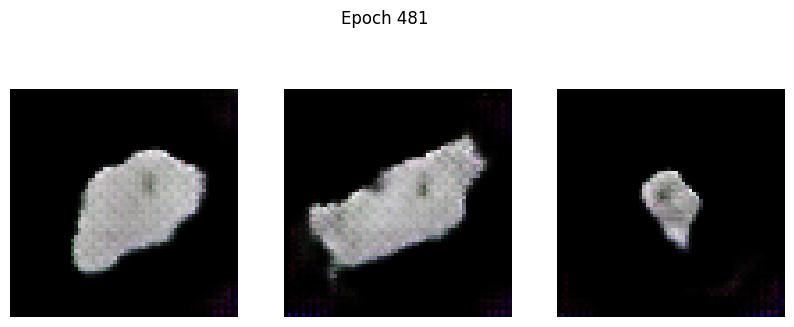

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: 0.6047 - g_loss: 24.3582
Epoch 482/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: 2.7865 - g_loss: 32.5938

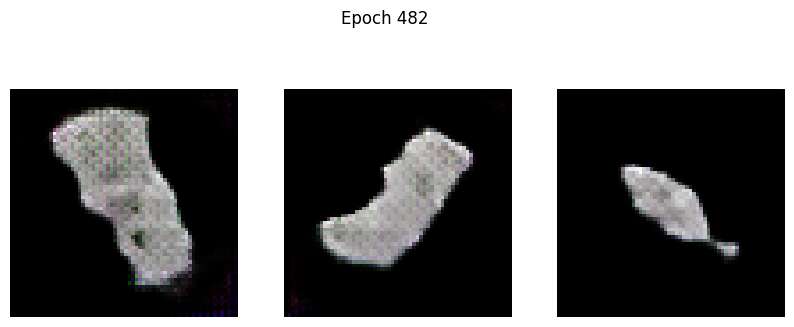

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: 2.7106 - g_loss: 32.5216
Epoch 483/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -17.1032 - g_loss: 20.3722

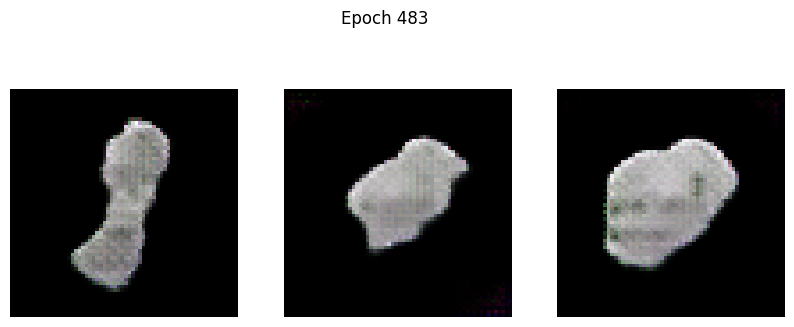

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -17.0895 - g_loss: 20.3720
Epoch 484/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -16.0867 - g_loss: 20.0054

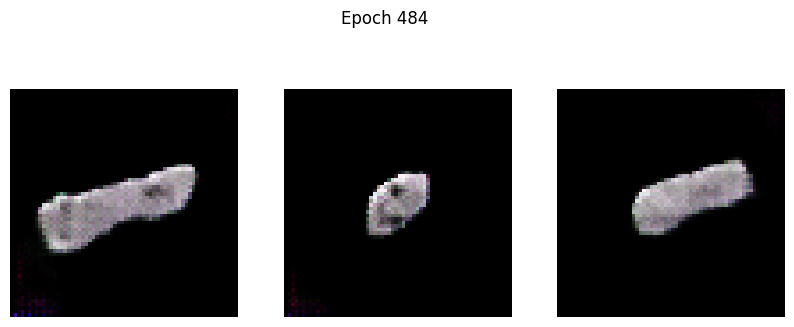

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -16.0717 - g_loss: 20.0220
Epoch 485/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -2.1529 - g_loss: 20.5804

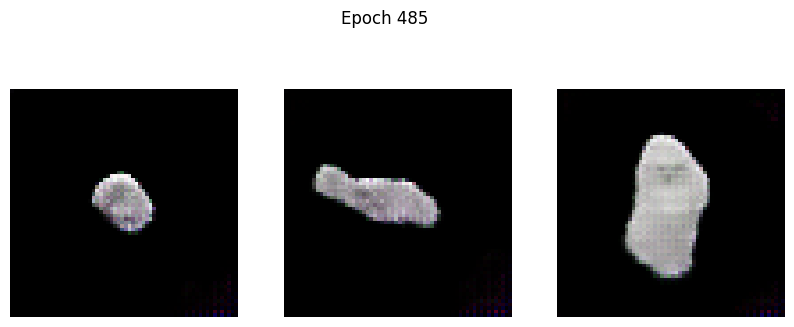

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -2.2353 - g_loss: 20.5825
Epoch 486/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -18.5561 - g_loss: 16.2692

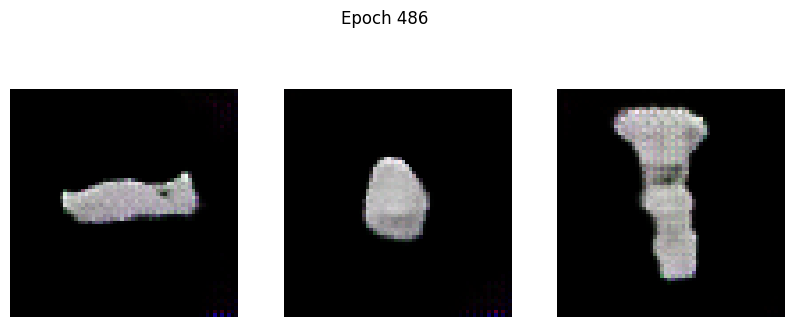

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -18.5649 - g_loss: 16.2804
Epoch 487/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -18.3287 - g_loss: 15.1593

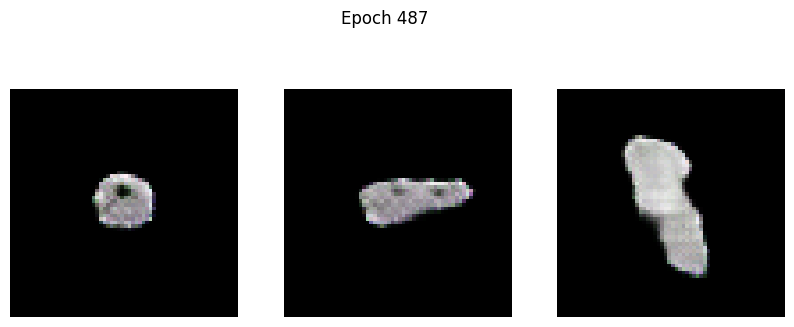

102/102 ━━━━━━━━━━━━━━━━━━━━ 21s 121ms/step - d_loss: -18.3473 - g_loss: 15.1693
Epoch 488/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 122ms/step - d_loss: -27.6353 - g_loss: 16.4914

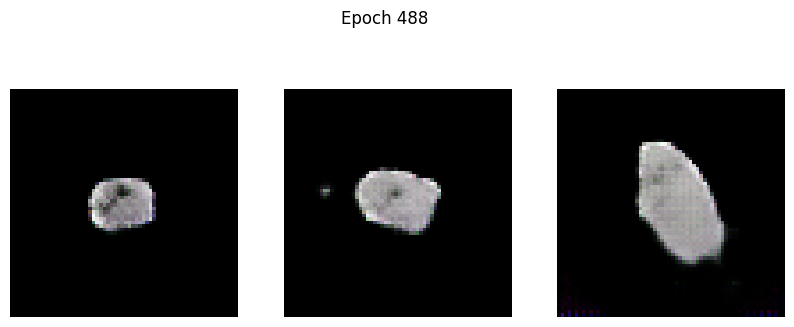

102/102 ━━━━━━━━━━━━━━━━━━━━ 13s 123ms/step - d_loss: -27.6287 - g_loss: 16.4905
Epoch 489/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -31.7178 - g_loss: 15.4985

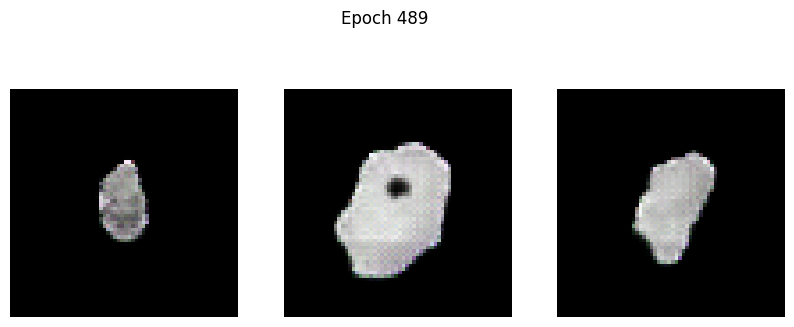

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -31.6783 - g_loss: 15.4990
Epoch 490/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -35.5619 - g_loss: 15.0141

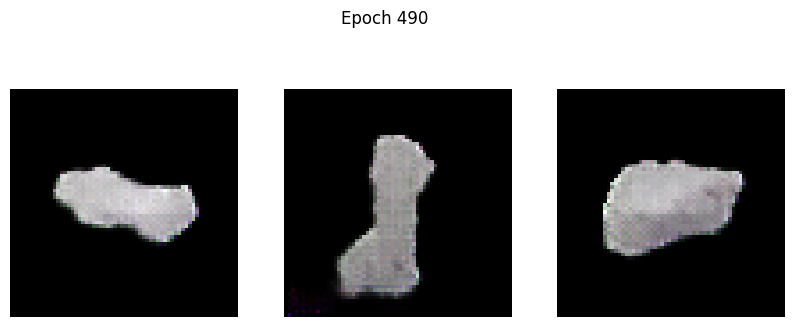

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -35.4675 - g_loss: 15.0138
Epoch 491/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -26.0476 - g_loss: 13.5574

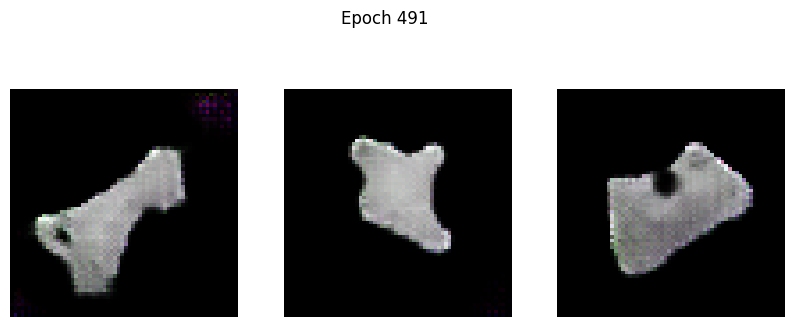

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -26.0358 - g_loss: 13.5574
Epoch 492/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -28.3002 - g_loss: 13.7999

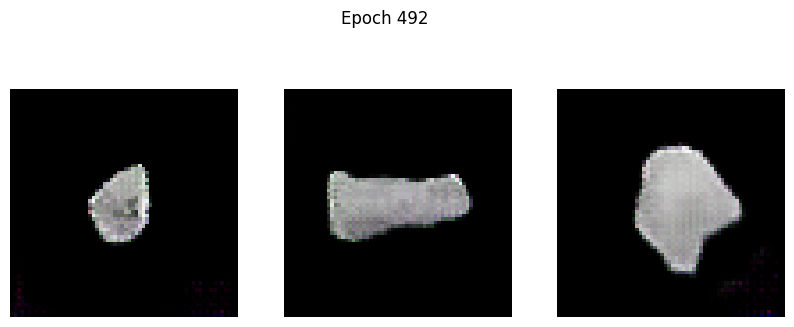

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -28.3128 - g_loss: 13.8012
Epoch 493/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -28.2985 - g_loss: 13.6835

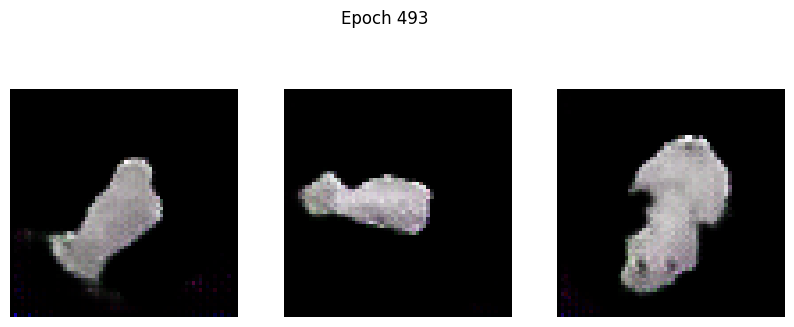

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -28.3342 - g_loss: 13.6804
Epoch 494/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -35.1585 - g_loss: 13.6701

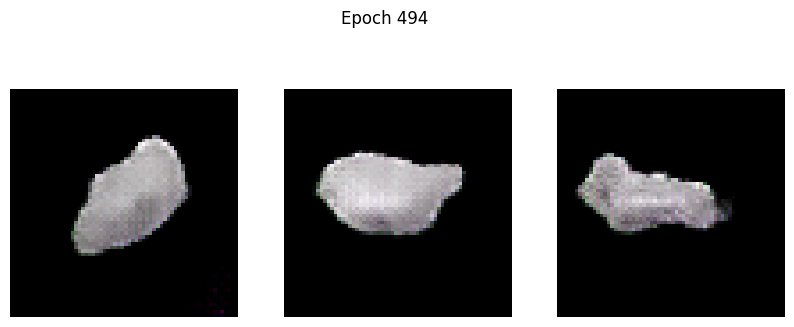

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -35.1997 - g_loss: 13.6634
Epoch 495/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.1211 - g_loss: 13.2357

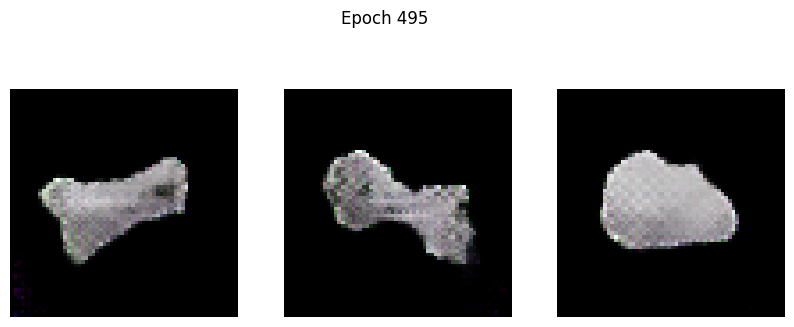

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -37.1185 - g_loss: 13.2295
Epoch 496/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -31.6147 - g_loss: 10.8315

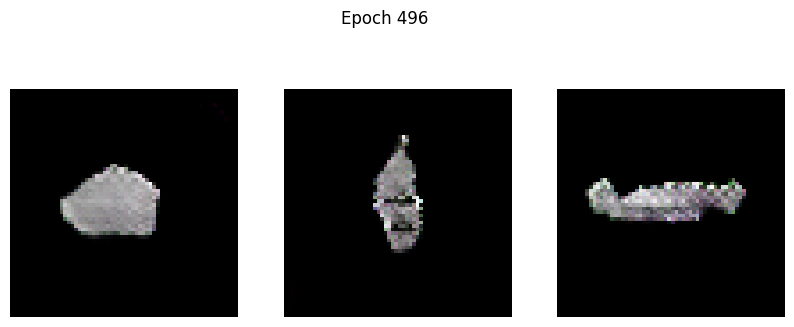

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -31.6956 - g_loss: 10.8387
Epoch 497/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -36.1217 - g_loss: 12.0615

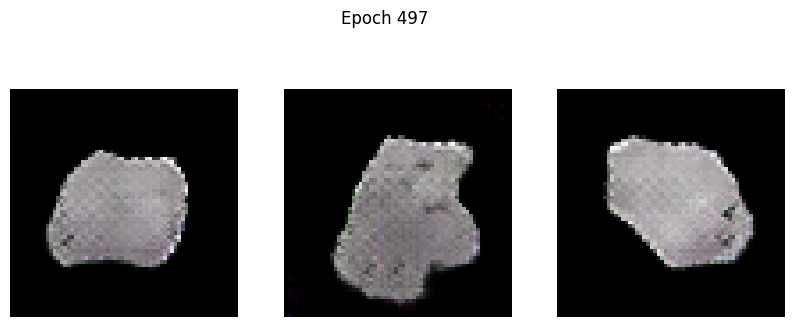

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -36.1645 - g_loss: 12.0579
Epoch 498/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.0983 - g_loss: 10.7993

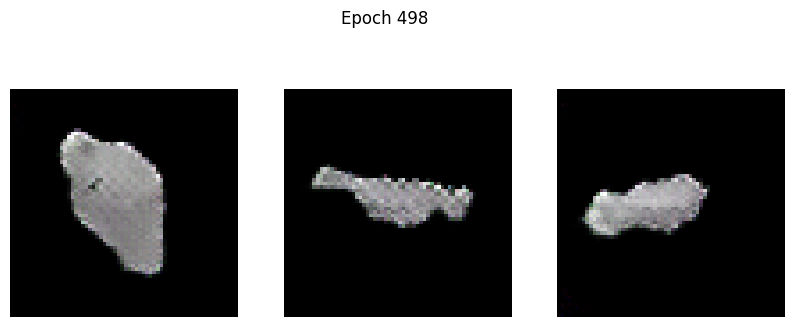

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -37.1596 - g_loss: 10.7983
Epoch 499/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step - d_loss: -37.3938 - g_loss: 11.4356

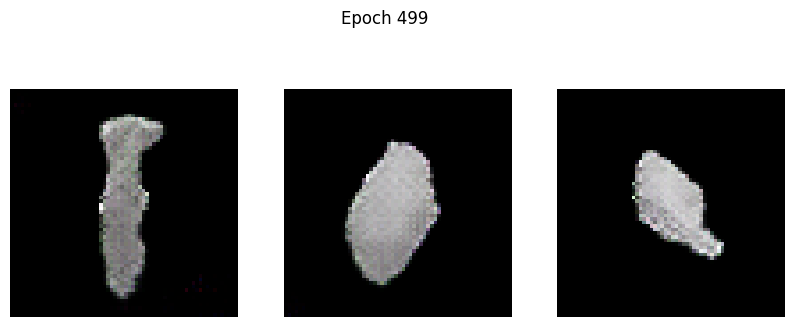

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 122ms/step - d_loss: -37.4448 - g_loss: 11.4343
Epoch 500/500
102/102 ━━━━━━━━━━━━━━━━━━━━ 0s 120ms/step - d_loss: -45.8981 - g_loss: 10.7746

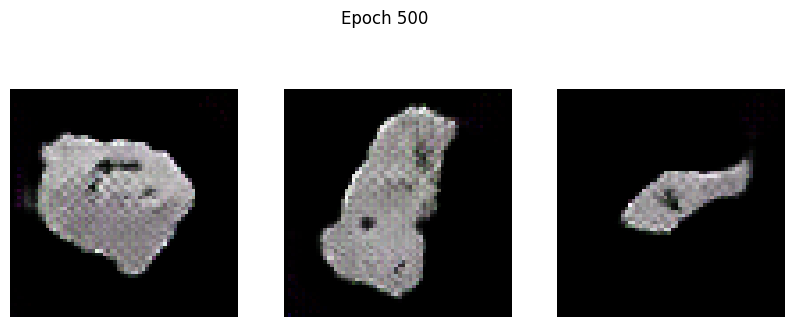

102/102 ━━━━━━━━━━━━━━━━━━━━ 12s 121ms/step - d_loss: -45.8481 - g_loss: 10.7720


In [9]:
# Hyperparameters
EPOCHS = 500  # Tambahkan jumlah epoch untuk hasil lebih baik (misal: 100-200)
lr_generator = 0.0002
lr_discriminator = 0.0002

# Inisialisasi DCGAN
dcgan = DCGAN(discriminator=discriminator, generator=generator, latent_dim=latent_dim)

# Compile
dcgan.compile(
    d_optimizer=keras.optimizers.Adam(learning_rate=lr_discriminator, beta_1=0.5),
    g_optimizer=keras.optimizers.Adam(learning_rate=lr_generator, beta_1=0.5),
    loss_fn=keras.losses.BinaryCrossentropy(from_logits=True),
)

# Jalankan Training
print("Mulai Training...")
dcgan.fit(
    train_dataset,
    epochs=EPOCHS,
    callbacks=[GANMonitor(num_img=3, latent_dim=latent_dim)]
)